# Network Buffer for Portland, Oregon

# Import the library

# Follow the below link to install Geopanda


#https://medium.com/analytics-vidhya/fastest-way-to-install-geopandas-in-jupyter-notebook-on-windows-8f734e11fa2b

In [1]:
import time
start = time.time()
# First Run all these in command prompt cell to use geopanda
#conda create -n geo_env
#conda activate geo_env
#conda config --env --add channels conda-forge
#conda config --env --set channel_priority strict
#conda install python=3 geopandas

In [2]:
#conda activate geo_env


In [3]:
#python -m ipykernel install --user --name geo_env

In [4]:
import geopandas as gpd

In [5]:
import pandas as pd
from functools import reduce

In [6]:
import sys
'geopandas' in sys.modules

True

In [7]:
#!pip3 install matplotlib
import matplotlib.pyplot as plt

In [8]:
import geopandas as gpd
from geopandas import GeoDataFrame
from shapely.geometry import Point
import matplotlib.pyplot as plt
import io
import pandas as pd
import networkx as nx
import osmnx as ox

# All inputs

# Inputr your Euclidean Buffer size or your GIS Customize buffer file Here

In [9]:
#buffer size in meter
#size=804.672 #in m, this input is also required for area conversation

In [10]:
# Import streetlight and strava
ss=pd.read_csv("F:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Portland/Bike Fusion/all-aadbt-final-all.csv")
ss=ss[ss["region"]=="Portland"]
ss=ss[ss["year"]==2019]
ss=ss.drop_duplicates(subset='site_id')
ss.head()

,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,latitude,longitude,comment
517,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,45.513830,-122.672840,NaN
518,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,45.513187,-122.671210,NaN
519,P003POR,"SW MOODY AVE, WEST SIDE CYCLE TRACK",permanent,2019,Portland,1.0,1346.261310,98.109589,59.917808,5466.0,45.501340,-122.671970,NaN
520,P004POR,STEEL BR lower deck,permanent,2019,Portland,1.0,1951.052146,128.041096,84.410959,17323.0,45.527835,-122.668311,NaN
521,P005POR,BROADWAY BR north side,permanent,2019,Portland,1.0,1182.406584,120.712329,82.164384,8077.0,45.532870,-122.672270,NaN


In [11]:
# Get the count location 
c1=pd.read_csv("F:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Portland/Bike Fusion/sites_all_study_area.csv")
c1=c1[c1["region"]=="Portland"]
c1=c1[c1["in_2019"]==1]
c1=c1[['site_id','osm_id_sensor']]
#c1=c1[c1["sensor_type"]=="permanent"]
c1.head(5)
# #print(c1.shape)

,site_id,osm_id_sensor
0,P001POR,681301893.0
1,P002POR,689032191.0
2,P003POR,322079535.0
3,P004POR,348027806.0
4,P005POR,126306263.0


In [12]:
# Import the non-fill buffer shape file
nf=gpd.read_file("F:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Portland/Bike Fusion/Portland-net-buff-60m-2017_2019.shp")
nf.head(30)

,buff_dist,site_id,geometry
0,2.0,P001POR,"POLYGON ((2330342.476 204897.881, 2330342.473 ..."
1,1.5,P001POR,"POLYGON ((2329770.606 205417.907, 2329765.191 ..."
2,1.0,P001POR,"POLYGON ((2331138.662 206618.455, 2331137.887 ..."
3,0.75,P001POR,"POLYGON ((2329763.781 206678.873, 2329758.369 ..."
4,0.5,P001POR,"POLYGON ((2329962.015 207027.214, 2329961.058 ..."
5,0.25,P001POR,"POLYGON ((2330134.598 207388.780, 2330133.209 ..."
6,0.1,P001POR,"POLYGON ((2330172.222 207506.153, 2330166.339 ..."
7,2.0,P002POR,"POLYGON ((2329891.015 204458.322, 2329885.610 ..."
8,1.5,P002POR,"POLYGON ((2330125.547 205394.310, 2330123.670 ..."
9,1.0,P002POR,"POLYGON ((2329899.846 206082.641, 2329896.545 ..."


In [13]:
ss.shape,c1.shape,nf.shape

((88, 13), (92, 2), (1393, 3))

In [14]:
# merge by site_id
ss1=pd.merge(ss,c1, right_on='site_id', left_on='site_id',how='inner')
ss1.head(5)

,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,latitude,longitude,comment,osm_id_sensor
0,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,45.513830,-122.672840,NaN,681301893.0
1,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,45.513187,-122.671210,NaN,689032191.0
2,P003POR,"SW MOODY AVE, WEST SIDE CYCLE TRACK",permanent,2019,Portland,1.0,1346.261310,98.109589,59.917808,5466.0,45.501340,-122.671970,NaN,322079535.0
3,P004POR,STEEL BR lower deck,permanent,2019,Portland,1.0,1951.052146,128.041096,84.410959,17323.0,45.527835,-122.668311,NaN,348027806.0
4,P005POR,BROADWAY BR north side,permanent,2019,Portland,1.0,1182.406584,120.712329,82.164384,8077.0,45.532870,-122.672270,NaN,126306263.0


In [15]:
nf1=pd.merge(ss1,nf, left_on='site_id', right_on='site_id',how='inner')
nf1 = GeoDataFrame(nf1)
nf1.head(5)

,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,latitude,longitude,comment,osm_id_sensor,buff_dist,geometry
0,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.36369,109.219178,80.945205,9915.0,45.51383,-122.67284,NaN,681301893.0,2.0,"POLYGON ((2330342.476 204897.881, 2330342.473 ..."
1,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.36369,109.219178,80.945205,9915.0,45.51383,-122.67284,NaN,681301893.0,1.5,"POLYGON ((2329770.606 205417.907, 2329765.191 ..."
2,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.36369,109.219178,80.945205,9915.0,45.51383,-122.67284,NaN,681301893.0,1.0,"POLYGON ((2331138.662 206618.455, 2331137.887 ..."
3,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.36369,109.219178,80.945205,9915.0,45.51383,-122.67284,NaN,681301893.0,0.75,"POLYGON ((2329763.781 206678.873, 2329758.369 ..."
4,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.36369,109.219178,80.945205,9915.0,45.51383,-122.67284,NaN,681301893.0,0.5,"POLYGON ((2329962.015 207027.214, 2329961.058 ..."


In [16]:
emerging_data=ss1.loc[:,['osm_id_sensor','site_id','sensor_type','AADBT','stv_adb','stv_c_adb','stl_raw']]
emerging_data.columns=['osm_id','site_id','sensor_type','AADBT','stv_adb','stv_c_adb','stl_raw']
emerging_data.head()

,osm_id,site_id,sensor_type,AADBT,stv_adb,stv_c_adb,stl_raw
0,681301893.0,P001POR,permanent,1775.363690,109.219178,80.945205,9915.0
1,689032191.0,P002POR,permanent,1537.211111,111.027397,74.904110,6663.0
2,322079535.0,P003POR,permanent,1346.261310,98.109589,59.917808,5466.0
3,348027806.0,P004POR,permanent,1951.052146,128.041096,84.410959,17323.0
4,126306263.0,P005POR,permanent,1182.406584,120.712329,82.164384,8077.0


In [17]:
emerging_data.shape

(88, 7)

# Change your Buffer size Here

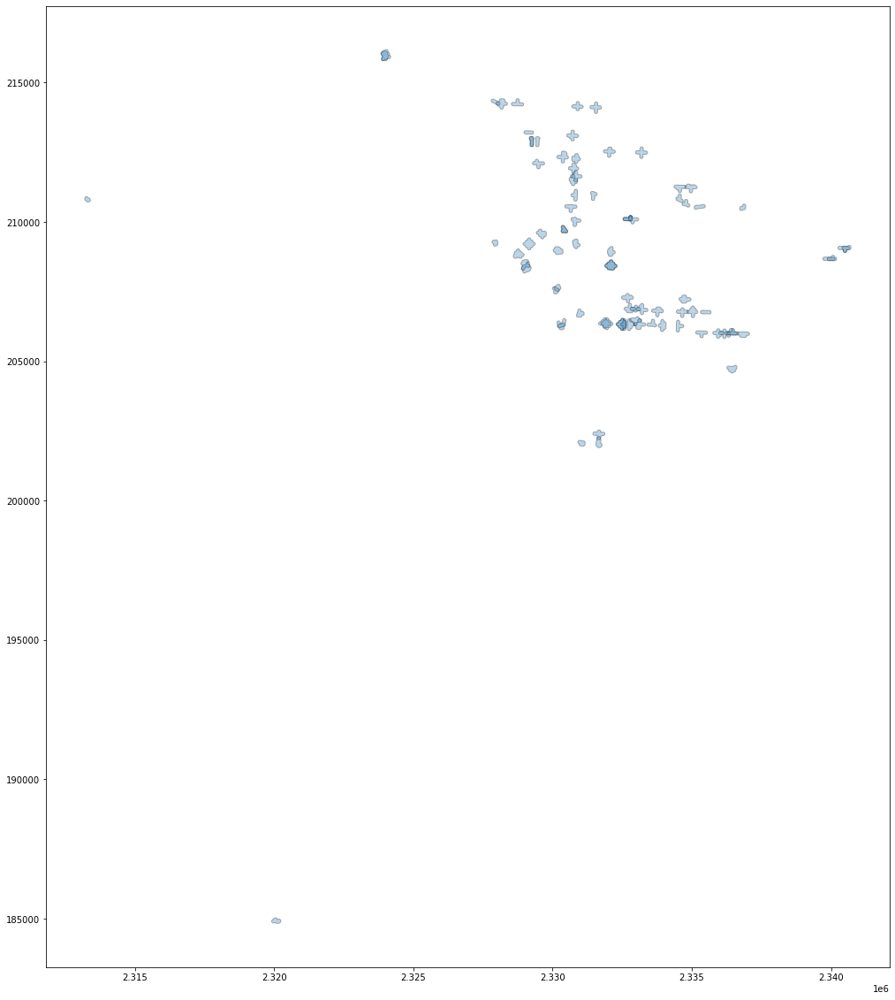

In [18]:
nf2=nf1[nf1['region']=='Portland']
nf3=nf2[nf1['buff_dist']=='0.1'] # change buffer size here
ax = nf3.plot(figsize=(20, 20), alpha=0.3, edgecolor='k')

In [19]:
nf3.head()

,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,latitude,longitude,comment,osm_id_sensor,buff_dist,geometry
6,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,45.513830,-122.672840,NaN,681301893.0,0.1,"POLYGON ((2330172.222 207506.153, 2330166.339 ..."
13,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,45.513187,-122.671210,NaN,689032191.0,0.1,"POLYGON ((2330200.170 207486.701, 2330199.987 ..."
20,P003POR,"SW MOODY AVE, WEST SIDE CYCLE TRACK",permanent,2019,Portland,1.0,1346.261310,98.109589,59.917808,5466.0,45.501340,-122.671970,NaN,322079535.0,0.1,"POLYGON ((2330307.399 206134.278, 2330306.785 ..."
27,P004POR,STEEL BR lower deck,permanent,2019,Portland,1.0,1951.052146,128.041096,84.410959,17323.0,45.527835,-122.668311,NaN,348027806.0,0.1,None
34,P005POR,BROADWAY BR north side,permanent,2019,Portland,1.0,1182.406584,120.712329,82.164384,8077.0,45.532870,-122.672270,NaN,126306263.0,0.1,"POLYGON ((2330534.866 209693.570, 2330537.632 ..."


# Input the Strava Annual Network shape file here

In [20]:
strava=gpd.read_file("F:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Portland/Bike Fusion/strava-annual-portland-osm-2019.shp")
print(strava.crs)
# Define the current EPSG
strava = strava.set_crs("EPSG:2913")
# Let's take a copy of our layer
strava_proj = strava.copy()

# Reproject the geometries by replacing the values with projected ones
strava_proj = strava_proj.to_crs(epsg=2838)

epsg:2913


# Input Bike share data here

In [21]:
bs1=pd.read_csv("F:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Portland/Bike Fusion/2019_01.csv")
bs2=pd.read_csv("F:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Portland/Bike Fusion/2019_02.csv")
bs3=pd.read_csv("F:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Portland/Bike Fusion/2019_03.csv")
bs4=pd.read_csv("F:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Portland/Bike Fusion/2019_04.csv")
bs5=pd.read_csv("F:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Portland/Bike Fusion/2019_05.csv")
bs6=pd.read_csv("F:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Portland/Bike Fusion/2019_06.csv")
bs7=pd.read_csv("F:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Portland/Bike Fusion/2019_07.csv")
bs8=pd.read_csv("F:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Portland/Bike Fusion/2019_08.csv")
bs9=pd.read_csv("F:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Portland/Bike Fusion/2019_09.csv")
bs10=pd.read_csv("F:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Portland/Bike Fusion/2019_10.csv")
bs11=pd.read_csv("F:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Portland/Bike Fusion/2019_11.csv")
bs12=pd.read_csv("F:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Portland/Bike Fusion/2019_12.csv")
bs_all=pd.concat([bs1,bs2,bs3,bs4,bs5,bs6,bs7,bs8,bs9,bs10,bs11,bs12],axis=0,ignore_index=True)
bs_all.head(5)

,RouteID,PaymentPlan,StartHub,StartLatitude,StartLongitude,StartDate,StartTime,EndHub,EndLatitude,EndLongitude,EndDate,EndTime,TripType,BikeID,BikeName,Distance_Miles,Duration,RentalAccessPath,MultipleRental
0,10551635,Subscriber,NW Johnson at Jamison Square,45.528637,-122.682019,1/1/2019,0:00,NaN,45.526398,-122.689363,1/1/2019,0:06,NaN,6177,0367 BIKETOWN,0.52,0:05:34,keypad_rfid_card,False
1,10551641,Subscriber,SE 29th at Belmont,45.516232,-122.636068,1/1/2019,0:03,NaN,45.512196,-122.647606,1/1/2019,0:12,NaN,7493,0612 BIKETOWN,0.89,0:09:02,keypad,False
2,10551644,Casual,NaN,45.517939,-122.658686,1/1/2019,0:04,NaN,45.516437,-122.636100,1/1/2019,7:58,NaN,6398,0375 BIKETOWN,1.23,7:53:28,keypad,False
3,10551674,Casual,NW 21st at Johnson,45.528268,-122.694562,1/1/2019,0:16,NW 21st at Johnson,45.528268,-122.694562,1/1/2019,0:17,NaN,6816,0706 STL BIKETOWN,0.00,0:01:00,mobile,False
4,10551682,Casual,NW 21st at Johnson,45.528268,-122.694562,1/1/2019,0:17,NW 11th at The Fields,45.532325,-122.682430,1/1/2019,0:31,NaN,6588,0338 BIKETOWN,0.88,0:13:31,mobile,True


# Input OSM file here

In [22]:
# Input OSM land use shape file here
luse = gpd.read_file("F:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Portland/Bike Fusion/landuse.shp")
# Define the current EPSG (normall for OSM this 3D EPSG code does not change)
lusec = luse.set_crs("EPSG:4326")


# Input OSM Natural shape file here
nature=gpd.read_file("F:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Portland/Bike Fusion/natural.shp")
# Define the current EPSG
nature = nature.set_crs("EPSG:4326")

# Input OSM Point shape file here
pts=gpd.read_file("F:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Portland/Bike Fusion/points.shp")
# Define the current EPSG
pts = pts.set_crs("EPSG:4326")

# Input the place of your study Area to calculate the intersection Density (city or county, Country)
place="Oregon,USA"

# Input OSM road shape file here
road = gpd.read_file("F:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Portland/Bike Fusion/roads.shp")
# Define the current EPSG
road = road.set_crs("EPSG:4326")

# Import OSM Building shape file to get CBD (City Hall)

In [23]:
# Input OSM road shape file here
building = gpd.read_file("F:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Portland/Bike Fusion/buildings.shp")
print(building.crs)
# Define the current EPSG
building1 = building.set_crs("EPSG:4326")

epsg:4326


# Input NHGIS Block Group shape and CSV file here

In [24]:
# Input the block group shape file of your study area here
bg=gpd.read_file("F:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Portland/Bike Fusion/OR_blck_grp_2017.shp")

# Input Race csv file here
race=pd.read_csv("F:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Portland/Bike Fusion/race.csv")

# Input Age by Sex csv file here
gender=pd.read_csv("F:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Portland/Bike Fusion/age by sex.csv")

# Input education csv file here
edu=pd.read_csv("F:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Portland/Bike Fusion/education.csv")

# Import school enrollmemt 
scll=pd.read_csv("F:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Portland/Bike Fusion/school Enrollment.csv")
# Input Median age csv file here
age=pd.read_csv("F:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Portland/Bike Fusion/median_age.csv")

# Input Median House Hold income csv file here
income=pd.read_csv("F:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Portland/Bike Fusion/median_hh_income.csv")

# Input House hold Type csv file here
hhdensity=pd.read_csv("F:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Portland/Bike Fusion/household_type.csv")

# Input Population csv file here
pdensity=pd.read_csv("F:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Portland/Bike Fusion/population.csv")

# Input Employment csv file here
edensity=pd.read_csv("F:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Portland/Bike Fusion/employment.csv")

# Means of Transportation data
bike_commute=pd.read_csv("F:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Portland/Bike Fusion/Bike_commute_2019_blck_grp.csv")

# Insert LEHD Job Data, WAC file

In [25]:
# Input job csv file here
Number_job=pd.read_csv("F:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Portland/Bike Fusion/or_wac_S000_JT00_2018.csv")
Number_job.head(4)
# Input the block group shape file of your study area here
bg_lehd=gpd.read_file("F:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Portland/Bike Fusion/tabblock2010_41_pophu.shp")


# Weather data needs to input three things
1. Chrome driver link (no need for kaggle as it is already set)
2. Dates you want to extract the data (format: yyyy-m, for example, 2019-4)
3. page of weather underground from where you want to extract the data

Please change the dates and page link only for other sttudy area at weather section which you will find before the Random forest variable selections.

WGS84 Latitude/Longitude: "EPSG:4326"

UTM Zones (North): "EPSG:32633"

UTM Zones (South): "EPSG:32733

# Input Study Area Boundary Shape file here

In [26]:
BA_all=gpd.read_file('http://web.pdx.edu/~jbroach/bike-data-fusion/study_area_boundaries.geojson')

In [27]:
BA_all

,fid,region,comment,epsg_local,geometry
0,1,Boulder,None,2772,"MULTIPOLYGON (((-105.64858 40.06198, -105.6480..."
1,2,Eugene,None,2839,"MULTIPOLYGON (((-123.73473 43.94406, -123.7392..."
2,3,Bend,None,2839,"MULTIPOLYGON (((-121.40550 44.39315, -121.4025..."
3,4,Charlotte,None,3358,"MULTIPOLYGON (((-80.74046 35.37771, -80.73779 ..."
4,5,Dallas,None,2845,"MULTIPOLYGON (((-96.52941 32.54528, -96.52964 ..."
5,6,Portland,metro planning area,2838,"MULTIPOLYGON (((-123.13045 45.47864, -123.1307..."


<AxesSubplot:>

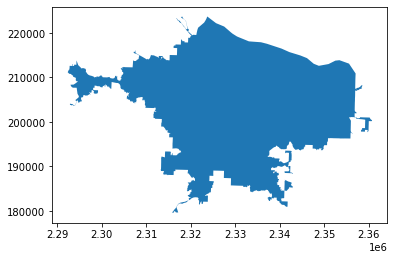

In [28]:
region = "Portland"
# select regional boundary and transform to local coords for buffering
local_poly = BA_all[BA_all['region'] == region]
local_srid = int(local_poly['epsg_local'])
local_poly = local_poly.to_crs(local_srid)
local_poly.plot()

<AxesSubplot:>

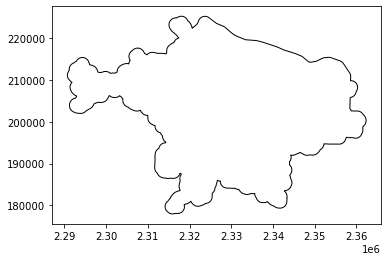

In [29]:
one_mile = 1609.34 # meters
pba = local_poly.buffer(one_mile)
pba.plot(color="none")

<AxesSubplot:>

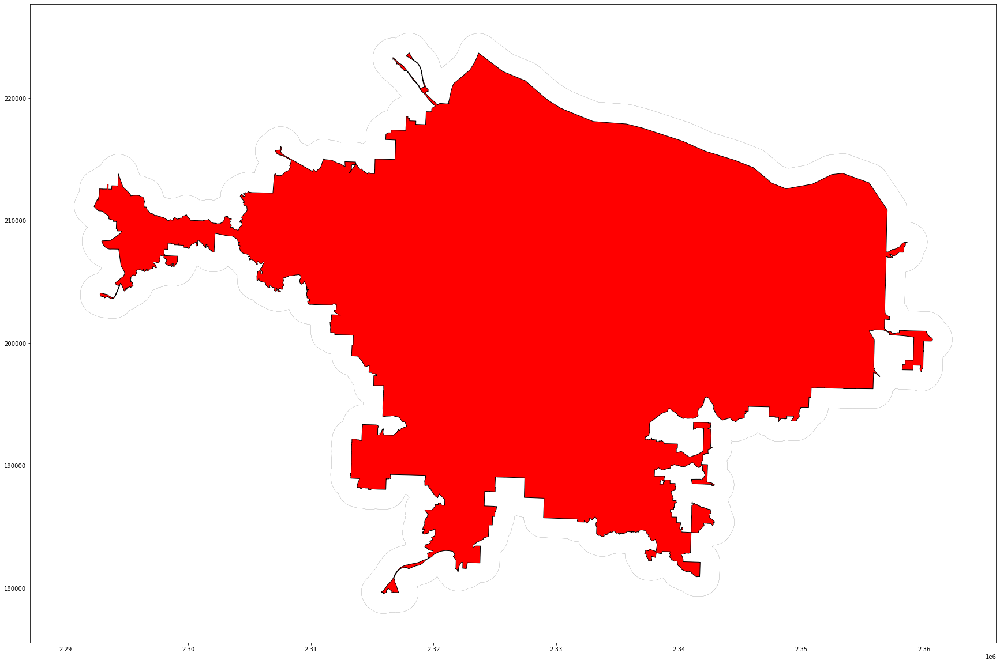

In [30]:
fig, ax = plt.subplots(figsize = (30,25)) 
local_poly.plot(ax=ax,color="red",edgecolor='k',linewidth = 1)
pba.plot(color="none",edgecolor='k',linewidth = 0.15,ax=ax) #Use your second dataframe

# Read the counter location file as gdf

In [31]:
df = gpd.GeoDataFrame(
    nf1, geometry=gpd.points_from_xy(nf1.longitude, nf1.latitude))
df.head()

,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,latitude,longitude,comment,osm_id_sensor,buff_dist,geometry
0,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.36369,109.219178,80.945205,9915.0,45.51383,-122.67284,NaN,681301893.0,2.0,POINT (-122.67284 45.51383)
1,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.36369,109.219178,80.945205,9915.0,45.51383,-122.67284,NaN,681301893.0,1.5,POINT (-122.67284 45.51383)
2,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.36369,109.219178,80.945205,9915.0,45.51383,-122.67284,NaN,681301893.0,1.0,POINT (-122.67284 45.51383)
3,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.36369,109.219178,80.945205,9915.0,45.51383,-122.67284,NaN,681301893.0,0.75,POINT (-122.67284 45.51383)
4,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.36369,109.219178,80.945205,9915.0,45.51383,-122.67284,NaN,681301893.0,0.5,POINT (-122.67284 45.51383)


In [32]:
# set the co-ordinate system first
df = df.set_crs("EPSG:4211")
# Let's take a copy of our layer
gdf0_proj = df.copy()

# Reproject the geometries by replacing the values with projected ones
eco_proj = gdf0_proj.to_crs(epsg=2838)
eco_proj.head()

,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,latitude,longitude,comment,osm_id_sensor,buff_dist,geometry
0,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.36369,109.219178,80.945205,9915.0,45.51383,-122.67284,NaN,681301893.0,2.0,POINT (2330251.902 207544.074)
1,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.36369,109.219178,80.945205,9915.0,45.51383,-122.67284,NaN,681301893.0,1.5,POINT (2330251.902 207544.074)
2,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.36369,109.219178,80.945205,9915.0,45.51383,-122.67284,NaN,681301893.0,1.0,POINT (2330251.902 207544.074)
3,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.36369,109.219178,80.945205,9915.0,45.51383,-122.67284,NaN,681301893.0,0.75,POINT (2330251.902 207544.074)
4,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.36369,109.219178,80.945205,9915.0,45.51383,-122.67284,NaN,681301893.0,0.5,POINT (2330251.902 207544.074)


In [33]:
ecoshort0=eco_proj
#ecoshort0=pd.concat([eco_proj,short_proj],axis=0)
ecoshort0.head()

,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,latitude,longitude,comment,osm_id_sensor,buff_dist,geometry
0,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.36369,109.219178,80.945205,9915.0,45.51383,-122.67284,NaN,681301893.0,2.0,POINT (2330251.902 207544.074)
1,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.36369,109.219178,80.945205,9915.0,45.51383,-122.67284,NaN,681301893.0,1.5,POINT (2330251.902 207544.074)
2,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.36369,109.219178,80.945205,9915.0,45.51383,-122.67284,NaN,681301893.0,1.0,POINT (2330251.902 207544.074)
3,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.36369,109.219178,80.945205,9915.0,45.51383,-122.67284,NaN,681301893.0,0.75,POINT (2330251.902 207544.074)
4,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.36369,109.219178,80.945205,9915.0,45.51383,-122.67284,NaN,681301893.0,0.5,POINT (2330251.902 207544.074)


# Filter the location by Extended Study area Boundary

In [34]:
# Clip the data using GeoPandas clip
ecoshort = gpd.clip(ecoshort0, pba)
ecoshort.head()

,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,latitude,longitude,comment,osm_id_sensor,buff_dist,geometry
0,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.36369,109.219178,80.945205,9915.0,45.51383,-122.67284,NaN,681301893.0,2.0,POINT (2330251.902 207544.074)
1,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.36369,109.219178,80.945205,9915.0,45.51383,-122.67284,NaN,681301893.0,1.5,POINT (2330251.902 207544.074)
2,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.36369,109.219178,80.945205,9915.0,45.51383,-122.67284,NaN,681301893.0,1.0,POINT (2330251.902 207544.074)
3,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.36369,109.219178,80.945205,9915.0,45.51383,-122.67284,NaN,681301893.0,0.75,POINT (2330251.902 207544.074)
4,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.36369,109.219178,80.945205,9915.0,45.51383,-122.67284,NaN,681301893.0,0.5,POINT (2330251.902 207544.074)


In [35]:
count_station=ecoshort.copy()

In [36]:
ecoshort.shape

(616, 16)

<AxesSubplot:>

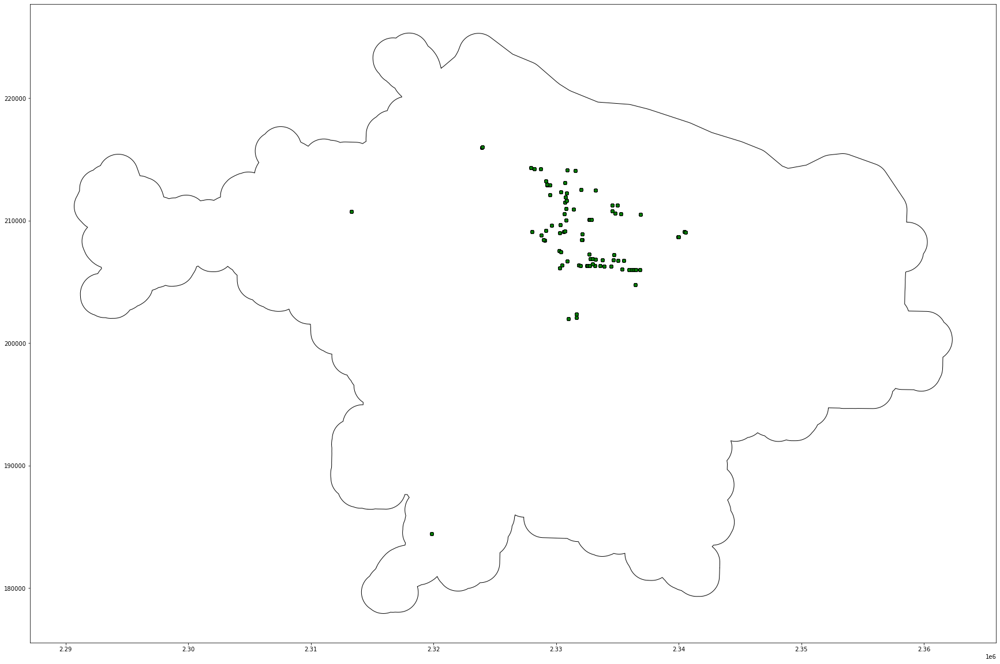

In [37]:
fig, ax = plt.subplots(figsize = (30,25)) 
ecoshort.plot(ax=ax,color="green",edgecolor='k',linewidth = 1)
pba.plot(color="none",edgecolor='k',linewidth = 1,ax=ax) #Use your second dataframe

# geopanda buffer function: https://geopandas.org/docs/user_guide/geometric_manipulations.html

In [38]:
# Buffer file
gdf1=nf3
gdf1['buffer_area']=gdf1.area*3.86102e-7 # in mile square
gdf1=gdf1[gdf1['buffer_area']>0]
gdf1

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\geopandas\geodataframe.py:1322: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super(GeoDataFrame, self).__setitem__(key, value)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,latitude,longitude,comment,osm_id_sensor,buff_dist,geometry,buffer_area
6,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,45.513830,-122.672840,NaN,681301893.0,0.1,"POLYGON ((2330172.222 207506.153, 2330166.339 ...",0.016902
13,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,45.513187,-122.671210,NaN,689032191.0,0.1,"POLYGON ((2330200.170 207486.701, 2330199.987 ...",0.016412
20,P003POR,"SW MOODY AVE, WEST SIDE CYCLE TRACK",permanent,2019,Portland,1.0,1346.261310,98.109589,59.917808,5466.0,45.501340,-122.671970,NaN,322079535.0,0.1,"POLYGON ((2330307.399 206134.278, 2330306.785 ...",0.023266
34,P005POR,BROADWAY BR north side,permanent,2019,Portland,1.0,1182.406584,120.712329,82.164384,8077.0,45.532870,-122.672270,NaN,126306263.0,0.1,"POLYGON ((2330534.866 209693.570, 2330537.632 ...",0.017055
41,P006POR,BROADWAY BR south side,permanent,2019,Portland,2.0,984.694490,91.246575,61.273973,10649.0,45.532780,-122.672424,NaN,422121256.0,0.1,"POLYGON ((2330534.866 209693.570, 2330537.632 ...",0.017055
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
587,S170POR,N BURLINGTON AVE N of PRINCETON ST,short-term,2019,Portland,3.0,43.214075,21.726027,4.684932,464.0,45.588368,-122.755946,NaN,134963745.0,0.1,"POLYGON ((2323955.090 215800.291, 2323950.494 ...",0.035637
594,S179POR,N DENVER AVE N of WILLAMETTE BLVD,short-term,2019,Portland,1.0,93.246692,15.150685,11.150685,1194.0,45.562107,-122.687407,NaN,117315141.0,0.1,"POLYGON ((2329314.358 212760.659, 2329313.879 ...",0.016963
601,S180POR,N DETROIT AVE N of JESSUP ST,short-term,2019,Portland,1.0,38.054450,1.164384,0.753425,95.0,45.564658,-122.688638,NaN,5516558.0,0.1,"POLYGON ((2329278.705 213261.676, 2329284.163 ...",0.014854
608,S181POR,NW OVERTON ST W of NW 10TH AVE,short-term,2019,Portland,1.0,354.701900,56.657534,31.068493,3940.0,45.532232,-122.681640,NaN,5528173.0,0.1,"POLYGON ((2329562.365 209466.713, 2329557.803 ...",0.029837


In [39]:
#gdf1 = ecoshort.copy()
#gdf1['geometry'] = gdf1['geometry'].buffer(size)
#gdf1

In [40]:
#conda install -c conda-forge contextily #install in your geo_env using command prompt 

#https://geopandas.org/gallery/plotting_basemap_background.html

In [41]:
import contextily as ctx

In [42]:
print(gdf1.crs)

epsg:2838


In [43]:
# Insert City Specific EPSG here to convert 3D to 2D map,for exaple, state plane system EPSG =2838 for Portland
# set the co-ordinate system first
gdfm = gdf1.set_crs("EPSG:2838") # provided by PSU
gdfm = gdfm.to_crs(epsg=3857) # This EPSG just for ploting

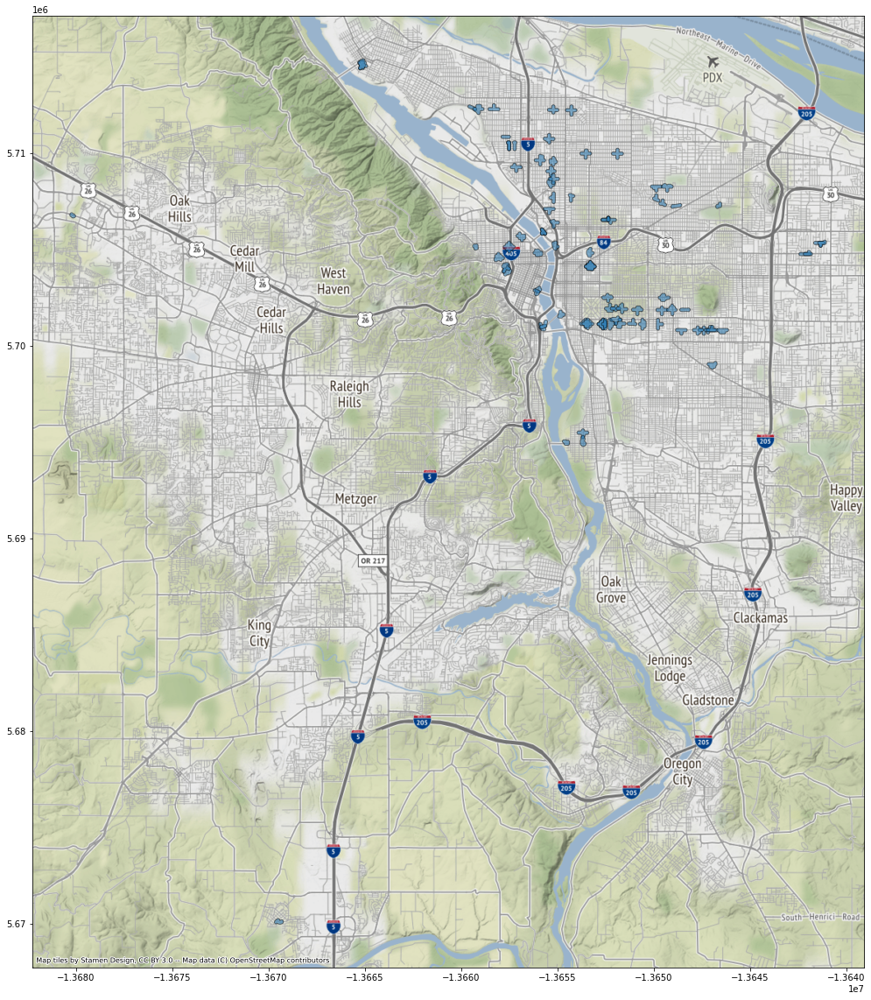

In [44]:
ax = gdfm.plot(figsize=(20, 20), alpha=0.5, edgecolor='k')
ctx.add_basemap(ax)

# ploting code: http://darribas.org/gds15/content/labs/lab_03.html

# Calculate O, D and OD line

In [45]:
bs_all.head(5)

,RouteID,PaymentPlan,StartHub,StartLatitude,StartLongitude,StartDate,StartTime,EndHub,EndLatitude,EndLongitude,EndDate,EndTime,TripType,BikeID,BikeName,Distance_Miles,Duration,RentalAccessPath,MultipleRental
0,10551635,Subscriber,NW Johnson at Jamison Square,45.528637,-122.682019,1/1/2019,0:00,NaN,45.526398,-122.689363,1/1/2019,0:06,NaN,6177,0367 BIKETOWN,0.52,0:05:34,keypad_rfid_card,False
1,10551641,Subscriber,SE 29th at Belmont,45.516232,-122.636068,1/1/2019,0:03,NaN,45.512196,-122.647606,1/1/2019,0:12,NaN,7493,0612 BIKETOWN,0.89,0:09:02,keypad,False
2,10551644,Casual,NaN,45.517939,-122.658686,1/1/2019,0:04,NaN,45.516437,-122.636100,1/1/2019,7:58,NaN,6398,0375 BIKETOWN,1.23,7:53:28,keypad,False
3,10551674,Casual,NW 21st at Johnson,45.528268,-122.694562,1/1/2019,0:16,NW 21st at Johnson,45.528268,-122.694562,1/1/2019,0:17,NaN,6816,0706 STL BIKETOWN,0.00,0:01:00,mobile,False
4,10551682,Casual,NW 21st at Johnson,45.528268,-122.694562,1/1/2019,0:17,NW 11th at The Fields,45.532325,-122.682430,1/1/2019,0:31,NaN,6588,0338 BIKETOWN,0.88,0:13:31,mobile,True


# BS Origin

In [46]:
# Origin
bso = gpd.GeoDataFrame(
    bs_all, geometry=gpd.points_from_xy(bs_all.StartLongitude, bs_all.StartLatitude))
bso=bso.loc[:,['RouteID','StartLatitude','StartLongitude','geometry']]
bso.head(5)

,RouteID,StartLatitude,StartLongitude,geometry
0,10551635,45.528637,-122.682019,POINT (-122.68202 45.52864)
1,10551641,45.516232,-122.636068,POINT (-122.63607 45.51623)
2,10551644,45.517939,-122.658686,POINT (-122.65869 45.51794)
3,10551674,45.528268,-122.694562,POINT (-122.69456 45.52827)
4,10551682,45.528268,-122.694562,POINT (-122.69456 45.52827)


In [47]:
# set the co-ordinate system first
bso1 = bso.set_crs("EPSG:4211")

# Reproject the geometries by replacing the values with projected ones
bso1_proj = bso1.to_crs(epsg=2838)
bso1_proj.head(5)

,RouteID,StartLatitude,StartLongitude,geometry
0,10551635,45.528637,-122.682019,POINT (2329579.385 209208.293)
1,10551641,45.516232,-122.636068,POINT (2333131.018 207734.286)
2,10551644,45.517939,-122.658686,POINT (2331369.563 207970.912)
3,10551674,45.528268,-122.694562,POINT (2328598.956 209193.912)
4,10551682,45.528268,-122.694562,POINT (2328598.956 209193.912)


In [48]:
# Clip the data using GeoPandas clip
bso1_clip = gpd.clip(bso1_proj, gdf1)
bso1_clip.head(5)

,RouteID,StartLatitude,StartLongitude,geometry
23,10551817,45.559110,-122.653649,POINT (2331884.961 212534.191)
28,10551831,45.562447,-122.684836,POINT (2329461.081 212970.327)
46,10551911,45.559107,-122.652673,POINT (2331961.091 212531.873)
51,10551934,45.550763,-122.666866,POINT (2330828.544 211634.576)
58,10552246,45.531513,-122.682456,POINT (2329553.904 209528.727)


In [49]:
 int_bso=gpd.overlay(gdf1, bso1_clip, how='intersection', make_valid=True, keep_geom_type=False)
 int_bso.head(5)

,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,latitude,longitude,comment,osm_id_sensor,buff_dist,buffer_area,RouteID,StartLatitude,StartLongitude,geometry
0,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.36369,109.219178,80.945205,9915.0,45.51383,-122.67284,NaN,681301893.0,0.1,0.016902,10553960,45.515568,-122.673892,POINT (2330174.903 207739.397)
1,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.36369,109.219178,80.945205,9915.0,45.51383,-122.67284,NaN,681301893.0,0.1,0.016902,10554015,45.515568,-122.673892,POINT (2330174.903 207739.397)
2,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.36369,109.219178,80.945205,9915.0,45.51383,-122.67284,NaN,681301893.0,0.1,0.016902,10554028,45.515568,-122.673892,POINT (2330174.903 207739.397)
3,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.36369,109.219178,80.945205,9915.0,45.51383,-122.67284,NaN,681301893.0,0.1,0.016902,10554119,45.515568,-122.673892,POINT (2330174.903 207739.397)
4,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.36369,109.219178,80.945205,9915.0,45.51383,-122.67284,NaN,681301893.0,0.1,0.016902,10554124,45.515568,-122.673892,POINT (2330174.903 207739.397)


<AxesSubplot:>

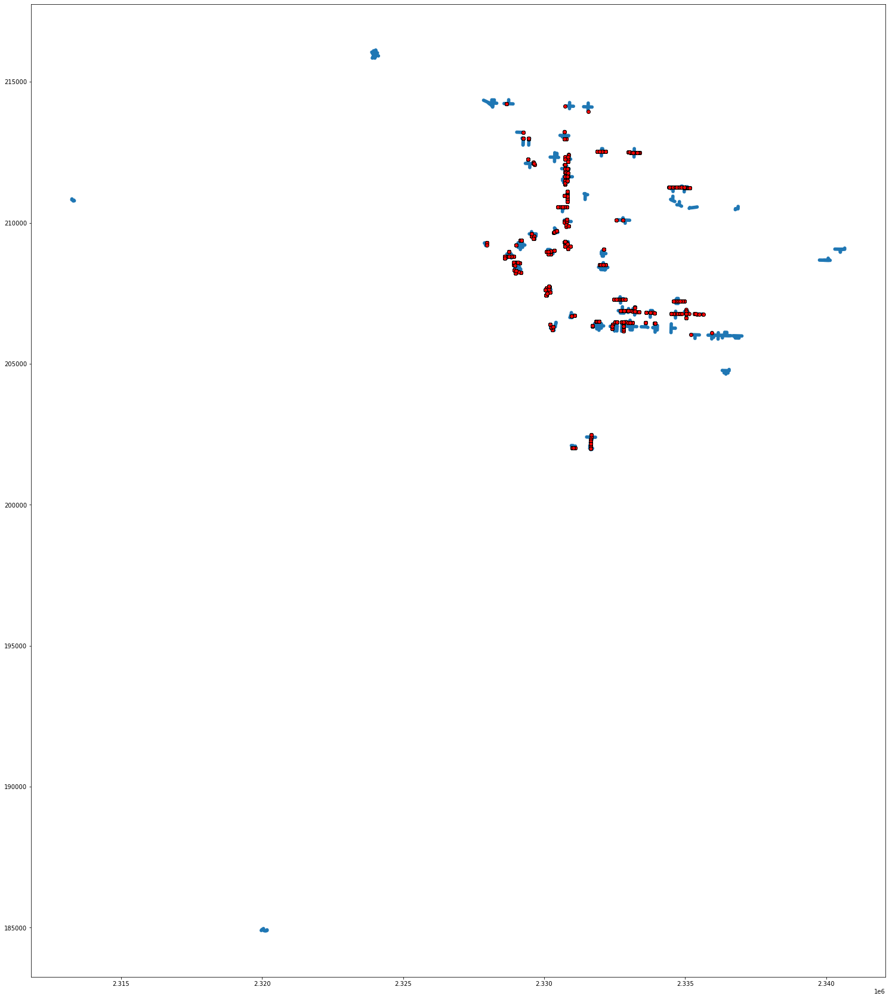

In [50]:
#int_bso.geometry.plot()
ax = gdf1.plot(figsize=(40, 30))
int_bso.geometry.plot(color="red",edgecolor='k',ax=ax)

In [51]:
output_origin=int_bso.groupby(by=['osm_id_sensor'])['RouteID'].count().reset_index()
output_origin.columns=["osm_id","Bike Share Origin"]
output_origin.head()

,osm_id,Bike Share Origin
0,5516558.0,3
1,5522164.0,4448
2,5527017.0,1
3,5528173.0,4866
4,5529833.0,24


# BS destination

In [52]:
# Destination
bsd = gpd.GeoDataFrame(
    bs_all, geometry=gpd.points_from_xy(bs_all.EndLongitude, bs_all.EndLatitude))
bsd=bsd.loc[:,['RouteID','EndLatitude','EndLongitude','geometry']]
bsd.head(5)

,RouteID,EndLatitude,EndLongitude,geometry
0,10551635,45.526398,-122.689363,POINT (-122.68936 45.52640)
1,10551641,45.512196,-122.647606,POINT (-122.64761 45.51220)
2,10551644,45.516437,-122.636100,POINT (-122.63610 45.51644)
3,10551674,45.528268,-122.694562,POINT (-122.69456 45.52827)
4,10551682,45.532325,-122.682430,POINT (-122.68243 45.53233)


In [53]:
# set the co-ordinate system first
bsd1 = bsd.set_crs("EPSG:4211")
# Reproject the geometries by replacing the values with projected ones
bsd1_proj = bsd1.to_crs(epsg=2838)
bsd1_proj.head(5)

,RouteID,EndLatitude,EndLongitude,geometry
0,10551635,45.526398,-122.689363,POINT (2328999.273 208975.163)
1,10551641,45.512196,-122.647606,POINT (2332217.933 207309.838)
2,10551644,45.516437,-122.636100,POINT (2333129.100 207757.186)
3,10551674,45.528268,-122.694562,POINT (2328598.956 209193.912)
4,10551682,45.532325,-122.682430,POINT (2329558.412 209618.912)


In [54]:
# Clip the data using GeoPandas clip
bsd1_clip = gpd.clip(bsd1_proj, gdf1)
bsd1_clip.head(5)

,RouteID,EndLatitude,EndLongitude,geometry
4,10551682,45.532325,-122.682430,POINT (2329558.412 209618.912)
5,10551686,45.532325,-122.682430,POINT (2329558.412 209618.912)
6,10551689,45.532325,-122.682430,POINT (2329558.412 209618.912)
7,10551701,45.532325,-122.682430,POINT (2329558.412 209618.912)
8,10551718,45.521960,-122.689677,POINT (2328961.342 208482.814)


In [55]:
int_bsd=gpd.overlay(gdf1, bsd1_clip, how='intersection', make_valid=True, keep_geom_type=False)
int_bsd.head(5)

,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,latitude,longitude,comment,osm_id_sensor,buff_dist,buffer_area,RouteID,EndLatitude,EndLongitude,geometry
0,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.36369,109.219178,80.945205,9915.0,45.51383,-122.67284,NaN,681301893.0,0.1,0.016902,10552864,45.515568,-122.673892,POINT (2330174.903 207739.397)
1,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.36369,109.219178,80.945205,9915.0,45.51383,-122.67284,NaN,681301893.0,0.1,0.016902,10553960,45.515568,-122.673892,POINT (2330174.903 207739.397)
2,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.36369,109.219178,80.945205,9915.0,45.51383,-122.67284,NaN,681301893.0,0.1,0.016902,10554015,45.515568,-122.673892,POINT (2330174.903 207739.397)
3,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.36369,109.219178,80.945205,9915.0,45.51383,-122.67284,NaN,681301893.0,0.1,0.016902,10554028,45.515568,-122.673892,POINT (2330174.903 207739.397)
4,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.36369,109.219178,80.945205,9915.0,45.51383,-122.67284,NaN,681301893.0,0.1,0.016902,10554119,45.515568,-122.673892,POINT (2330174.903 207739.397)


In [56]:
#int_bsd.geometry.plot()
#plotting    
#ax = gdf1.plot(figsize=(40, 30))
#int_bsd.geometry.plot(color="red",edgecolor='k',ax=ax)

In [57]:
output_destination=int_bsd.groupby(by=['osm_id_sensor'])['RouteID'].count().reset_index()
output_destination.columns=["osm_id","Bike Share Destination"]
output_destination

,osm_id,Bike Share Destination
0,5516558.0,5
1,5522164.0,3792
2,5527017.0,1
3,5528173.0,5194
4,5529833.0,30
...,...,...
56,644432836.0,154
57,681301893.0,5902
58,689032191.0,1681
59,711588457.0,23


# Bike Share OD line Crossing

In [58]:
#https://gis.stackexchange.com/questions/303615/creating-linestring-and-length-of-linestring-from-multiple-latlon-points-for-eac
import shapely.geometry as geom
bs_all_od=bs_all.copy()
bs_all_od['geometry'] = bs_all_od.apply(lambda x: geom.LineString([(x['StartLongitude'], x['StartLatitude']) , (x['EndLongitude'], x['EndLatitude'])]), axis = 1)
bs_all_od.head(5)

,RouteID,PaymentPlan,StartHub,StartLatitude,StartLongitude,StartDate,StartTime,EndHub,EndLatitude,EndLongitude,EndDate,EndTime,TripType,BikeID,BikeName,Distance_Miles,Duration,RentalAccessPath,MultipleRental,geometry
0,10551635,Subscriber,NW Johnson at Jamison Square,45.528637,-122.682019,1/1/2019,0:00,NaN,45.526398,-122.689363,1/1/2019,0:06,NaN,6177,0367 BIKETOWN,0.52,0:05:34,keypad_rfid_card,False,"LINESTRING (-122.6820195 45.5286366, -122.6893..."
1,10551641,Subscriber,SE 29th at Belmont,45.516232,-122.636068,1/1/2019,0:03,NaN,45.512196,-122.647606,1/1/2019,0:12,NaN,7493,0612 BIKETOWN,0.89,0:09:02,keypad,False,"LINESTRING (-122.6360679 45.51623176, -122.647..."
2,10551644,Casual,NaN,45.517939,-122.658686,1/1/2019,0:04,NaN,45.516437,-122.636100,1/1/2019,7:58,NaN,6398,0375 BIKETOWN,1.23,7:53:28,keypad,False,"LINESTRING (-122.6586863 45.517939, -122.63610..."
3,10551674,Casual,NW 21st at Johnson,45.528268,-122.694562,1/1/2019,0:16,NW 21st at Johnson,45.528268,-122.694562,1/1/2019,0:17,NaN,6816,0706 STL BIKETOWN,0.00,0:01:00,mobile,False,"LINESTRING (-122.6945615 45.52826831, -122.694..."
4,10551682,Casual,NW 21st at Johnson,45.528268,-122.694562,1/1/2019,0:17,NW 11th at The Fields,45.532325,-122.682430,1/1/2019,0:31,NaN,6588,0338 BIKETOWN,0.88,0:13:31,mobile,True,"LINESTRING (-122.6945615 45.52826831, -122.682..."


In [59]:
# exclude the points outside of Portland
bs_all_od1=bs_all_od[(bs_all_od.StartLongitude<=-122)&(bs_all_od.StartLongitude>=-124)]
bs_all_od1=bs_all_od1[(bs_all_od1.EndLongitude<=-122)&(bs_all_od1.EndLongitude>=-124)]
bs_all_od1=bs_all_od1[(bs_all_od1.StartLatitude>=45)&(bs_all_od1.StartLatitude<=46)]
bs_all_od1=bs_all_od1[(bs_all_od1.EndLatitude>=45)&(bs_all_od1.EndLatitude<=46)]
bs_all_od1.head(5)

,RouteID,PaymentPlan,StartHub,StartLatitude,StartLongitude,StartDate,StartTime,EndHub,EndLatitude,EndLongitude,EndDate,EndTime,TripType,BikeID,BikeName,Distance_Miles,Duration,RentalAccessPath,MultipleRental,geometry
0,10551635,Subscriber,NW Johnson at Jamison Square,45.528637,-122.682019,1/1/2019,0:00,NaN,45.526398,-122.689363,1/1/2019,0:06,NaN,6177,0367 BIKETOWN,0.52,0:05:34,keypad_rfid_card,False,"LINESTRING (-122.6820195 45.5286366, -122.6893..."
1,10551641,Subscriber,SE 29th at Belmont,45.516232,-122.636068,1/1/2019,0:03,NaN,45.512196,-122.647606,1/1/2019,0:12,NaN,7493,0612 BIKETOWN,0.89,0:09:02,keypad,False,"LINESTRING (-122.6360679 45.51623176, -122.647..."
2,10551644,Casual,NaN,45.517939,-122.658686,1/1/2019,0:04,NaN,45.516437,-122.636100,1/1/2019,7:58,NaN,6398,0375 BIKETOWN,1.23,7:53:28,keypad,False,"LINESTRING (-122.6586863 45.517939, -122.63610..."
3,10551674,Casual,NW 21st at Johnson,45.528268,-122.694562,1/1/2019,0:16,NW 21st at Johnson,45.528268,-122.694562,1/1/2019,0:17,NaN,6816,0706 STL BIKETOWN,0.00,0:01:00,mobile,False,"LINESTRING (-122.6945615 45.52826831, -122.694..."
4,10551682,Casual,NW 21st at Johnson,45.528268,-122.694562,1/1/2019,0:17,NW 11th at The Fields,45.532325,-122.682430,1/1/2019,0:31,NaN,6588,0338 BIKETOWN,0.88,0:13:31,mobile,True,"LINESTRING (-122.6945615 45.52826831, -122.682..."


In [60]:
#bs_all_od1.dtypes

In [61]:
#print(bs_all_od1.info())

In [62]:
bs_all_od2 = gpd.GeoDataFrame(bs_all_od1, geometry='geometry', crs={'init': 'epsg:4211'})
bs_all_od2.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\pyproj\crs\crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))


,RouteID,PaymentPlan,StartHub,StartLatitude,StartLongitude,StartDate,StartTime,EndHub,EndLatitude,EndLongitude,EndDate,EndTime,TripType,BikeID,BikeName,Distance_Miles,Duration,RentalAccessPath,MultipleRental,geometry
0,10551635,Subscriber,NW Johnson at Jamison Square,45.528637,-122.682019,1/1/2019,0:00,NaN,45.526398,-122.689363,1/1/2019,0:06,NaN,6177,0367 BIKETOWN,0.52,0:05:34,keypad_rfid_card,False,"LINESTRING (-122.68202 45.52864, -122.68936 45..."
1,10551641,Subscriber,SE 29th at Belmont,45.516232,-122.636068,1/1/2019,0:03,NaN,45.512196,-122.647606,1/1/2019,0:12,NaN,7493,0612 BIKETOWN,0.89,0:09:02,keypad,False,"LINESTRING (-122.63607 45.51623, -122.64761 45..."
2,10551644,Casual,NaN,45.517939,-122.658686,1/1/2019,0:04,NaN,45.516437,-122.636100,1/1/2019,7:58,NaN,6398,0375 BIKETOWN,1.23,7:53:28,keypad,False,"LINESTRING (-122.65869 45.51794, -122.63610 45..."
3,10551674,Casual,NW 21st at Johnson,45.528268,-122.694562,1/1/2019,0:16,NW 21st at Johnson,45.528268,-122.694562,1/1/2019,0:17,NaN,6816,0706 STL BIKETOWN,0.00,0:01:00,mobile,False,"LINESTRING (-122.69456 45.52827, -122.69456 45..."
4,10551682,Casual,NW 21st at Johnson,45.528268,-122.694562,1/1/2019,0:17,NW 11th at The Fields,45.532325,-122.682430,1/1/2019,0:31,NaN,6588,0338 BIKETOWN,0.88,0:13:31,mobile,True,"LINESTRING (-122.69456 45.52827, -122.68243 45..."


In [63]:
print(bs_all_od2.crs)

+init=epsg:4211 +type=crs


In [64]:
#print(bs_all_od2.info())

In [65]:
# set the co-ordinate system first
#bs_all_od2 = bs_all_od1.set_crs("EPSG:4211")

# Reproject the geometries by replacing the values with projected ones
bs_all_od2_proj = bs_all_od2.to_crs(epsg=2838)
bs_all_od2_proj.head(5)

,RouteID,PaymentPlan,StartHub,StartLatitude,StartLongitude,StartDate,StartTime,EndHub,EndLatitude,EndLongitude,EndDate,EndTime,TripType,BikeID,BikeName,Distance_Miles,Duration,RentalAccessPath,MultipleRental,geometry
0,10551635,Subscriber,NW Johnson at Jamison Square,45.528637,-122.682019,1/1/2019,0:00,NaN,45.526398,-122.689363,1/1/2019,0:06,NaN,6177,0367 BIKETOWN,0.52,0:05:34,keypad_rfid_card,False,"LINESTRING (2329579.385 209208.293, 2328999.27..."
1,10551641,Subscriber,SE 29th at Belmont,45.516232,-122.636068,1/1/2019,0:03,NaN,45.512196,-122.647606,1/1/2019,0:12,NaN,7493,0612 BIKETOWN,0.89,0:09:02,keypad,False,"LINESTRING (2333131.018 207734.286, 2332217.93..."
2,10551644,Casual,NaN,45.517939,-122.658686,1/1/2019,0:04,NaN,45.516437,-122.636100,1/1/2019,7:58,NaN,6398,0375 BIKETOWN,1.23,7:53:28,keypad,False,"LINESTRING (2331369.563 207970.912, 2333129.10..."
3,10551674,Casual,NW 21st at Johnson,45.528268,-122.694562,1/1/2019,0:16,NW 21st at Johnson,45.528268,-122.694562,1/1/2019,0:17,NaN,6816,0706 STL BIKETOWN,0.00,0:01:00,mobile,False,"LINESTRING (2328598.956 209193.912, 2328598.95..."
4,10551682,Casual,NW 21st at Johnson,45.528268,-122.694562,1/1/2019,0:17,NW 11th at The Fields,45.532325,-122.682430,1/1/2019,0:31,NaN,6588,0338 BIKETOWN,0.88,0:13:31,mobile,True,"LINESTRING (2328598.956 209193.912, 2329558.41..."


In [66]:
bs_all_od2_proj.shape

(323680, 20)

In [67]:
#fig, ax = plt.subplots(figsize = (30,25)) 
#gdf1.plot(ax=ax,color="red")
#bs_all_od2_proj.geometry.plot(color="green",edgecolor='k',linewidth = 2,ax=ax)

In [68]:
spj = gpd.sjoin( bs_all_od2_proj,gdf1, how="inner", op='intersects')

In [69]:
spj.head(5)

,RouteID,PaymentPlan,StartHub,StartLatitude,StartLongitude,StartDate,StartTime,EndHub,EndLatitude,EndLongitude,...,AADBT,stv_adb,stv_c_adb,stl_raw,latitude,longitude,comment,osm_id_sensor,buff_dist,buffer_area
0,10551635,Subscriber,NW Johnson at Jamison Square,45.528637,-122.682019,1/1/2019,0:00,NaN,45.526398,-122.689363,...,44.258472,2.589041,1.287671,1671.0,45.528434,-122.687409,NaN,33665960.0,0.1,0.041128
8,10551718,Subscriber,NW Front at 17th,45.537152,-122.688103,1/1/2019,0:30,SW Morrison at 18th,45.521960,-122.689677,...,44.258472,2.589041,1.287671,1671.0,45.528434,-122.687409,NaN,33665960.0,0.1,0.041128
20,10551802,Casual,NaN,45.531332,-122.692591,1/1/2019,1:12,NaN,45.530018,-122.686452,...,44.258472,2.589041,1.287671,1671.0,45.528434,-122.687409,NaN,33665960.0,0.1,0.041128
70,10552571,Subscriber,NaN,45.527731,-122.694486,1/1/2019,8:00,NaN,45.526491,-122.684292,...,44.258472,2.589041,1.287671,1671.0,45.528434,-122.687409,NaN,33665960.0,0.1,0.041128
104,10553127,Subscriber,NW Raleigh at 21st,45.534091,-122.694942,1/1/2019,10:39,NaN,45.527260,-122.681276,...,44.258472,2.589041,1.287671,1671.0,45.528434,-122.687409,NaN,33665960.0,0.1,0.041128


In [70]:
spj.shape

(284450, 37)

In [71]:
# Clip the data using GeoPandas clip
#odc1_clip = gpd.clip(bs_all_od2_proj,gdf1)
#odc1_clip.head(5)

In [72]:
#int_odl=gpd.overlay(gdf1, bs_all_od2_proj, how='intersection', make_valid=True, keep_geom_type=False)
#int_odl.head(5)

In [73]:
#fig, ax = plt.subplots(figsize = (30,25)) 
#gdf1.plot(ax=ax,color="red")
#spj.geometry.plot(color="green",edgecolor='k',linewidth = 2,ax=ax)

In [74]:
output_odl=spj.groupby(by=['osm_id_sensor'])['RouteID'].count().reset_index()
output_odl.columns=["osm_id","Bike Share Crossing"]
output_odl

,osm_id,Bike Share Crossing
0,5516558.0,36
1,5522164.0,15814
2,5527017.0,20
3,5528173.0,16351
4,5529833.0,2737
...,...,...
68,644432836.0,5490
69,681301893.0,19351
70,689032191.0,11928
71,711588457.0,2189


# Now import land use shape file

In [75]:
#luse = gpd.read_file("../input/osm-data/landuse.shp")
luse.head(5)

,osm_id,name,type,geometry
0,23625119,Lady Island,industrial,"POLYGON ((-122.44367 45.57471, -122.43671 45.5..."
1,24000302,None,grass,"POLYGON ((-122.85178 45.50665, -122.85060 45.5..."
2,25822078,Intel Ronler Acres Campus,industrial,"POLYGON ((-122.92614 45.55060, -122.92613 45.5..."
3,25822108,None,industrial,"POLYGON ((-122.90597 45.54689, -122.90572 45.5..."
4,25822220,Dawson Creek,residential,"POLYGON ((-122.92635 45.53824, -122.92930 45.5..."


# Define and then Convert the co-ordinate system

In [76]:
# set the co-ordinate system first
#lusec = luse.set_crs("EPSG:4326")

In [77]:
# Let's take a copy of our layer
luse_proj = lusec.copy()

# Reproject the geometries by replacing the values with projected ones
luse_proj = luse_proj.to_crs(epsg=2838)
luse_proj.head(5)

,osm_id,name,type,geometry
0,23625119,Lady Island,industrial,"POLYGON ((2348315.732 213851.353, 2348848.428 ..."
1,24000302,None,grass,"POLYGON ((2316254.380 207136.871, 2316346.627 ..."
2,25822078,Intel Ronler Acres Campus,industrial,"POLYGON ((2310592.897 212191.562, 2310593.718 ..."
3,25822108,None,industrial,"POLYGON ((2312154.540 211731.603, 2312173.766 ..."
4,25822220,Dawson Creek,residential,"POLYGON ((2310534.979 210818.533, 2310304.726 ..."


# Visualize

<AxesSubplot:>

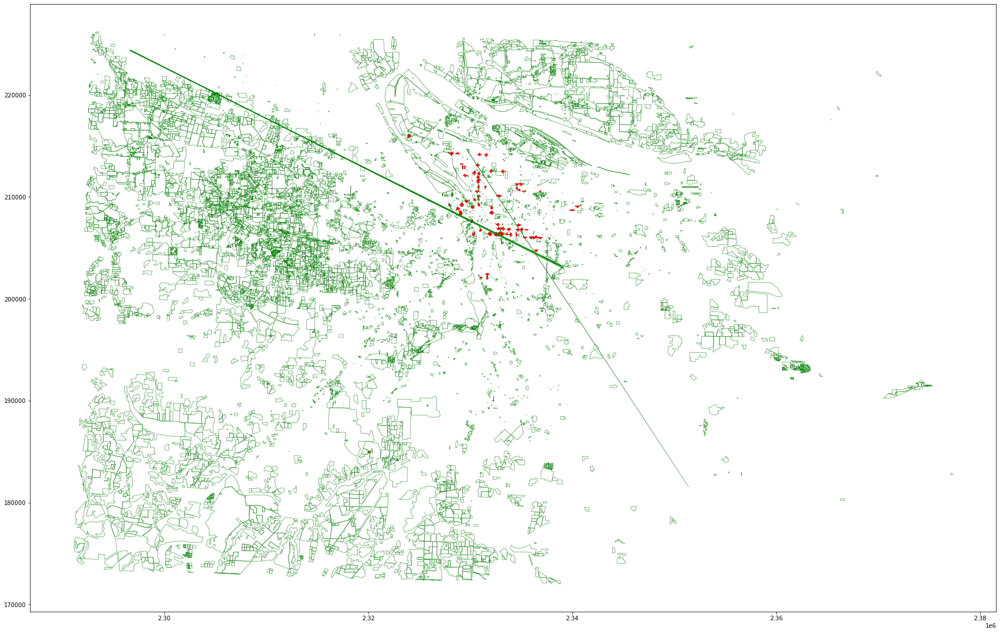

In [78]:
fig, ax = plt.subplots(figsize = (30,25)) 
gdf1.plot(ax=ax,color="red")
luse_proj.geometry.boundary.plot(color="green",edgecolor='k',linewidth = 0.5,ax=ax) #Use your second dataframe

# Now clip landuse with buffer

In [79]:
import os 
from shapely.geometry import Point
from geopandas import GeoDataFrame, read_file
from geopandas.tools import overlay

In [80]:
#!pip install Rtree
#!pip install pygeos
#!pip install ujson
#!pip install wheel

In [81]:
#luse_proj.exterior.type

In [82]:
#gdf1.exterior.type

In [83]:
#luse_proj.exterior.is_valid

In [84]:
#gdf1.exterior.is_valid

In [85]:
# Avoid this error- TopologyException: Input geom 0 is invalid: Self-intersection at 2307899.6553931381 208383.49467431975. Do the followings
luse_proj["geometry2"]=luse_proj.geometry.buffer(0)
# Now drop geometry column and rename geometry 2 equal to geometry again
luse_proj=luse_proj.drop(["geometry"],axis=1)
luse_proj.rename({'geometry2': 'geometry'}, axis=1, inplace=True)
luse_proj.head(5)

,osm_id,name,type,geometry
0,23625119,Lady Island,industrial,"POLYGON ((2348315.732 213851.353, 2348392.904 ..."
1,24000302,None,grass,"POLYGON ((2316254.380 207136.871, 2316258.462 ..."
2,25822078,Intel Ronler Acres Campus,industrial,"POLYGON ((2310592.897 212191.562, 2310593.718 ..."
3,25822108,None,industrial,"POLYGON ((2312154.540 211731.603, 2312173.766 ..."
4,25822220,Dawson Creek,residential,"POLYGON ((2310534.979 210818.533, 2310304.726 ..."


In [86]:
# Clip the data using GeoPandas clip
buffer_clip = gpd.clip(luse_proj, gdf1)
buffer_clip.head(5)

,osm_id,name,type,geometry
107,39336078,Jesuit Volunteer Community Garden,community_garden,"POLYGON ((2330872.175 211661.559, 2330871.728 ..."
108,39338233,Fargo Forest Garden,community_garden,"POLYGON ((2330855.579 211101.024, 2330855.114 ..."
109,39412221,None,grass,"POLYGON ((2330814.337 210841.974, 2330813.226 ..."
114,39636203,None,brownfield,"POLYGON ((2330805.283 210566.475, 2330722.532 ..."
116,39704707,Rose City Cemetery,cemetery,"POLYGON ((2335123.305 211283.566, 2334908.892 ..."


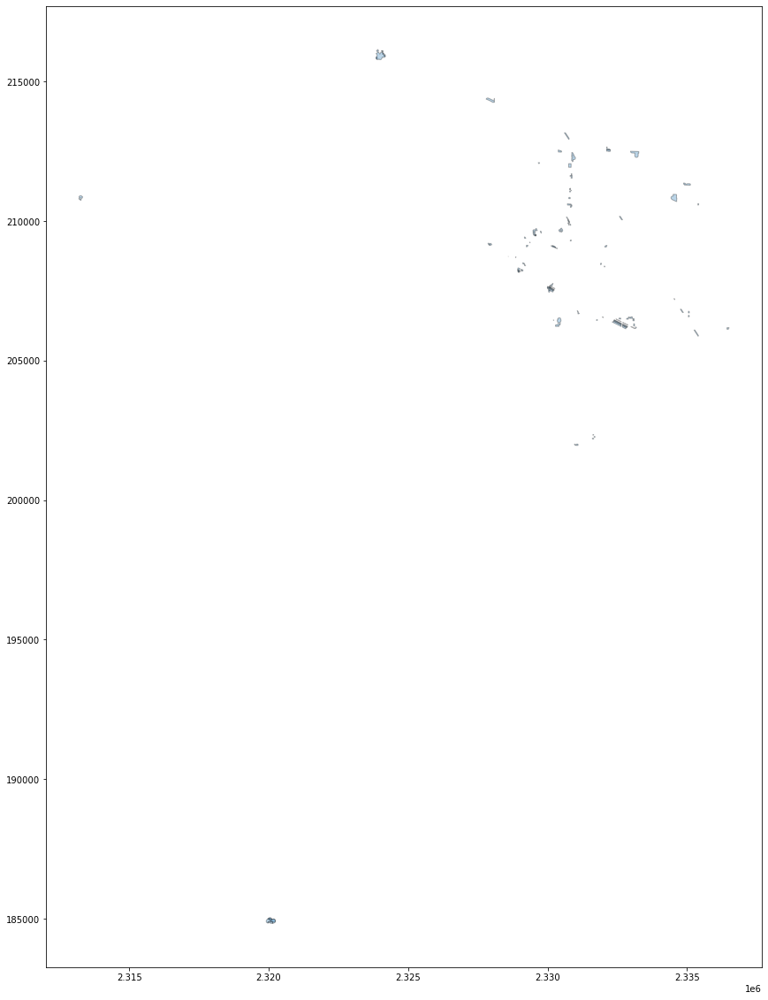

In [87]:
ax = buffer_clip.plot(figsize=(20, 20), alpha=0.3, edgecolor='k')

# Intersect the clipped area with Buffer ID

In [88]:
 intdata=gpd.overlay(gdf1, buffer_clip, how='intersection', make_valid=True, keep_geom_type=False)
 intdata.head(5)

,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,latitude,longitude,comment,osm_id_sensor,buff_dist,buffer_area,osm_id,name,type,geometry
0,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,45.513830,-122.672840,NaN,681301893.0,0.1,0.016902,70077736,None,industrial,"MULTIPOLYGON (((2330053.985 207624.839, 233005..."
1,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,45.513187,-122.671210,NaN,689032191.0,0.1,0.016412,70077736,None,industrial,"MULTIPOLYGON (((2330004.989 207649.379, 233000..."
2,S102POR,SE CLINTON ST E of 15TH AVE,short-term,2019,Portland,1.0,975.957839,82.849315,60.917808,2716.0,45.503489,-122.650504,NaN,113734584.0,0.1,0.040415,70077736,None,industrial,"POLYGON ((2331964.506 206558.200, 2331970.301 ..."
3,S103POR,SE CLINTON ST W of 22ND AVE,short-term,2019,Portland,1.0,1165.168973,98.150685,73.780822,2671.0,45.503390,-122.643795,NaN,163652165.0,0.1,0.037923,70077736,None,industrial,"MULTIPOLYGON (((2332650.986 206317.326, 233265..."
4,S105POR,SE CLINTON ST E of 22ND AVE,short-term,2019,Portland,1.0,1537.515086,97.671233,73.246575,2558.0,45.503390,-122.643406,NaN,163652165.0,0.1,0.037923,70077736,None,industrial,"MULTIPOLYGON (((2332650.986 206317.326, 233265..."


In [89]:
intdata["Area"]=intdata["geometry"].area*10.76 # in ft2
intdata.head(5)

,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,longitude,comment,osm_id_sensor,buff_dist,buffer_area,osm_id,name,type,geometry,Area
0,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,-122.672840,NaN,681301893.0,0.1,0.016902,70077736,None,industrial,"MULTIPOLYGON (((2330053.985 207624.839, 233005...",86977.062529
1,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,-122.671210,NaN,689032191.0,0.1,0.016412,70077736,None,industrial,"MULTIPOLYGON (((2330004.989 207649.379, 233000...",206693.863455
2,S102POR,SE CLINTON ST E of 15TH AVE,short-term,2019,Portland,1.0,975.957839,82.849315,60.917808,2716.0,...,-122.650504,NaN,113734584.0,0.1,0.040415,70077736,None,industrial,"POLYGON ((2331964.506 206558.200, 2331970.301 ...",1060.123701
3,S103POR,SE CLINTON ST W of 22ND AVE,short-term,2019,Portland,1.0,1165.168973,98.150685,73.780822,2671.0,...,-122.643795,NaN,163652165.0,0.1,0.037923,70077736,None,industrial,"MULTIPOLYGON (((2332650.986 206317.326, 233265...",310024.992606
4,S105POR,SE CLINTON ST E of 22ND AVE,short-term,2019,Portland,1.0,1537.515086,97.671233,73.246575,2558.0,...,-122.643406,NaN,163652165.0,0.1,0.037923,70077736,None,industrial,"MULTIPOLYGON (((2332650.986 206317.326, 233265...",310024.992606


#https://geopandas.org/docs/user_guide/set_operations.html

In [90]:
#intdata.plot(figsize=(20, 20),alpha=0.5, edgecolor='k', cmap='tab10')

# Aggregate data by ID

#https://geopandas.org/docs/user_guide/aggregation_with_dissolve.html

In [91]:
output_landuse=intdata.groupby(by=['osm_id_sensor','type'])['Area'].sum().reset_index()
output_landuse.columns=['osm_id','type','Area']
output_landuse.head()

,osm_id,type,Area
0,5522164.0,commercial,31521.392073
1,5522164.0,construction,13095.788662
2,5528173.0,grass,42383.610729
3,5528173.0,railway,14545.131226
4,5528173.0,residential,124532.594767


In [92]:
# Calculate commercial area
commercial  = intdata[intdata['type'].str.contains('commercial')]
output_commercial = commercial  .groupby(by=['osm_id_sensor'])['Area'].sum().reset_index()
output_commercial.columns=['osm_id','Commercial Area ']
output_commercial.head()

,osm_id,Commercial Area
0,5522164.0,31521.392073
1,66788465.0,28675.826856
2,124817127.0,58649.373696
3,126306263.0,59216.956860
4,319200607.0,74090.796353


In [93]:
output_commercial.shape

(10, 2)

In [94]:
gdf1.head()

,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,latitude,longitude,comment,osm_id_sensor,buff_dist,geometry,buffer_area
6,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,45.513830,-122.672840,NaN,681301893.0,0.1,"POLYGON ((2330172.222 207506.153, 2330166.339 ...",0.016902
13,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,45.513187,-122.671210,NaN,689032191.0,0.1,"POLYGON ((2330200.170 207486.701, 2330199.987 ...",0.016412
20,P003POR,"SW MOODY AVE, WEST SIDE CYCLE TRACK",permanent,2019,Portland,1.0,1346.261310,98.109589,59.917808,5466.0,45.501340,-122.671970,NaN,322079535.0,0.1,"POLYGON ((2330307.399 206134.278, 2330306.785 ...",0.023266
34,P005POR,BROADWAY BR north side,permanent,2019,Portland,1.0,1182.406584,120.712329,82.164384,8077.0,45.532870,-122.672270,NaN,126306263.0,0.1,"POLYGON ((2330534.866 209693.570, 2330537.632 ...",0.017055
41,P006POR,BROADWAY BR south side,permanent,2019,Portland,2.0,984.694490,91.246575,61.273973,10649.0,45.532780,-122.672424,NaN,422121256.0,0.1,"POLYGON ((2330534.866 209693.570, 2330537.632 ...",0.017055


<AxesSubplot:>

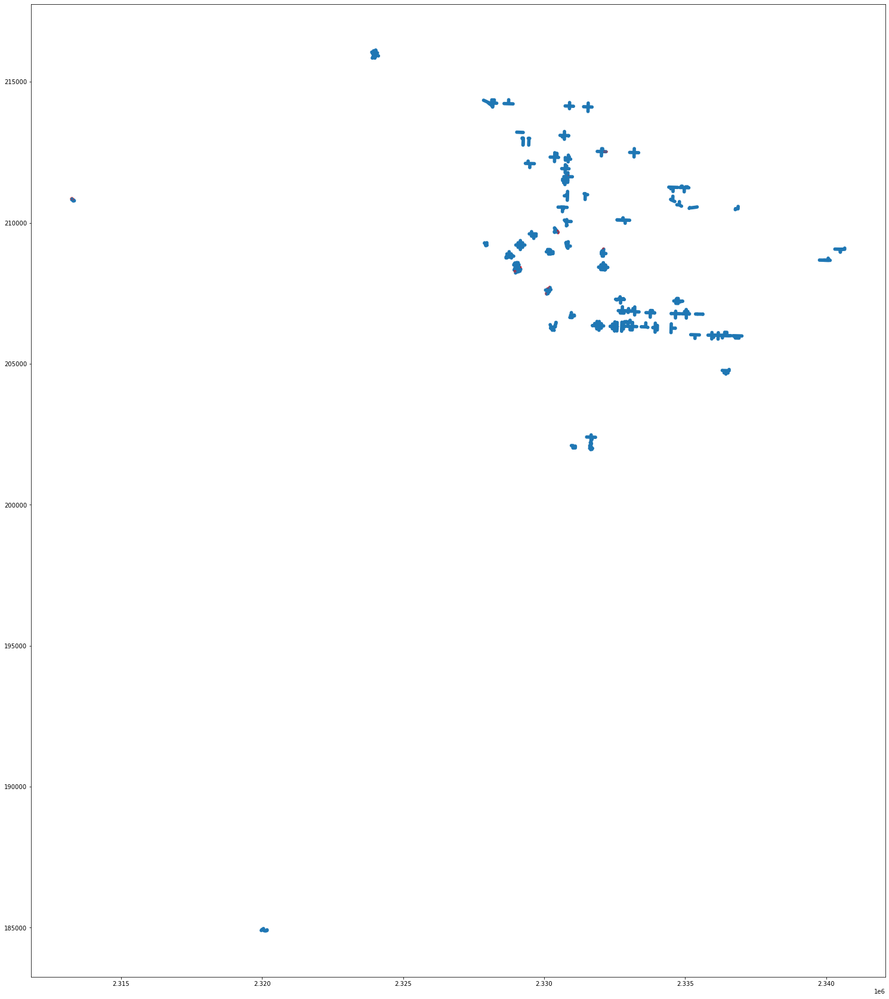

In [95]:
#plotting    
ax = gdf1.plot(figsize=(40, 30))
commercial.geometry.boundary.plot(color="red",edgecolor='k',linewidth = 0.5,ax=ax)

In [96]:
# Calculate inductrial area
industrial  = intdata[intdata['type'].str.contains('industrial')]
output_industrial = industrial  .groupby(by=['osm_id_sensor'])['Area'].sum().reset_index()
output_industrial.columns=['osm_id','Industrial Area ']
output_industrial.head()

,osm_id,Industrial Area
0,113734584.0,1060.123701
1,124817127.0,3137.980547
2,158914564.0,355211.259100
3,163652165.0,626357.051938
4,580026295.0,2397.252124


In [97]:
# Calculate residential area
residential  = intdata[intdata['type'].str.contains('residential')]
output_residential = residential.groupby(by=['osm_id_sensor'])['Area'].sum().reset_index()
output_residential.columns=['osm_id','Residential_Area ']
output_residential.head()

,osm_id,Residential_Area
0,5528173.0,124532.594767
1,33665960.0,25125.120938
2,68675284.0,20463.720428
3,107599062.0,663842.319576
4,117148066.0,398576.738933


In [98]:
residential.head(5)

,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,longitude,comment,osm_id_sensor,buff_dist,buffer_area,osm_id,name,type,geometry,Area
31,P008POR,STEEL BR upper sidewalk north side,permanent,2019,Portland,1.0,199.528105,11.630137,9.232877,12846.0,...,-122.672890,NaN,348027809.0,0.1,0.028719,421660585,The Yards at Union Station,residential,"POLYGON ((2330190.232 209111.930, 2330194.268 ...",22738.635931
34,P011POR,Sellwood Bridge both sides,permanent,2019,Portland,3.0,718.697055,102.698630,39.739726,4340.0,...,-122.661174,can't separate bridge sides in OSM,595610339.0,0.1,0.016167,486713745,Sellwood Harbor,residential,"POLYGON ((2331015.797 201956.346, 2331013.882 ...",13235.159034
39,P014POR,Tonquin Trail north,permanent,2019,Portland,3.0,48.817773,0.397260,0.054795,262.0,...,-122.797430,NaN,107599062.0,0.1,0.018065,472038151,Arbor Villebois,residential,"POLYGON ((2320130.946 184965.810, 2320135.646 ...",332986.760015
40,P014POR,Tonquin Trail north,permanent,2019,Portland,3.0,48.817773,0.397260,0.054795,262.0,...,-122.797430,NaN,107599062.0,0.1,0.018065,476858411,None,residential,"POLYGON ((2320130.946 184965.810, 2320135.646 ...",275761.257070
41,P014POR,Tonquin Trail north,permanent,2019,Portland,3.0,48.817773,0.397260,0.054795,262.0,...,-122.797430,NaN,107599062.0,0.1,0.018065,529088986,Polygon at Villebois,residential,"POLYGON ((2320017.435 185017.485, 2320022.409 ...",55094.302491


<AxesSubplot:>

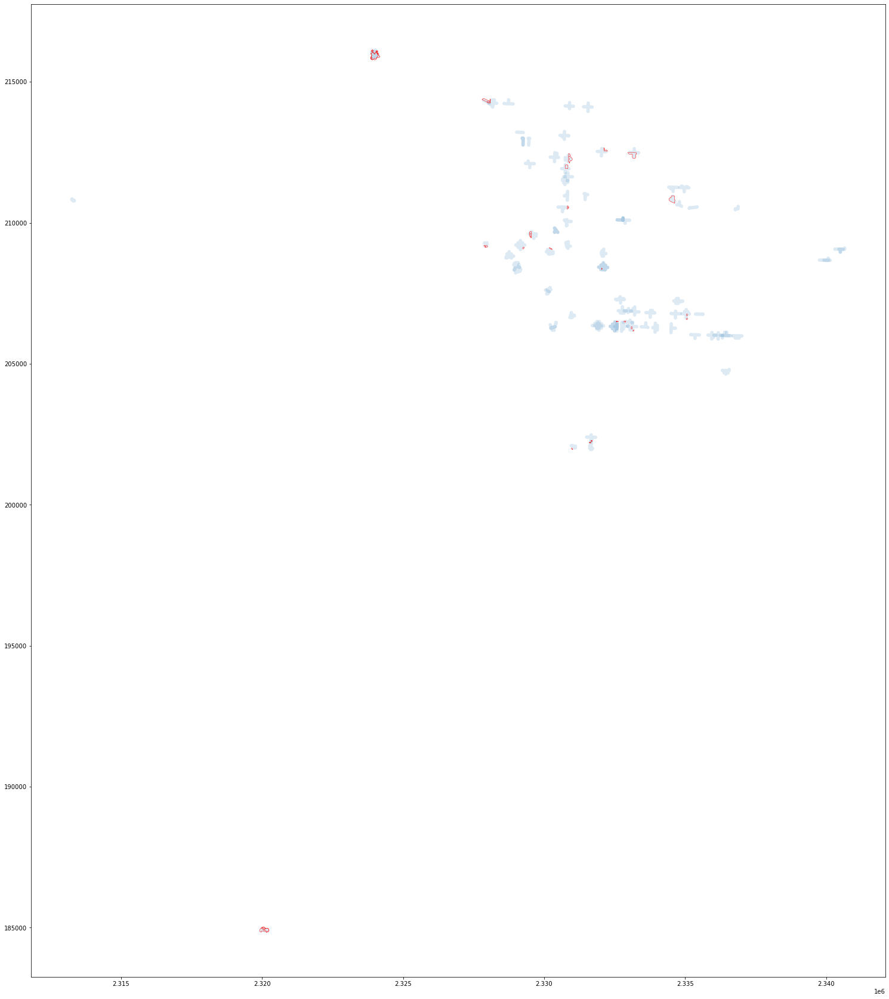

In [99]:
#plotting    
ax = gdf1.plot(figsize=(40, 30),alpha=0.15)
residential.geometry.boundary.plot(color="red",edgecolor='k',linewidth = 0.5,ax=ax)

In [100]:
# Calculate retail area
retail  = intdata[intdata['type'].str.contains('retail')]
output_retail = retail.groupby(by=['osm_id_sensor'])['Area'].sum().reset_index()
output_retail.columns=['osm_id','Retail Area']
output_retail.head()

,osm_id,Retail Area
0,44793234.0,10621.628344
1,117036270.0,87020.427048
2,117058402.0,86235.341690
3,117155127.0,34958.150828
4,119415862.0,63497.238656


In [101]:
output_retail.shape

(13, 2)

In [102]:
# Calculate grass area
grass  = intdata[intdata['type'].str.contains('grass')]
output_grass = grass.groupby(by=['osm_id_sensor'])['Area'].sum().reset_index()
output_grass.columns=['osm_id','Grass Area']
output_grass.head()

,osm_id,Grass Area
0,5528173.0,42383.610729
1,68675284.0,62201.735298
2,117058378.0,38594.888889
3,126306263.0,39191.614469
4,156121087.0,9077.285372


# Use the Natural Shape file to calculate the Park, water and green spaces

In [103]:
#nature=gpd.read_file("../input/osm-data/natural.shp")
nature.head(5)

,osm_id,name,type,geometry
0,4946908,Johnson Lake,water,"POLYGON ((-122.56649 45.56608, -122.56653 45.5..."
1,4946909,None,water,"POLYGON ((-122.59824 45.57255, -122.59823 45.5..."
2,4946910,None,water,"POLYGON ((-122.61278 45.57436, -122.61274 45.5..."
3,4946943,None,water,"POLYGON ((-122.58331 45.56990, -122.58320 45.5..."
4,4946969,None,water,"POLYGON ((-122.54781 45.56336, -122.54810 45.5..."


In [104]:
# set the co-ordinate system first
# nature = nature.set_crs("EPSG:4326")
# Let's take a copy of our layer
nature_proj = nature.copy()

# Reproject the geometries by replacing the values with projected ones
nature_proj = nature_proj.to_crs(epsg=2838)
nature_proj.head(5)

,osm_id,name,type,geometry
0,4946908,Johnson Lake,water,"POLYGON ((2338708.334 213130.725, 2338705.232 ..."
1,4946909,None,water,"POLYGON ((2336249.035 213912.791, 2336249.987 ..."
2,4946910,None,water,"POLYGON ((2335119.556 214144.065, 2335122.656 ..."
3,4946943,None,water,"POLYGON ((2337406.144 213587.835, 2337415.023 ..."
4,4946969,None,water,"POLYGON ((2340158.194 212791.429, 2340135.944 ..."


In [105]:
#nature_proj.plot()

<AxesSubplot:>

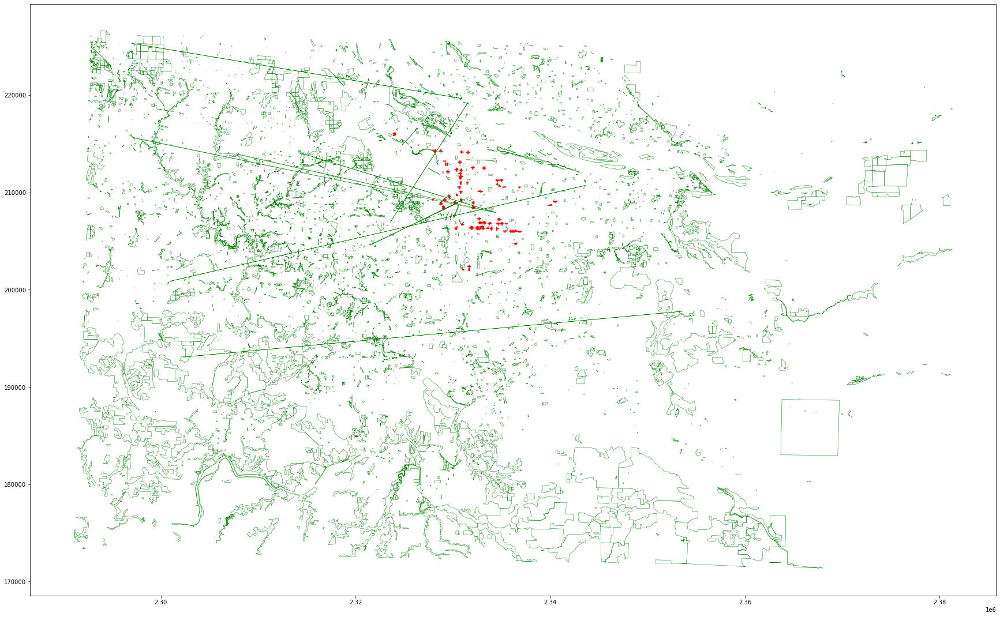

In [106]:
fig, ax = plt.subplots(figsize = (30,25)) 
gdf1.plot(ax=ax,color="red")
nature_proj.geometry.boundary.plot(color="green",edgecolor='k',linewidth = 0.5,ax=ax) #Use your second dataframe

# There is some invalid polygon in the shape file that need to pass through zero geom to correct it

In [107]:
nature_proj["geometry2"]=nature_proj.geometry.buffer(0)
nature_proj.head(5)

,osm_id,name,type,geometry,geometry2
0,4946908,Johnson Lake,water,"POLYGON ((2338708.334 213130.725, 2338705.232 ...","POLYGON ((2338708.334 213130.725, 2338705.232 ..."
1,4946909,None,water,"POLYGON ((2336249.035 213912.791, 2336249.987 ...","POLYGON ((2336249.035 213912.791, 2336249.987 ..."
2,4946910,None,water,"POLYGON ((2335119.556 214144.065, 2335122.656 ...","POLYGON ((2335119.556 214144.065, 2335122.656 ..."
3,4946943,None,water,"POLYGON ((2337406.144 213587.835, 2337415.023 ...","POLYGON ((2337406.144 213587.835, 2337415.023 ..."
4,4946969,None,water,"POLYGON ((2340158.194 212791.429, 2340135.944 ...","POLYGON ((2340158.194 212791.429, 2340135.944 ..."


In [108]:
# Now drop geometry column and rename geometry 2 equal to geometry again
nature_proj1=nature_proj.drop(["geometry"],axis=1)
nature_proj1.head(5)

,osm_id,name,type,geometry2
0,4946908,Johnson Lake,water,"POLYGON ((2338708.334 213130.725, 2338705.232 ..."
1,4946909,None,water,"POLYGON ((2336249.035 213912.791, 2336249.987 ..."
2,4946910,None,water,"POLYGON ((2335119.556 214144.065, 2335122.656 ..."
3,4946943,None,water,"POLYGON ((2337406.144 213587.835, 2337415.023 ..."
4,4946969,None,water,"POLYGON ((2340158.194 212791.429, 2340135.944 ..."


In [109]:
nature_proj1.rename({'geometry2': 'geometry'}, axis=1, inplace=True)
nature_proj1.head(5)

,osm_id,name,type,geometry
0,4946908,Johnson Lake,water,"POLYGON ((2338708.334 213130.725, 2338705.232 ..."
1,4946909,None,water,"POLYGON ((2336249.035 213912.791, 2336249.987 ..."
2,4946910,None,water,"POLYGON ((2335119.556 214144.065, 2335122.656 ..."
3,4946943,None,water,"POLYGON ((2337406.144 213587.835, 2337415.023 ..."
4,4946969,None,water,"POLYGON ((2340158.194 212791.429, 2340135.944 ..."


In [110]:
# Clip the data using GeoPandas clip
buffer_clip_nature = gpd.clip(nature_proj1, gdf1)
buffer_clip_nature.head(10)

,osm_id,name,type,geometry
28,25709381,Irving Park,park,"POLYGON ((2331474.714 211087.184, 2331474.841 ..."
32,26174736,Rock Creek Greenway,park,"POLYGON ((2313307.825 210807.243, 2313335.033 ..."
33,26174764,Rock Creek Park,park,"POLYGON ((2313283.536 210779.089, 2313286.829 ..."
43,27401099,Governor Tom McCall Waterfront Park,park,"POLYGON ((2330185.866 207568.183, 2330151.882 ..."
52,29396952,Couch Park,park,"POLYGON ((2328756.969 208980.666, 2328756.859 ..."
68,32734883,None,park,"POLYGON ((2319969.126 184977.363, 2319996.593 ..."
71,33007656,Arbor Lodge Park,park,"POLYGON ((2328788.945 214214.725, 2328891.030 ..."
74,33047107,Gammans Park,park,"POLYGON ((2328755.092 214370.579, 2328756.665 ..."
89,33090106,Dawson Park,park,"POLYGON ((2330766.335 210862.929, 2330767.282 ..."
125,39365891,Piccolo Park,park,"POLYGON ((2332901.790 206372.951, 2332902.218 ..."


In [111]:
inter_nature=gpd.overlay(gdf1, buffer_clip_nature, how='intersection', make_valid=True, keep_geom_type=False)
inter_nature.head(5)

,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,latitude,longitude,comment,osm_id_sensor,buff_dist,buffer_area,osm_id,name,type,geometry
0,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,45.513830,-122.67284,NaN,681301893.0,0.1,0.016902,27401099,Governor Tom McCall Waterfront Park,park,"POLYGON ((2330222.750 207762.415, 2330228.497 ..."
1,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,45.513187,-122.67121,NaN,689032191.0,0.1,0.016412,27401099,Governor Tom McCall Waterfront Park,park,"POLYGON ((2330175.063 207622.716, 2330200.178 ..."
2,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,45.513830,-122.67284,NaN,681301893.0,0.1,0.016902,68711372,Koehnke Reservoir,water,"POLYGON ((2330067.026 207586.860, 2330299.959 ..."
3,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,45.513187,-122.67121,NaN,689032191.0,0.1,0.016412,68711372,Koehnke Reservoir,water,"POLYGON ((2330008.718 207573.343, 2330008.668 ..."
4,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,45.513830,-122.67284,NaN,681301893.0,0.1,0.016902,117446026,Salmon Street Springs,water,"POLYGON ((2330229.772 207719.085, 2330230.490 ..."


In [112]:
inter_nature["Area"]=inter_nature["geometry"].area*10.76 # in ft2
inter_nature.head(5)

,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,longitude,comment,osm_id_sensor,buff_dist,buffer_area,osm_id,name,type,geometry,Area
0,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,-122.67284,NaN,681301893.0,0.1,0.016902,27401099,Governor Tom McCall Waterfront Park,park,"POLYGON ((2330222.750 207762.415, 2330228.497 ...",143244.657823
1,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,-122.67121,NaN,689032191.0,0.1,0.016412,27401099,Governor Tom McCall Waterfront Park,park,"POLYGON ((2330175.063 207622.716, 2330200.178 ...",35629.472861
2,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,-122.67284,NaN,681301893.0,0.1,0.016902,68711372,Koehnke Reservoir,water,"POLYGON ((2330067.026 207586.860, 2330299.959 ...",11114.563373
3,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,-122.67121,NaN,689032191.0,0.1,0.016412,68711372,Koehnke Reservoir,water,"POLYGON ((2330008.718 207573.343, 2330008.668 ...",8855.086859
4,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,-122.67284,NaN,681301893.0,0.1,0.016902,117446026,Salmon Street Springs,water,"POLYGON ((2330229.772 207719.085, 2330230.490 ...",2814.987292


<AxesSubplot:>

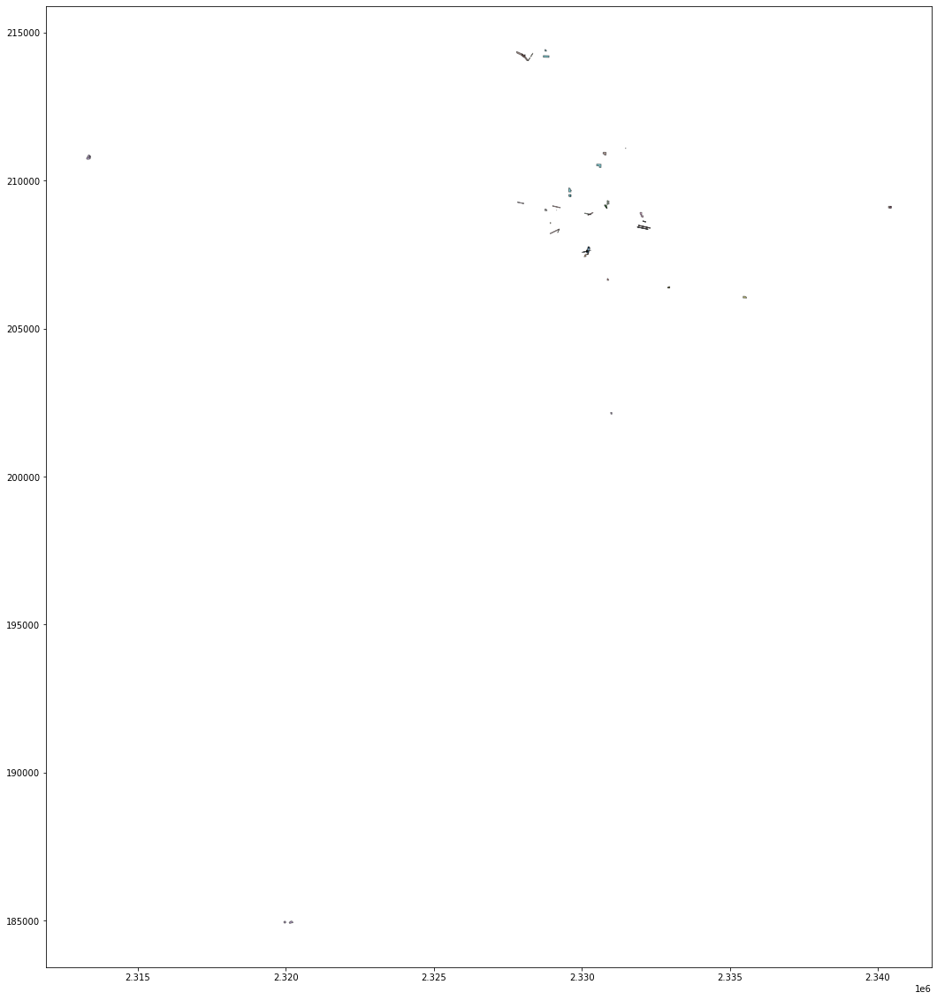

In [113]:
inter_nature.plot(figsize=(20, 20),alpha=0.5, edgecolor='k', cmap='tab10')

In [114]:
output_nature=inter_nature.groupby(by=['osm_id_sensor','type'])['Area'].sum().reset_index()
output_nature.head()

,osm_id_sensor,type,Area
0,5522164.0,park,4119.733425
1,5528173.0,park,130941.286788
2,5528173.0,water,5410.948540
3,5532192.0,park,22777.973803
4,5542210.0,park,51737.348237


In [115]:
# Calculate park area
park  = inter_nature[inter_nature['type'].str.contains('park')]
output_park = park.groupby(by=['osm_id_sensor'])['Area'].sum().reset_index()
output_park.columns=['osm_id',"Park Area"]
output_park.head()

,osm_id,Park Area
0,5522164.0,4119.733425
1,5528173.0,130941.286788
2,5532192.0,22777.973803
3,5542210.0,51737.348237
4,66788465.0,72326.244823


In [116]:
# Calculate water area
water  = inter_nature[inter_nature['type'].str.contains('water')]
output_water= water.groupby(by=['osm_id_sensor'])['Area'].sum().reset_index()
output_water.columns=['osm_id',"Water Area"]
output_water.head()

,osm_id,Water Area
0,5528173.0,5410.948540
1,33665960.0,25031.274940
2,125433000.0,13857.300092
3,348027809.0,15961.327018
4,410340709.0,13851.287595


In [117]:
# Calculate forest area
forest  = inter_nature[inter_nature['type'].str.contains('forest')]
output_forest= forest.groupby(by=['osm_id_sensor'])['Area'].sum().reset_index()
output_forest.columns=['osm_id',"Forest Area"]
output_forest.head()

,osm_id,Forest Area
0,124817127.0,31058.222644
1,156121087.0,51782.045771
2,348027809.0,18171.074198
3,681301893.0,21551.322561
4,689032191.0,30011.738163


# Use the Point Shape file to calculate the Bicycle parking, Bus/Train stops, Intersection Density, School/College/University

In [118]:
#pts=gpd.read_file("../input/osm-data/points.shp")
pts.head(5)

,osm_id,timestamp,name,type,geometry
0,27195852,None,None,traffic_signals,POINT (-122.86756 45.54089)
1,27199958,None,None,turning_circle,POINT (-122.88963 45.53199)
2,27266177,None,None,traffic_signals,POINT (-122.90523 45.53771)
3,27266267,None,None,traffic_signals,POINT (-122.88852 45.53605)
4,27273304,None,None,traffic_signals,POINT (-122.86309 45.53985)


In [119]:
# set the co-ordinate system first
#pts = pts.set_crs("EPSG:4326")
# Let's take a copy of our layer
pts_proj = pts.copy()

# Reproject the geometries by replacing the values with projected ones
pts_proj = pts_proj.to_crs(epsg=2838)
pts_proj.head(10)

,osm_id,timestamp,name,type,geometry
0,27195852,None,None,traffic_signals,POINT (2315133.607 210977.179)
1,27199958,None,None,turning_circle,POINT (2313381.281 210038.384)
2,27266177,None,None,traffic_signals,POINT (2312182.520 210710.249)
3,27266267,None,None,traffic_signals,POINT (2313480.859 210487.402)
4,27273304,None,None,traffic_signals,POINT (2315478.452 210851.497)
5,27273312,None,None,motorway_junctio,POINT (2316667.977 210195.033)
6,27286351,None,None,turning_circle,POINT (2313129.135 210018.110)
7,27295030,None,None,traffic_signals,POINT (2315078.793 211079.005)
8,27526549,None,None,traffic_signals,POINT (2319700.554 209076.831)
9,27526559,None,None,traffic_signals,POINT (2320938.111 208077.599)


<AxesSubplot:>

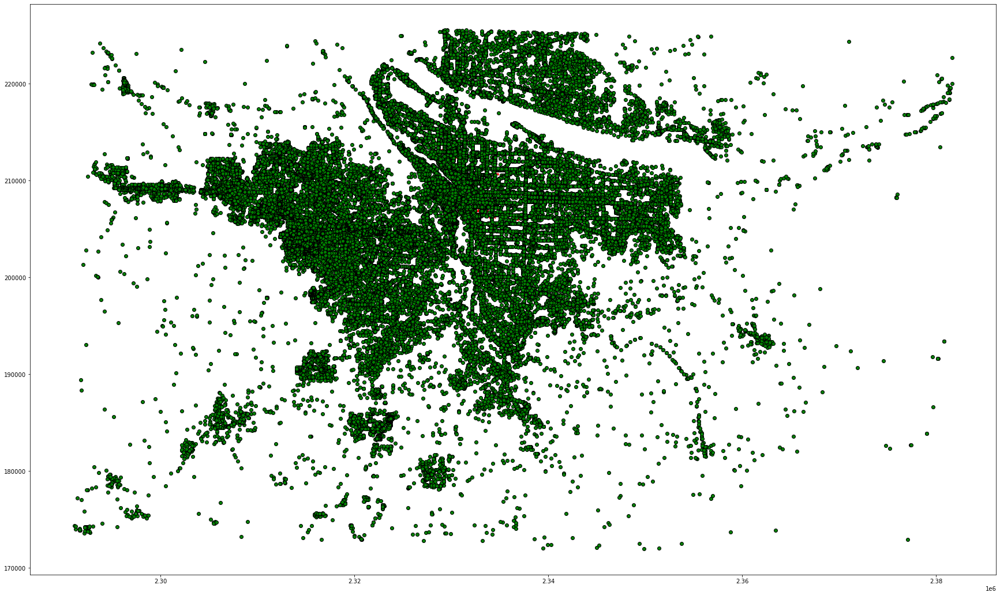

In [120]:
fig, ax = plt.subplots(figsize = (30,25)) 
gdf1.plot(ax=ax,color="red")
pts_proj.plot(color="green",edgecolor='k',ax=ax) #Use your second dataframe

In [121]:
# Clip the data using GeoPandas clip
buffer_clip_pts = gpd.clip(pts_proj, gdf1)
buffer_clip_pts.head(10)

,osm_id,timestamp,name,type,geometry
5855,40379032,None,None,motorway_junctio,POINT (2329189.774 209066.955)
5873,40380595,None,None,traffic_signals,POINT (2330097.772 207508.987)
5874,40380619,None,None,crossing,POINT (2330166.584 207550.480)
5902,40382689,None,None,traffic_signals,POINT (2330080.872 207682.204)
5974,40389148,None,None,crossing,POINT (2330732.464 209297.624)
5975,40389154,None,None,traffic_signals,POINT (2330733.095 209307.446)
5976,40389157,None,None,traffic_signals,POINT (2330744.489 209331.109)
5986,40390514,None,None,stop,POINT (2327971.495 209213.523)
5989,40390827,None,None,stop,POINT (2332115.218 209062.242)
6104,40401002,None,None,switch,POINT (2329015.338 208466.964)


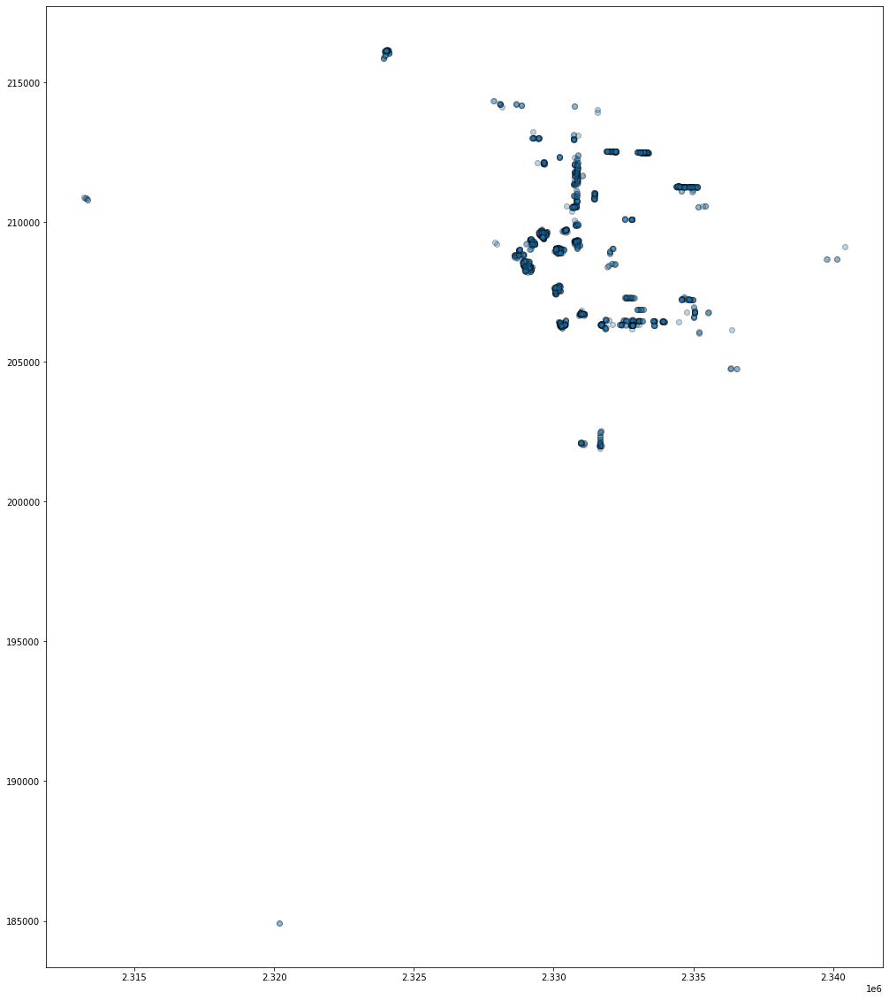

In [122]:
ax = buffer_clip_pts.plot(figsize=(20, 20), alpha=0.3, edgecolor='k')

In [123]:
inter_pts=gpd.overlay(gdf1, buffer_clip_pts, how='intersection', make_valid=True, keep_geom_type=False)
inter_pts.head(5)

,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,longitude,comment,osm_id_sensor,buff_dist,buffer_area,osm_id,timestamp,name,type,geometry
0,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,-122.67284,NaN,681301893.0,0.1,0.016902,40380619,None,None,crossing,POINT (2330166.584 207550.480)
1,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,-122.67121,NaN,689032191.0,0.1,0.016412,40380619,None,None,crossing,POINT (2330166.584 207550.480)
2,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,-122.67284,NaN,681301893.0,0.1,0.016902,40382689,None,None,traffic_signals,POINT (2330080.872 207682.204)
3,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,-122.67284,NaN,681301893.0,0.1,0.016902,40641464,None,None,traffic_signals,POINT (2330232.127 207539.923)
4,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,-122.67121,NaN,689032191.0,0.1,0.016412,40641464,None,None,traffic_signals,POINT (2330232.127 207539.923)


# Calculate the bicycle parking

In [124]:
#k1 = df.loc[(df.Product == p_id) & (df.Time >= start_time) & (df.Time < end_time), ['Time', 'Product']]
b_parking = inter_pts[inter_pts['type'].str.contains('bicycle_parking')]
b_parking.head(5)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,longitude,comment,osm_id_sensor,buff_dist,buffer_area,osm_id,timestamp,name,type,geometry
28,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,-122.67284,NaN,681301893.0,0.1,0.016902,-1787579107,None,None,bicycle_parking,POINT (2330217.917 207694.457)
39,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,-122.67284,NaN,681301893.0,0.1,0.016902,-435056229,None,None,bicycle_parking,POINT (2330061.204 207652.461)
40,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,-122.67121,NaN,689032191.0,0.1,0.016412,-435056229,None,None,bicycle_parking,POINT (2330061.204 207652.461)
67,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,-122.67121,NaN,689032191.0,0.1,0.016412,-435056342,None,None,bicycle_parking,POINT (2330042.597 207624.435)
69,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,-122.67121,NaN,689032191.0,0.1,0.016412,-435056340,None,None,bicycle_parking,POINT (2330037.132 207626.395)


In [125]:
output_bparking=b_parking.groupby(by=['osm_id_sensor'])['type'].count().reset_index()
output_bparking.columns=["osm_id","Bicycle Parking"]
output_bparking.head()

,osm_id,Bicycle Parking
0,5522164.0,8
1,5528173.0,53
2,5529833.0,1
3,33665960.0,8
4,44793234.0,4


# Calculate bus stops

In [126]:
transit_stops= inter_pts[inter_pts['type'].str.contains('bus_stop')]
transit_stops.head(5)

,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,longitude,comment,osm_id_sensor,buff_dist,buffer_area,osm_id,timestamp,name,type,geometry
63,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,-122.671210,NaN,689032191.0,0.1,0.016412,1525820922,None,Southwest Madison & 1st,bus_stop,POINT (2330023.035 207619.537)
414,P007POR,STEEL BR upper sidewalk south side,permanent,2019,Portland,2.0,54.416558,4.301370,2.630137,7214.0,...,-122.667300,NaN,156121087.0,0.1,0.024263,-1054824084,None,Rose Quarter Transit Center,bus_stop,POINT (2330804.058 209333.313)
419,P007POR,STEEL BR upper sidewalk south side,permanent,2019,Portland,2.0,54.416558,4.301370,2.630137,7214.0,...,-122.667300,NaN,156121087.0,0.1,0.024263,-1176207469,None,North Interstate & Rose Quarter TC,bus_stop,POINT (2330809.450 209295.458)
471,P008POR,STEEL BR upper sidewalk north side,permanent,2019,Portland,1.0,199.528105,11.630137,9.232877,12846.0,...,-122.672890,NaN,348027809.0,0.1,0.028719,1525852648,None,Northwest Glisan & 3rd,bus_stop,POINT (2330202.368 208991.181)
572,P010POR,Tilikum Crossing north side,permanent,2019,Portland,1.0,842.195238,54.643836,32.301370,4860.0,...,-122.664111,NaN,334030006.0,0.1,0.021220,-538177848,None,OMSI/Southeast Water,bus_stop,POINT (2330983.720 206721.488)


In [127]:
output_bstop=transit_stops.groupby(by=['osm_id_sensor'])['type'].count().reset_index()
output_bstop.columns=["osm_id","Bus Stops"]
output_bstop.head()

,osm_id,Bus Stops
0,5522164.0,8
1,5529700.0,3
2,5542408.0,2
3,68675284.0,4
4,117032389.0,2


# Calculate school/college/university

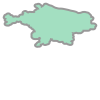

In [128]:
#sc= inter_pts[inter_pts['type'].str.contains('school|college')]
#sc
# convert to unprojected polygon for osmnx data pull
polygon = pba.to_crs(4326).iloc[0]
polygon

In [129]:
# Import school
tags = {'amenity': 'school'}
scl = ox.geometries_from_polygon(polygon, tags)
#scl[['amenity', 'name', 'geometry']]

In [130]:
# set the co-ordinate system first
scl = scl.set_crs("EPSG:4326")
# Let's take a copy of our layer
scl_proj = scl.copy()

# Reproject the geometries by replacing the values with projected ones
scl_proj =scl_proj.to_crs(epsg=2838)
scl_proj.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,unique_id,osmid,element_type,geometry,wheelchair,addr:city,addr:housenumber,addr:postcode,addr:street,amenity,...,layer,url,female,landuse,proposed:name,source_ref,wikimedia_commons,opening_date,ways,type
0,node/251851260,251851260,node,POINT (2317192.851 203560.279),NaN,Beaverton,15760,97007,Southwest Davis Road,school,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,node/251851266,251851266,node,POINT (2315063.403 204701.392),NaN,Aloha,18380,97078,Southwest Kinnaman Road,school,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,node/251851270,251851270,node,POINT (2316311.783 205228.919),NaN,Aloha,16860,97078,Southwest Blanton Street,school,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,node/251851273,251851273,node,POINT (2313848.119 203248.398),NaN,Aloha,6750,97078,Southwest 198th Avenue,school,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,node/251851274,251851274,node,POINT (2319838.086 203960.126),NaN,Beaverton,5650,97005,Southwest Hall Boulevard,school,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [131]:
scl_proj['geometry']=scl_proj['geometry'].centroid
scl_proj.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,unique_id,osmid,element_type,geometry,wheelchair,addr:city,addr:housenumber,addr:postcode,addr:street,amenity,...,layer,url,female,landuse,proposed:name,source_ref,wikimedia_commons,opening_date,ways,type
0,node/251851260,251851260,node,POINT (2317192.851 203560.279),NaN,Beaverton,15760,97007,Southwest Davis Road,school,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,node/251851266,251851266,node,POINT (2315063.403 204701.392),NaN,Aloha,18380,97078,Southwest Kinnaman Road,school,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,node/251851270,251851270,node,POINT (2316311.783 205228.919),NaN,Aloha,16860,97078,Southwest Blanton Street,school,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,node/251851273,251851273,node,POINT (2313848.119 203248.398),NaN,Aloha,6750,97078,Southwest 198th Avenue,school,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,node/251851274,251851274,node,POINT (2319838.086 203960.126),NaN,Beaverton,5650,97005,Southwest Hall Boulevard,school,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [132]:
buffer_clip_scl = gpd.clip(scl_proj, gdf1)
inter_scl=gpd.overlay(gdf1, buffer_clip_scl, how='intersection', make_valid=True, keep_geom_type=False)
inter_scl.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,url,female,landuse,proposed:name,source_ref,wikimedia_commons,opening_date,ways,type,geometry
0,S022POR,N WILLIAMS AVE S of FAILING ST,short-term,2019,Portland,1.0,218.104397,109.958904,73.616438,6209.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,POINT (2330859.748 211570.336)
1,S158POR,SE WOODWARD ST W of 68TH AVE,short-term,2019,Portland,2.0,92.119444,15.849315,11.287671,915.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,POINT (2336374.024 206133.219)


In [133]:
scl_proj['geometry']=scl_proj['geometry'].centroid
buffer_clip_scl = gpd.clip(scl_proj, gdf1)
output_school=inter_scl.groupby(by=['osm_id_sensor'])['geometry'].count().reset_index()
output_school.columns=["osm_id","School"]
output_school.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,School
0,408436724.0,1
1,423040054.0,1


# Closest distance to school

In [134]:
def min_distance_ppoly(point, polygon):
    return polygon.distance(point).min()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [135]:
ecoshort['min_dist_to_school'] = ecoshort.geometry.apply(min_distance_ppoly, args=(scl_proj,))*3.28084
output_school_distance=ecoshort.loc[:,["osm_id_sensor","min_dist_to_school"]]
output_school_distance.columns=["osm_id","min_dist_to_school"]
output_school_distance=output_school_distance.drop_duplicates(subset=['osm_id'],keep='first')
output_school_distance.head()

,osm_id,min_dist_to_school
0,681301893.0,2262.300738
7,689032191.0,2643.824523
14,322079535.0,2034.205847
21,348027806.0,3179.337015
28,126306263.0,2417.444765


In [136]:
output_school_distance.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,min_dist_to_school
0,681301893.0,2262.300738
7,689032191.0,2643.824523
14,322079535.0,2034.205847
21,348027806.0,3179.337015
28,126306263.0,2417.444765


In [137]:
# Import college
tags = {'amenity': 'college'}
coll = ox.geometries_from_polygon(polygon, tags)
# set the co-ordinate system first
coll = coll.set_crs("EPSG:4326")
# Let's take a copy of our layer
coll_proj = coll.copy()

# Reproject the geometries by replacing the values with projected ones
coll_proj =coll_proj.to_crs(epsg=2838)
coll_proj['geometry']=coll_proj['geometry'].centroid
buffer_clip_coll = gpd.clip(coll_proj, gdf1)
inter_coll=gpd.overlay(gdf1, buffer_clip_coll, how='intersection', make_valid=True, keep_geom_type=False)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [138]:
output_college=inter_coll.groupby(by=['osm_id_sensor'])['geometry'].count().reset_index()
output_college.columns=["osm_id","college"]
output_college.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,college
0,334030020.0,1
1,423040054.0,1


In [139]:
output_college.shape

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


(2, 2)

# Closest distance to college

In [140]:
ecoshort['min_dist_to_college'] = ecoshort.geometry.apply(min_distance_ppoly, args=(coll_proj,))*3.28084
output_college_distance=ecoshort.loc[:,["osm_id_sensor","min_dist_to_college"]]
output_college_distance.columns=["osm_id","min_dist_to_college"]
output_college_distance=output_college_distance.drop_duplicates(subset=['osm_id'],keep='first')
output_college_distance.head()

,osm_id,min_dist_to_college
0,681301893.0,1384.844295
7,689032191.0,1766.482889
14,322079535.0,632.879498
21,348027806.0,2134.229233
28,126306263.0,2623.771633


In [143]:
# Import college
tags = {'amenity': 'university'}
uni = ox.geometries_from_polygon(polygon, tags)
# set the co-ordinate system first
uni = uni.set_crs("EPSG:4326")
# Let's take a copy of our layer
uni_proj = uni.copy()

# Reproject the geometries by replacing the values with projected ones
uni_proj =uni_proj.to_crs(epsg=2838)
uni_proj['geometry']=uni_proj['geometry'].centroid
buffer_clip_uni = gpd.clip(uni_proj, gdf1)
inter_uni=gpd.overlay(gdf1, buffer_clip_uni, how='intersection', make_valid=True, keep_geom_type=False)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [144]:
output_university=inter_uni.groupby(by=['osm_id_sensor'])['geometry'].count().reset_index()
#output_university.loc[output_university['geometry'] > 0, 'geometry'] = 1
#output_university.loc[output_university['geometry'] ==0, 'geometry'] = 0
output_university.columns=["osm_id","University"]
output_university.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,University


In [145]:
#scu=pd.concat([sc,u],axis=0)
#scu

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


# Closest distance to university

In [146]:
ecoshort['min_dist_to_university'] = ecoshort.geometry.apply(min_distance_ppoly, args=(uni_proj,))*3.28084
output_university_distance=ecoshort.loc[:,["osm_id_sensor","min_dist_to_university"]]
output_university_distance.columns=["osm_id","min_dist_to_university"]
output_university_distance=output_university_distance.drop_duplicates(subset=['osm_id'],keep='first')
output_university_distance.head()

,osm_id,min_dist_to_university
0,681301893.0,3131.276680
7,689032191.0,3467.043478
14,322079535.0,3086.233635
21,348027806.0,3802.769802
28,126306263.0,3133.889048


In [147]:
output_university_distance.shape

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


(79, 2)

# Calculate osm Node density density

In [148]:
# lets bring the road shape file node to calculate the intersection density

In [149]:
#!pip install networkx
#!pip install osmnx
import networkx as nx
import osmnx as ox
from shapely.geometry.multipolygon import MultiPolygon
from shapely import wkt


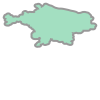

In [150]:
# convert to unprojected polygon for osmnx data pull
polygon = pba.to_crs(4326).iloc[0]
polygon


In [151]:
#!pip install networkx
#!pip install osmnx
import networkx as nx
import osmnx as ox
ox.config(log_file=True,log_console=True,use_cache=True)
#place="Portland,USA"
#Construct the street network
G=ox.graph_from_polygon(polygon,network_type="drive",simplify=False)
#G_projected=ox.project_graph(G)
#fig, ax = ox.plot_graph(G,node_color='yellow',edge_color='blue')

In [152]:
nodes, edges = ox.graph_to_gdfs(G)
nodes.head(5)

,y,x,highway,street_count,ref,geometry
osmid,,,,,,
27195852,45.540893,-122.867556,traffic_signals,5,NaN,POINT (-122.86756 45.54089)
27196027,45.525280,-122.661726,NaN,2,NaN,POINT (-122.66173 45.52528)
27196028,45.525338,-122.661431,NaN,2,NaN,POINT (-122.66143 45.52534)
27196029,45.525506,-122.660838,NaN,2,NaN,POINT (-122.66084 45.52551)
27199858,45.530317,-122.891740,NaN,3,NaN,POINT (-122.89174 45.53032)


In [153]:
# set the co-ordinate system first
node = nodes.set_crs("EPSG:4326")
# Let's take a copy of our layer
node_proj = node.copy()

# Reproject the geometries by replacing the values with projected ones
node_proj = node_proj.to_crs(epsg=2838)
node_proj.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,y,x,highway,street_count,ref,geometry
osmid,,,,,,
27195852,45.540893,-122.867556,traffic_signals,5,NaN,POINT (2315133.607 210977.179)
27196027,45.525280,-122.661726,NaN,2,NaN,POINT (2331155.112 208792.181)
27196028,45.525338,-122.661431,NaN,2,NaN,POINT (2331178.296 208797.986)
27196029,45.525506,-122.660838,NaN,2,NaN,POINT (2331225.108 208815.344)
27199858,45.530317,-122.891740,NaN,3,NaN,POINT (2313210.935 209857.954)


In [154]:
# Clip the data using GeoPandas clip
buffer_clip_node = gpd.clip(node_proj, gdf1)
buffer_clip_node.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,y,x,highway,street_count,ref,geometry
osmid,,,,,,
38793041,45.538734,-122.890470,NaN,2,NaN,POINT (2313337.796 210790.057)
40378141,45.550793,-122.665695,NaN,4,NaN,POINT (2330921.150 211634.765)
40378148,45.553322,-122.665710,NaN,4,NaN,POINT (2330927.513 211915.763)
40378155,45.556391,-122.665658,NaN,4,NaN,POINT (2330940.706 212256.644)
40378195,45.573307,-122.665821,NaN,4,NaN,POINT (2330978.391 214136.237)


C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


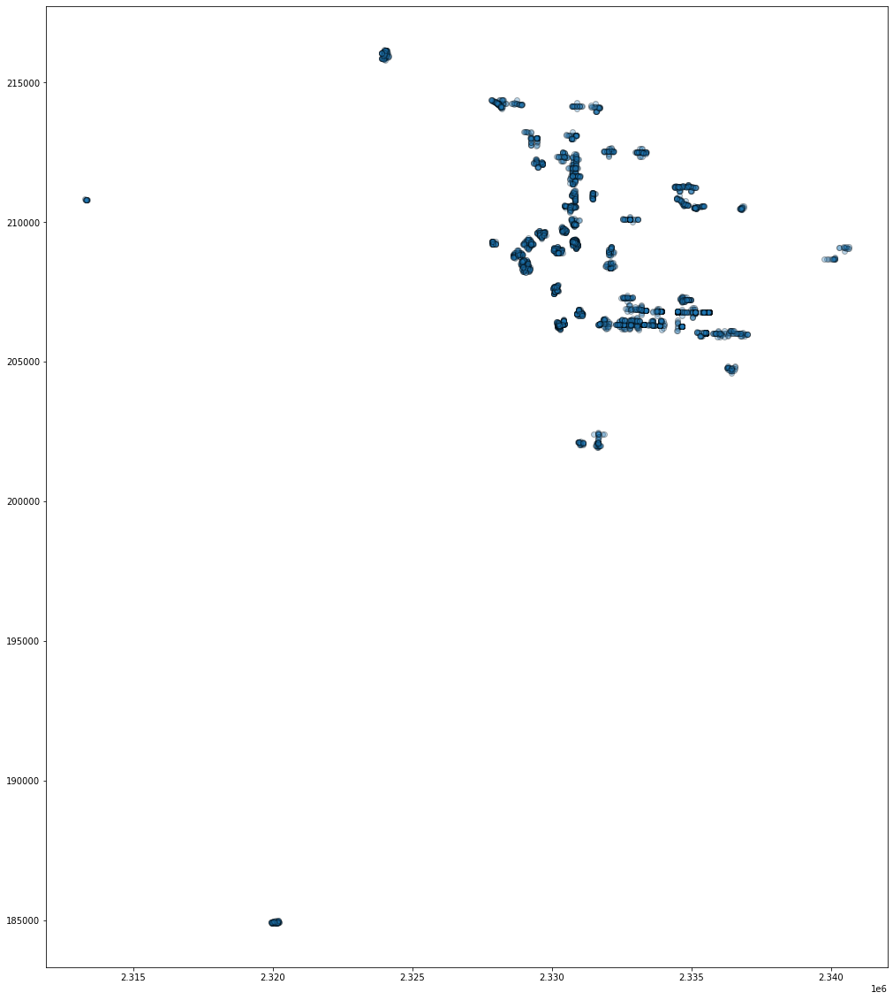

In [155]:
ax = buffer_clip_node.plot(figsize=(20, 20), alpha=0.3, edgecolor='k')

In [156]:
 inter_node=gpd.overlay(gdf1, buffer_clip_node, how='intersection', make_valid=True, keep_geom_type=False)
 inter_node.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,comment,osm_id_sensor,buff_dist,buffer_area,y,x,highway,street_count,ref,geometry
0,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,NaN,681301893.0,0.1,0.016902,45.513612,-122.674441,NaN,2,NaN,POINT (2330127.315 207522.544)
1,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,NaN,689032191.0,0.1,0.016412,45.513612,-122.674441,NaN,2,NaN,POINT (2330127.315 207522.544)
2,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,NaN,681301893.0,0.1,0.016902,45.513721,-122.674348,NaN,2,NaN,POINT (2330134.874 207534.469)
3,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,NaN,689032191.0,0.1,0.016412,45.513721,-122.674348,NaN,2,NaN,POINT (2330134.874 207534.469)
4,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,NaN,681301893.0,0.1,0.016902,45.513776,-122.674265,NaN,2,NaN,POINT (2330141.569 207540.448)


In [157]:
output_intersection_density= inter_node.groupby(by=['osm_id_sensor'])['geometry'].count()
output_intersection_density12=output_intersection_density.reset_index()
output_intersection_density12.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,geometry
0,5516558.0,8
1,5522164.0,102
2,5527017.0,18
3,5528173.0,80
4,5529700.0,10


In [158]:
b_area=gdf1.loc[:,['osm_id_sensor','buffer_area']]
b_area.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,buffer_area
6,681301893.0,0.016902
13,689032191.0,0.016412
20,322079535.0,0.023266
34,126306263.0,0.017055
41,422121256.0,0.017055


In [161]:
output_intersection_density1=pd.merge(output_intersection_density12,b_area,left_on="osm_id_sensor",right_on='osm_id_sensor',how="inner")
output_intersection_density1["Intersection Density"]=output_intersection_density1["geometry"]/output_intersection_density1["buffer_area"]
output_intersection_density1=output_intersection_density1.loc[:,['osm_id_sensor','Intersection Density']]
output_intersection_density1.columns=['osm_id','OSM_node_Density']
output_intersection_density1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,OSM_node_Density
0,5516558.0,538.560965
1,5522164.0,3362.680492
2,5527017.0,676.817093
3,5528173.0,2681.218437
4,5529700.0,520.645209


In [162]:
#d = {'osm_id': [], 'OSM_node_Density': []}
#output_intersection_density1 = pd.DataFrame(data=d)
#output_intersection_density1

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


# Calculate the intersection density

In [163]:
custom_filter = ox.downloader._get_osm_filter("drive")
custom_filter += '["highway"!~"motor"]'  # filter out freeways
Ga = ox.graph_from_polygon(polygon, custom_filter=custom_filter, simplify=True)

In [164]:
nodesa, edgesa = ox.graph_to_gdfs(Ga)
# set the co-ordinate system first
nodea = nodesa.set_crs("EPSG:4326")
# Let's take a copy of our layer
nodea_proj = nodea.copy()

# Reproject the geometries by replacing the values with projected ones
nodea_proj = nodea_proj.to_crs(epsg=2838)
nodea_proj.head(5)

,y,x,highway,street_count,geometry
osmid,,,,,
27195852,45.540893,-122.867556,traffic_signals,3,POINT (2315133.607 210977.179)
27199858,45.530317,-122.891740,NaN,3,POINT (2313210.935 209857.954)
27199860,45.529636,-122.889662,NaN,4,POINT (2313370.935 209777.459)
27203602,45.529630,-122.889014,NaN,3,POINT (2313421.525 209775.318)
27266260,45.537931,-122.900224,NaN,4,POINT (2312573.704 210723.395)


In [165]:
buffer_clip_nodea = gpd.clip(nodea_proj, gdf1)
inter_nodea=gpd.overlay(gdf1, buffer_clip_nodea, how='intersection', make_valid=True, keep_geom_type=False)
output_intersection_densitya= inter_nodea.groupby(by=['osm_id_sensor'])['geometry'].count()
output_intersection_density12a=output_intersection_densitya.reset_index()
output_intersection_density1a=pd.merge(output_intersection_density12a,b_area,left_on="osm_id_sensor",right_on='osm_id_sensor',how="inner")
output_intersection_density1a["Intersection Density"]=output_intersection_density1a["geometry"]/output_intersection_density1a["buffer_area"]
output_intersection_density1a=output_intersection_density1a.loc[:,['osm_id_sensor','Intersection Density']]
output_intersection_density1a.columns=['osm_id','Intersection_Density']
output_intersection_density1a.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Intersection_Density
0,5516558.0,336.600603
1,5522164.0,461.544381
2,5527017.0,300.807597
3,5528173.0,301.637074
4,5529700.0,208.258084


In [166]:
#d = {'osm_id': [], 'Intersection_Density': []}
#output_intersection_density1a = pd.DataFrame(data=d)
#output_intersection_density1a

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


# Calculate the Number of Lanes

In [167]:
edges.head(10)

osmid  oneway lanes        highway   length  \
u        v          key                                                   
27195852 1490066015 0     4441934    True     1  motorway_link   20.083   
         27287656   0     5390884   False     6        primary   69.464   
         671782028  0    37185154    True     3        primary   12.538   
27196027 27196028   0    23630312    True     2  motorway_link   23.841   
27196028 355777024  0    31779702    True     2  motorway_link   13.359   
27196029 1382218550 0    31779702    True     2  motorway_link   31.306   
27199858 1102782222 0     4443830   False   NaN    residential   19.899   
         38799060   0     4443830   False   NaN    residential   76.074   
         38746742   0     5392253   False   NaN    residential  163.098   
27199860 27203602   0     4440143   False   NaN    residential   50.497   

                                           name maxspeed bridge  ref access  \
u        v          key                                                       
27195852 1490066015 0                       NaN      NaN    NaN  NaN    NaN   
         27287656   0    Northwest 185th Avenue   40 mph    NaN  NaN    NaN   
         671782028  0    Northwest 185th Avenue   40 mph    NaN  NaN    NaN   
27196027 27196028   0                       NaN   50 mph    yes  NaN    NaN   
27196028 355777024  0                       NaN   50 mph    NaN  NaN    NaN   
27196029 1382218550 0                       NaN   50 mph    NaN  NaN    NaN   
27199858 1102782222 0     Northeast 85th Avenue   25 mph    NaN  NaN    NaN   
         38799060   0     Northeast 85th Avenue   25 mph    NaN  NaN    NaN   
         38746742   0    Northeast Alder Street   25 mph    NaN  NaN    NaN   
27199860 27203602   0    Northeast Hodes Street   25 mph    NaN  NaN    NaN   

                        junction tunnel width est_width area landuse  \
u        v          key                                                
27195852 1490066015 0        NaN    NaN   NaN       NaN  NaN     NaN   
         27287656   0        NaN    NaN   NaN       NaN  NaN     NaN   
         671782028  0        NaN    NaN   NaN       NaN  NaN     NaN   
27196027 27196028   0        NaN    NaN   NaN       NaN  NaN     NaN   
27196028 355777024  0        NaN    NaN   NaN       NaN  NaN     NaN   
27196029 1382218550 0        NaN    NaN   NaN       NaN  NaN     NaN   
27199858 1102782222 0        NaN    NaN   NaN       NaN  NaN     NaN   
         38799060   0        NaN    NaN   NaN       NaN  NaN     NaN   
         38746742   0        NaN    NaN   NaN       NaN  NaN     NaN   
27199860 27203602   0        NaN    NaN   NaN       NaN  NaN     NaN   

                                                                  geometry  
u        v          key                                                     
27195852 1490066015 0    LINESTRING (-122.86756 45.54089, -122.86730 45...  
         27287656   0    LINESTRING (-122.86756 45.54089, -122.86756 45...  
         671782028  0    LINESTRING (-122.86756 45.54089, -122.86765 45...  
27196027 27196028   0    LINESTRING (-122.66173 45.52528, -122.66143 45...  
27196028 355777024  0    LINESTRING (-122.66143 45.52534, -122.66127 45...  
27196029 1382218550 0    LINESTRING (-122.66084 45.52551, -122.66049 45...  
27199858 1102782222 0    LINESTRING (-122.89174 45.53032, -122.89176 45...  
         38799060   0    LINESTRING (-122.89174 45.53032, -122.89173 45...  
         38746742   0    LINESTRING (-122.89174 45.53032, -122.88965 45...  
27199860 27203602   0    LINESTRING (-122.88966 45.52964, -122.88901 45...

In [168]:
print(edges.crs)

epsg:4326


C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [169]:
# set the co-ordinate system first
edge = edges.set_crs("EPSG:4326")
# Let's take a copy of our layer
edge_proj = edge.copy()

# Reproject the geometries by replacing the values with projected ones
edge_proj = edge_proj.to_crs(epsg=2838)
edge_proj.head(5)

osmid  oneway lanes        highway  length  \
u        v          key                                                  
27195852 1490066015 0     4441934    True     1  motorway_link  20.083   
         27287656   0     5390884   False     6        primary  69.464   
         671782028  0    37185154    True     3        primary  12.538   
27196027 27196028   0    23630312    True     2  motorway_link  23.841   
27196028 355777024  0    31779702    True     2  motorway_link  13.359   

                                           name maxspeed bridge  ref access  \
u        v          key                                                       
27195852 1490066015 0                       NaN      NaN    NaN  NaN    NaN   
         27287656   0    Northwest 185th Avenue   40 mph    NaN  NaN    NaN   
         671782028  0    Northwest 185th Avenue   40 mph    NaN  NaN    NaN   
27196027 27196028   0                       NaN   50 mph    yes  NaN    NaN   
27196028 355777024  0                       NaN   50 mph    NaN  NaN    NaN   

                        junction tunnel width est_width area landuse  \
u        v          key                                                
27195852 1490066015 0        NaN    NaN   NaN       NaN  NaN     NaN   
         27287656   0        NaN    NaN   NaN       NaN  NaN     NaN   
         671782028  0        NaN    NaN   NaN       NaN  NaN     NaN   
27196027 27196028   0        NaN    NaN   NaN       NaN  NaN     NaN   
27196028 355777024  0        NaN    NaN   NaN       NaN  NaN     NaN   

                                                                  geometry  
u        v          key                                                     
27195852 1490066015 0    LINESTRING (2315133.607 210977.179, 2315153.70...  
         27287656   0    LINESTRING (2315133.607 210977.179, 2315135.41...  
         671782028  0    LINESTRING (2315133.607 210977.179, 2315125.75...  
27196027 27196028   0    LINESTRING (2331155.112 208792.181, 2331178.29...  
27196028 355777024  0    LINESTRING (2331178.296 208797.986, 2331191.04...

In [170]:
# Consider rows without NAN
edge_clean = edge_proj[edge_proj['lanes'].notna()]
edge_clean2 = edge_clean [edge_clean.lanes!=0]
edge_clean2.head(10)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


osmid  oneway lanes        highway   length  \
u        v          key                                                    
27195852 1490066015 0      4441934    True     1  motorway_link   20.083   
         27287656   0      5390884   False     6        primary   69.464   
         671782028  0     37185154    True     3        primary   12.538   
27196027 27196028   0     23630312    True     2  motorway_link   23.841   
27196028 355777024  0     31779702    True     2  motorway_link   13.359   
27196029 1382218550 0     31779702    True     2  motorway_link   31.306   
27200088 27200091   0     30312378    True     3       motorway  125.440   
27200091 1420520843 0     30312378    True     3       motorway   74.384   
27200092 1420520834 0      5397673    True     5       motorway   38.145   
27200095 38793661   0    186973851    True     4       motorway   84.691   

                                             name maxspeed bridge    ref  \
u        v          key                                                    
27195852 1490066015 0                         NaN      NaN    NaN    NaN   
         27287656   0      Northwest 185th Avenue   40 mph    NaN    NaN   
         671782028  0      Northwest 185th Avenue   40 mph    NaN    NaN   
27196027 27196028   0                         NaN   50 mph    yes    NaN   
27196028 355777024  0                         NaN   50 mph    NaN    NaN   
27196029 1382218550 0                         NaN   50 mph    NaN    NaN   
27200088 27200091   0    Northwest Sunset Highway   55 mph    NaN  US 26   
27200091 1420520843 0    Northwest Sunset Highway   55 mph    NaN  US 26   
27200092 1420520834 0              Sunset Highway   55 mph    NaN  US 26   
27200095 38793661   0              Sunset Highway   55 mph    NaN  US 26   

                        access junction tunnel width est_width area landuse  \
u        v          key                                                       
27195852 1490066015 0      NaN      NaN    NaN   NaN       NaN  NaN     NaN   
         27287656   0      NaN      NaN    NaN   NaN       NaN  NaN     NaN   
         671782028  0      NaN      NaN    NaN   NaN       NaN  NaN     NaN   
27196027 27196028   0      NaN      NaN    NaN   NaN       NaN  NaN     NaN   
27196028 355777024  0      NaN      NaN    NaN   NaN       NaN  NaN     NaN   
27196029 1382218550 0      NaN      NaN    NaN   NaN       NaN  NaN     NaN   
27200088 27200091   0      NaN      NaN    NaN   NaN       NaN  NaN     NaN   
27200091 1420520843 0      NaN      NaN    NaN   NaN       NaN  NaN     NaN   
27200092 1420520834 0      NaN      NaN    NaN   NaN       NaN  NaN     NaN   
27200095 38793661   0      NaN      NaN    NaN   NaN       NaN  NaN     NaN   

                                                                  geometry  
u        v          key                                                     
27195852 1490066015 0    LINESTRING (2315133.607 210977.179, 2315153.70...  
         27287656   0    LINESTRING (2315133.607 210977.179, 2315135.41...  
         671782028  0    LINESTRING (2315133.607 210977.179, 2315125.75...  
27196027 27196028   0    LINESTRING (2331155.112 208792.181, 2331178.29...  
27196028 355777024  0    LINESTRING (2331178.296 208797.986, 2331191.04...  
27196029 1382218550 0    LINESTRING (2331225.108 208815.344, 2331253.03...  
27200088 27200091   0    LINESTRING (2322154.575 207084.811, 2322271.10...  
27200091 1420520843 0    LINESTRING (2322271.105 207037.591, 2322341.26...  
27200092 1420520834 0    LINESTRING (2322528.262 206949.307, 2322564.95...  
27200095 38793661   0    LINESTRING (2322880.657 206868.243, 2322964.34...

In [171]:
def nearest_linestring(point, df_lines):
    idx = df_lines.geometry.distance(point).idxmin()
    return df_lines.loc[idx, 'lanes']

ecoshort['lanes'] = ecoshort.geometry.apply(nearest_linestring, df_lines=edge_clean2)
ecoshort
ecoshort_lane=ecoshort.copy()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [172]:
ecoshort_lane

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,latitude,longitude,comment,osm_id_sensor,buff_dist,geometry,min_dist_to_school,min_dist_to_college,min_dist_to_university,lanes
0,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,45.513830,-122.672840,NaN,681301893.0,2.0,POINT (2330251.902 207544.074),2262.300738,1384.844295,3131.276680,1
1,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,45.513830,-122.672840,NaN,681301893.0,1.5,POINT (2330251.902 207544.074),2262.300738,1384.844295,3131.276680,1
2,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,45.513830,-122.672840,NaN,681301893.0,1.0,POINT (2330251.902 207544.074),2262.300738,1384.844295,3131.276680,1
3,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,45.513830,-122.672840,NaN,681301893.0,0.75,POINT (2330251.902 207544.074),2262.300738,1384.844295,3131.276680,1
4,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,45.513830,-122.672840,NaN,681301893.0,0.5,POINT (2330251.902 207544.074),2262.300738,1384.844295,3131.276680,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
611,S182POR,N FLINT AVE S of RUSSELL ST,short-term,2019,Portland,1.0,323.681081,62.027397,42.520548,1495.0,45.540891,-122.668706,NaN,426066335.0,1.0,POINT (2330655.488 210541.725),647.205814,2000.695245,5616.691011,2
612,S182POR,N FLINT AVE S of RUSSELL ST,short-term,2019,Portland,1.0,323.681081,62.027397,42.520548,1495.0,45.540891,-122.668706,NaN,426066335.0,0.75,POINT (2330655.488 210541.725),647.205814,2000.695245,5616.691011,2
613,S182POR,N FLINT AVE S of RUSSELL ST,short-term,2019,Portland,1.0,323.681081,62.027397,42.520548,1495.0,45.540891,-122.668706,NaN,426066335.0,0.5,POINT (2330655.488 210541.725),647.205814,2000.695245,5616.691011,2
614,S182POR,N FLINT AVE S of RUSSELL ST,short-term,2019,Portland,1.0,323.681081,62.027397,42.520548,1495.0,45.540891,-122.668706,NaN,426066335.0,0.25,POINT (2330655.488 210541.725),647.205814,2000.695245,5616.691011,2


In [173]:
# The above lanes need manual cleaning as current aggregation is odd
#pd.DataFrame.to_csv(ecoshort_lane, 'lane_portland.csv', sep=',', na_rep='.', index=False)
# edit this file manually

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [174]:
# now import again after edit
#lane_modified=pd.read_csv("C:/Users/mxm5116/Desktop/Bike Fusion/lane_portland1.csv")
#lane_modified

In [175]:
output_lane=ecoshort_lane.loc[:,['osm_id_sensor','lanes']]
output_lane.columns=['osm_id','lanes']
output_lane=output_lane.drop_duplicates(subset=['osm_id'],keep='first')
output_lane.head()

,osm_id,lanes
0,681301893.0,1
7,689032191.0,1
14,322079535.0,3
21,348027806.0,1
28,126306263.0,4


# Calculate the cycleway-left, cycleway-right and cycleway from OSM bike Network within the buffer

In [176]:
# This is osmnx's default OSM tag set for links
print(ox.settings.useful_tags_way)

['bridge', 'tunnel', 'oneway', 'lanes', 'ref', 'name', 'highway', 'maxspeed', 'service', 'access', 'area', 'landuse', 'width', 'est_width', 'junction']


C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [177]:
### Modify run params here ###
extra_way_tags = ['cycleway', 'cycleway:left', 'cycleway:right']  # add'l OSM tags to keep

In [178]:
# Can add any OSM tag--will be populated if available
useful_tags = ox.settings.useful_tags_way + extra_way_tags
ox.config(use_cache=True, log_console=True, useful_tags_way=useful_tags)
print(ox.settings.useful_tags_way)

['bridge', 'tunnel', 'oneway', 'lanes', 'ref', 'name', 'highway', 'maxspeed', 'service', 'access', 'area', 'landuse', 'width', 'est_width', 'junction', 'cycleway', 'cycleway:left', 'cycleway:right']


In [179]:
Gc=ox.graph_from_polygon(polygon, network_type='bike',simplify=False)
#G = gpd.clip(G, pba)
#G_projected=ox.project_graph(G)
#fig, ax = ox.plot_graph(Gc,node_color='yellow',edge_color='blue')

In [180]:
nodesc, edgesc = ox.graph_to_gdfs(Gc)
edgesc.head(5)

osmid lanes                    name      highway  \
u        v          key                                                        
27195852 27287656   0     5390884     6  Northwest 185th Avenue      primary   
         671782028  0    37185154     3  Northwest 185th Avenue      primary   
27199858 1102782222 0     4443830   NaN   Northeast 85th Avenue  residential   
         38799060   0     4443830   NaN   Northeast 85th Avenue  residential   
         38746742   0     5392253   NaN  Northeast Alder Street  residential   

                        maxspeed cycleway  oneway   length bridge service  \
u        v          key                                                     
27195852 27287656   0     40 mph     lane   False   69.464    NaN     NaN   
         671782028  0     40 mph     lane    True   12.538    NaN     NaN   
27199858 1102782222 0     25 mph      NaN   False   19.899    NaN     NaN   
         38799060   0     25 mph      NaN   False   76.074    NaN     NaN   
         38746742   0     25 mph      NaN   False  163.098    NaN     NaN   

                         ... access cycleway:left  ref est_width junction  \
u        v          key  ...                                                
27195852 27287656   0    ...    NaN           NaN  NaN       NaN      NaN   
         671782028  0    ...    NaN           NaN  NaN       NaN      NaN   
27199858 1102782222 0    ...    NaN           NaN  NaN       NaN      NaN   
         38799060   0    ...    NaN           NaN  NaN       NaN      NaN   
         38746742   0    ...    NaN           NaN  NaN       NaN      NaN   

                        width tunnel area landuse  \
u        v          key                             
27195852 27287656   0     NaN    NaN  NaN     NaN   
         671782028  0     NaN    NaN  NaN     NaN   
27199858 1102782222 0     NaN    NaN  NaN     NaN   
         38799060   0     NaN    NaN  NaN     NaN   
         38746742   0     NaN    NaN  NaN     NaN   

                                                                  geometry  
u        v          key                                                     
27195852 27287656   0    LINESTRING (-122.86756 45.54089, -122.86756 45...  
         671782028  0    LINESTRING (-122.86756 45.54089, -122.86765 45...  
27199858 1102782222 0    LINESTRING (-122.89174 45.53032, -122.89176 45...  
         38799060   0    LINESTRING (-122.89174 45.53032, -122.89173 45...  
         38746742   0    LINESTRING (-122.89174 45.53032, -122.88965 45...  

[5 rows x 21 columns]

In [181]:
# set the co-ordinate system first
edgesc = edgesc.set_crs("EPSG:4326")
# Let's take a copy of our layer
cycleway_proj = edgesc.copy()

# Reproject the geometries by replacing the values with projected ones
cycleway_proj = cycleway_proj.to_crs(epsg=2838)
cycleway_proj.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


osmid lanes                    name      highway  \
u        v          key                                                        
27195852 27287656   0     5390884     6  Northwest 185th Avenue      primary   
         671782028  0    37185154     3  Northwest 185th Avenue      primary   
27199858 1102782222 0     4443830   NaN   Northeast 85th Avenue  residential   
         38799060   0     4443830   NaN   Northeast 85th Avenue  residential   
         38746742   0     5392253   NaN  Northeast Alder Street  residential   

                        maxspeed cycleway  oneway   length bridge service  \
u        v          key                                                     
27195852 27287656   0     40 mph     lane   False   69.464    NaN     NaN   
         671782028  0     40 mph     lane    True   12.538    NaN     NaN   
27199858 1102782222 0     25 mph      NaN   False   19.899    NaN     NaN   
         38799060   0     25 mph      NaN   False   76.074    NaN     NaN   
         38746742   0     25 mph      NaN   False  163.098    NaN     NaN   

                         ... access cycleway:left  ref est_width junction  \
u        v          key  ...                                                
27195852 27287656   0    ...    NaN           NaN  NaN       NaN      NaN   
         671782028  0    ...    NaN           NaN  NaN       NaN      NaN   
27199858 1102782222 0    ...    NaN           NaN  NaN       NaN      NaN   
         38799060   0    ...    NaN           NaN  NaN       NaN      NaN   
         38746742   0    ...    NaN           NaN  NaN       NaN      NaN   

                        width tunnel area landuse  \
u        v          key                             
27195852 27287656   0     NaN    NaN  NaN     NaN   
         671782028  0     NaN    NaN  NaN     NaN   
27199858 1102782222 0     NaN    NaN  NaN     NaN   
         38799060   0     NaN    NaN  NaN     NaN   
         38746742   0     NaN    NaN  NaN     NaN   

                                                                  geometry  
u        v          key                                                     
27195852 27287656   0    LINESTRING (2315133.607 210977.179, 2315135.41...  
         671782028  0    LINESTRING (2315133.607 210977.179, 2315125.75...  
27199858 1102782222 0    LINESTRING (2313210.935 209857.954, 2313208.92...  
         38799060   0    LINESTRING (2313210.935 209857.954, 2313214.13...  
         38746742   0    LINESTRING (2313210.935 209857.954, 2313374.41...  

[5 rows x 21 columns]

In [182]:
# Clip the data using GeoPandas clip
buffer_clip_cycleway = gpd.clip(cycleway_proj, gdf1)
buffer_clip_cycleway.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


osmid lanes                        name  \
u        v          key                                                
38793041 8562611982 0    106706824     2      Northeast Cornell Road   
         7070441083 0    757069466   NaN                         NaN   
40378139 7990664062 0      5509019   NaN  Northeast Cleveland Avenue   
         40650260   0    586135858   NaN      Northeast Beech Street   
40378141 7990664039 0      5509019   NaN  Northeast Cleveland Avenue   

                             highway maxspeed cycleway  oneway   length  \
u        v          key                                                   
38793041 8562611982 0        primary   45 mph     lane    True    7.608   
         7070441083 0       cycleway      NaN      NaN    True    7.824   
40378139 7990664062 0    residential   20 mph      NaN   False  132.849   
         40650260   0    residential   20 mph      NaN   False   79.225   
40378141 7990664039 0    residential   20 mph      NaN   False    8.462   

                        bridge service  ... access cycleway:left  ref  \
u        v          key                 ...                             
38793041 8562611982 0      NaN     NaN  ...    NaN           NaN  NaN   
         7070441083 0      NaN     NaN  ...    NaN           NaN  NaN   
40378139 7990664062 0      NaN     NaN  ...    NaN           NaN  NaN   
         40650260   0      NaN     NaN  ...    NaN           NaN  NaN   
40378141 7990664039 0      NaN     NaN  ...    NaN           NaN  NaN   

                        est_width junction width tunnel area landuse  \
u        v          key                                                
38793041 8562611982 0         NaN      NaN   NaN    NaN  NaN     NaN   
         7070441083 0         NaN      NaN   NaN    NaN  NaN     NaN   
40378139 7990664062 0         NaN      NaN   NaN    NaN  NaN     NaN   
         40650260   0         NaN      NaN   NaN    NaN  NaN     NaN   
40378141 7990664039 0         NaN      NaN   NaN    NaN  NaN     NaN   

                                                                  geometry  
u        v          key                                                     
38793041 8562611982 0    LINESTRING (2313337.796 210790.057, 2313330.59...  
         7070441083 0    LINESTRING (2313337.796 210790.057, 2313334.35...  
40378139 7990664062 0    LINESTRING (2330920.016 211574.775, 2330921.02...  
         40650260   0    LINESTRING (2330899.051 211495.309, 2330839.06...  
40378141 7990664039 0    LINESTRING (2330921.150 211634.765, 2330921.36...  

[5 rows x 21 columns]

In [183]:
 inter_cycleway=gpd.overlay(gdf1, buffer_clip_cycleway, how='intersection', make_valid=True, keep_geom_type=False)
 inter_cycleway.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,access,cycleway:left,ref,est_width,junction,width,tunnel,area,landuse,geometry
0,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"LINESTRING (2330127.315 207522.544, 2330137.83..."
1,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"LINESTRING (2330127.315 207522.544, 2330137.83..."
2,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"LINESTRING (2330134.874 207534.469, 2330138.40..."
3,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"LINESTRING (2330134.874 207534.469, 2330138.40..."
4,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"LINESTRING (2330141.569 207540.448, 2330146.63..."


In [184]:
 inter_cycleway["Length"]= inter_cycleway["geometry"].length*3.28084 # in ft
 inter_cycleway.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,cycleway:left,ref,est_width,junction,width,tunnel,area,landuse,geometry,Length
0,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"LINESTRING (2330127.315 207522.544, 2330137.83...",44.382107
1,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"LINESTRING (2330127.315 207522.544, 2330137.83...",44.382107
2,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"LINESTRING (2330134.874 207534.469, 2330138.40...",15.916174
3,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"LINESTRING (2330134.874 207534.469, 2330138.40...",15.916174
4,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"LINESTRING (2330141.569 207540.448, 2330146.63...",20.393012


In [185]:
inter_cycleway['cycleway:right'].describe()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


count     442
unique      6
top        no
freq      166
Name: cycleway:right, dtype: object

In [186]:
# Calculate the cycleway left, right and lane length within the buffer
bike_left=inter_cycleway[inter_cycleway['cycleway:left']=='lane']
bike_right=inter_cycleway[inter_cycleway['cycleway:right']=='lane']
bikeway_lane= inter_cycleway[inter_cycleway['cycleway']=='lane']
bikeway_all_lane=pd.concat([bike_left,bike_right,bikeway_lane],axis=0)
#ike_left= inter_cycleway[inter_cycleway['type'].str.contains('cycleway:left')]
output_bikeway_all_lane=bikeway_all_lane.groupby(by=['osm_id_sensor'])['Length'].sum().reset_index()
output_bikeway_all_lane.columns=["osm_id","cycleway_lane_all"]
output_bikeway_all_lane.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,cycleway_lane_all
0,5516558.0,787.325043
1,5522164.0,1623.496716
2,5527017.0,790.964874
3,33665960.0,2218.784395
4,44793234.0,1224.972619


In [187]:
cycleway_lane0= cycleway_proj[cycleway_proj['cycleway']=='lane']
cycleway_lane01= cycleway_proj[cycleway_proj['cycleway:left']=='lane']
cycleway_lane011= cycleway_proj[cycleway_proj['cycleway:right']=='lane']
cycleway_lane=pd.concat([cycleway_lane0,cycleway_lane01,cycleway_lane01],axis=0)
cycleway_lane.head()
lane_merged_inner = pd.merge(right=ecoshort, left=cycleway_lane, left_on='osmid', right_on='osm_id_sensor',how='inner')
lane_merged_inner.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osmid,lanes_x,name,highway,maxspeed,cycleway,oneway,length,bridge,service,...,latitude,longitude,comment,osm_id_sensor,buff_dist,geometry_y,min_dist_to_school,min_dist_to_college,min_dist_to_university,lanes_y
0,595610339,2,Sellwood Bridge,secondary,30 mph,lane,False,31.25,yes,NaN,...,45.464264,-122.661174,can't separate bridge sides in OSM,595610339.0,2.0,POINT (2331015.724 202013.261),1892.806375,14408.201212,5904.005107,2
1,595610339,2,Sellwood Bridge,secondary,30 mph,lane,False,31.25,yes,NaN,...,45.464264,-122.661174,can't separate bridge sides in OSM,595610339.0,1.5,POINT (2331015.724 202013.261),1892.806375,14408.201212,5904.005107,2
2,595610339,2,Sellwood Bridge,secondary,30 mph,lane,False,31.25,yes,NaN,...,45.464264,-122.661174,can't separate bridge sides in OSM,595610339.0,1.0,POINT (2331015.724 202013.261),1892.806375,14408.201212,5904.005107,2
3,595610339,2,Sellwood Bridge,secondary,30 mph,lane,False,31.25,yes,NaN,...,45.464264,-122.661174,can't separate bridge sides in OSM,595610339.0,0.75,POINT (2331015.724 202013.261),1892.806375,14408.201212,5904.005107,2
4,595610339,2,Sellwood Bridge,secondary,30 mph,lane,False,31.25,yes,NaN,...,45.464264,-122.661174,can't separate bridge sides in OSM,595610339.0,0.5,POINT (2331015.724 202013.261),1892.806375,14408.201212,5904.005107,2


In [188]:
# Convert output_bikeway_all as binary
output_bikeway_all_lane_binary=lane_merged_inner.groupby(by=['osm_id_sensor'])['cycleway'].count().reset_index()
output_bikeway_all_lane_binary.loc[output_bikeway_all_lane_binary['cycleway'] > 0, 'cycleway'] = 1
output_bikeway_all_lane_binary.loc[output_bikeway_all_lane_binary['cycleway'] ==0, 'cycleway'] = 0
output_bikeway_all_lane_binary.columns=["osm_id","cycleway_lane_binary"]
output_bikeway_all_lane_binary.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,cycleway_lane_binary
0,117036270.0,0
1,117058378.0,0
2,121304231.0,1
3,125671776.0,1
4,204191015.0,0


In [189]:
# Calculate the cycleway left, right amd track all together
bike_left_track=inter_cycleway[inter_cycleway['cycleway:left']=='track']
bike_right_track=inter_cycleway[inter_cycleway['cycleway:right']=='track']
bikeway_track= inter_cycleway[inter_cycleway['cycleway']=='track']
bikeway_all_track=pd.concat([bike_left_track,bike_right_track,bikeway_track],axis=0)
#ike_left= inter_cycleway[inter_cycleway['type'].str.contains('cycleway:left')]
output_bikeway_all_track=bikeway_all_track.groupby(by=['osm_id_sensor'])['Length'].sum().reset_index()
output_bikeway_all_track.columns=["osm_id","cycleway_track_all"]
output_bikeway_all_track.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,cycleway_track_all
0,5522164.0,240.863346
1,117058378.0,52.425054
2,125671776.0,179.199816
3,410340709.0,179.199816


In [190]:
cycleway_track0= cycleway_proj[cycleway_proj['cycleway:left']=='track']
cycleway_track01= cycleway_proj[cycleway_proj['cycleway:right']=='track']
cycleway_track011= cycleway_proj[cycleway_proj['cycleway']=='track']
cycleway_track1=pd.concat([cycleway_track0,cycleway_track01,cycleway_track011],axis=0)
cycleway_track1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,,,osmid,lanes,name,highway,maxspeed,cycleway,oneway,length,bridge,service,...,access,cycleway:left,ref,est_width,junction,width,tunnel,area,landuse,geometry
u,v,key,,,,,,,,,,,,,,,,,,,,,
38843447,1254720826,0,600467575,3,Northeast Century Boulevard,secondary,35 mph,NaN,False,42.346,NaN,NaN,...,NaN,track,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"LINESTRING (2311642.650 210288.414, 2311640.84..."
40391352,1378067879,0,595610429,2,Southwest 2nd Avenue,secondary,20 mph,NaN,True,7.588,NaN,NaN,...,NaN,track,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"LINESTRING (2330191.201 208155.574, 2330194.00..."
40408688,3860425584,0,595610429,2,Southwest 2nd Avenue,secondary,20 mph,NaN,True,4.680,NaN,NaN,...,NaN,track,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"LINESTRING (2330201.524 208180.777, 2330203.32..."
40508545,1387974119,0,5524373,2,Northwest 2nd Avenue,tertiary,20 mph,NaN,True,71.913,NaN,NaN,...,NaN,track,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"LINESTRING (2330316.792 208734.362, 2330316.41..."
40516268,1325763877,0,5524373,2,Northwest 2nd Avenue,tertiary,20 mph,NaN,True,10.220,NaN,NaN,...,NaN,track,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"LINESTRING (2330316.908 208582.930, 2330317.03..."


In [191]:
track_merged_inner = pd.merge(right=ecoshort, left=cycleway_track1, left_on='osmid', right_on='osm_id_sensor',how='inner')
track_merged_inner.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osmid,lanes_x,name,highway,maxspeed,cycleway,oneway,length,bridge,service,...,latitude,longitude,comment,osm_id_sensor,buff_dist,geometry_y,min_dist_to_school,min_dist_to_college,min_dist_to_university,lanes_y


In [192]:
# Convert output_bikeway_track all as binary
output_bikeway_all_track_binary=track_merged_inner.groupby(by=['osm_id_sensor'])['cycleway'].count().reset_index()
output_bikeway_all_track_binary.loc[output_bikeway_all_track_binary['cycleway'] > 0, 'cycleway'] = 1
output_bikeway_all_track_binary.loc[output_bikeway_all_track_binary['cycleway'] ==0, 'cycleway'] = 0
output_bikeway_all_track_binary.columns=["osm_id","cycleway_track_all_binary"]
output_bikeway_all_track_binary.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,cycleway_track_all_binary


# OSM Functional System Programming

In [193]:
#road = gpd.read_file("../input/osm-data/roads.shp")
road.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,name,ref,type,oneway,bridge,maxspeed,geometry
0,4440143,Northeast Hodes Street,None,residential,0,0,25.0,"LINESTRING (-122.89295 45.52973, -122.89274 45..."
1,4440967,Northeast Butler Street,None,secondary,0,0,NaN,"LINESTRING (-122.90523 45.53771, -122.90519 45..."
2,4441934,None,None,motorway_link,1,0,NaN,"LINESTRING (-122.86756 45.54089, -122.86730 45..."
3,4443830,Northeast 85th Avenue,None,residential,0,0,25.0,"LINESTRING (-122.89170 45.53231, -122.89171 45..."
4,4443836,Northeast Windstone Street,None,residential,0,0,25.0,"LINESTRING (-122.88963 45.53199, -122.88975 45..."


In [194]:
print(road.crs)

EPSG:4326


C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [195]:
# set the co-ordinate system first
#road = road.set_crs("EPSG:4326")

In [196]:
# Let's take a copy of our layer
road_proj = road.copy()

# Reproject the geometries by replacing the values with projected ones
road_proj = road_proj.to_crs(epsg=2838)
road_proj.head(5)

,osm_id,name,ref,type,oneway,bridge,maxspeed,geometry
0,4440143,Northeast Hodes Street,None,residential,0,0,25.0,"LINESTRING (2313114.363 209795.929, 2313130.80..."
1,4440967,Northeast Butler Street,None,secondary,0,0,NaN,"LINESTRING (2312182.520 210710.249, 2312185.06..."
2,4441934,None,None,motorway_link,1,0,NaN,"LINESTRING (2315133.607 210977.179, 2315153.70..."
3,4443830,Northeast 85th Avenue,None,residential,0,0,25.0,"LINESTRING (2313220.539 210079.632, 2313218.92..."
4,4443836,Northeast Windstone Street,None,residential,0,0,25.0,"LINESTRING (2313381.281 210038.384, 2313371.72..."


In [197]:
#road_proj.plot()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<AxesSubplot:>

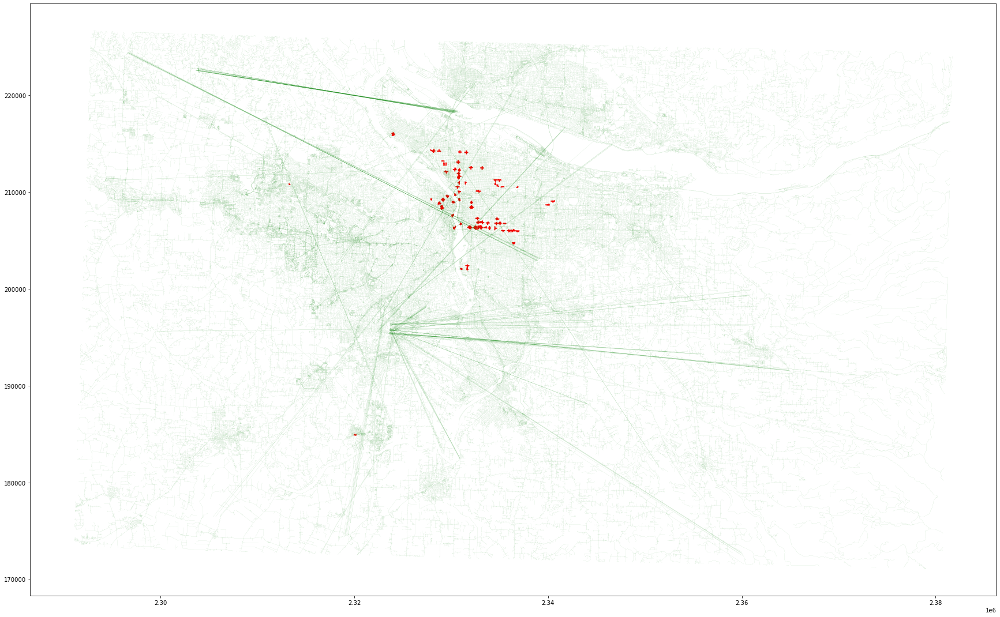

In [198]:
fig, ax = plt.subplots(figsize = (30,25)) 
gdf1.plot(ax=ax,color="red")
road_proj.plot(color="green",edgecolor='k',linewidth = 0.05,ax=ax) #Use your second dataframe

#Clip road file with buffer file

In [199]:
# Clip the data using GeoPandas clip
buffer_clip_road = gpd.clip(road_proj, gdf1)
buffer_clip_road.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,name,ref,type,oneway,bridge,maxspeed,geometry
18159,5509019,Northeast Cleveland Avenue,None,residential,0,0,20.0,"MULTILINESTRING ((2330920.016 211574.775, 2330..."
18228,5509361,None,None,motorway_link,1,0,40.0,"LINESTRING (2330216.593 206197.201, 2330215.97..."
18256,5509543,Hawthorne Bridge,None,primary,1,1,30.0,"LINESTRING (2330151.894 207572.399, 2330147.33..."
18464,5510404,None,None,service,0,0,NaN,"LINESTRING (2327981.709 209139.856, 2327979.83..."
18480,5510432,None,None,motorway_link,1,0,NaN,"LINESTRING (2332115.218 209062.242, 2332118.25..."


In [200]:
#ax = buffer_clip_road.plot(figsize=(20, 20), alpha=0.3, edgecolor='k')

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


# Intersect

In [201]:
 inter_road=gpd.overlay(gdf1, buffer_clip_road, how='intersection', make_valid=True, keep_geom_type=False)
 inter_road.head(5)

,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,buff_dist,buffer_area,osm_id,name,ref,type,oneway,bridge,maxspeed,geometry
0,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,0.1,0.016902,5509543,Hawthorne Bridge,None,primary,1,1,30.0,"LINESTRING (2330151.894 207572.399, 2330147.33..."
1,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,0.1,0.016412,5509543,Hawthorne Bridge,None,primary,1,1,30.0,"LINESTRING (2330151.894 207572.399, 2330147.33..."
2,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,0.1,0.016902,5515496,None,None,primary_link,1,0,30.0,"LINESTRING (2330112.392 207638.576, 2330100.78..."
3,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,0.1,0.016412,5515496,None,None,primary_link,1,0,30.0,"LINESTRING (2330112.392 207638.576, 2330100.78..."
4,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,0.1,0.016902,5518375,Southeast 100th Avenue,None,residential,0,0,20.0,"MULTILINESTRING ((2330238.001 207532.688, 2330..."


# Calculate the length of the road segments

In [202]:
inter_road["Length"]=inter_road["geometry"].length*3.28084 # in ft
inter_road.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,buffer_area,osm_id,name,ref,type,oneway,bridge,maxspeed,geometry,Length
0,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,0.016902,5509543,Hawthorne Bridge,None,primary,1,1,30.0,"LINESTRING (2330151.894 207572.399, 2330147.33...",122.092969
1,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,0.016412,5509543,Hawthorne Bridge,None,primary,1,1,30.0,"LINESTRING (2330151.894 207572.399, 2330147.33...",122.092969
2,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,0.016902,5515496,None,None,primary_link,1,0,30.0,"LINESTRING (2330112.392 207638.576, 2330100.78...",105.685855
3,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,0.016412,5515496,None,None,primary_link,1,0,30.0,"LINESTRING (2330112.392 207638.576, 2330100.78...",105.685855
4,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,0.016902,5518375,Southeast 100th Avenue,None,residential,0,0,20.0,"MULTILINESTRING ((2330238.001 207532.688, 2330...",1316.645650


# Aggregrate the road functional class

In [203]:
output_roadfc=inter_road.groupby(by=['osm_id_sensor','type'])['Length'].sum()
output_roadfc

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


osm_id_sensor  type       
5516558.0      residential    2711.621349
               tertiary        393.662522
5522164.0      footway        1973.327992
               pedestrian      505.915164
               primary         757.522985
                                 ...     
738967188.0    footway         204.486423
               residential    5976.850403
               secondary       914.034145
               service         478.285053
               tertiary        457.904178
Name: Length, Length: 371, dtype: float64

# Calculate the primary road

In [204]:
primary= inter_road[inter_road['type'].str.contains('primary')]
output_primary=primary.groupby(by=['osm_id_sensor'])['Length'].sum().reset_index()
output_primary.columns=["osm_id","Primary"]
output_primary.head()

,osm_id,Primary
0,5522164.0,757.522985
1,5529700.0,1445.045653
2,5542408.0,1100.233317
3,126306263.0,1092.140402
4,134960950.0,673.106744


In [205]:
# Calculate secondary
secondary= inter_road[inter_road['type'].str.contains('secondary')]
output_secondary=secondary.groupby(by=['osm_id_sensor'])['Length'].sum().reset_index()
output_secondary.columns=["osm_id","Secondary"]
output_secondary.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Secondary
0,5522164.0,631.001908
1,5527017.0,395.482437
2,5528173.0,913.566611
3,33665960.0,590.440433
4,44793234.0,831.020859


In [206]:
# Calculate tertiary
tertiary= inter_road[inter_road['type'].str.contains('tertiary')]
output_tertiary=tertiary.groupby(by=['osm_id_sensor'])['Length'].sum().reset_index()
output_tertiary.columns=["osm_id","Tertiary"]
output_tertiary.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Tertiary
0,5516558.0,393.662522
1,5522164.0,4737.874023
2,5528173.0,1511.726349
3,5529833.0,1314.822305
4,33665960.0,2022.129661


In [207]:
# Calculate residential
residential= inter_road[inter_road['type'].str.contains('residential')]
output_residential= residential.groupby(by=['osm_id_sensor'])['Length'].sum().reset_index()
output_residential.columns=["osm_id","Residential_Road"]
output_residential.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Residential_Road
0,5516558.0,2711.621349
1,5527017.0,4389.995060
2,5529700.0,742.822987
3,5529833.0,3769.581652
4,5532192.0,2690.406274


In [208]:
# Calculate path
path= inter_road[inter_road['type'].str.contains('path')]
output_path= path.groupby(by=['osm_id_sensor'])['Length'].sum().reset_index()
output_path.columns=["osm_id","Path"]
output_path.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Path
0,5528173.0,52.561359
1,44793234.0,270.054446
2,107599062.0,1362.470049
3,113734584.0,854.613234
4,125671776.0,34.563164


In [209]:
# calculate cycleway
# Calculate path
cycleway = inter_road[inter_road['type'].str.contains('cycleway')]
output_cycleway = cycleway .groupby(by=['osm_id_sensor'])['Length'].sum().reset_index()
output_cycleway.columns=["osm_id","Cycleway"] 
output_cycleway.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Cycleway
0,5528173.0,200.751739
1,113734584.0,50.299484
2,117036270.0,54.550257
3,123167846.0,130.802414
4,125671776.0,383.203009


In [210]:
# Calculate footway
footway = inter_road[inter_road['type'].str.contains('footway')]
output_footway = footway .groupby(by=['osm_id_sensor'])['Length'].sum().reset_index()
output_footway.columns=["osm_id","Footway"] 
output_footway.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Footway
0,5522164.0,1973.327992
1,5528173.0,7986.361228
2,5529700.0,196.879715
3,5542210.0,354.851564
4,44793234.0,7079.038175


# Calculcate the mean Speed

In [211]:
# Exclude NAN and zero value first then take the mean
inter_road.maxspeed.describe()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


count    1417.000000
mean       22.360621
std         5.256737
min         5.000000
25%        20.000000
50%        20.000000
75%        25.000000
max        50.000000
Name: maxspeed, dtype: float64

In [212]:
# Consider rows without NAN
inter_road1 = inter_road[inter_road['maxspeed'].notna()]
inter_road1.head(5) 

,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,buffer_area,osm_id,name,ref,type,oneway,bridge,maxspeed,geometry,Length
0,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,0.016902,5509543,Hawthorne Bridge,None,primary,1,1,30.0,"LINESTRING (2330151.894 207572.399, 2330147.33...",122.092969
1,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,0.016412,5509543,Hawthorne Bridge,None,primary,1,1,30.0,"LINESTRING (2330151.894 207572.399, 2330147.33...",122.092969
2,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,0.016902,5515496,None,None,primary_link,1,0,30.0,"LINESTRING (2330112.392 207638.576, 2330100.78...",105.685855
3,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,0.016412,5515496,None,None,primary_link,1,0,30.0,"LINESTRING (2330112.392 207638.576, 2330100.78...",105.685855
4,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,0.016902,5518375,Southeast 100th Avenue,None,residential,0,0,20.0,"MULTILINESTRING ((2330238.001 207532.688, 2330...",1316.645650


In [213]:
road_proj_type11=inter_road1 [inter_road1 ['type']=='primary']                          
road_proj_type22=inter_road1 [inter_road1 ['type']=='secondary']
road_proj_type33=inter_road1[inter_road1 ['type']=='tertiary']
road_proj_type44=inter_road1 [inter_road1 ['type']=='residential']
road_proj_type55=inter_road1 [inter_road1 ['type']=='path']
road_proj_type66=inter_road1 [inter_road1 ['type']=='cycleway']
road_proj_type77=inter_road1 [inter_road1 ['type']=='footway']
road_proj_types=pd.concat([road_proj_type11,road_proj_type22,road_proj_type33,road_proj_type44,road_proj_type55,road_proj_type66,road_proj_type77],axis=0).reset_index()
road_proj_types.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,index,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,...,buffer_area,osm_id,name,ref,type,oneway,bridge,maxspeed,geometry,Length
0,0,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,...,0.016902,5509543,Hawthorne Bridge,None,primary,1,1,30.0,"LINESTRING (2330151.894 207572.399, 2330147.33...",122.092969
1,1,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,...,0.016412,5509543,Hawthorne Bridge,None,primary,1,1,30.0,"LINESTRING (2330151.894 207572.399, 2330147.33...",122.092969
2,19,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,...,0.016902,30259963,Hawthorne Bridge,None,primary,1,0,30.0,"LINESTRING (2330125.076 207604.271, 2330121.36...",120.112957
3,20,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,...,0.016412,30259963,Hawthorne Bridge,None,primary,1,0,30.0,"LINESTRING (2330125.076 207604.271, 2330121.36...",120.112957
4,21,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,...,0.016902,30259980,Hawthorne Bridge,None,primary,1,0,30.0,"LINESTRING (2330058.111 207611.868, 2330060.80...",220.019781


In [214]:
# Then remove the rows with zero speed
inter_road2 = road_proj_types[road_proj_types.maxspeed != 0]
inter_road2.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,index,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,...,buffer_area,osm_id,name,ref,type,oneway,bridge,maxspeed,geometry,Length
0,0,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,...,0.016902,5509543,Hawthorne Bridge,None,primary,1,1,30.0,"LINESTRING (2330151.894 207572.399, 2330147.33...",122.092969
1,1,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,...,0.016412,5509543,Hawthorne Bridge,None,primary,1,1,30.0,"LINESTRING (2330151.894 207572.399, 2330147.33...",122.092969
2,19,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,...,0.016902,30259963,Hawthorne Bridge,None,primary,1,0,30.0,"LINESTRING (2330125.076 207604.271, 2330121.36...",120.112957
3,20,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,...,0.016412,30259963,Hawthorne Bridge,None,primary,1,0,30.0,"LINESTRING (2330125.076 207604.271, 2330121.36...",120.112957
4,21,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,...,0.016902,30259980,Hawthorne Bridge,None,primary,1,0,30.0,"LINESTRING (2330058.111 207611.868, 2330060.80...",220.019781


In [215]:
# Now calculate the mean speed for each count location
output_meanspeed=inter_road2.groupby(by=['osm_id_sensor'])['maxspeed'].agg(pd.Series.mode).reset_index() # revised
output_meanspeed.columns=['osm_id','maxspeed']
output_meanspeed.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,maxspeed
0,5516558.0,20.0
1,5522164.0,20.0
2,5527017.0,20.0
3,5528173.0,20.0
4,5529700.0,20.0


# Calculate the point speed of the link over which count location exist, 
# Intersect or within or overlap function does not work for sjoin unless the count location exactly over the link, in that case zero results willl be produced. To avoid zero output, nearest link from count station has been claculated like ARcGIS spatial GISJOIN.

In [216]:
def min_distance_pline(point, line):
    return line.distance(point).min()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [217]:
ecoshort.head()

,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,latitude,longitude,comment,osm_id_sensor,buff_dist,geometry,min_dist_to_school,min_dist_to_college,min_dist_to_university,lanes
0,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.36369,109.219178,80.945205,9915.0,45.51383,-122.67284,NaN,681301893.0,2.0,POINT (2330251.902 207544.074),2262.300738,1384.844295,3131.27668,1
1,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.36369,109.219178,80.945205,9915.0,45.51383,-122.67284,NaN,681301893.0,1.5,POINT (2330251.902 207544.074),2262.300738,1384.844295,3131.27668,1
2,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.36369,109.219178,80.945205,9915.0,45.51383,-122.67284,NaN,681301893.0,1.0,POINT (2330251.902 207544.074),2262.300738,1384.844295,3131.27668,1
3,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.36369,109.219178,80.945205,9915.0,45.51383,-122.67284,NaN,681301893.0,0.75,POINT (2330251.902 207544.074),2262.300738,1384.844295,3131.27668,1
4,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.36369,109.219178,80.945205,9915.0,45.51383,-122.67284,NaN,681301893.0,0.5,POINT (2330251.902 207544.074),2262.300738,1384.844295,3131.27668,1


In [218]:
road_proj.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,name,ref,type,oneway,bridge,maxspeed,geometry
0,4440143,Northeast Hodes Street,None,residential,0,0,25.0,"LINESTRING (2313114.363 209795.929, 2313130.80..."
1,4440967,Northeast Butler Street,None,secondary,0,0,NaN,"LINESTRING (2312182.520 210710.249, 2312185.06..."
2,4441934,None,None,motorway_link,1,0,NaN,"LINESTRING (2315133.607 210977.179, 2315153.70..."
3,4443830,Northeast 85th Avenue,None,residential,0,0,25.0,"LINESTRING (2313220.539 210079.632, 2313218.92..."
4,4443836,Northeast Windstone Street,None,residential,0,0,25.0,"LINESTRING (2313381.281 210038.384, 2313371.72..."


In [219]:
print(road_proj.crs)
print(ecoshort.crs)

epsg:2838
epsg:2838


C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [220]:
road_proj_type1=road_proj[road_proj['type']=='primary']                          
road_proj_type2=road_proj[road_proj['type']=='secondary']
road_proj_type3=road_proj[road_proj['type']=='tertiary']
road_proj_type4=road_proj[road_proj['type']=='residential']
road_proj_type5=road_proj[road_proj['type']=='path']
road_proj_type6=road_proj[road_proj['type']=='cycleway']
road_proj_type7=road_proj[road_proj['type']=='footway']
road_proj_type=pd.concat([road_proj_type1,road_proj_type2,road_proj_type3,road_proj_type4,road_proj_type5,road_proj_type6,road_proj_type7],axis=0).reset_index()
road_proj_type.head(5)

,index,osm_id,name,ref,type,oneway,bridge,maxspeed,geometry
0,20,4690136,Northwest Bethany Boulevard,None,primary,0,0,35.0,"LINESTRING (2317095.702 210007.374, 2317100.77..."
1,2885,5288409,Proctor Boulevard,US 26,primary,1,0,25.0,"LINESTRING (2362567.823 193771.422, 2362554.75..."
2,3074,5289540,Southeast Sunnyside Road,None,primary,1,0,40.0,"LINESTRING (2338449.854 198379.134, 2338466.66..."
3,3099,5289670,Southeast 1st Avenue,OR 99E,primary,0,0,35.0,"LINESTRING (2328190.079 179734.302, 2328248.65..."
4,3402,5290853,Pioneer Boulevard,US 26,primary,1,0,25.0,"LINESTRING (2361553.518 193797.982, 2361555.82..."


# In the below pline distance, you can see counter is located little far away from the link

In [221]:
#ecoshort['min_distance_pline'] = ecoshort.geometry.apply(min_distance_pline, args=(road_proj,))*3.28084
#ecoshort

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [222]:
#ecoshort.min_distance_pline.plot(xlabel="Index of Count ID",ylabel="Distance from count station to nearest link in ft")

# we need consider nearest distance link

# Remove the NAN and Zero speed link first from road shape file

In [223]:
road_proj1=road_proj_type[road_proj_type['maxspeed'].notna()]
road_proj2=road_proj1[road_proj1.maxspeed != 0]

In [224]:
#https://gis.stackexchange.com/questions/323884/performing-sjoin-on-polygons-and-lines-without-intersection-using-geopandas
def nearest_linestring(point, df_lines):
    idx = df_lines.geometry.distance(point).idxmin()
    return df_lines.loc[idx, 'maxspeed']

ecoshort['maxspeed'] = ecoshort.geometry.apply(nearest_linestring, df_lines=road_proj2)
ecoshort
ecoshort_speed=ecoshort.copy()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [225]:
# Now merged with road shape file
#pt_speed=pd.merge(ecoshort_speed, road_proj2, right_on='osm_id', left_on='osm_id',how='inner')
pt_speed=ecoshort_speed
pt_speed.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,longitude,comment,osm_id_sensor,buff_dist,geometry,min_dist_to_school,min_dist_to_college,min_dist_to_university,lanes,maxspeed
0,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.36369,109.219178,80.945205,9915.0,...,-122.67284,NaN,681301893.0,2.0,POINT (2330251.902 207544.074),2262.300738,1384.844295,3131.27668,1,30.0
1,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.36369,109.219178,80.945205,9915.0,...,-122.67284,NaN,681301893.0,1.5,POINT (2330251.902 207544.074),2262.300738,1384.844295,3131.27668,1,30.0
2,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.36369,109.219178,80.945205,9915.0,...,-122.67284,NaN,681301893.0,1.0,POINT (2330251.902 207544.074),2262.300738,1384.844295,3131.27668,1,30.0
3,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.36369,109.219178,80.945205,9915.0,...,-122.67284,NaN,681301893.0,0.75,POINT (2330251.902 207544.074),2262.300738,1384.844295,3131.27668,1,30.0
4,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.36369,109.219178,80.945205,9915.0,...,-122.67284,NaN,681301893.0,0.5,POINT (2330251.902 207544.074),2262.300738,1384.844295,3131.27668,1,30.0


In [226]:
# Now merged with road shape file based on OSM ID
pt_speed_v1=pd.merge(ecoshort, road_proj2, right_on='osm_id', left_on='osm_id_sensor',how='inner')
pt_speed_v1

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,maxspeed_x,index,osm_id,name,ref,type,oneway,bridge,maxspeed_y,geometry_y
0,P011POR,Sellwood Bridge both sides,permanent,2019,Portland,3.0,718.697055,102.698630,39.739726,4340.0,...,30.0,155581,595610339,Sellwood Bridge,None,secondary,0,1,30.0,"LINESTRING (2330654.382 202024.718, 2330989.65..."
1,P011POR,Sellwood Bridge both sides,permanent,2019,Portland,3.0,718.697055,102.698630,39.739726,4340.0,...,30.0,155581,595610339,Sellwood Bridge,None,secondary,0,1,30.0,"LINESTRING (2330654.382 202024.718, 2330989.65..."
2,P011POR,Sellwood Bridge both sides,permanent,2019,Portland,3.0,718.697055,102.698630,39.739726,4340.0,...,30.0,155581,595610339,Sellwood Bridge,None,secondary,0,1,30.0,"LINESTRING (2330654.382 202024.718, 2330989.65..."
3,P011POR,Sellwood Bridge both sides,permanent,2019,Portland,3.0,718.697055,102.698630,39.739726,4340.0,...,30.0,155581,595610339,Sellwood Bridge,None,secondary,0,1,30.0,"LINESTRING (2330654.382 202024.718, 2330989.65..."
4,P011POR,Sellwood Bridge both sides,permanent,2019,Portland,3.0,718.697055,102.698630,39.739726,4340.0,...,30.0,155581,595610339,Sellwood Bridge,None,secondary,0,1,30.0,"LINESTRING (2330654.382 202024.718, 2330989.65..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
520,S182POR,N FLINT AVE S of RUSSELL ST,short-term,2019,Portland,1.0,323.681081,62.027397,42.520548,1495.0,...,25.0,128467,426066335,North Flint Avenue,None,tertiary,0,0,25.0,"LINESTRING (2330652.973 210442.469, 2330654.61..."
521,S182POR,N FLINT AVE S of RUSSELL ST,short-term,2019,Portland,1.0,323.681081,62.027397,42.520548,1495.0,...,25.0,128467,426066335,North Flint Avenue,None,tertiary,0,0,25.0,"LINESTRING (2330652.973 210442.469, 2330654.61..."
522,S182POR,N FLINT AVE S of RUSSELL ST,short-term,2019,Portland,1.0,323.681081,62.027397,42.520548,1495.0,...,25.0,128467,426066335,North Flint Avenue,None,tertiary,0,0,25.0,"LINESTRING (2330652.973 210442.469, 2330654.61..."
523,S182POR,N FLINT AVE S of RUSSELL ST,short-term,2019,Portland,1.0,323.681081,62.027397,42.520548,1495.0,...,25.0,128467,426066335,North Flint Avenue,None,tertiary,0,0,25.0,"LINESTRING (2330652.973 210442.469, 2330654.61..."


C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<AxesSubplot:>

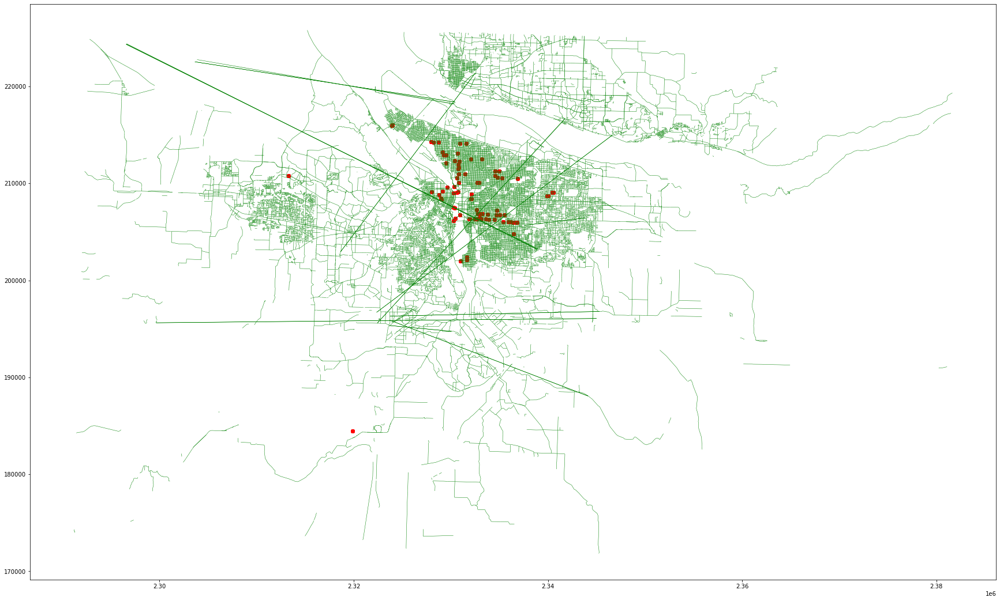

In [227]:
fig, ax = plt.subplots(figsize = (30,25)) 
ecoshort.plot(ax=ax,color="red")
road_proj2.plot(color="green",edgecolor='k',linewidth = 0.5,ax=ax) #Use your second dataframe

In [228]:
# Now calculate the mean speed for each count location
output_pointspeed=pt_speed.groupby(by=['osm_id_sensor'])['maxspeed'].mean().reset_index()
output_pointspeed

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,maxspeed
0,5516558.0,20.0
1,5522164.0,20.0
2,5527017.0,20.0
3,5528173.0,20.0
4,5529700.0,20.0
...,...,...
74,644432836.0,20.0
75,681301893.0,30.0
76,689032191.0,30.0
77,711588457.0,20.0


In [229]:
output_pointspeed.columns=["osm_id","Point Speed"]
output_pointspeed

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Point Speed
0,5516558.0,20.0
1,5522164.0,20.0
2,5527017.0,20.0
3,5528173.0,20.0
4,5529700.0,20.0
...,...,...
74,644432836.0,20.0
75,681301893.0,30.0
76,689032191.0,30.0
77,711588457.0,20.0


In [230]:
pt_speed_v1.columns

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Index(['site_id', 'site_name', 'sensor_type', 'year', 'region',
       'travel_pattern', 'AADBT', 'stv_adb', 'stv_c_adb', 'stl_raw',
       'latitude', 'longitude', 'comment', 'osm_id_sensor', 'buff_dist',
       'geometry_x', 'min_dist_to_school', 'min_dist_to_college',
       'min_dist_to_university', 'lanes', 'maxspeed_x', 'index', 'osm_id',
       'name', 'ref', 'type', 'oneway', 'bridge', 'maxspeed_y', 'geometry_y'],
      dtype='object')

In [231]:
# Now calculate the mean speed for each count location
output_pointspeed_v2=pt_speed_v1.groupby(by=['osm_id_sensor'])['maxspeed_x'].mean().reset_index()
output_pointspeed_v2.columns=['osm_id','maxspeed']
output_pointspeed_v2

,osm_id,maxspeed
0,5516558.0,20.0
1,5522164.0,20.0
2,5527017.0,20.0
3,5529700.0,20.0
4,5529833.0,20.0
...,...,...
61,595610339.0,30.0
62,603080294.0,20.0
63,644432836.0,20.0
64,711588457.0,20.0


# Calculate the road type of the closest link of count station

In [232]:
# Keep only functional class of road that we considered in our study to create catagorical varaibale

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [233]:
road_proj_type1=road_proj[road_proj['type']=='primary']                          
road_proj_type2=road_proj[road_proj['type']=='secondary']
road_proj_type3=road_proj[road_proj['type']=='tertiary']
road_proj_type4=road_proj[road_proj['type']=='residential']
road_proj_type5=road_proj[road_proj['type']=='path']
road_proj_type6=road_proj[road_proj['type']=='cycleway']
road_proj_type7=road_proj[road_proj['type']=='footway']
road_proj_type=pd.concat([road_proj_type1,road_proj_type2,road_proj_type3,road_proj_type4,road_proj_type5,road_proj_type6,road_proj_type7],axis=0).reset_index()
road_proj_type.head(5)

,index,osm_id,name,ref,type,oneway,bridge,maxspeed,geometry
0,20,4690136,Northwest Bethany Boulevard,None,primary,0,0,35.0,"LINESTRING (2317095.702 210007.374, 2317100.77..."
1,2885,5288409,Proctor Boulevard,US 26,primary,1,0,25.0,"LINESTRING (2362567.823 193771.422, 2362554.75..."
2,3074,5289540,Southeast Sunnyside Road,None,primary,1,0,40.0,"LINESTRING (2338449.854 198379.134, 2338466.66..."
3,3099,5289670,Southeast 1st Avenue,OR 99E,primary,0,0,35.0,"LINESTRING (2328190.079 179734.302, 2328248.65..."
4,3402,5290853,Pioneer Boulevard,US 26,primary,1,0,25.0,"LINESTRING (2361553.518 193797.982, 2361555.82..."


In [234]:
#def nearest_linestring(point, df_lines):
#    idx = df_lines.geometry.distance(point).idxmin()
#    return df_lines.loc[idx, 'type']

#ecoshort['type'] = ecoshort.geometry.apply(nearest_linestring, df_lines=road_proj_type)
#ecoshort
#ecoshort_rt=ecoshort.copy()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [235]:
# Now merged with road shape file
#road_merged_inner=pd.merge(ecoshort_speed, road_proj_type, right_on='osm_id', left_on='osm_id',how='inner')
#ecoshort_rt

In [236]:
road_merged_inner = pd.merge(left=road_proj_type, right=ecoshort, left_on='osm_id', right_on='osm_id_sensor',how='inner')
road_merged_inner.head()

,index,osm_id,name,ref,type,oneway,bridge,maxspeed_x,geometry_x,site_id,...,longitude,comment,osm_id_sensor,buff_dist,geometry_y,min_dist_to_school,min_dist_to_college,min_dist_to_university,lanes,maxspeed_y
0,42186,68675284,Southeast Division Street,None,secondary,0,0,25.0,"LINESTRING (2332821.361 206471.644, 2332829.96...",S110POR,...,-122.63782,NaN,68675284.0,2.0,POINT (2332960.554 206468.431),470.471947,4786.492292,8594.80781,2,25.0
1,42186,68675284,Southeast Division Street,None,secondary,0,0,25.0,"LINESTRING (2332821.361 206471.644, 2332829.96...",S110POR,...,-122.63782,NaN,68675284.0,1.5,POINT (2332960.554 206468.431),470.471947,4786.492292,8594.80781,2,25.0
2,42186,68675284,Southeast Division Street,None,secondary,0,0,25.0,"LINESTRING (2332821.361 206471.644, 2332829.96...",S110POR,...,-122.63782,NaN,68675284.0,1.0,POINT (2332960.554 206468.431),470.471947,4786.492292,8594.80781,2,25.0
3,42186,68675284,Southeast Division Street,None,secondary,0,0,25.0,"LINESTRING (2332821.361 206471.644, 2332829.96...",S110POR,...,-122.63782,NaN,68675284.0,0.75,POINT (2332960.554 206468.431),470.471947,4786.492292,8594.80781,2,25.0
4,42186,68675284,Southeast Division Street,None,secondary,0,0,25.0,"LINESTRING (2332821.361 206471.644, 2332829.96...",S110POR,...,-122.63782,NaN,68675284.0,0.5,POINT (2332960.554 206468.431),470.471947,4786.492292,8594.80781,2,25.0


In [237]:
# First identify the closest link from count station
#https://gis.stackexchange.com/questions/323884/performing-sjoin-on-polygons-and-lines-without-intersection-using-geopandas
#def nearest_linestring(point, df_lines):
#    idx = df_lines.geometry.distance(point).idxmin()
#    return df_lines.loc[idx, 'osm_id']

#ecoshort['osm_id'] = ecoshort.geometry.apply(nearest_linestring, df_lines=road_proj_type)
#ecoshort


C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [238]:
# Now merge with road shape file with OSM ID
#closest_road_type=pd.merge(ecoshort, road_proj_type, right_on='osm_id', left_on='osm_id',how='inner')
#closest_road_type
road_merged_inner.columns


Index(['index', 'osm_id', 'name', 'ref', 'type', 'oneway', 'bridge',
       'maxspeed_x', 'geometry_x', 'site_id', 'site_name', 'sensor_type',
       'year', 'region', 'travel_pattern', 'AADBT', 'stv_adb', 'stv_c_adb',
       'stl_raw', 'latitude', 'longitude', 'comment', 'osm_id_sensor',
       'buff_dist', 'geometry_y', 'min_dist_to_school', 'min_dist_to_college',
       'min_dist_to_university', 'lanes', 'maxspeed_y'],
      dtype='object')

In [239]:
pt_road_type1=road_merged_inner.loc[:,['osm_id_sensor','type']]
pt_road_type1.columns=['osm_id','road_type']
pt_road_type1.head()

,osm_id,road_type
0,68675284.0,secondary
1,68675284.0,secondary
2,68675284.0,secondary
3,68675284.0,secondary
4,68675284.0,secondary


# Convert this road catagory to binary as follows- 0 and 1

In [240]:
import numpy as np
pt_road_type1['primary_binary'] = np.where(pt_road_type1['road_type'] == 'primary', 1, 0)
pt_road_type1['secondary_binary'] = np.where(pt_road_type1['road_type'] == 'secondary', 1, 0)
pt_road_type1['tertiary_binary'] = np.where(pt_road_type1['road_type'] == 'tertiary', 1, 0)
pt_road_type1['residential_binary'] = np.where(pt_road_type1['road_type'] == 'residential', 1, 0)
pt_road_type1['path_binary'] = np.where(pt_road_type1['road_type'] == 'path', 1, 0)
pt_road_type1['cycleway_binary'] = np.where(pt_road_type1['road_type'] == 'cycleway', 1, 0)
pt_road_type1['footway_binary'] = np.where(pt_road_type1['road_type'] == 'footway', 1, 0)
pt_road_type1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,road_type,primary_binary,secondary_binary,tertiary_binary,residential_binary,path_binary,cycleway_binary,footway_binary
0,68675284.0,secondary,0,1,0,0,0,0,0
1,68675284.0,secondary,0,1,0,0,0,0,0
2,68675284.0,secondary,0,1,0,0,0,0,0
3,68675284.0,secondary,0,1,0,0,0,0,0
4,68675284.0,secondary,0,1,0,0,0,0,0


In [241]:
pt_road_type2=pt_road_type1.drop(['road_type'],axis=1)
pt_road_type2=pt_road_type2.drop_duplicates(subset=['osm_id'],keep='first')
pt_road_type2.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,primary_binary,secondary_binary,tertiary_binary,residential_binary,path_binary,cycleway_binary,footway_binary
0,68675284.0,0,1,0,0,0,0,0
7,117036270.0,0,1,0,0,0,0,0
14,117058378.0,0,1,0,0,0,0,0
21,119626782.0,0,1,0,0,0,0,0
28,121304231.0,0,1,0,0,0,0,0


# Calculate the Bridges

In [242]:
bridge=inter_road.copy()
output_bridge=bridge.groupby(by=['osm_id_sensor'])['bridge'].sum().reset_index()
# Convert binary, presence of bridge=1, absence of bridge=0
output_bridge.loc[output_bridge['bridge'] > 0, 'bridge'] = 1
output_bridge.loc[output_bridge['bridge'] ==0, 'bridge'] = 2
output_bridge.columns=['osm_id','bridge']
output_bridge.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,bridge
0,5516558.0,2
1,5522164.0,2
2,5527017.0,2
3,5528173.0,2
4,5529700.0,2


# Calculate the bridge from spatial join of count location and bridge line shape file

In [243]:
bridge_only=road_proj
bridge_only.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,name,ref,type,oneway,bridge,maxspeed,geometry
0,4440143,Northeast Hodes Street,None,residential,0,0,25.0,"LINESTRING (2313114.363 209795.929, 2313130.80..."
1,4440967,Northeast Butler Street,None,secondary,0,0,NaN,"LINESTRING (2312182.520 210710.249, 2312185.06..."
2,4441934,None,None,motorway_link,1,0,NaN,"LINESTRING (2315133.607 210977.179, 2315153.70..."
3,4443830,Northeast 85th Avenue,None,residential,0,0,25.0,"LINESTRING (2313220.539 210079.632, 2313218.92..."
4,4443836,Northeast Windstone Street,None,residential,0,0,25.0,"LINESTRING (2313381.281 210038.384, 2313371.72..."


In [244]:
#count_station
bridge_only.columns

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Index(['osm_id', 'name', 'ref', 'type', 'oneway', 'bridge', 'maxspeed',
       'geometry'],
      dtype='object')

In [245]:
# Join count location file with road file
pointInline_bridge =pd.merge (left=ecoshort, right=bridge_only, left_on='osm_id_sensor', right_on='osm_id',how='inner')
pointInline_bridge.head()

,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,lanes,maxspeed_x,osm_id,name,ref,type,oneway,bridge,maxspeed_y,geometry_y
0,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.36369,109.219178,80.945205,9915.0,...,1,30.0,681301893,Hawthorne Bridge,None,path,1,1,NaN,"LINESTRING (2330281.659 207530.108, 2330221.70..."
1,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.36369,109.219178,80.945205,9915.0,...,1,30.0,681301893,Hawthorne Bridge,None,path,1,1,NaN,"LINESTRING (2330281.659 207530.108, 2330221.70..."
2,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.36369,109.219178,80.945205,9915.0,...,1,30.0,681301893,Hawthorne Bridge,None,path,1,1,NaN,"LINESTRING (2330281.659 207530.108, 2330221.70..."
3,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.36369,109.219178,80.945205,9915.0,...,1,30.0,681301893,Hawthorne Bridge,None,path,1,1,NaN,"LINESTRING (2330281.659 207530.108, 2330221.70..."
4,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.36369,109.219178,80.945205,9915.0,...,1,30.0,681301893,Hawthorne Bridge,None,path,1,1,NaN,"LINESTRING (2330281.659 207530.108, 2330221.70..."


In [246]:
# Join by OSM ID
#pointInline_bridge_v2 = pd.merge(left=bridge_only, right=count_station, left_on='osm_id', right_on='OSM_ID',how='inner')
#pointInline_bridge_v2


C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [247]:
output_point_bridge=pointInline_bridge.groupby(by=['osm_id_sensor'])['bridge'].sum().reset_index()
output_point_bridge.head()

,osm_id_sensor,bridge
0,5516558.0,0
1,5522164.0,0
2,5527017.0,0
3,5528173.0,0
4,5529700.0,0


In [248]:
output_point_bridge.loc[output_point_bridge['bridge'] > 0, 'bridge'] = 1
output_point_bridge.loc[output_point_bridge['bridge'] ==0, 'bridge'] = 2
output_point_bridge.columns=["osm_id","Point Bridge"]
output_point_bridge.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Point Bridge
0,5516558.0,2
1,5522164.0,2
2,5527017.0,2
3,5528173.0,2
4,5529700.0,2


# Calculate the Distance from count station to land use:Distance to water body, Distance to park,Distance to green space area,Distance to commercial,Distance to industrial area,Distance to residential area ,Distance to Retail area,Distance to Residential area



# Distance to park

In [249]:
def min_distance_ppoly(point, polygon):
    return polygon.distance(point).min()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [250]:
nature_proj1.head(5)

,osm_id,name,type,geometry
0,4946908,Johnson Lake,water,"POLYGON ((2338708.334 213130.725, 2338705.232 ..."
1,4946909,None,water,"POLYGON ((2336249.035 213912.791, 2336249.987 ..."
2,4946910,None,water,"POLYGON ((2335119.556 214144.065, 2335122.656 ..."
3,4946943,None,water,"POLYGON ((2337406.144 213587.835, 2337415.023 ..."
4,4946969,None,water,"POLYGON ((2340158.194 212791.429, 2340135.944 ..."


In [251]:
park_only=nature_proj1[nature_proj1['type'].str.contains('park')]
park_only.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,name,type,geometry
12,23226226,Library Green,park,"POLYGON ((2319865.876 204453.857, 2319873.163 ..."
13,23226227,Beaverton City Park,park,"POLYGON ((2319708.428 204481.909, 2319719.794 ..."
14,23226241,Griffith Park,park,"POLYGON ((2320515.779 204636.197, 2320514.297 ..."
15,23240422,Memorial Park,park,"POLYGON ((2319733.467 204299.410, 2319712.112 ..."
16,23240423,Little People's Park,park,"POLYGON ((2320831.119 204315.002, 2320831.315 ..."


In [252]:
ecoshort.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,longitude,comment,osm_id_sensor,buff_dist,geometry,min_dist_to_school,min_dist_to_college,min_dist_to_university,lanes,maxspeed
0,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.36369,109.219178,80.945205,9915.0,...,-122.67284,NaN,681301893.0,2.0,POINT (2330251.902 207544.074),2262.300738,1384.844295,3131.27668,1,30.0
1,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.36369,109.219178,80.945205,9915.0,...,-122.67284,NaN,681301893.0,1.5,POINT (2330251.902 207544.074),2262.300738,1384.844295,3131.27668,1,30.0
2,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.36369,109.219178,80.945205,9915.0,...,-122.67284,NaN,681301893.0,1.0,POINT (2330251.902 207544.074),2262.300738,1384.844295,3131.27668,1,30.0
3,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.36369,109.219178,80.945205,9915.0,...,-122.67284,NaN,681301893.0,0.75,POINT (2330251.902 207544.074),2262.300738,1384.844295,3131.27668,1,30.0
4,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.36369,109.219178,80.945205,9915.0,...,-122.67284,NaN,681301893.0,0.5,POINT (2330251.902 207544.074),2262.300738,1384.844295,3131.27668,1,30.0


In [253]:
ecoshort['min_dist_to_polygon'] = ecoshort.geometry.apply(min_distance_ppoly, args=(park_only,))*3.28084
ecoshort.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,comment,osm_id_sensor,buff_dist,geometry,min_dist_to_school,min_dist_to_college,min_dist_to_university,lanes,maxspeed,min_dist_to_polygon
0,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.36369,109.219178,80.945205,9915.0,...,NaN,681301893.0,2.0,POINT (2330251.902 207544.074),2262.300738,1384.844295,3131.27668,1,30.0,97.697772
1,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.36369,109.219178,80.945205,9915.0,...,NaN,681301893.0,1.5,POINT (2330251.902 207544.074),2262.300738,1384.844295,3131.27668,1,30.0,97.697772
2,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.36369,109.219178,80.945205,9915.0,...,NaN,681301893.0,1.0,POINT (2330251.902 207544.074),2262.300738,1384.844295,3131.27668,1,30.0,97.697772
3,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.36369,109.219178,80.945205,9915.0,...,NaN,681301893.0,0.75,POINT (2330251.902 207544.074),2262.300738,1384.844295,3131.27668,1,30.0,97.697772
4,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.36369,109.219178,80.945205,9915.0,...,NaN,681301893.0,0.5,POINT (2330251.902 207544.074),2262.300738,1384.844295,3131.27668,1,30.0,97.697772


In [254]:
Park_distance1=ecoshort.loc[:,['osm_id_sensor','min_dist_to_polygon']]
Park_distance1.columns=["osm_id","Distance to Park"]
Park_distance1=Park_distance1.drop_duplicates(subset=['osm_id'],keep='first')
Park_distance1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Distance to Park
0,681301893.0,97.697772
7,689032191.0,574.500142
14,322079535.0,1302.850450
21,348027806.0,467.515595
28,126306263.0,2114.651376


# cc distance to park

In [255]:
parkcc=park_only.copy()
parkcc['geometry']=parkcc['geometry'].centroid
ecoshort['min_dist_to_polygon'] = ecoshort.geometry.apply(min_distance_ppoly, args=(parkcc,))*3.28084
parkcc_distance1=ecoshort.loc[:,['osm_id_sensor','min_dist_to_polygon']]
parkcc_distance1.columns=["osm_id","Distance to Park Center"]
parkcc_distance1=parkcc_distance1.drop_duplicates(subset=['osm_id'],keep='first')
parkcc_distance1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Distance to Park Center
0,681301893.0,868.584865
7,689032191.0,1213.522753
14,322079535.0,1541.411058
21,348027806.0,570.304916
28,126306263.0,2314.894907


# Distance to water body

In [256]:
water_only=nature_proj1[nature_proj1['type'].str.contains('water')]
water_only.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,name,type,geometry
0,4946908,Johnson Lake,water,"POLYGON ((2338708.334 213130.725, 2338705.232 ..."
1,4946909,None,water,"POLYGON ((2336249.035 213912.791, 2336249.987 ..."
2,4946910,None,water,"POLYGON ((2335119.556 214144.065, 2335122.656 ..."
3,4946943,None,water,"POLYGON ((2337406.144 213587.835, 2337415.023 ..."
4,4946969,None,water,"POLYGON ((2340158.194 212791.429, 2340135.944 ..."


In [257]:
ecoshort['min_dist_to_polygon'] = ecoshort.geometry.apply(min_distance_ppoly, args=(water_only,))*3.28084
ecoshort.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,comment,osm_id_sensor,buff_dist,geometry,min_dist_to_school,min_dist_to_college,min_dist_to_university,lanes,maxspeed,min_dist_to_polygon
0,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.36369,109.219178,80.945205,9915.0,...,NaN,681301893.0,2.0,POINT (2330251.902 207544.074),2262.300738,1384.844295,3131.27668,1,30.0,258.894732
1,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.36369,109.219178,80.945205,9915.0,...,NaN,681301893.0,1.5,POINT (2330251.902 207544.074),2262.300738,1384.844295,3131.27668,1,30.0,258.894732
2,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.36369,109.219178,80.945205,9915.0,...,NaN,681301893.0,1.0,POINT (2330251.902 207544.074),2262.300738,1384.844295,3131.27668,1,30.0,258.894732
3,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.36369,109.219178,80.945205,9915.0,...,NaN,681301893.0,0.75,POINT (2330251.902 207544.074),2262.300738,1384.844295,3131.27668,1,30.0,258.894732
4,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.36369,109.219178,80.945205,9915.0,...,NaN,681301893.0,0.5,POINT (2330251.902 207544.074),2262.300738,1384.844295,3131.27668,1,30.0,258.894732


In [258]:
water_distance1=ecoshort.loc[:,['osm_id_sensor','min_dist_to_polygon']]
water_distance1.columns=["osm_id","Distance to Water Body"]
water_distance1=water_distance1.drop_duplicates(subset=['osm_id'],keep='first')
water_distance1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Distance to Water Body
0,681301893.0,258.894732
7,689032191.0,590.738915
14,322079535.0,4480.744001
21,348027806.0,83.806994
28,126306263.0,817.075286


In [259]:
watercc=water_only.copy()
watercc['geometry']=watercc['geometry'].centroid
ecoshort['min_dist_to_polygon'] = ecoshort.geometry.apply(min_distance_ppoly, args=(watercc,))*3.28084
watercc_distance1=ecoshort.loc[:,['osm_id_sensor','min_dist_to_polygon']]
watercc_distance1.columns=["osm_id","Distance to Water Center"]
watercc_distance1=watercc_distance1.drop_duplicates(subset=['osm_id'],keep='first')
watercc_distance1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Distance to Water Center
0,681301893.0,571.366084
7,689032191.0,956.582365
14,322079535.0,4502.384829
21,348027806.0,1140.061341
28,126306263.0,836.271055


# Distance To  Forest

In [260]:
forest_only=nature_proj1[nature_proj1['type'].str.contains('forest')]
forest_only.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,name,type,geometry
7,4951160,McGuire Island,forest,"POLYGON ((2345349.066 212653.673, 2345219.613 ..."
8,4951161,None,forest,"POLYGON ((2347473.712 212397.505, 2347482.688 ..."
9,4951163,Ackerman Island,forest,"POLYGON ((2346387.798 214226.327, 2346493.014 ..."
10,4951565,East Island,forest,"POLYGON ((2331173.062 203544.184, 2331139.233 ..."
11,23225779,None,forest,"POLYGON ((2319223.438 206118.306, 2319202.631 ..."


In [261]:
ecoshort['min_dist_to_polygon'] = ecoshort.geometry.apply(min_distance_ppoly, args=(forest_only,))*3.28084
ecoshort.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,comment,osm_id_sensor,buff_dist,geometry,min_dist_to_school,min_dist_to_college,min_dist_to_university,lanes,maxspeed,min_dist_to_polygon
0,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.36369,109.219178,80.945205,9915.0,...,NaN,681301893.0,2.0,POINT (2330251.902 207544.074),2262.300738,1384.844295,3131.27668,1,30.0,127.540051
1,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.36369,109.219178,80.945205,9915.0,...,NaN,681301893.0,1.5,POINT (2330251.902 207544.074),2262.300738,1384.844295,3131.27668,1,30.0,127.540051
2,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.36369,109.219178,80.945205,9915.0,...,NaN,681301893.0,1.0,POINT (2330251.902 207544.074),2262.300738,1384.844295,3131.27668,1,30.0,127.540051
3,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.36369,109.219178,80.945205,9915.0,...,NaN,681301893.0,0.75,POINT (2330251.902 207544.074),2262.300738,1384.844295,3131.27668,1,30.0,127.540051
4,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.36369,109.219178,80.945205,9915.0,...,NaN,681301893.0,0.5,POINT (2330251.902 207544.074),2262.300738,1384.844295,3131.27668,1,30.0,127.540051


In [262]:
forest_distance1=ecoshort.loc[:,['osm_id_sensor','min_dist_to_polygon']]
forest_distance1.columns=["osm_id","Distance to forest"]
forest_distance1=forest_distance1.drop_duplicates(subset=['osm_id'],keep='first')
forest_distance1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Distance to forest
0,681301893.0,127.540051
7,689032191.0,550.680550
14,322079535.0,2370.339193
21,348027806.0,467.515595
28,126306263.0,1065.995386


In [263]:
forestcc=forest_only.copy()
forestcc['geometry']=forestcc['geometry'].centroid
ecoshort['min_dist_to_polygon'] = ecoshort.geometry.apply(min_distance_ppoly, args=(forestcc,))*3.28084
forestcc_distance1=ecoshort.loc[:,['osm_id_sensor','min_dist_to_polygon']]
forestcc_distance1.columns=["osm_id","Distance to Forest Center"]
forestcc_distance1=forestcc_distance1.drop_duplicates(subset=['osm_id'],keep='first')
forestcc_distance1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Distance to Forest Center
0,681301893.0,206.968342
7,689032191.0,608.632949
14,322079535.0,2825.732463
21,348027806.0,523.170259
28,126306263.0,1100.164174


# Distance to green space area

In [264]:
grass_only=luse_proj[luse_proj['type'].str.contains('grass')]
grass_only.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,name,type,geometry
1,24000302,None,grass,"POLYGON ((2316254.380 207136.871, 2316258.462 ..."
96,36796200,None,grass,"POLYGON ((2331010.097 209484.287, 2331026.737 ..."
109,39412221,None,grass,"POLYGON ((2330760.060 210843.431, 2330814.337 ..."
120,40775705,None,grass,"POLYGON ((2331120.983 207412.715, 2331139.760 ..."
125,40941298,None,grass,"POLYGON ((2330792.988 211074.076, 2330815.557 ..."


In [265]:
ecoshort['min_dist_to_polygon'] = ecoshort.geometry.apply(min_distance_ppoly, args=(grass_only,))*3.28084
ecoshort.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,comment,osm_id_sensor,buff_dist,geometry,min_dist_to_school,min_dist_to_college,min_dist_to_university,lanes,maxspeed,min_dist_to_polygon
0,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.36369,109.219178,80.945205,9915.0,...,NaN,681301893.0,2.0,POINT (2330251.902 207544.074),2262.300738,1384.844295,3131.27668,1,30.0,451.154853
1,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.36369,109.219178,80.945205,9915.0,...,NaN,681301893.0,1.5,POINT (2330251.902 207544.074),2262.300738,1384.844295,3131.27668,1,30.0,451.154853
2,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.36369,109.219178,80.945205,9915.0,...,NaN,681301893.0,1.0,POINT (2330251.902 207544.074),2262.300738,1384.844295,3131.27668,1,30.0,451.154853
3,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.36369,109.219178,80.945205,9915.0,...,NaN,681301893.0,0.75,POINT (2330251.902 207544.074),2262.300738,1384.844295,3131.27668,1,30.0,451.154853
4,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.36369,109.219178,80.945205,9915.0,...,NaN,681301893.0,0.5,POINT (2330251.902 207544.074),2262.300738,1384.844295,3131.27668,1,30.0,451.154853


In [266]:
grass_distance1=ecoshort.loc[:,['osm_id_sensor','min_dist_to_polygon']]
grass_distance1.columns=["osm_id","Distance to Grass"]
grass_distance1=grass_distance1.drop_duplicates(subset=['osm_id'],keep='first')
grass_distance1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Distance to Grass
0,681301893.0,451.154853
7,689032191.0,927.089801
14,322079535.0,597.567548
21,348027806.0,867.160108
28,126306263.0,179.512458


In [267]:
grasscc=grass_only.copy()
grasscc['geometry']=grasscc['geometry'].centroid
ecoshort['min_dist_to_polygon'] = ecoshort.geometry.apply(min_distance_ppoly, args=(grasscc,))*3.28084
grasscc_distance1=ecoshort.loc[:,['osm_id_sensor','min_dist_to_polygon']]
grasscc_distance1.columns=["osm_id","Distance to Grass Center"]
grasscc_distance1=grasscc_distance1.drop_duplicates(subset=['osm_id'],keep='first')
grasscc_distance1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Distance to Grass Center
0,681301893.0,583.039213
7,689032191.0,1061.413738
14,322079535.0,977.304200
21,348027806.0,919.150373
28,126306263.0,294.336200


# Distance to commercial

In [268]:
commercial_only=luse_proj[luse_proj['type'].str.contains('commercial')]
ecoshort['min_dist_to_polygon'] = ecoshort.geometry.apply(min_distance_ppoly, args=(commercial_only,))*3.28084
commercial_distance1=ecoshort.loc[:,['osm_id_sensor','min_dist_to_polygon']]
commercial_distance1.columns=["osm_id","Distance to Commercial Area"]
commercial_distance1=commercial_distance1.drop_duplicates(subset=['osm_id'],keep='first')
commercial_distance1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Distance to Commercial Area
0,681301893.0,503.745112
7,689032191.0,954.762189
14,322079535.0,1835.617509
21,348027806.0,901.853051
28,126306263.0,402.593918


In [269]:
commercialcc=commercial_only.copy()
commercialcc['geometry']=commercialcc['geometry'].centroid
ecoshort['min_dist_to_polygon'] = ecoshort.geometry.apply(min_distance_ppoly, args=(commercialcc,))*3.28084
commercialcc_distance1=ecoshort.loc[:,['osm_id_sensor','min_dist_to_polygon']]
commercialcc_distance1.columns=["osm_id","Distance to Commercial Area Center"]
commercialcc_distance1=commercialcc_distance1.drop_duplicates(subset=['osm_id'],keep='first')
commercialcc_distance1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Distance to Commercial Area Center
0,681301893.0,704.845087
7,689032191.0,1095.460141
14,322079535.0,1932.118410
21,348027806.0,1634.295526
28,126306263.0,1032.069286


# Distance to industrial area

In [270]:
industrial_only=luse_proj[luse_proj['type'].str.contains('industrial')]
ecoshort['min_dist_to_polygon'] = ecoshort.geometry.apply(min_distance_ppoly, args=(industrial_only,))*3.28084
industrial_distance1=ecoshort.loc[:,['osm_id_sensor','min_dist_to_polygon']]
industrial_distance1.columns=["osm_id","Distance to Industrial Area"]
industrial_distance1=industrial_distance1.drop_duplicates(subset=['osm_id'],keep='first')
industrial_distance1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Distance to Industrial Area
0,681301893.0,50.004558
7,689032191.0,15.282872
14,322079535.0,297.246675
21,348027806.0,2422.594005
28,126306263.0,1018.596857


In [271]:
industrialcc=industrial_only.copy()
industrialcc['geometry']=industrialcc['geometry'].centroid
ecoshort['min_dist_to_polygon'] = ecoshort.geometry.apply(min_distance_ppoly, args=(industrialcc,))*3.28084
industrialcc_distance1=ecoshort.loc[:,['osm_id_sensor','min_dist_to_polygon']]
industrialcc_distance1.columns=["osm_id","Distance to Industrial Center"]
industrialcc_distance1=industrialcc_distance1.drop_duplicates(subset=['osm_id'],keep='first')
industrialcc_distance1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Distance to Industrial Center
0,681301893.0,2484.305831
7,689032191.0,2066.164020
14,322079535.0,791.769971
21,348027806.0,2755.843751
28,126306263.0,1455.399632


# Distance to Retail area

In [272]:
retail_only=luse_proj[luse_proj['type'].str.contains('retail')]
ecoshort['min_dist_to_polygon'] = ecoshort.geometry.apply(min_distance_ppoly, args=(retail_only,))*3.28084
retail_distance1=ecoshort.loc[:,['osm_id_sensor','min_dist_to_polygon']]
retail_distance1.columns=["osm_id","Distance to Retail Area"]
retail_distance1=retail_distance1.drop_duplicates(subset=['osm_id'],keep='first')
retail_distance1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Distance to Retail Area
0,681301893.0,1490.068155
7,689032191.0,1935.000214
14,322079535.0,3027.603724
21,348027806.0,3324.026602
28,126306263.0,3854.192433


In [273]:
retailcc=retail_only.copy()
retailcc['geometry']=retailcc['geometry'].centroid
ecoshort['min_dist_to_polygon'] = ecoshort.geometry.apply(min_distance_ppoly, args=(retailcc,))*3.28084
retailcc_distance1=ecoshort.loc[:,['osm_id_sensor','min_dist_to_polygon']]
retailcc_distance1.columns=["osm_id","Distance to Retail Center"]
retailcc_distance1=retailcc_distance1.drop_duplicates(subset=['osm_id'],keep='first')
retailcc_distance1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Distance to Retail Center
0,681301893.0,1819.318379
7,689032191.0,2261.026551
14,322079535.0,3221.420050
21,348027806.0,3787.053696
28,126306263.0,4224.844583


# Distance to Residential

In [274]:
residential_only=luse_proj[luse_proj['type'].str.contains('residential')]
ecoshort['min_dist_to_polygon'] = ecoshort.geometry.apply(min_distance_ppoly, args=(residential_only,))*3.28084
residential_distance1=ecoshort.loc[:,['osm_id_sensor','min_dist_to_polygon']]
residential_distance1.columns=["osm_id","Distance to Residential Area"]
residential_distance1=residential_distance1.drop_duplicates(subset=['osm_id'],keep='first')
residential_distance1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Distance to Residential Area
0,681301893.0,1622.460588
7,689032191.0,1550.302056
14,322079535.0,271.703041
21,348027806.0,680.133539
28,126306263.0,1001.602483


In [275]:
residentialcc=residential_only.copy()
residentialcc['geometry']=residentialcc['geometry'].centroid
ecoshort['min_dist_to_polygon'] = ecoshort.geometry.apply(min_distance_ppoly, args=(residentialcc,))*3.28084
residentialcc_distance1=ecoshort.loc[:,['osm_id_sensor','min_dist_to_polygon']]
residentialcc_distance1.columns=["osm_id","Distance to Residential Center"]
residentialcc_distance1=residentialcc_distance1.drop_duplicates(subset=['osm_id'],keep='first')
residentialcc_distance1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Distance to Residential Center
0,681301893.0,1900.519490
7,689032191.0,1919.730423
14,322079535.0,376.347778
21,348027806.0,1382.627569
28,126306263.0,1356.833372


# Import the OSM Building file and use Portland City Hall as the CBD, then calculate the distance from CBD

In [276]:
building1.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,name,type,geometry
0,23514070,Sunset Transit Center,parking,"POLYGON ((-122.78303 45.51060, -122.78200 45.5..."
1,23514323,East Parking Structure,parking,"POLYGON ((-122.77210 45.50937, -122.77066 45.5..."
2,23515081,Smart Park,parking,"POLYGON ((-122.68201 45.51988, -122.68217 45.5..."
3,24635906,Moda Center,None,"POLYGON ((-122.66696 45.53237, -122.66709 45.5..."
4,25667453,DoubleTree,hotel,"POLYGON ((-122.65520 45.53118, -122.65516 45.5..."


In [277]:
# Reproject the geometries by replacing the values with projected ones
bld_proj = building1.to_crs(epsg=2838)
bld_proj.head(10)
bld_proj1=bld_proj.loc[(bld_proj.name=='Portland City Hall')]
bld_proj1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,name,type,geometry
5979,141453089,Portland City Hall,public,"POLYGON ((2329750.752 207701.308, 2329755.095 ..."


C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<AxesSubplot:>

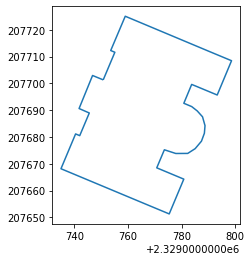

In [278]:
bld_proj1.geometry.boundary.plot()

In [279]:
# copy GeoDataFrame
bld_proj2 = bld_proj1.copy()
# change geometry 
bld_proj2['geometry'] = bld_proj2['geometry'].centroid
bld_proj2

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,name,type,geometry
5979,141453089,Portland City Hall,public,POINT (2329765.806 207688.570)


C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<AxesSubplot:>

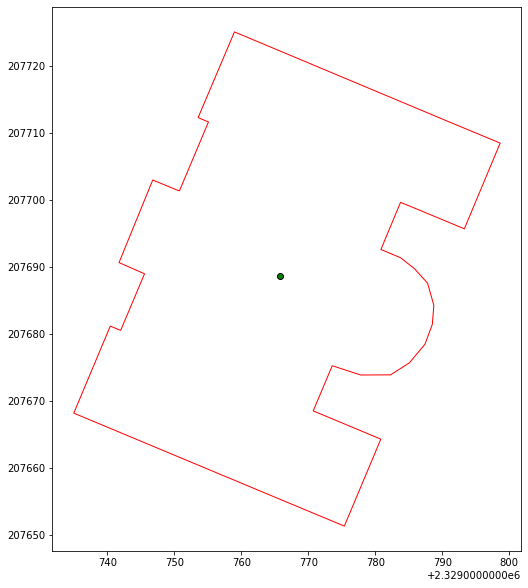

In [280]:
fig, ax = plt.subplots(figsize = (15,10)) 
bld_proj2.plot(ax=ax,color="green",edgecolor='k')
bld_proj1.geometry.boundary.plot(color="red",edgecolor='k',linewidth = 1,ax=ax) #Use your second dataframe

In [281]:
# Calculate the distance from CBD to all count locations
ecoshort['min_dist_to_CBD'] = ecoshort.geometry.apply(min_distance_ppoly, args=(bld_proj2,))*3.28084
ecoshort.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,osm_id_sensor,buff_dist,geometry,min_dist_to_school,min_dist_to_college,min_dist_to_university,lanes,maxspeed,min_dist_to_polygon,min_dist_to_CBD
0,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.36369,109.219178,80.945205,9915.0,...,681301893.0,2.0,POINT (2330251.902 207544.074),2262.300738,1384.844295,3131.27668,1,30.0,1900.51949,1663.77388
1,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.36369,109.219178,80.945205,9915.0,...,681301893.0,1.5,POINT (2330251.902 207544.074),2262.300738,1384.844295,3131.27668,1,30.0,1900.51949,1663.77388
2,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.36369,109.219178,80.945205,9915.0,...,681301893.0,1.0,POINT (2330251.902 207544.074),2262.300738,1384.844295,3131.27668,1,30.0,1900.51949,1663.77388
3,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.36369,109.219178,80.945205,9915.0,...,681301893.0,0.75,POINT (2330251.902 207544.074),2262.300738,1384.844295,3131.27668,1,30.0,1900.51949,1663.77388
4,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.36369,109.219178,80.945205,9915.0,...,681301893.0,0.5,POINT (2330251.902 207544.074),2262.300738,1384.844295,3131.27668,1,30.0,1900.51949,1663.77388


In [282]:
CBD_distance1=ecoshort.loc[:,['osm_id_sensor','min_dist_to_CBD']]
CBD_distance1.columns=["osm_id","Distance to CBD"]
CBD_distance1.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Distance to CBD
0,681301893.0,1663.77388
1,681301893.0,1663.77388
2,681301893.0,1663.77388
3,681301893.0,1663.77388
4,681301893.0,1663.77388


# End of Distance calculation

# Now write coding for socio-demographic variable extraction

1. Population density
2. Employment density
3. Household Density
4. Number of students (student access)
5. Median age
6. Percentage of female
7. Percentage of male
8. Percentage of African American population
9. Percentage of white population
10. Median Household Income
11. Education (% of population having at least college education)

In [283]:
# Read the Block group 
#bg=gpd.read_file("../input/oregon-sd-data/OR_blck_grp_2017.shp")
bg.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,STATEFP,COUNTYFP,TRACTCE,BLKGRPCE,GEOID,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,GISJOIN,Shape_Leng,Shape_Area,geometry
0,41,001,950100,1,410019501001,Block Group 1,G5030,S,2.205986e+09,13837275.0,+44.5468040,-118.1781784,G41000109501001,323465.419044,2.219823e+09,"POLYGON ((-1737359.842 1029170.395, -1737338.7..."
1,41,001,950100,2,410019501002,Block Group 2,G5030,S,1.926901e+08,12317.0,+44.9562277,-118.0519082,G41000109501002,109051.976354,1.927024e+08,"POLYGON ((-1712627.242 1038313.861, -1712879.9..."
2,41,001,950100,3,410019501003,Block Group 3,G5030,S,4.723892e+08,639439.0,+44.8443756,-118.0396603,G41000109501003,140639.998011,4.730286e+08,"POLYGON ((-1712321.712 1019131.259, -1712275.9..."
3,41,001,950200,1,410019502001,Block Group 1,G5030,S,1.469016e+07,0.0,+44.7764594,-117.8821056,G41000109502001,22860.454690,1.469017e+07,"POLYGON ((-1712969.088 1014304.981, -1712991.9..."
4,41,001,950200,2,410019502002,Block Group 2,G5030,S,1.009492e+06,0.0,+44.7753666,-117.8349670,G41000109502002,4878.558266,1.009497e+06,"POLYGON ((-1709338.523 1011818.662, -1709343.2..."


In [284]:
bg.shape

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


(2627, 16)

In [285]:
print(bg.crs)

PROJCS["USA_Contiguous_Albers_Equal_Area_Conic",GEOGCS["NAD83",DATUM["North_American_Datum_1983",SPHEROID["GRS 1980",6378137,298.257222101,AUTHORITY["EPSG","7019"]],AUTHORITY["EPSG","6269"]],PRIMEM["Greenwich",0],UNIT["Degree",0.0174532925199433],AUTHORITY["EPSG","4269"]],PROJECTION["Albers_Conic_Equal_Area"],PARAMETER["latitude_of_center",37.5],PARAMETER["longitude_of_center",-96],PARAMETER["standard_parallel_1",29.5],PARAMETER["standard_parallel_2",45.5],PARAMETER["false_easting",0],PARAMETER["false_northing",0],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH],AUTHORITY["ESRI","102003"]]


In [286]:
from geopandas import GeoDataFrame
from shapely.geometry import Point
import shapely.wkt
bg["wktcolumn"]= bg.apply(lambda row:row['geometry'].wkt, axis=1)
bg
geometry = bg['wktcolumn'].map(shapely.wkt.loads)
bg1 = bg.drop('wktcolumn', axis=1)
bg2 = gpd.GeoDataFrame(bg1, crs='esri:102003', geometry=geometry)
bg2.head(5)

,STATEFP,COUNTYFP,TRACTCE,BLKGRPCE,GEOID,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,GISJOIN,Shape_Leng,Shape_Area,geometry
0,41,001,950100,1,410019501001,Block Group 1,G5030,S,2.205986e+09,13837275.0,+44.5468040,-118.1781784,G41000109501001,323465.419044,2.219823e+09,"POLYGON ((-1737359.842 1029170.395, -1737338.7..."
1,41,001,950100,2,410019501002,Block Group 2,G5030,S,1.926901e+08,12317.0,+44.9562277,-118.0519082,G41000109501002,109051.976354,1.927024e+08,"POLYGON ((-1712627.242 1038313.861, -1712879.9..."
2,41,001,950100,3,410019501003,Block Group 3,G5030,S,4.723892e+08,639439.0,+44.8443756,-118.0396603,G41000109501003,140639.998011,4.730286e+08,"POLYGON ((-1712321.712 1019131.259, -1712275.9..."
3,41,001,950200,1,410019502001,Block Group 1,G5030,S,1.469016e+07,0.0,+44.7764594,-117.8821056,G41000109502001,22860.454690,1.469017e+07,"POLYGON ((-1712969.088 1014304.981, -1712991.9..."
4,41,001,950200,2,410019502002,Block Group 2,G5030,S,1.009492e+06,0.0,+44.7753666,-117.8349670,G41000109502002,4878.558266,1.009497e+06,"POLYGON ((-1709338.523 1011818.662, -1709343.2..."


In [287]:
# set the co-ordinate system first
#bg2 = bg.set_crs("EPSG:102003")

#bg2 = gpd.GeoSeries(bg['geometry'], crs={'init': 'epsg:102003'})

# Let's take a copy of our layer
bg_proj = bg2.copy()

# Reproject the geometries by replacing the values with projected ones
bg_proj = bg_proj.to_crs('epsg:2838')
bg_proj.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,STATEFP,COUNTYFP,TRACTCE,BLKGRPCE,GEOID,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,GISJOIN,Shape_Leng,Shape_Area,geometry
0,41,001,950100,1,410019501001,Block Group 1,G5030,S,2.205986e+09,13837275.0,+44.5468040,-118.1781784,G41000109501001,323465.419044,2.219823e+09,"POLYGON ((2679731.350 136865.451, 2679752.280 ..."
1,41,001,950100,2,410019501002,Block Group 2,G5030,S,1.926901e+08,12317.0,+44.9562277,-118.0519082,G41000109501002,109051.976354,1.927024e+08,"POLYGON ((2701277.965 152087.049, 2701093.604 ..."
2,41,001,950100,3,410019501003,Block Group 3,G5030,S,4.723892e+08,639439.0,+44.8443756,-118.0396603,G41000109501003,140639.998011,4.730286e+08,"POLYGON ((2706558.268 133671.514, 2706650.307 ..."
3,41,001,950200,1,410019502001,Block Group 1,G5030,S,1.469016e+07,0.0,+44.7764594,-117.8821056,G41000109502001,22860.454690,1.469017e+07,"POLYGON ((2707186.724 128851.700, 2707187.625 ..."
4,41,001,950200,2,410019502002,Block Group 2,G5030,S,1.009492e+06,0.0,+44.7753666,-117.8349670,G41000109502002,4878.558266,1.009497e+06,"POLYGON ((2711345.513 127396.863, 2711346.377 ..."


In [288]:
bg_proj["Total block Area"]=bg_proj.area
bg_proj.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,STATEFP,COUNTYFP,TRACTCE,BLKGRPCE,GEOID,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,INTPTLAT,INTPTLON,GISJOIN,Shape_Leng,Shape_Area,geometry,Total block Area
0,41,001,950100,1,410019501001,Block Group 1,G5030,S,2.205986e+09,13837275.0,+44.5468040,-118.1781784,G41000109501001,323465.419044,2.219823e+09,"POLYGON ((2679731.350 136865.451, 2679752.280 ...",2.219628e+09
1,41,001,950100,2,410019501002,Block Group 2,G5030,S,1.926901e+08,12317.0,+44.9562277,-118.0519082,G41000109501002,109051.976354,1.927024e+08,"POLYGON ((2701277.965 152087.049, 2701093.604 ...",1.926638e+08
2,41,001,950100,3,410019501003,Block Group 3,G5030,S,4.723892e+08,639439.0,+44.8443756,-118.0396603,G41000109501003,140639.998011,4.730286e+08,"POLYGON ((2706558.268 133671.514, 2706650.307 ...",4.729412e+08
3,41,001,950200,1,410019502001,Block Group 1,G5030,S,1.469016e+07,0.0,+44.7764594,-117.8821056,G41000109502001,22860.454690,1.469017e+07,"POLYGON ((2707186.724 128851.700, 2707187.625 ...",1.468767e+07
4,41,001,950200,2,410019502002,Block Group 2,G5030,S,1.009492e+06,0.0,+44.7753666,-117.8349670,G41000109502002,4878.558266,1.009497e+06,"POLYGON ((2711345.513 127396.863, 2711346.377 ...",1.009327e+06


In [289]:
#race=pd.read_csv("../input/oregon-sd-data/race.csv")
race.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,GISJOIN,YEAR,REGIONA,DIVISIONA,STATE,STATEA,COUNTY,COUNTYA,COUSUBA,PLACEA,...,AHY2M001,AHY2M002,AHY2M003,AHY2M004,AHY2M005,AHY2M006,AHY2M007,AHY2M008,AHY2M009,AHY2M010
0,G41000109501001,2013-2017,NaN,NaN,Oregon,41,Baker County,1,NaN,NaN,...,167,149,38,11,10,8,12,7,12,7
1,G41000109501002,2013-2017,NaN,NaN,Oregon,41,Baker County,1,NaN,NaN,...,163,162,12,14,2,8,3,7,2,7
2,G41000109501003,2013-2017,NaN,NaN,Oregon,41,Baker County,1,NaN,NaN,...,159,159,29,13,12,12,53,16,7,14
3,G41000109502001,2013-2017,NaN,NaN,Oregon,41,Baker County,1,NaN,NaN,...,222,215,12,42,12,12,12,12,12,12
4,G41000109502002,2013-2017,NaN,NaN,Oregon,41,Baker County,1,NaN,NaN,...,237,188,36,12,57,12,150,7,12,7


In [290]:
race1=pd.merge(bg_proj, race, left_on='GISJOIN', right_on='GISJOIN', how='left')
race1.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,STATEFP,COUNTYFP,TRACTCE,BLKGRPCE,GEOID,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,...,AHY2M001,AHY2M002,AHY2M003,AHY2M004,AHY2M005,AHY2M006,AHY2M007,AHY2M008,AHY2M009,AHY2M010
0,41,001,950100,1,410019501001,Block Group 1,G5030,S,2.205986e+09,13837275.0,...,167,149,38,11,10,8,12,7,12,7
1,41,001,950100,2,410019501002,Block Group 2,G5030,S,1.926901e+08,12317.0,...,163,162,12,14,2,8,3,7,2,7
2,41,001,950100,3,410019501003,Block Group 3,G5030,S,4.723892e+08,639439.0,...,159,159,29,13,12,12,53,16,7,14
3,41,001,950200,1,410019502001,Block Group 1,G5030,S,1.469016e+07,0.0,...,222,215,12,42,12,12,12,12,12,12
4,41,001,950200,2,410019502002,Block Group 2,G5030,S,1.009492e+06,0.0,...,237,188,36,12,57,12,150,7,12,7


In [291]:
race2=race1[['INTPTLAT','INTPTLON','GISJOIN','Shape_Leng','Shape_Area','geometry','AHY2E001','AHY2E002','AHY2E003','Total block Area']]
race2.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,INTPTLAT,INTPTLON,GISJOIN,Shape_Leng,Shape_Area,geometry,AHY2E001,AHY2E002,AHY2E003,Total block Area
0,+44.5468040,-118.1781784,G41000109501001,323465.419044,2.219823e+09,"POLYGON ((2679731.350 136865.451, 2679752.280 ...",950,903,25,2.219628e+09
1,+44.9562277,-118.0519082,G41000109501002,109051.976354,1.927024e+08,"POLYGON ((2701277.965 152087.049, 2701093.604 ...",908,884,0,1.926638e+08
2,+44.8443756,-118.0396603,G41000109501003,140639.998011,4.730286e+08,"POLYGON ((2706558.268 133671.514, 2706650.307 ...",1128,1016,23,4.729412e+08
3,+44.7764594,-117.8821056,G41000109502001,22860.454690,1.469017e+07,"POLYGON ((2707186.724 128851.700, 2707187.625 ...",1097,1060,0,1.468767e+07
4,+44.7753666,-117.8349670,G41000109502002,4878.558266,1.009497e+06,"POLYGON ((2711345.513 127396.863, 2711346.377 ...",1103,912,25,1.009327e+06


In [292]:
#race2["Total block Area"]=race2.area
#race2

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [293]:
# Clip the data using GeoPandas clip
buffer_clip_race = gpd.clip(race2, gdf1)
buffer_clip_race.head(5)

,INTPTLAT,INTPTLON,GISJOIN,Shape_Leng,Shape_Area,geometry,AHY2E001,AHY2E002,AHY2E003,Total block Area
213,+45.3073391,-122.7901266,G41000500227072,10139.591050,4.876213e+06,"POLYGON ((2320160.604 184980.938, 2320161.836 ...",4485,3635,84,4.875222e+06
1557,+45.4880680,-122.6678070,G41005100001001,10117.531751,4.084607e+06,"POLYGON ((2331028.790 202157.844, 2331028.468 ...",847,698,0,4.083884e+06
1558,+45.4705569,-122.6523223,G41005100001002,2597.482742,2.987299e+05,"POLYGON ((2331668.358 202477.391, 2331608.862 ...",1098,940,0,2.986763e+05
1559,+45.4663686,-122.6502828,G41005100001003,1820.965963,2.003908e+05,"POLYGON ((2331655.223 202002.154, 2331657.412 ...",819,819,0,2.003548e+05
1560,+45.4614115,-122.6500535,G41005100001004,2233.382664,3.012839e+05,"POLYGON ((2331653.034 201922.949, 2331655.223 ...",1181,1147,0,3.012294e+05


C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


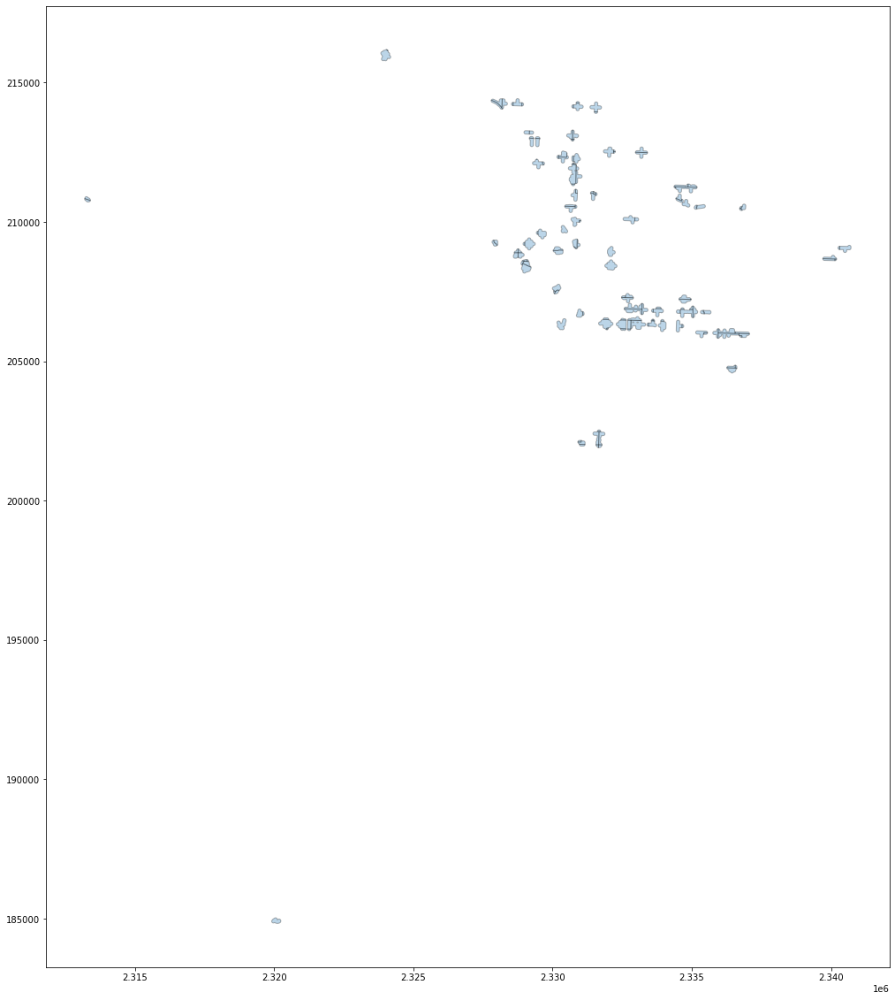

In [294]:
ax = buffer_clip_race.plot(figsize=(20, 20), alpha=0.3, edgecolor='k')

In [295]:
 inter_race=gpd.overlay(gdf1, buffer_clip_race, how='intersection', make_valid=True, keep_geom_type=False)
 inter_race.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,INTPTLAT,INTPTLON,GISJOIN,Shape_Leng,Shape_Area,AHY2E001,AHY2E002,AHY2E003,Total block Area,geometry
0,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,+45.5083098,-122.6727998,G41005100057003,2664.421890,456715.393743,811,704,0,456636.481129,"POLYGON ((2330166.339 207506.392, 2330160.507 ..."
1,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,+45.5083098,-122.6727998,G41005100057003,2664.421890,456715.393743,811,704,0,456636.481129,"POLYGON ((2330199.987 207482.518, 2330199.154 ..."
2,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,+45.5180914,-122.6726970,G41005100106003,3434.847512,657936.227852,932,631,141,657822.982336,"POLYGON ((2330124.317 207520.905, 2330123.298 ..."
3,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,+45.5180914,-122.6726970,G41005100106003,3434.847512,657936.227852,932,631,141,657822.982336,"POLYGON ((2330041.989 207531.083, 2330044.424 ..."
4,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,+45.5109901,-122.6784155,G41005100057002,2113.569051,236425.572975,2460,1775,84,236384.691864,"POLYGON ((2330065.427 207423.453, 2330064.288 ..."


In [296]:
inter_race["buffered area"]=inter_race.area
inter_race['area factor']=inter_race['buffered area']/inter_race["Total block Area"]
inter_race.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,GISJOIN,Shape_Leng,Shape_Area,AHY2E001,AHY2E002,AHY2E003,Total block Area,geometry,buffered area,area factor
0,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,G41005100057003,2664.421890,456715.393743,811,704,0,456636.481129,"POLYGON ((2330166.339 207506.392, 2330160.507 ...",3671.989088,0.008041
1,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,G41005100057003,2664.421890,456715.393743,811,704,0,456636.481129,"POLYGON ((2330199.987 207482.518, 2330199.154 ...",13171.749838,0.028845
2,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,G41005100106003,3434.847512,657936.227852,932,631,141,657822.982336,"POLYGON ((2330124.317 207520.905, 2330123.298 ...",40103.366194,0.060964
3,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,G41005100106003,3434.847512,657936.227852,932,631,141,657822.982336,"POLYGON ((2330041.989 207531.083, 2330044.424 ...",25032.179092,0.038053
4,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,G41005100057002,2113.569051,236425.572975,2460,1775,84,236384.691864,"POLYGON ((2330065.427 207423.453, 2330064.288 ...",4304.007925,0.018208


In [297]:
output_pct_race= inter_race.loc[:, ['osm_id_sensor', 'AHY2E001','AHY2E002','AHY2E003','area factor']]
output_pct_race.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,AHY2E001,AHY2E002,AHY2E003,area factor
0,681301893.0,811,704,0,0.008041
1,689032191.0,811,704,0,0.028845
2,681301893.0,932,631,141,0.060964
3,689032191.0,932,631,141,0.038053
4,689032191.0,2460,1775,84,0.018208


In [298]:
output_pct_race.iloc[:, 1:4] = output_pct_race.iloc[:, 1:4].mul(output_pct_race['area factor'],axis=0)
output_pct_race=output_pct_race.drop(['area factor'],axis=1)
output_pct_race.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,AHY2E001,AHY2E002,AHY2E003
0,681301893.0,6.521562,5.661134,0.000000
1,689032191.0,23.393420,20.306989,0.000000
2,681301893.0,56.818230,38.468136,8.595891
3,689032191.0,35.465454,24.011482,5.365482
4,689032191.0,44.790800,32.318565,1.529442


# Aggregate by ID

In [299]:
output_pct_race=output_pct_race.groupby('osm_id_sensor', as_index=False).sum()
output_pct_race.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,AHY2E001,AHY2E002,AHY2E003
0,5516558.0,156.759443,130.740965,5.681827
1,5522164.0,586.338490,440.477880,34.840301
2,5527017.0,212.045860,118.136806,75.510064
3,5528173.0,464.480862,406.973150,9.569876
4,5529700.0,134.663975,87.687175,11.946347


# Percentange of White and African American

In [300]:
# Calculate percentage of white and percentage of Black or African American 
output_pct_race['pct_white']=(output_pct_race['AHY2E002']/output_pct_race['AHY2E001'])*100
output_pct_race['pct_African_American']=(output_pct_race['AHY2E003']/output_pct_race['AHY2E001'])*100
output_pct_race.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,AHY2E001,AHY2E002,AHY2E003,pct_white,pct_African_American
0,5516558.0,156.759443,130.740965,5.681827,83.402290,3.624552
1,5522164.0,586.338490,440.477880,34.840301,75.123480,5.942012
2,5527017.0,212.045860,118.136806,75.510064,55.712857,35.610251
3,5528173.0,464.480862,406.973150,9.569876,87.618928,2.060338
4,5529700.0,134.663975,87.687175,11.946347,65.115541,8.871227


In [301]:
output_pct_race1=output_pct_race.drop(['AHY2E001','AHY2E002','AHY2E003'],axis=1)
output_pct_race1.columns=['osm_id','pct_white','pct_African_American']
output_pct_race1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,pct_white,pct_African_American
0,5516558.0,83.402290,3.624552
1,5522164.0,75.123480,5.942012
2,5527017.0,55.712857,35.610251
3,5528173.0,87.618928,2.060338
4,5529700.0,65.115541,8.871227


# Percentage of Male and Female

In [302]:
#gender=pd.read_csv("../input/oregon-sd-data/age by sex.csv")
gender.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,GISJOIN,YEAR,REGIONA,DIVISIONA,STATE,STATEA,COUNTY,COUNTYA,COUSUBA,PLACEA,...,AHYQM040,AHYQM041,AHYQM042,AHYQM043,AHYQM044,AHYQM045,AHYQM046,AHYQM047,AHYQM048,AHYQM049
0,G41000109501001,2013-2017,NaN,NaN,Oregon,41,Baker County,1,NaN,NaN,...,18,28,15,15,13,11,11,12,15,11
1,G41000109501002,2013-2017,NaN,NaN,Oregon,41,Baker County,1,NaN,NaN,...,9,25,15,18,9,42,28,25,3,8
2,G41000109501003,2013-2017,NaN,NaN,Oregon,41,Baker County,1,NaN,NaN,...,12,41,28,36,15,26,22,12,38,15
3,G41000109502001,2013-2017,NaN,NaN,Oregon,41,Baker County,1,NaN,NaN,...,27,40,26,35,31,24,23,29,12,12
4,G41000109502002,2013-2017,NaN,NaN,Oregon,41,Baker County,1,NaN,NaN,...,11,21,12,40,30,20,15,12,31,12


In [303]:
gender1=pd.merge(bg_proj, gender, left_on='GISJOIN', right_on='GISJOIN', how='left')
gender1.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,STATEFP,COUNTYFP,TRACTCE,BLKGRPCE,GEOID,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,...,AHYQM040,AHYQM041,AHYQM042,AHYQM043,AHYQM044,AHYQM045,AHYQM046,AHYQM047,AHYQM048,AHYQM049
0,41,001,950100,1,410019501001,Block Group 1,G5030,S,2.205986e+09,13837275.0,...,18,28,15,15,13,11,11,12,15,11
1,41,001,950100,2,410019501002,Block Group 2,G5030,S,1.926901e+08,12317.0,...,9,25,15,18,9,42,28,25,3,8
2,41,001,950100,3,410019501003,Block Group 3,G5030,S,4.723892e+08,639439.0,...,12,41,28,36,15,26,22,12,38,15
3,41,001,950200,1,410019502001,Block Group 1,G5030,S,1.469016e+07,0.0,...,27,40,26,35,31,24,23,29,12,12
4,41,001,950200,2,410019502002,Block Group 2,G5030,S,1.009492e+06,0.0,...,11,21,12,40,30,20,15,12,31,12


In [304]:
# Clip the data using GeoPandas clip
buffer_clip_gender = gpd.clip(gender1, gdf1)
buffer_clip_gender.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,STATEFP,COUNTYFP,TRACTCE,BLKGRPCE,GEOID,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,...,AHYQM040,AHYQM041,AHYQM042,AHYQM043,AHYQM044,AHYQM045,AHYQM046,AHYQM047,AHYQM048,AHYQM049
213,41,005,022707,2,410050227072,Block Group 2,G5030,S,4876213.0,0.0,...,68,71,43,35,24,38,52,24,28,3
1557,41,051,000100,1,410510001001,Block Group 1,G5030,S,1965307.0,2119299.0,...,43,12,24,33,37,12,24,12,12,12
1558,41,051,000100,2,410510001002,Block Group 2,G5030,S,298728.0,0.0,...,48,18,30,12,19,20,19,12,12,12
1559,41,051,000100,3,410510001003,Block Group 3,G5030,S,200391.0,0.0,...,38,34,12,12,12,12,12,23,12,12
1560,41,051,000100,4,410510001004,Block Group 4,G5030,S,301283.0,0.0,...,12,25,16,47,35,31,12,51,30,53


C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


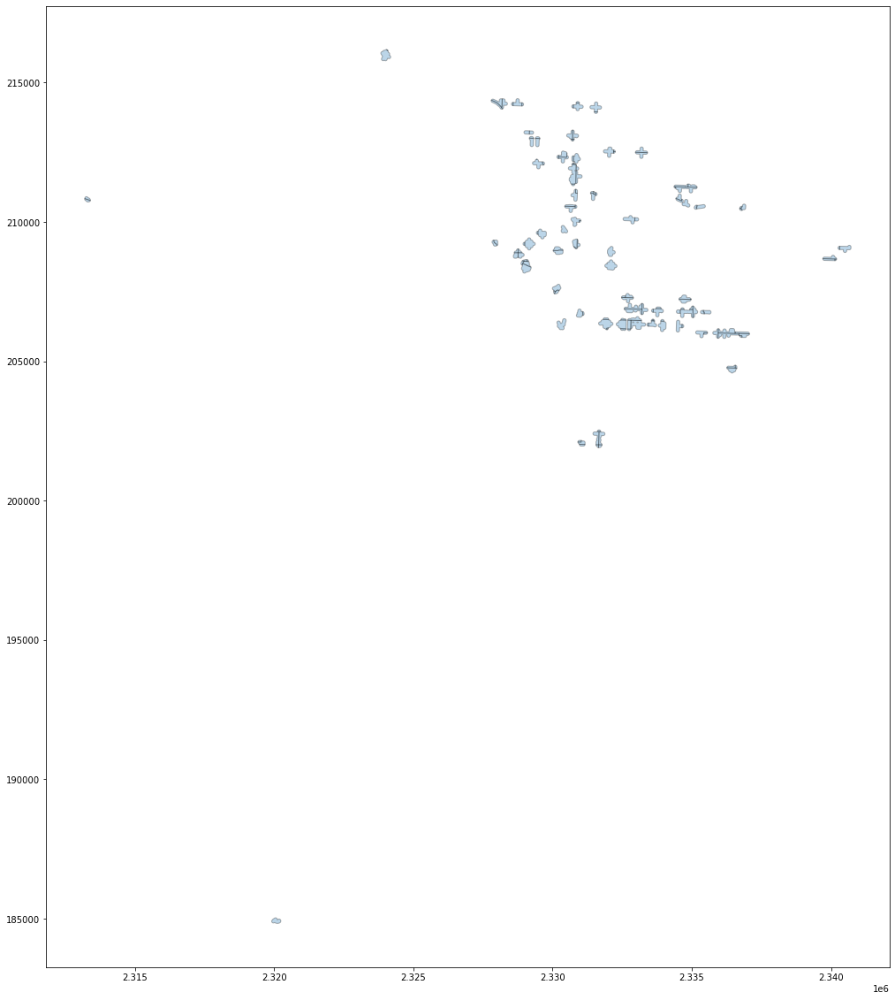

In [305]:
ax = buffer_clip_gender.plot(figsize=(20, 20), alpha=0.3, edgecolor='k')

In [306]:
 inter_gender=gpd.overlay(gdf1, buffer_clip_gender, how='intersection', make_valid=True, keep_geom_type=False)
 inter_gender.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,AHYQM041,AHYQM042,AHYQM043,AHYQM044,AHYQM045,AHYQM046,AHYQM047,AHYQM048,AHYQM049,geometry
0,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,48,12,12,12,38,12,19,13,12,"POLYGON ((2330166.339 207506.392, 2330160.507 ..."
1,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,48,12,12,12,38,12,19,13,12,"POLYGON ((2330199.987 207482.518, 2330199.154 ..."
2,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,24,12,18,12,12,12,12,12,12,"POLYGON ((2330124.317 207520.905, 2330123.298 ..."
3,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,24,12,18,12,12,12,12,12,12,"POLYGON ((2330041.989 207531.083, 2330044.424 ..."
4,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,45,12,35,34,29,90,32,12,12,"POLYGON ((2330065.427 207423.453, 2330064.288 ..."


In [307]:
inter_gender["buffered area"]=inter_gender.area
inter_gender['area factor']=inter_gender['buffered area']/inter_gender["Total block Area"]
inter_gender.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,AHYQM043,AHYQM044,AHYQM045,AHYQM046,AHYQM047,AHYQM048,AHYQM049,geometry,buffered area,area factor
0,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,12,12,38,12,19,13,12,"POLYGON ((2330166.339 207506.392, 2330160.507 ...",3671.989088,0.008041
1,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,12,12,38,12,19,13,12,"POLYGON ((2330199.987 207482.518, 2330199.154 ...",13171.749838,0.028845
2,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,18,12,12,12,12,12,12,"POLYGON ((2330124.317 207520.905, 2330123.298 ...",40103.366194,0.060964
3,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,18,12,12,12,12,12,12,"POLYGON ((2330041.989 207531.083, 2330044.424 ...",25032.179092,0.038053
4,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,35,34,29,90,32,12,12,"POLYGON ((2330065.427 207423.453, 2330064.288 ...",4304.007925,0.018208


In [308]:
#'AHYQE001',=total, 'AHYQE002'=male,AHYQE026=female
gender_filter=inter_gender.loc[:, ['osm_id_sensor', 'AHYQE001', 'AHYQE002', 'AHYQE026','area factor']]
gender_filter.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,AHYQE001,AHYQE002,AHYQE026,area factor
0,681301893.0,811,474,337,0.008041
1,689032191.0,811,474,337,0.028845
2,681301893.0,932,699,233,0.060964
3,689032191.0,932,699,233,0.038053
4,689032191.0,2460,1473,987,0.018208


In [309]:
gender_filter.iloc[:, 1:4] = gender_filter.iloc[:, 1:4].mul(gender_filter['area factor'],axis=0)
gender_filter=gender_filter.drop(['area factor'],axis=1)
gender_filter.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,AHYQE001,AHYQE002,AHYQE026
0,681301893.0,6.521562,3.811616,2.709946
1,689032191.0,23.393420,13.672603,9.720817
2,681301893.0,56.818230,42.613672,14.204557
3,689032191.0,35.465454,26.599091,8.866364
4,689032191.0,44.790800,26.819857,17.970943


In [310]:
# Aggregate by ID
output_pct_gender=gender_filter.groupby('osm_id_sensor', as_index=False).sum()
output_pct_gender.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,AHYQE001,AHYQE002,AHYQE026
0,5516558.0,156.759443,86.191139,70.568304
1,5522164.0,586.338490,353.049979,233.288512
2,5527017.0,212.045860,87.107842,124.938018
3,5528173.0,464.480862,229.725764,234.755097
4,5529700.0,134.663975,61.691893,72.972081


In [311]:
# Calculate percentage of white and percentage of Black or African American 
output_pct_gender['pct_male']=(output_pct_gender['AHYQE002']/output_pct_gender['AHYQE001'])*100
output_pct_gender['pct_female']=(output_pct_gender['AHYQE026']/output_pct_gender['AHYQE001'])*100
output_pct_gender.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,AHYQE001,AHYQE002,AHYQE026,pct_male,pct_female
0,5516558.0,156.759443,86.191139,70.568304,54.983060,45.016940
1,5522164.0,586.338490,353.049979,233.288512,60.212656,39.787344
2,5527017.0,212.045860,87.107842,124.938018,41.079718,58.920282
3,5528173.0,464.480862,229.725764,234.755097,49.458607,50.541393
4,5529700.0,134.663975,61.691893,72.972081,45.811728,54.188272


In [312]:
output_pct_gender1=output_pct_gender.drop(['AHYQE001','AHYQE002','AHYQE026'],axis=1)
output_pct_gender1.columns=['osm_id','pct_male','pct_female']
output_pct_gender1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,pct_male,pct_female
0,5516558.0,54.983060,45.016940
1,5522164.0,60.212656,39.787344
2,5527017.0,41.079718,58.920282
3,5528173.0,49.458607,50.541393
4,5529700.0,45.811728,54.188272


# Number of Student (student access) and Education (pct of at least college education population)

In [313]:
#edu=pd.read_csv("../input/oregon-sd-data/education.csv")
edu.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,GISJOIN,YEAR,REGIONA,DIVISIONA,STATE,STATEA,COUNTY,COUNTYA,COUSUBA,PLACEA,...,AH04M016,AH04M017,AH04M018,AH04M019,AH04M020,AH04M021,AH04M022,AH04M023,AH04M024,AH04M025
0,G41000109501001,2013-2017,NaN,NaN,Oregon,41,Baker County,1,NaN,NaN,...,21,57,17,24,66,29,26,13,12,3
1,G41000109501002,2013-2017,NaN,NaN,Oregon,41,Baker County,1,NaN,NaN,...,10,61,19,35,53,38,23,41,11,2
2,G41000109501003,2013-2017,NaN,NaN,Oregon,41,Baker County,1,NaN,NaN,...,23,45,41,35,76,37,72,43,22,27
3,G41000109502001,2013-2017,NaN,NaN,Oregon,41,Baker County,1,NaN,NaN,...,36,63,23,58,30,92,90,36,30,22
4,G41000109502002,2013-2017,NaN,NaN,Oregon,41,Baker County,1,NaN,NaN,...,12,98,34,46,66,24,87,23,14,12


In [314]:
edu1=pd.merge(bg_proj, edu, left_on='GISJOIN', right_on='GISJOIN', how='left')
edu1.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,STATEFP,COUNTYFP,TRACTCE,BLKGRPCE,GEOID,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,...,AH04M016,AH04M017,AH04M018,AH04M019,AH04M020,AH04M021,AH04M022,AH04M023,AH04M024,AH04M025
0,41,001,950100,1,410019501001,Block Group 1,G5030,S,2.205986e+09,13837275.0,...,21,57,17,24,66,29,26,13,12,3
1,41,001,950100,2,410019501002,Block Group 2,G5030,S,1.926901e+08,12317.0,...,10,61,19,35,53,38,23,41,11,2
2,41,001,950100,3,410019501003,Block Group 3,G5030,S,4.723892e+08,639439.0,...,23,45,41,35,76,37,72,43,22,27
3,41,001,950200,1,410019502001,Block Group 1,G5030,S,1.469016e+07,0.0,...,36,63,23,58,30,92,90,36,30,22
4,41,001,950200,2,410019502002,Block Group 2,G5030,S,1.009492e+06,0.0,...,12,98,34,46,66,24,87,23,14,12


In [315]:
# Clip the data using GeoPandas clip
buffer_clip_edu = gpd.clip(edu1, gdf1)
buffer_clip_edu.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,STATEFP,COUNTYFP,TRACTCE,BLKGRPCE,GEOID,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,...,AH04M016,AH04M017,AH04M018,AH04M019,AH04M020,AH04M021,AH04M022,AH04M023,AH04M024,AH04M025
213,41,005,022707,2,410050227072,Block Group 2,G5030,S,4876213.0,0.0,...,12,102,60,62,232,72,182,128,62,52
1557,41,051,000100,1,410510001001,Block Group 1,G5030,S,1965307.0,2119299.0,...,12,40,34,12,56,19,141,74,29,31
1558,41,051,000100,2,410510001002,Block Group 2,G5030,S,298728.0,0.0,...,12,21,12,20,57,12,106,102,134,38
1559,41,051,000100,3,410510001003,Block Group 3,G5030,S,200391.0,0.0,...,12,55,12,120,114,95,81,108,12,37
1560,41,051,000100,4,410510001004,Block Group 4,G5030,S,301283.0,0.0,...,12,73,25,44,132,58,120,85,30,12


In [316]:
#ax = buffer_clip_edu.plot(figsize=(20, 20), alpha=0.3, edgecolor='k')

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [317]:
inter_edu=gpd.overlay(gdf1, buffer_clip_edu, how='intersection', make_valid=True, keep_geom_type=False)
inter_edu.head(5)

,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,AH04M017,AH04M018,AH04M019,AH04M020,AH04M021,AH04M022,AH04M023,AH04M024,AH04M025,geometry
0,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,13,12,12,154,29,143,98,89,29,"POLYGON ((2330166.339 207506.392, 2330160.507 ..."
1,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,13,12,12,154,29,143,98,89,29,"POLYGON ((2330199.987 207482.518, 2330199.154 ..."
2,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,64,50,55,138,43,46,12,12,16,"POLYGON ((2330124.317 207520.905, 2330123.298 ..."
3,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,64,50,55,138,43,46,12,12,16,"POLYGON ((2330041.989 207531.083, 2330044.424 ..."
4,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,97,12,71,99,100,236,128,39,64,"POLYGON ((2330065.427 207423.453, 2330064.288 ..."


In [318]:
inter_edu["buffered area"]=inter_edu.area
inter_edu['area factor']=inter_edu['buffered area']/inter_edu["Total block Area"]
inter_edu.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,AH04M019,AH04M020,AH04M021,AH04M022,AH04M023,AH04M024,AH04M025,geometry,buffered area,area factor
0,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,12,154,29,143,98,89,29,"POLYGON ((2330166.339 207506.392, 2330160.507 ...",3671.989088,0.008041
1,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,12,154,29,143,98,89,29,"POLYGON ((2330199.987 207482.518, 2330199.154 ...",13171.749838,0.028845
2,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,55,138,43,46,12,12,16,"POLYGON ((2330124.317 207520.905, 2330123.298 ...",40103.366194,0.060964
3,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,55,138,43,46,12,12,16,"POLYGON ((2330041.989 207531.083, 2330044.424 ...",25032.179092,0.038053
4,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,71,99,100,236,128,39,64,"POLYGON ((2330065.427 207423.453, 2330064.288 ...",4304.007925,0.018208


In [319]:
# AH04E001,=total, AH04E019:    Some college, less than 1 year
#AH04E020:    Some college, 1 or more years, no degree
#        AH04E021:    Associate's degree
#        AH04E022:    Bachelor's degree
#        AH04E023:    Master's degree
#        AH04E024:    Professional school degree
#        AH04E025:    Doctorate degree

edu_filter=inter_edu.loc[:, ['osm_id_sensor', 'AH04E001', 'AH04E019','AH04E020','AH04E021', 'AH04E022','AH04E023','AH04E024','AH04E025','area factor']]
edu_filter.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,AH04E001,AH04E019,AH04E020,AH04E021,AH04E022,AH04E023,AH04E024,AH04E025,area factor
0,681301893.0,724,0,105,24,244,129,150,23,0.008041
1,689032191.0,724,0,105,24,244,129,150,23,0.028845
2,681301893.0,807,84,170,51,90,0,0,11,0.060964
3,689032191.0,807,84,170,51,90,0,0,11,0.038053
4,689032191.0,1877,103,205,128,774,362,30,51,0.018208


In [320]:
edu_filter.iloc[:, 1:9] = edu_filter.iloc[:, 1:9].mul(edu_filter['area factor'],axis=0)
edu_filter=edu_filter.drop(['area factor'],axis=1)
edu_filter.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,AH04E001,AH04E019,AH04E020,AH04E021,AH04E022,AH04E023,AH04E024,AH04E025
0,681301893.0,5.821962,0.000000,0.844345,0.192993,1.962098,1.037338,1.206208,0.184952
1,689032191.0,20.883892,0.000000,3.028741,0.692284,7.038218,3.721025,4.326773,0.663439
2,681301893.0,49.197759,5.120956,10.363840,3.109152,5.486739,0.000000,0.000000,0.670601
3,689032191.0,30.708821,3.196457,6.469021,1.940706,3.424776,0.000000,0.000000,0.418584
4,689032191.0,34.175745,1.875387,3.732567,2.330578,14.092715,6.591167,0.546229,0.928590


In [321]:
# Aggregate by ID
output_pct_edu=edu_filter.groupby('osm_id_sensor', as_index=False).sum()
output_pct_edu.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,AH04E001,AH04E019,AH04E020,AH04E021,AH04E022,AH04E023,AH04E024,AH04E025
0,5516558.0,117.022192,8.932449,21.792909,5.961457,44.616626,10.903470,3.060040,1.140559
1,5522164.0,490.154802,33.673405,107.855921,45.572866,139.101077,36.130985,27.625592,9.768757
2,5527017.0,175.950177,8.046291,27.336901,5.988764,55.597060,11.318670,5.472156,0.523485
3,5528173.0,416.873504,21.208325,58.376601,28.622380,161.112364,98.029081,14.233516,11.234477
4,5529700.0,98.385121,6.563741,20.622485,12.839719,13.834240,2.080217,0.001134,1.212936


# Number of students 

In [322]:
scll.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,GISJOIN,YEAR,STUSAB,REGIONA,DIVISIONA,STATE,STATEA,COUNTY,COUNTYA,COUSUBA,...,ALV5M010,ALV5M011,ALV5M012,ALV5M013,ALV5M014,ALV5M015,ALV5M016,ALV5M017,ALV5M018,ALV5M019
0,G41000109501001,2015-2019,OR,NaN,NaN,Oregon,41,Baker County,1,NaN,...,4,5,18,12,12,14,12,4,12,130
1,G41000109501002,2015-2019,OR,NaN,NaN,Oregon,41,Baker County,1,NaN,...,17,18,5,12,12,7,12,12,10,116
2,G41000109501003,2015-2019,OR,NaN,NaN,Oregon,41,Baker County,1,NaN,...,16,21,11,12,7,21,7,21,18,168
3,G41000109502001,2015-2019,OR,NaN,NaN,Oregon,41,Baker County,1,NaN,...,6,73,46,22,23,12,11,30,37,153
4,G41000109502002,2015-2019,OR,NaN,NaN,Oregon,41,Baker County,1,NaN,...,12,18,12,12,53,12,40,53,12,178


Table 1:     School Enrollment by Detailed Level of School for the Population 3 Years and Over
    Universe:    Population 3 years and over
    Source code: B14007
    NHGIS code:  ALV5
        ALV5E001:    Total
        ALV5E002:    Enrolled in school
        ALV5E003:    Enrolled in school: Enrolled in nursery school, preschool
        ALV5E004:    Enrolled in school: Enrolled in kindergarten
        ALV5E005:    Enrolled in school: Enrolled in grade 1
        ALV5E006:    Enrolled in school: Enrolled in grade 2
        ALV5E007:    Enrolled in school: Enrolled in grade 3
        ALV5E008:    Enrolled in school: Enrolled in grade 4
        ALV5E009:    Enrolled in school: Enrolled in grade 5
        ALV5E010:    Enrolled in school: Enrolled in grade 6
        ALV5E011:    Enrolled in school: Enrolled in grade 7
        ALV5E012:    Enrolled in school: Enrolled in grade 8
        ALV5E013:    Enrolled in school: Enrolled in grade 9
        ALV5E014:    Enrolled in school: Enrolled in grade 10
        ALV5E015:    Enrolled in school: Enrolled in grade 11
        ALV5E016:    Enrolled in school: Enrolled in grade 12
        ALV5E017:    Enrolled in school: Enrolled in college, undergraduate years
        ALV5E018:    Enrolled in school: Graduate or professional school
        ALV5E019:    Not enrolled in school

In [323]:
scl1=pd.merge(bg_proj, scll, left_on='GISJOIN', right_on='GISJOIN', how='left')
scl1.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,STATEFP,COUNTYFP,TRACTCE,BLKGRPCE,GEOID_x,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,...,ALV5M010,ALV5M011,ALV5M012,ALV5M013,ALV5M014,ALV5M015,ALV5M016,ALV5M017,ALV5M018,ALV5M019
0,41,001,950100,1,410019501001,Block Group 1,G5030,S,2.205986e+09,13837275.0,...,4,5,18,12,12,14,12,4,12,130
1,41,001,950100,2,410019501002,Block Group 2,G5030,S,1.926901e+08,12317.0,...,17,18,5,12,12,7,12,12,10,116
2,41,001,950100,3,410019501003,Block Group 3,G5030,S,4.723892e+08,639439.0,...,16,21,11,12,7,21,7,21,18,168
3,41,001,950200,1,410019502001,Block Group 1,G5030,S,1.469016e+07,0.0,...,6,73,46,22,23,12,11,30,37,153
4,41,001,950200,2,410019502002,Block Group 2,G5030,S,1.009492e+06,0.0,...,12,18,12,12,53,12,40,53,12,178


In [324]:
# Clip the data using GeoPandas clip
buffer_clip_scl = gpd.clip(scl1, gdf1)
buffer_clip_scl.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,STATEFP,COUNTYFP,TRACTCE,BLKGRPCE,GEOID_x,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,...,ALV5M010,ALV5M011,ALV5M012,ALV5M013,ALV5M014,ALV5M015,ALV5M016,ALV5M017,ALV5M018,ALV5M019
213,41,005,022707,2,410050227072,Block Group 2,G5030,S,4876213.0,0.0,...,95,31,30,96,33,36,31,110,57,343
1557,41,051,000100,1,410510001001,Block Group 1,G5030,S,1965307.0,2119299.0,...,48,12,29,12,34,12,12,35,29,163
1558,41,051,000100,2,410510001002,Block Group 2,G5030,S,298728.0,0.0,...,50,12,33,12,34,41,19,31,21,191
1559,41,051,000100,3,410510001003,Block Group 3,G5030,S,200391.0,0.0,...,12,12,12,12,12,25,12,44,89,209
1560,41,051,000100,4,410510001004,Block Group 4,G5030,S,301283.0,0.0,...,37,12,12,25,40,12,12,48,40,178


In [325]:
inter_scl=gpd.overlay(gdf1, buffer_clip_scl, how='intersection', make_valid=True, keep_geom_type=False)
inter_scl.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,ALV5M011,ALV5M012,ALV5M013,ALV5M014,ALV5M015,ALV5M016,ALV5M017,ALV5M018,ALV5M019,geometry
0,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,12,12,12,12,12,12,82,25,181,"POLYGON ((2330166.339 207506.392, 2330160.507 ..."
1,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,12,12,12,12,12,12,82,25,181,"POLYGON ((2330199.987 207482.518, 2330199.154 ..."
2,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,12,12,12,12,12,15,12,12,258,"POLYGON ((2330124.317 207520.905, 2330123.298 ..."
3,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,12,12,12,12,12,15,12,12,258,"POLYGON ((2330041.989 207531.083, 2330044.424 ..."
4,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,12,12,12,12,12,24,147,105,243,"POLYGON ((2330065.427 207423.453, 2330064.288 ..."


In [326]:
inter_scl["buffered area"]=inter_scl.area
inter_scl['area factor']=inter_scl['buffered area']/inter_scl["Total block Area"]
inter_scl.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,ALV5M013,ALV5M014,ALV5M015,ALV5M016,ALV5M017,ALV5M018,ALV5M019,geometry,buffered area,area factor
0,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,12,12,12,12,82,25,181,"POLYGON ((2330166.339 207506.392, 2330160.507 ...",3671.989088,0.008041
1,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,12,12,12,12,82,25,181,"POLYGON ((2330199.987 207482.518, 2330199.154 ...",13171.749838,0.028845
2,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,12,12,12,15,12,12,258,"POLYGON ((2330124.317 207520.905, 2330123.298 ...",40103.366194,0.060964
3,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,12,12,12,15,12,12,258,"POLYGON ((2330041.989 207531.083, 2330044.424 ...",25032.179092,0.038053
4,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,12,12,12,24,147,105,243,"POLYGON ((2330065.427 207423.453, 2330064.288 ...",4304.007925,0.018208


In [327]:
scl_filter=inter_scl.loc[:, ['osm_id_sensor', 'ALV5E001', 'ALV5E017', 'ALV5E018','area factor']]
scl_filter.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,ALV5E001,ALV5E017,ALV5E018,area factor
0,681301893.0,847,64,15,0.008041
1,689032191.0,847,64,15,0.028845
2,681301893.0,928,0,0,0.060964
3,689032191.0,928,0,0,0.038053
4,689032191.0,2042,265,178,0.018208


In [328]:
scl_filter.iloc[:, 1:4] = scl_filter.iloc[:, 1:4].mul(scl_filter['area factor'],axis=0)
scl_filter=scl_filter.drop(['area factor'],axis=1)
scl_filter.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,ALV5E001,ALV5E017,ALV5E018
0,681301893.0,6.811052,0.514649,0.120621
1,689032191.0,24.431846,1.846090,0.432677
2,681301893.0,56.574375,0.000000,0.000000
3,689032191.0,35.313242,0.000000,0.000000
4,689032191.0,37.180006,4.825025,3.240960


In [329]:
scl_filter['total student']=scl_filter['ALV5E017']+scl_filter['ALV5E018']
output_student=scl_filter.loc[:,['osm_id_sensor','total student']]
output_student.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,total student
0,681301893.0,0.635269
1,689032191.0,2.278767
2,681301893.0,0.000000
3,689032191.0,0.000000
4,689032191.0,8.065986


In [330]:
output_student=output_student.groupby('osm_id_sensor', as_index=False).sum()
output_student.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,total student
0,5516558.0,7.473364
1,5522164.0,41.467318
2,5527017.0,3.211815
3,5528173.0,27.373411
4,5529700.0,5.437136


In [331]:
output_student.columns=['osm_id', 'Student Access']
output_student.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Student Access
0,5516558.0,7.473364
1,5522164.0,41.467318
2,5527017.0,3.211815
3,5528173.0,27.373411
4,5529700.0,5.437136


In [332]:
output_student.shape

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


(78, 2)

# Education ( pct of at least college population)

In [333]:
# Calculate percentage of education 
output_pct_edu['total_at_least_college_education']=output_pct_edu.iloc[:,2:9].sum(axis=1)
output_pct_edu.head()

,osm_id_sensor,AH04E001,AH04E019,AH04E020,AH04E021,AH04E022,AH04E023,AH04E024,AH04E025,total_at_least_college_education
0,5516558.0,117.022192,8.932449,21.792909,5.961457,44.616626,10.903470,3.060040,1.140559,96.407510
1,5522164.0,490.154802,33.673405,107.855921,45.572866,139.101077,36.130985,27.625592,9.768757,399.728602
2,5527017.0,175.950177,8.046291,27.336901,5.988764,55.597060,11.318670,5.472156,0.523485,114.283327
3,5528173.0,416.873504,21.208325,58.376601,28.622380,161.112364,98.029081,14.233516,11.234477,392.816744
4,5529700.0,98.385121,6.563741,20.622485,12.839719,13.834240,2.080217,0.001134,1.212936,57.154473


In [334]:
output_pct_edu['pct_at_least_college_education']=(output_pct_edu['total_at_least_college_education']/output_pct_edu['AH04E001'])*100
output_pct_edu.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,AH04E001,AH04E019,AH04E020,AH04E021,AH04E022,AH04E023,AH04E024,AH04E025,total_at_least_college_education,pct_at_least_college_education
0,5516558.0,117.022192,8.932449,21.792909,5.961457,44.616626,10.903470,3.060040,1.140559,96.407510,82.383955
1,5522164.0,490.154802,33.673405,107.855921,45.572866,139.101077,36.130985,27.625592,9.768757,399.728602,81.551502
2,5527017.0,175.950177,8.046291,27.336901,5.988764,55.597060,11.318670,5.472156,0.523485,114.283327,64.952096
3,5528173.0,416.873504,21.208325,58.376601,28.622380,161.112364,98.029081,14.233516,11.234477,392.816744,94.229242
4,5529700.0,98.385121,6.563741,20.622485,12.839719,13.834240,2.080217,0.001134,1.212936,57.154473,58.092598


In [335]:
output_pct_edu1=output_pct_edu.loc[:,['osm_id_sensor','pct_at_least_college_education']]
output_pct_edu1.columns=['osm_id','pct_at_least_college_education']
output_pct_edu1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,pct_at_least_college_education
0,5516558.0,82.383955
1,5522164.0,81.551502
2,5527017.0,64.952096
3,5528173.0,94.229242
4,5529700.0,58.092598


# Median Age

In [336]:
#age=pd.read_csv("../input/oregon-sd-data/median_age.csv")
age.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,GISJOIN,YEAR,REGIONA,DIVISIONA,STATE,STATEA,COUNTY,COUNTYA,COUSUBA,PLACEA,...,BTTRA,BTBGA,NAME_E,AHYRE001,AHYRE002,AHYRE003,NAME_M,AHYRM001,AHYRM002,AHYRM003
0,G41000109501001,2013-2017,NaN,NaN,Oregon,41,Baker County,1,NaN,NaN,...,NaN,NaN,"Block Group 1, Census Tract 9501, Baker County...",55.6,58.3,50.9,"Block Group 1, Census Tract 9501, Baker County...",5.3,2.7,10.6
1,G41000109501002,2013-2017,NaN,NaN,Oregon,41,Baker County,1,NaN,NaN,...,NaN,NaN,"Block Group 2, Census Tract 9501, Baker County...",46.1,48.2,45.7,"Block Group 2, Census Tract 9501, Baker County...",13.5,16.4,17.6
2,G41000109501003,2013-2017,NaN,NaN,Oregon,41,Baker County,1,NaN,NaN,...,NaN,NaN,"Block Group 3, Census Tract 9501, Baker County...",54.8,55.3,54.5,"Block Group 3, Census Tract 9501, Baker County...",7.7,9.1,11.4
3,G41000109502001,2013-2017,NaN,NaN,Oregon,41,Baker County,1,NaN,NaN,...,NaN,NaN,"Block Group 1, Census Tract 9502, Baker County...",47.9,45.8,48.0,"Block Group 1, Census Tract 9502, Baker County...",10.5,23.0,9.2
4,G41000109502002,2013-2017,NaN,NaN,Oregon,41,Baker County,1,NaN,NaN,...,NaN,NaN,"Block Group 2, Census Tract 9502, Baker County...",40.6,33.2,43.5,"Block Group 2, Census Tract 9502, Baker County...",11.8,16.1,10.4


In [337]:
age1=pd.merge(bg_proj, age, left_on='GISJOIN', right_on='GISJOIN', how='left')
age1.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,STATEFP,COUNTYFP,TRACTCE,BLKGRPCE,GEOID,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,...,BTTRA,BTBGA,NAME_E,AHYRE001,AHYRE002,AHYRE003,NAME_M,AHYRM001,AHYRM002,AHYRM003
0,41,001,950100,1,410019501001,Block Group 1,G5030,S,2.205986e+09,13837275.0,...,NaN,NaN,"Block Group 1, Census Tract 9501, Baker County...",55.6,58.3,50.9,"Block Group 1, Census Tract 9501, Baker County...",5.3,2.7,10.6
1,41,001,950100,2,410019501002,Block Group 2,G5030,S,1.926901e+08,12317.0,...,NaN,NaN,"Block Group 2, Census Tract 9501, Baker County...",46.1,48.2,45.7,"Block Group 2, Census Tract 9501, Baker County...",13.5,16.4,17.6
2,41,001,950100,3,410019501003,Block Group 3,G5030,S,4.723892e+08,639439.0,...,NaN,NaN,"Block Group 3, Census Tract 9501, Baker County...",54.8,55.3,54.5,"Block Group 3, Census Tract 9501, Baker County...",7.7,9.1,11.4
3,41,001,950200,1,410019502001,Block Group 1,G5030,S,1.469016e+07,0.0,...,NaN,NaN,"Block Group 1, Census Tract 9502, Baker County...",47.9,45.8,48.0,"Block Group 1, Census Tract 9502, Baker County...",10.5,23.0,9.2
4,41,001,950200,2,410019502002,Block Group 2,G5030,S,1.009492e+06,0.0,...,NaN,NaN,"Block Group 2, Census Tract 9502, Baker County...",40.6,33.2,43.5,"Block Group 2, Census Tract 9502, Baker County...",11.8,16.1,10.4


In [338]:
# Clip the data using GeoPandas clip
buffer_clip_age = gpd.clip(age1, gdf1)
buffer_clip_age.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,STATEFP,COUNTYFP,TRACTCE,BLKGRPCE,GEOID,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,...,BTTRA,BTBGA,NAME_E,AHYRE001,AHYRE002,AHYRE003,NAME_M,AHYRM001,AHYRM002,AHYRM003
213,41,005,022707,2,410050227072,Block Group 2,G5030,S,4876213.0,0.0,...,NaN,NaN,"Block Group 2, Census Tract 227.07, Clackamas ...",36.3,34.7,37.0,"Block Group 2, Census Tract 227.07, Clackamas ...",3.5,5.1,3.9
1557,41,051,000100,1,410510001001,Block Group 1,G5030,S,1965307.0,2119299.0,...,NaN,NaN,"Block Group 1, Census Tract 1, Multnomah Count...",46.3,47.3,45.5,"Block Group 1, Census Tract 1, Multnomah Count...",3.1,3.8,3.5
1558,41,051,000100,2,410510001002,Block Group 2,G5030,S,298728.0,0.0,...,NaN,NaN,"Block Group 2, Census Tract 1, Multnomah Count...",35.0,38.9,34.1,"Block Group 2, Census Tract 1, Multnomah Count...",3.0,7.2,2.0
1559,41,051,000100,3,410510001003,Block Group 3,G5030,S,200391.0,0.0,...,NaN,NaN,"Block Group 3, Census Tract 1, Multnomah Count...",33.8,35.1,31.9,"Block Group 3, Census Tract 1, Multnomah Count...",6.5,7.6,10.1
1560,41,051,000100,4,410510001004,Block Group 4,G5030,S,301283.0,0.0,...,NaN,NaN,"Block Group 4, Census Tract 1, Multnomah Count...",43.2,36.2,46.9,"Block Group 4, Census Tract 1, Multnomah Count...",10.8,8.5,11.7


In [339]:
inter_age=gpd.overlay(gdf1, buffer_clip_age, how='intersection', make_valid=True, keep_geom_type=False)
inter_age.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,BTBGA,NAME_E,AHYRE001,AHYRE002,AHYRE003,NAME_M,AHYRM001,AHYRM002,AHYRM003,geometry
0,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,NaN,"Block Group 3, Census Tract 57, Multnomah Coun...",35.8,35.5,45.4,"Block Group 3, Census Tract 57, Multnomah Coun...",6.8,3.2,16.8,"POLYGON ((2330166.339 207506.392, 2330160.507 ..."
1,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,NaN,"Block Group 3, Census Tract 57, Multnomah Coun...",35.8,35.5,45.4,"Block Group 3, Census Tract 57, Multnomah Coun...",6.8,3.2,16.8,"POLYGON ((2330199.987 207482.518, 2330199.154 ..."
2,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,NaN,"Block Group 3, Census Tract 106, Multnomah Cou...",42.8,42.4,43.2,"Block Group 3, Census Tract 106, Multnomah Cou...",3.5,4.1,6.3,"POLYGON ((2330124.317 207520.905, 2330123.298 ..."
3,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,NaN,"Block Group 3, Census Tract 106, Multnomah Cou...",42.8,42.4,43.2,"Block Group 3, Census Tract 106, Multnomah Cou...",3.5,4.1,6.3,"POLYGON ((2330041.989 207531.083, 2330044.424 ..."
4,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,NaN,"Block Group 2, Census Tract 57, Multnomah Coun...",29.9,29.3,31.2,"Block Group 2, Census Tract 57, Multnomah Coun...",2.7,3.5,3.3,"POLYGON ((2330065.427 207423.453, 2330064.288 ..."


In [340]:
inter_age["buffered area"]=inter_age.area
inter_age['area factor']=inter_age['buffered area']/inter_age["Total block Area"]
inter_age.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,AHYRE001,AHYRE002,AHYRE003,NAME_M,AHYRM001,AHYRM002,AHYRM003,geometry,buffered area,area factor
0,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,35.8,35.5,45.4,"Block Group 3, Census Tract 57, Multnomah Coun...",6.8,3.2,16.8,"POLYGON ((2330166.339 207506.392, 2330160.507 ...",3671.989088,0.008041
1,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,35.8,35.5,45.4,"Block Group 3, Census Tract 57, Multnomah Coun...",6.8,3.2,16.8,"POLYGON ((2330199.987 207482.518, 2330199.154 ...",13171.749838,0.028845
2,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,42.8,42.4,43.2,"Block Group 3, Census Tract 106, Multnomah Cou...",3.5,4.1,6.3,"POLYGON ((2330124.317 207520.905, 2330123.298 ...",40103.366194,0.060964
3,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,42.8,42.4,43.2,"Block Group 3, Census Tract 106, Multnomah Cou...",3.5,4.1,6.3,"POLYGON ((2330041.989 207531.083, 2330044.424 ...",25032.179092,0.038053
4,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,29.9,29.3,31.2,"Block Group 2, Census Tract 57, Multnomah Coun...",2.7,3.5,3.3,"POLYGON ((2330065.427 207423.453, 2330064.288 ...",4304.007925,0.018208


In [341]:
#    NHGIS code:  AHYR
#        AHYRE001:    Median age: Total
#        AHYRE002:    Median age: Male
#        AHYRE003:    Median age: Female
age_filter=inter_age.loc[:, ['osm_id_sensor','GEOID','AHYRE001']]
age_filter.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,GEOID,AHYRE001
0,681301893.0,410510057003,35.8
1,689032191.0,410510057003,35.8
2,681301893.0,410510106003,42.8
3,689032191.0,410510106003,42.8
4,689032191.0,410510057002,29.9


In [342]:
#age_filter.iloc[:, 1:2] = age_filter.iloc[:, 1:2].mul(age_filter['area factor'],axis=0)
#age_filter=age_filter.drop(['area factor'],axis=1)
#age_filter

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [343]:
# Aggregate by ID
#output_median_age=age_filter.groupby('ID', as_index=False).mean()
#output_median_age

In [344]:
#output_median_age.columns=['ID', 'Median_Age']
#output_median_age

# Median HH_income

In [345]:
#income=pd.read_csv("../input/oregon-sd-data/median_hh_income.csv")
income.head(5)

,GISJOIN,YEAR,REGIONA,DIVISIONA,STATE,STATEA,COUNTY,COUNTYA,COUSUBA,PLACEA,...,SDELMA,SDSECA,SDUNIA,PUMA5A,BTTRA,BTBGA,NAME_E,AH1PE001,NAME_M,AH1PM001
0,G41000109501001,2013-2017,NaN,NaN,Oregon,41,Baker County,1,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,"Block Group 1, Census Tract 9501, Baker County...",40156.0,"Block Group 1, Census Tract 9501, Baker County...",9365.0
1,G41000109501002,2013-2017,NaN,NaN,Oregon,41,Baker County,1,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,"Block Group 2, Census Tract 9501, Baker County...",34000.0,"Block Group 2, Census Tract 9501, Baker County...",13959.0
2,G41000109501003,2013-2017,NaN,NaN,Oregon,41,Baker County,1,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,"Block Group 3, Census Tract 9501, Baker County...",62266.0,"Block Group 3, Census Tract 9501, Baker County...",11854.0
3,G41000109502001,2013-2017,NaN,NaN,Oregon,41,Baker County,1,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,"Block Group 1, Census Tract 9502, Baker County...",78558.0,"Block Group 1, Census Tract 9502, Baker County...",26558.0
4,G41000109502002,2013-2017,NaN,NaN,Oregon,41,Baker County,1,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,"Block Group 2, Census Tract 9502, Baker County...",43625.0,"Block Group 2, Census Tract 9502, Baker County...",9086.0


In [346]:
income1=pd.merge(bg_proj, income, left_on='GISJOIN', right_on='GISJOIN', how='left')
income1.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,STATEFP,COUNTYFP,TRACTCE,BLKGRPCE,GEOID,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,...,SDELMA,SDSECA,SDUNIA,PUMA5A,BTTRA,BTBGA,NAME_E,AH1PE001,NAME_M,AH1PM001
0,41,001,950100,1,410019501001,Block Group 1,G5030,S,2.205986e+09,13837275.0,...,NaN,NaN,NaN,NaN,NaN,NaN,"Block Group 1, Census Tract 9501, Baker County...",40156.0,"Block Group 1, Census Tract 9501, Baker County...",9365.0
1,41,001,950100,2,410019501002,Block Group 2,G5030,S,1.926901e+08,12317.0,...,NaN,NaN,NaN,NaN,NaN,NaN,"Block Group 2, Census Tract 9501, Baker County...",34000.0,"Block Group 2, Census Tract 9501, Baker County...",13959.0
2,41,001,950100,3,410019501003,Block Group 3,G5030,S,4.723892e+08,639439.0,...,NaN,NaN,NaN,NaN,NaN,NaN,"Block Group 3, Census Tract 9501, Baker County...",62266.0,"Block Group 3, Census Tract 9501, Baker County...",11854.0
3,41,001,950200,1,410019502001,Block Group 1,G5030,S,1.469016e+07,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,"Block Group 1, Census Tract 9502, Baker County...",78558.0,"Block Group 1, Census Tract 9502, Baker County...",26558.0
4,41,001,950200,2,410019502002,Block Group 2,G5030,S,1.009492e+06,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,"Block Group 2, Census Tract 9502, Baker County...",43625.0,"Block Group 2, Census Tract 9502, Baker County...",9086.0


In [347]:
# Clip the data using GeoPandas clip
buffer_clip_income = gpd.clip(income1, gdf1)
buffer_clip_income.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,STATEFP,COUNTYFP,TRACTCE,BLKGRPCE,GEOID,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,...,SDELMA,SDSECA,SDUNIA,PUMA5A,BTTRA,BTBGA,NAME_E,AH1PE001,NAME_M,AH1PM001
213,41,005,022707,2,410050227072,Block Group 2,G5030,S,4876213.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,"Block Group 2, Census Tract 227.07, Clackamas ...",93197.0,"Block Group 2, Census Tract 227.07, Clackamas ...",14010.0
1557,41,051,000100,1,410510001001,Block Group 1,G5030,S,1965307.0,2119299.0,...,NaN,NaN,NaN,NaN,NaN,NaN,"Block Group 1, Census Tract 1, Multnomah Count...",144844.0,"Block Group 1, Census Tract 1, Multnomah Count...",37805.0
1558,41,051,000100,2,410510001002,Block Group 2,G5030,S,298728.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,"Block Group 2, Census Tract 1, Multnomah Count...",135179.0,"Block Group 2, Census Tract 1, Multnomah Count...",82651.0
1559,41,051,000100,3,410510001003,Block Group 3,G5030,S,200391.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,"Block Group 3, Census Tract 1, Multnomah Count...",61781.0,"Block Group 3, Census Tract 1, Multnomah Count...",21996.0
1560,41,051,000100,4,410510001004,Block Group 4,G5030,S,301283.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,"Block Group 4, Census Tract 1, Multnomah Count...",51776.0,"Block Group 4, Census Tract 1, Multnomah Count...",14306.0


In [348]:
inter_income=gpd.overlay(gdf1, buffer_clip_income, how='intersection', make_valid=True, keep_geom_type=False)
inter_income.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,SDSECA,SDUNIA,PUMA5A,BTTRA,BTBGA,NAME_E,AH1PE001,NAME_M,AH1PM001,geometry
0,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,NaN,NaN,NaN,NaN,NaN,"Block Group 3, Census Tract 57, Multnomah Coun...",99271.0,"Block Group 3, Census Tract 57, Multnomah Coun...",23138.0,"POLYGON ((2330166.339 207506.392, 2330160.507 ..."
1,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,NaN,NaN,NaN,NaN,NaN,"Block Group 3, Census Tract 57, Multnomah Coun...",99271.0,"Block Group 3, Census Tract 57, Multnomah Coun...",23138.0,"POLYGON ((2330199.987 207482.518, 2330199.154 ..."
2,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,NaN,NaN,NaN,NaN,NaN,"Block Group 3, Census Tract 106, Multnomah Cou...",9720.0,"Block Group 3, Census Tract 106, Multnomah Cou...",8483.0,"POLYGON ((2330124.317 207520.905, 2330123.298 ..."
3,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,NaN,NaN,NaN,NaN,NaN,"Block Group 3, Census Tract 106, Multnomah Cou...",9720.0,"Block Group 3, Census Tract 106, Multnomah Cou...",8483.0,"POLYGON ((2330041.989 207531.083, 2330044.424 ..."
4,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,NaN,NaN,NaN,NaN,NaN,"Block Group 2, Census Tract 57, Multnomah Coun...",59766.0,"Block Group 2, Census Tract 57, Multnomah Coun...",4932.0,"POLYGON ((2330065.427 207423.453, 2330064.288 ..."


In [349]:
inter_income["buffered area"]=inter_income.area
inter_income['area factor']=inter_income['buffered area']/inter_income["Total block Area"]
inter_income.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,PUMA5A,BTTRA,BTBGA,NAME_E,AH1PE001,NAME_M,AH1PM001,geometry,buffered area,area factor
0,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,NaN,NaN,NaN,"Block Group 3, Census Tract 57, Multnomah Coun...",99271.0,"Block Group 3, Census Tract 57, Multnomah Coun...",23138.0,"POLYGON ((2330166.339 207506.392, 2330160.507 ...",3671.989088,0.008041
1,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,NaN,NaN,NaN,"Block Group 3, Census Tract 57, Multnomah Coun...",99271.0,"Block Group 3, Census Tract 57, Multnomah Coun...",23138.0,"POLYGON ((2330199.987 207482.518, 2330199.154 ...",13171.749838,0.028845
2,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,NaN,NaN,NaN,"Block Group 3, Census Tract 106, Multnomah Cou...",9720.0,"Block Group 3, Census Tract 106, Multnomah Cou...",8483.0,"POLYGON ((2330124.317 207520.905, 2330123.298 ...",40103.366194,0.060964
3,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,NaN,NaN,NaN,"Block Group 3, Census Tract 106, Multnomah Cou...",9720.0,"Block Group 3, Census Tract 106, Multnomah Cou...",8483.0,"POLYGON ((2330041.989 207531.083, 2330044.424 ...",25032.179092,0.038053
4,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,NaN,NaN,NaN,"Block Group 2, Census Tract 57, Multnomah Coun...",59766.0,"Block Group 2, Census Tract 57, Multnomah Coun...",4932.0,"POLYGON ((2330065.427 207423.453, 2330064.288 ...",4304.007925,0.018208


In [350]:
#    Table 1:     Median Household Income in the Past 12 Months (in 2017 Inflation-Adjusted Dollars)
#    Universe:    Households
 #   Source code: B19013
 #   NHGIS code:  AH1P
 #       AH1PE001:    Median household income in the past 12 months (in 2017 inflation-adjusted dollars
income_filter=inter_income.loc[:, ['osm_id_sensor','GEOID', 'AH1PE001','area factor']]
income_filter.head(5)

# See rest of the part after hh density

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,GEOID,AH1PE001,area factor
0,681301893.0,410510057003,99271.0,0.008041
1,689032191.0,410510057003,99271.0,0.028845
2,681301893.0,410510106003,9720.0,0.060964
3,689032191.0,410510106003,9720.0,0.038053
4,689032191.0,410510057002,59766.0,0.018208


In [351]:
# income_filter.iloc[:, 2:3] = income_filter.iloc[:, 2:3].mul(income_filter['area factor'],axis=0)
# income_filter.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


# HH_density

In [352]:
#hhdensity=pd.read_csv("../input/oregon-sd-data/household_type.csv")
hhdensity.head(5)

,GISJOIN,YEAR,REGIONA,DIVISIONA,STATE,STATEA,COUNTY,COUNTYA,COUSUBA,PLACEA,...,NAME_M,AHZZM001,AHZZM002,AHZZM003,AHZZM004,AHZZM005,AHZZM006,AHZZM007,AHZZM008,AHZZM009
0,G41000109501001,2013-2017,NaN,NaN,Oregon,41,Baker County,1,NaN,NaN,...,"Block Group 1, Census Tract 9501, Baker County...",70,65,67,7,2,7,53,47,19
1,G41000109501002,2013-2017,NaN,NaN,Oregon,41,Baker County,1,NaN,NaN,...,"Block Group 2, Census Tract 9501, Baker County...",69,49,49,32,17,28,62,61,12
2,G41000109501003,2013-2017,NaN,NaN,Oregon,41,Baker County,1,NaN,NaN,...,"Block Group 3, Census Tract 9501, Baker County...",61,63,63,37,8,37,36,29,23
3,G41000109502001,2013-2017,NaN,NaN,Oregon,41,Baker County,1,NaN,NaN,...,"Block Group 1, Census Tract 9502, Baker County...",80,80,78,35,12,35,33,33,12
4,G41000109502002,2013-2017,NaN,NaN,Oregon,41,Baker County,1,NaN,NaN,...,"Block Group 2, Census Tract 9502, Baker County...",85,69,69,38,38,24,82,78,21


In [353]:
hhdensity1=pd.merge(bg_proj, hhdensity, left_on='GISJOIN', right_on='GISJOIN', how='left')
hhdensity1.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,STATEFP,COUNTYFP,TRACTCE,BLKGRPCE,GEOID,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,...,NAME_M,AHZZM001,AHZZM002,AHZZM003,AHZZM004,AHZZM005,AHZZM006,AHZZM007,AHZZM008,AHZZM009
0,41,001,950100,1,410019501001,Block Group 1,G5030,S,2.205986e+09,13837275.0,...,"Block Group 1, Census Tract 9501, Baker County...",70,65,67,7,2,7,53,47,19
1,41,001,950100,2,410019501002,Block Group 2,G5030,S,1.926901e+08,12317.0,...,"Block Group 2, Census Tract 9501, Baker County...",69,49,49,32,17,28,62,61,12
2,41,001,950100,3,410019501003,Block Group 3,G5030,S,4.723892e+08,639439.0,...,"Block Group 3, Census Tract 9501, Baker County...",61,63,63,37,8,37,36,29,23
3,41,001,950200,1,410019502001,Block Group 1,G5030,S,1.469016e+07,0.0,...,"Block Group 1, Census Tract 9502, Baker County...",80,80,78,35,12,35,33,33,12
4,41,001,950200,2,410019502002,Block Group 2,G5030,S,1.009492e+06,0.0,...,"Block Group 2, Census Tract 9502, Baker County...",85,69,69,38,38,24,82,78,21


In [354]:
hhdensity1['Total Block HH']=hhdensity1.AHZZE001
hhdensity1.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,STATEFP,COUNTYFP,TRACTCE,BLKGRPCE,GEOID,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,...,AHZZM001,AHZZM002,AHZZM003,AHZZM004,AHZZM005,AHZZM006,AHZZM007,AHZZM008,AHZZM009,Total Block HH
0,41,001,950100,1,410019501001,Block Group 1,G5030,S,2.205986e+09,13837275.0,...,70,65,67,7,2,7,53,47,19,448
1,41,001,950100,2,410019501002,Block Group 2,G5030,S,1.926901e+08,12317.0,...,69,49,49,32,17,28,62,61,12,402
2,41,001,950100,3,410019501003,Block Group 3,G5030,S,4.723892e+08,639439.0,...,61,63,63,37,8,37,36,29,23,448
3,41,001,950200,1,410019502001,Block Group 1,G5030,S,1.469016e+07,0.0,...,80,80,78,35,12,35,33,33,12,439
4,41,001,950200,2,410019502002,Block Group 2,G5030,S,1.009492e+06,0.0,...,85,69,69,38,38,24,82,78,21,447


In [355]:
# Clip the data using GeoPandas clip
buffer_clip_hhdensity1 = gpd.clip(hhdensity1, gdf1)
buffer_clip_hhdensity1.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,STATEFP,COUNTYFP,TRACTCE,BLKGRPCE,GEOID,NAMELSAD,MTFCC,FUNCSTAT,ALAND,AWATER,...,AHZZM001,AHZZM002,AHZZM003,AHZZM004,AHZZM005,AHZZM006,AHZZM007,AHZZM008,AHZZM009,Total Block HH
213,41,005,022707,2,410050227072,Block Group 2,G5030,S,4876213.0,0.0,...,133,120,139,103,38,92,118,110,62,1791
1557,41,051,000100,1,410510001001,Block Group 1,G5030,S,1965307.0,2119299.0,...,76,82,82,12,12,12,46,40,18,324
1558,41,051,000100,2,410510001002,Block Group 2,G5030,S,298728.0,0.0,...,82,88,89,37,12,37,66,66,21,427
1559,41,051,000100,3,410510001003,Block Group 3,G5030,S,200391.0,0.0,...,147,87,87,12,12,12,152,94,122,380
1560,41,051,000100,4,410510001004,Block Group 4,G5030,S,301283.0,0.0,...,114,105,111,51,51,12,84,91,33,526


In [356]:
inter_hhdensity=gpd.overlay(gdf1, buffer_clip_hhdensity1, how='intersection', make_valid=True, keep_geom_type=False)
inter_hhdensity.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,AHZZM002,AHZZM003,AHZZM004,AHZZM005,AHZZM006,AHZZM007,AHZZM008,AHZZM009,Total Block HH,geometry
0,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,71,71,24,24,12,126,102,93,522,"POLYGON ((2330166.339 207506.392, 2330160.507 ..."
1,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,71,71,24,24,12,126,102,93,522,"POLYGON ((2330199.987 207482.518, 2330199.154 ..."
2,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,13,12,13,13,12,78,78,12,325,"POLYGON ((2330124.317 207520.905, 2330123.298 ..."
3,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,13,12,13,13,12,78,78,12,325,"POLYGON ((2330041.989 207531.083, 2330044.424 ..."
4,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,105,90,84,61,57,196,179,138,1363,"POLYGON ((2330065.427 207423.453, 2330064.288 ..."


In [357]:
inter_hhdensity["buffered area"]=inter_hhdensity.area
inter_hhdensity['area factor']=inter_hhdensity['buffered area']/inter_hhdensity["Total block Area"]
inter_hhdensity.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,AHZZM004,AHZZM005,AHZZM006,AHZZM007,AHZZM008,AHZZM009,Total Block HH,geometry,buffered area,area factor
0,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,24,24,12,126,102,93,522,"POLYGON ((2330166.339 207506.392, 2330160.507 ...",3671.989088,0.008041
1,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,24,24,12,126,102,93,522,"POLYGON ((2330199.987 207482.518, 2330199.154 ...",13171.749838,0.028845
2,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,13,13,12,78,78,12,325,"POLYGON ((2330124.317 207520.905, 2330123.298 ...",40103.366194,0.060964
3,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,13,13,12,78,78,12,325,"POLYGON ((2330041.989 207531.083, 2330044.424 ...",25032.179092,0.038053
4,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,84,61,57,196,179,138,1363,"POLYGON ((2330065.427 207423.453, 2330064.288 ...",4304.007925,0.018208


In [358]:
# Aggregate by ID
hh=inter_hhdensity.loc[:,['osm_id_sensor',"GEOID","Total Block HH"]]
hh.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,GEOID,Total Block HH
0,681301893.0,410510057003,522
1,689032191.0,410510057003,522
2,681301893.0,410510106003,325
3,689032191.0,410510106003,325
4,689032191.0,410510057002,1363


In [359]:
#    Table 1:     Household Type (Including Living Alone)
#    Universe:    Households
#    Source code: B11001
#    NHGIS code:  AHZZ
#        AHZZE001:    Total
#        AHZZE002:    Family households
#        AHZZE003:    Family households: Married-couple family
#        AHZZE004:    Family households: Other family
#        AHZZE005:    Family households: Other family: Male householder, no wife present
#        AHZZE006:    Family households: Other family: Female householder, no husband present
#        AHZZE007:    Nonfamily households
#        AHZZE008:    Nonfamily households: Householder living alone
#        AHZZE009:    Nonfamily households: Householder not living alone
hhdensity_filter=inter_hhdensity.loc[:, ['osm_id_sensor', 'GEOID','AHZZE001','area factor']]
hhdensity_filter
hh_factor=hhdensity_filter.copy()
hh_factor.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,GEOID,AHZZE001,area factor
0,681301893.0,410510057003,522,0.008041
1,689032191.0,410510057003,522,0.028845
2,681301893.0,410510106003,325,0.060964
3,689032191.0,410510106003,325,0.038053
4,689032191.0,410510057002,1363,0.018208


In [360]:
hh_factor["buffered_hh"]=hh_factor['AHZZE001']*hh_factor['area factor']
hh_factor['hh factor']=hh_factor['buffered_hh']/hh_factor['AHZZE001']
hh_factor.head() # factor is basically same

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,GEOID,AHZZE001,area factor,buffered_hh,hh factor
0,681301893.0,410510057003,522,0.008041,4.197602,0.008041
1,689032191.0,410510057003,522,0.028845,15.057171,0.028845
2,681301893.0,410510106003,325,0.060964,19.813224,0.060964
3,689032191.0,410510106003,325,0.038053,12.367245,0.038053
4,689032191.0,410510057002,1363,0.018208,24.817017,0.018208


In [361]:
hh_factor1=hh_factor.loc[:,["osm_id_sensor","GEOID","buffered_hh"]]
hh_factor1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,GEOID,buffered_hh
0,681301893.0,410510057003,4.197602
1,689032191.0,410510057003,15.057171
2,681301893.0,410510106003,19.813224
3,689032191.0,410510106003,12.367245
4,689032191.0,410510057002,24.817017


In [362]:
hhdensity_filter.iloc[:, 2:3] = hhdensity_filter.iloc[:, 2:3].mul(hhdensity_filter['area factor'],axis=0)
hhdensity_filter=hhdensity_filter.drop(['area factor'],axis=1)
hhf=hhdensity_filter.copy()
hhdensity_filter.head()


C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,GEOID,AHZZE001
0,681301893.0,410510057003,4.197602
1,689032191.0,410510057003,15.057171
2,681301893.0,410510106003,19.813224
3,689032191.0,410510106003,12.367245
4,689032191.0,410510057002,24.817017


In [363]:
# Aggregate by ID
hhdensity_filter=hhdensity_filter.drop(["GEOID"],axis=1)
output_hhdensity=hhdensity_filter.groupby('osm_id_sensor', as_index=False).sum()
output_hhdensity.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,AHZZE001
0,5516558.0,55.653483
1,5522164.0,375.520510
2,5527017.0,108.808529
3,5528173.0,313.297843
4,5529700.0,56.320025


In [364]:
output_hhdensity=pd.merge(output_hhdensity,gdf1,left_on="osm_id_sensor",right_on="osm_id_sensor")
output_hhdensity=output_hhdensity.loc[:,['osm_id_sensor','AHZZE001','buffer_area']]

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [365]:
output_hhdensity.columns=['osm_id', 'Total_HH','buffer_area']
output_hhdensity.head()

,osm_id,Total_HH,buffer_area
0,5516558.0,55.653483,0.014854
1,5522164.0,375.520510,0.030333
2,5527017.0,108.808529,0.026595
3,5528173.0,313.297843,0.029837
4,5529700.0,56.320025,0.019207


In [366]:
output_hhdensity['HH_density']=output_hhdensity.Total_HH/output_hhdensity.buffer_area
output_hhdensity.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Total_HH,buffer_area,HH_density
0,5516558.0,55.653483,0.014854,3746.599170
1,5522164.0,375.520510,0.030333,12379.955809
2,5527017.0,108.808529,0.026595,4091.303997
3,5528173.0,313.297843,0.029837,10500.249399
4,5529700.0,56.320025,0.019207,2932.275095


In [367]:
output_hhdensity1=output_hhdensity.loc[:, ['osm_id', 'HH_density']]
output_hhdensity1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,HH_density
0,5516558.0,3746.599170
1,5522164.0,12379.955809
2,5527017.0,4091.303997
3,5528173.0,10500.249399
4,5529700.0,2932.275095


In [368]:
#d = {'osm_id': [], 'HH_density': []}
#output_hhdensity1 = pd.DataFrame(data=d)
#output_hhdensity1

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


# Weighted HH_income

In [369]:
whh_income=pd.merge(income_filter, hh_factor1, on=['osm_id_sensor', 'GEOID'])
whh_income.head()

,osm_id_sensor,GEOID,AH1PE001,area factor,buffered_hh
0,681301893.0,410510057003,99271.0,0.008041,4.197602
1,689032191.0,410510057003,99271.0,0.028845,15.057171
2,681301893.0,410510106003,9720.0,0.060964,19.813224
3,689032191.0,410510106003,9720.0,0.038053,12.367245
4,689032191.0,410510057002,59766.0,0.018208,24.817017


In [370]:
whh_income['wt_incme']=whh_income['AH1PE001'].mul(whh_income['buffered_hh'])
whh_income.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,GEOID,AH1PE001,area factor,buffered_hh,wt_incme
0,681301893.0,410510057003,99271.0,0.008041,4.197602,4.167002e+05
1,689032191.0,410510057003,99271.0,0.028845,15.057171,1.494740e+06
2,681301893.0,410510106003,9720.0,0.060964,19.813224,1.925845e+05
3,689032191.0,410510106003,9720.0,0.038053,12.367245,1.202096e+05
4,689032191.0,410510057002,59766.0,0.018208,24.817017,1.483214e+06


In [371]:
income_filter=whh_income.drop(['GEOID','AH1PE001','area factor'],axis=1)
income_filter.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,buffered_hh,wt_incme
0,681301893.0,4.197602,4.167002e+05
1,689032191.0,15.057171,1.494740e+06
2,681301893.0,19.813224,1.925845e+05
3,689032191.0,12.367245,1.202096e+05
4,689032191.0,24.817017,1.483214e+06


In [372]:
# Aggregate by ID
income_filter=income_filter.groupby('osm_id_sensor', as_index=False).sum()
income_filter.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,buffered_hh,wt_incme
0,5516558.0,55.653483,3.883794e+06
1,5522164.0,375.520510,1.123533e+07
2,5527017.0,108.808529,3.651232e+06
3,5528173.0,313.297843,2.187853e+07
4,5529700.0,56.320025,2.131501e+06


In [373]:
income_filter['HH weighted income']=income_filter['wt_incme']/income_filter['buffered_hh']
income_filter.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,buffered_hh,wt_incme,HH weighted income
0,5516558.0,55.653483,3.883794e+06,69785.279500
1,5522164.0,375.520510,1.123533e+07,29919.355428
2,5527017.0,108.808529,3.651232e+06,33556.488250
3,5528173.0,313.297843,2.187853e+07,69833.004334
4,5529700.0,56.320025,2.131501e+06,37846.244682


In [374]:
output_income=income_filter.drop(['buffered_hh','wt_incme'],axis=1)
output_income.columns=['osm_id', 'Median_HH_income']
output_income.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Median_HH_income
0,5516558.0,69785.279500
1,5522164.0,29919.355428
2,5527017.0,33556.488250
3,5528173.0,69833.004334
4,5529700.0,37846.244682


C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


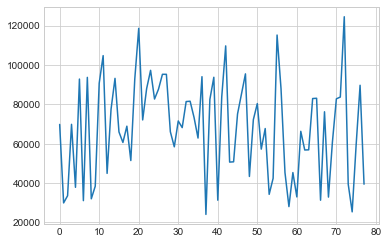

In [375]:
%matplotlib inline
import matplotlib.pyplot as plt
plt.style.use('seaborn-whitegrid')
import numpy as np
plt.plot(output_income.Median_HH_income)

# Population Density

In [376]:
#pdensity=pd.read_csv("../input/oregon-sd-data/population.csv")
pdensity1=pd.merge(bg_proj, pdensity, left_on='GISJOIN', right_on='GISJOIN', how='left')
buffer_clip_pdensity1 = gpd.clip(pdensity1, gdf1)
inter_pdensity=gpd.overlay(gdf1, buffer_clip_pdensity1, how='intersection', make_valid=True, keep_geom_type=False)
inter_pdensity.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,SDSECA,SDUNIA,PUMA5A,BTTRA,BTBGA,NAME_E,AHY1E001,NAME_M,AHY1M001,geometry
0,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,NaN,NaN,NaN,NaN,NaN,"Block Group 3, Census Tract 57, Multnomah Coun...",811,"Block Group 3, Census Tract 57, Multnomah Coun...",227,"POLYGON ((2330166.339 207506.392, 2330160.507 ..."
1,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,NaN,NaN,NaN,NaN,NaN,"Block Group 3, Census Tract 57, Multnomah Coun...",811,"Block Group 3, Census Tract 57, Multnomah Coun...",227,"POLYGON ((2330199.987 207482.518, 2330199.154 ..."
2,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,NaN,NaN,NaN,NaN,NaN,"Block Group 3, Census Tract 106, Multnomah Cou...",932,"Block Group 3, Census Tract 106, Multnomah Cou...",316,"POLYGON ((2330124.317 207520.905, 2330123.298 ..."
3,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,NaN,NaN,NaN,NaN,NaN,"Block Group 3, Census Tract 106, Multnomah Cou...",932,"Block Group 3, Census Tract 106, Multnomah Cou...",316,"POLYGON ((2330041.989 207531.083, 2330044.424 ..."
4,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,NaN,NaN,NaN,NaN,NaN,"Block Group 2, Census Tract 57, Multnomah Coun...",2460,"Block Group 2, Census Tract 57, Multnomah Coun...",389,"POLYGON ((2330065.427 207423.453, 2330064.288 ..."


In [377]:
inter_pdensity["buffered area"]=inter_pdensity.area
inter_pdensity['area factor']=inter_pdensity['buffered area']/inter_pdensity["Total block Area"]
inter_pdensity.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,PUMA5A,BTTRA,BTBGA,NAME_E,AHY1E001,NAME_M,AHY1M001,geometry,buffered area,area factor
0,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,NaN,NaN,NaN,"Block Group 3, Census Tract 57, Multnomah Coun...",811,"Block Group 3, Census Tract 57, Multnomah Coun...",227,"POLYGON ((2330166.339 207506.392, 2330160.507 ...",3671.989088,0.008041
1,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,NaN,NaN,NaN,"Block Group 3, Census Tract 57, Multnomah Coun...",811,"Block Group 3, Census Tract 57, Multnomah Coun...",227,"POLYGON ((2330199.987 207482.518, 2330199.154 ...",13171.749838,0.028845
2,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,NaN,NaN,NaN,"Block Group 3, Census Tract 106, Multnomah Cou...",932,"Block Group 3, Census Tract 106, Multnomah Cou...",316,"POLYGON ((2330124.317 207520.905, 2330123.298 ...",40103.366194,0.060964
3,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,NaN,NaN,NaN,"Block Group 3, Census Tract 106, Multnomah Cou...",932,"Block Group 3, Census Tract 106, Multnomah Cou...",316,"POLYGON ((2330041.989 207531.083, 2330044.424 ...",25032.179092,0.038053
4,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,NaN,NaN,NaN,"Block Group 2, Census Tract 57, Multnomah Coun...",2460,"Block Group 2, Census Tract 57, Multnomah Coun...",389,"POLYGON ((2330065.427 207423.453, 2330064.288 ...",4304.007925,0.018208


In [378]:
#    Table 1:     Total Population
#    Universe:    Total population
#    Source code: B01003
#    NHGIS code:  AHY1
#       AHY1E001:    Total
 
pdensity_filter=inter_pdensity.loc[:, ['osm_id_sensor', 'AHY1E001','area factor']]
pdensity_filter.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,AHY1E001,area factor
0,681301893.0,811,0.008041
1,689032191.0,811,0.028845
2,681301893.0,932,0.060964
3,689032191.0,932,0.038053
4,689032191.0,2460,0.018208


In [379]:
age_pop=inter_pdensity.loc[:, ['osm_id_sensor', 'GEOID','AHY1E001','area factor']]
age_pop.iloc[:, 2:3]=age_pop.iloc[:, 2:3].mul(age_pop['area factor'],axis=0)
age_pop.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,GEOID,AHY1E001,area factor
0,681301893.0,410510057003,6.521562,0.008041
1,689032191.0,410510057003,23.393420,0.028845
2,681301893.0,410510106003,56.818230,0.060964
3,689032191.0,410510106003,35.465454,0.038053
4,689032191.0,410510057002,44.790800,0.018208


In [380]:
pp=inter_pdensity.loc[:, ['osm_id_sensor','GEOID', 'AHY1E001','area factor']]
pp.columns=['osm_id','GEOID', 'AHY1E001','pp factor']
pp1=pp.loc[:,["osm_id",'GEOID',"pp factor"]]
pp1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,GEOID,pp factor
0,681301893.0,410510057003,0.008041
1,689032191.0,410510057003,0.028845
2,681301893.0,410510106003,0.060964
3,689032191.0,410510106003,0.038053
4,689032191.0,410510057002,0.018208


In [381]:
pdensity_filter.iloc[:, 1:2] = pdensity_filter.iloc[:, 1:2].mul(pdensity_filter['area factor'],axis=0)
pdensity_filter=pdensity_filter.drop(['area factor'],axis=1)
pdensity_filter.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,AHY1E001
0,681301893.0,6.521562
1,689032191.0,23.393420
2,681301893.0,56.818230
3,689032191.0,35.465454
4,689032191.0,44.790800


In [382]:
# Aggregate by ID
output_pdensity=pdensity_filter.groupby('osm_id_sensor', as_index=False).sum()
output_pdensity=pd.merge(output_pdensity,gdf1,left_on="osm_id_sensor",right_on="osm_id_sensor")
output_pdensity=output_pdensity.loc[:,['osm_id_sensor','AHY1E001','buffer_area']]

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [383]:
output_pdensity['population_density']=output_pdensity.AHY1E001/output_pdensity.buffer_area
output_pdensity.head()

,osm_id_sensor,AHY1E001,buffer_area,population_density
0,5516558.0,156.759443,0.014854,10553.064608
1,5522164.0,586.338490,0.030333,19330.088265
2,5527017.0,212.045860,0.026595,7973.125711
3,5528173.0,464.480862,0.029837,15567.183129
4,5529700.0,134.663975,0.019207,7011.215317


In [384]:
output_pdensity1=output_pdensity.loc[:, ['osm_id_sensor', 'population_density']]
output_pdensity1.columns=['osm_id', 'population_density']
output_pdensity1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,population_density
0,5516558.0,10553.064608
1,5522164.0,19330.088265
2,5527017.0,7973.125711
3,5528173.0,15567.183129
4,5529700.0,7011.215317


In [385]:
#d = {'osm_id': [], 'population_density': []}
#output_pdensity1 = pd.DataFrame(data=d)
#output_pdensity1

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


# Weighted Median Age

In [386]:
w_age=pd.merge(age_pop,age_filter,on=["osm_id_sensor","GEOID"])
w_age.head()

,osm_id_sensor,GEOID,AHY1E001,area factor,AHYRE001
0,681301893.0,410510057003,6.521562,0.008041,35.8
1,689032191.0,410510057003,23.393420,0.028845,35.8
2,681301893.0,410510106003,56.818230,0.060964,42.8
3,689032191.0,410510106003,35.465454,0.038053,42.8
4,689032191.0,410510057002,44.790800,0.018208,29.9


In [387]:
w_age['w_age']=(w_age['AHY1E001'].mul(w_age['AHYRE001'],axis=0))
w_age.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,GEOID,AHY1E001,area factor,AHYRE001,w_age
0,681301893.0,410510057003,6.521562,0.008041,35.8,233.471922
1,689032191.0,410510057003,23.393420,0.028845,35.8,837.484446
2,681301893.0,410510106003,56.818230,0.060964,42.8,2431.820230
3,689032191.0,410510106003,35.465454,0.038053,42.8,1517.921444
4,689032191.0,410510057002,44.790800,0.018208,29.9,1339.244925


In [388]:
#w_age.iloc[:, 3:4] = w_age.iloc[:, 3:4].mul(w_age['pp factor'],axis=0)
age_filter1=w_age.drop(['GEOID','AHYRE001','area factor'],axis=1)
age_filter1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,AHY1E001,w_age
0,681301893.0,6.521562,233.471922
1,689032191.0,23.393420,837.484446
2,681301893.0,56.818230,2431.820230
3,689032191.0,35.465454,1517.921444
4,689032191.0,44.790800,1339.244925


In [389]:
# Aggregate by ID
output_median_age=age_filter1.groupby('osm_id_sensor', as_index=False).sum()
output_median_age.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,AHY1E001,w_age
0,5516558.0,156.759443,5715.519753
1,5522164.0,586.338490,21862.128140
2,5527017.0,212.045860,8369.864806
3,5528173.0,464.480862,23533.117388
4,5529700.0,134.663975,5660.168083


In [390]:
output_median_age['median weighted age']=output_median_age['w_age']/output_median_age['AHY1E001']
output_median_age=output_median_age.drop(['AHY1E001','w_age'],axis=1)
output_median_age.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,median weighted age
0,5516558.0,36.460449
1,5522164.0,37.285849
2,5527017.0,39.471956
3,5528173.0,50.665419
4,5529700.0,42.031791


In [391]:
output_median_age.columns=["osm_id","Median Age"]
output_median_age.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Median Age
0,5516558.0,36.460449
1,5522164.0,37.285849
2,5527017.0,39.471956
3,5528173.0,50.665419
4,5529700.0,42.031791


# Employment Density

In [392]:
#edensity=pd.read_csv("../input/employment/nhgis0012_ds233_20175_2017_blck_grp.csv")
edensity.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,GISJOIN,YEAR,REGIONA,DIVISIONA,STATE,STATEA,COUNTY,COUNTYA,COUSUBA,PLACEA,...,AH3PE006,AH3PE007,NAME_M,AH3PM001,AH3PM002,AH3PM003,AH3PM004,AH3PM005,AH3PM006,AH3PM007
0,G41000109501001,2013-2017,NaN,NaN,Oregon,41,Baker County,1,NaN,NaN,...,0,444,"Block Group 1, Census Tract 9501, Baker County...",138,91,91,94,25,12,96
1,G41000109501002,2013-2017,NaN,NaN,Oregon,41,Baker County,1,NaN,NaN,...,0,344,"Block Group 2, Census Tract 9501, Baker County...",109,84,84,81,11,12,89
2,G41000109501003,2013-2017,NaN,NaN,Oregon,41,Baker County,1,NaN,NaN,...,0,469,"Block Group 3, Census Tract 9501, Baker County...",129,80,80,80,22,12,107
3,G41000109502001,2013-2017,NaN,NaN,Oregon,41,Baker County,1,NaN,NaN,...,0,372,"Block Group 1, Census Tract 9502, Baker County...",172,160,160,155,44,12,90
4,G41000109502002,2013-2017,NaN,NaN,Oregon,41,Baker County,1,NaN,NaN,...,0,289,"Block Group 2, Census Tract 9502, Baker County...",170,161,161,120,90,12,76


In [393]:

edensity1=pd.merge(bg_proj, edensity, left_on='GISJOIN', right_on='GISJOIN', how='left')
buffer_clip_edensity1 = gpd.clip(edensity1, gdf1)
inter_edensity=gpd.overlay(gdf1, buffer_clip_edensity1, how='intersection', make_valid=True, keep_geom_type=False)
inter_edensity.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,AH3PE007,NAME_M,AH3PM001,AH3PM002,AH3PM003,AH3PM004,AH3PM005,AH3PM006,AH3PM007,geometry
0,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,141,"Block Group 3, Census Tract 57, Multnomah Coun...",211,162,162,147,39,12,93,"POLYGON ((2330166.339 207506.392, 2330160.507 ..."
1,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,141,"Block Group 3, Census Tract 57, Multnomah Coun...",211,162,162,147,39,12,93,"POLYGON ((2330199.987 207482.518, 2330199.154 ..."
2,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,702,"Block Group 3, Census Tract 106, Multnomah Cou...",285,125,125,86,65,12,210,"POLYGON ((2330124.317 207520.905, 2330123.298 ..."
3,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,702,"Block Group 3, Census Tract 106, Multnomah Cou...",285,125,125,86,65,12,210,"POLYGON ((2330041.989 207531.083, 2330044.424 ..."
4,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,740,"Block Group 2, Census Tract 57, Multnomah Coun...",353,316,316,250,174,12,256,"POLYGON ((2330065.427 207423.453, 2330064.288 ..."


In [394]:
inter_edensity["buffered area"]=inter_edensity.area
inter_edensity['area factor']=inter_edensity['buffered area']/inter_edensity["Total block Area"]
inter_edensity.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,AH3PM001,AH3PM002,AH3PM003,AH3PM004,AH3PM005,AH3PM006,AH3PM007,geometry,buffered area,area factor
0,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,211,162,162,147,39,12,93,"POLYGON ((2330166.339 207506.392, 2330160.507 ...",3671.989088,0.008041
1,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,211,162,162,147,39,12,93,"POLYGON ((2330199.987 207482.518, 2330199.154 ...",13171.749838,0.028845
2,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,285,125,125,86,65,12,210,"POLYGON ((2330124.317 207520.905, 2330123.298 ...",40103.366194,0.060964
3,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,285,125,125,86,65,12,210,"POLYGON ((2330041.989 207531.083, 2330044.424 ...",25032.179092,0.038053
4,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,353,316,316,250,174,12,256,"POLYGON ((2330065.427 207423.453, 2330064.288 ...",4304.007925,0.018208


In [395]:
#    Table 1:     Employment Status for the Population 16 Years and Over
#    Universe:    Population 16 years and over
#    Source code: B23025
#    NHGIS code:  AH3P
#        AH3PE001:    Total
#        AH3PE002:    In labor force
#        AH3PE003:    In labor force: Civilian labor force
#        AH3PE004:    In labor force: Civilian labor force: Employed
#        AH3PE005:    In labor force: Civilian labor force: Unemployed
#        AH3PE006:    In labor force: Armed Forces
#        AH3PE007:    Not in labor force
 # columns to keep
filtered_columns=['osm_id_sensor','AH3PE001','area factor']
edensity_filter=inter_edensity.reindex(columns = filtered_columns)
edensity_filter.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,AH3PE001,area factor
0,681301893.0,753,0.008041
1,689032191.0,753,0.028845
2,681301893.0,899,0.060964
3,689032191.0,899,0.038053
4,689032191.0,2307,0.018208


In [396]:
edensity_filter.iloc[:, 1:2] = edensity_filter.iloc[:, 1:2].mul(edensity_filter['area factor'],axis=0)
edensity_filter=edensity_filter.drop(['area factor'],axis=1)
edensity_filter.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,AH3PE001
0,681301893.0,6.055162
1,689032191.0,21.720401
2,681301893.0,54.806425
3,689032191.0,34.209703
4,689032191.0,42.005031


In [397]:
# Aggregate by ID
output_edensity=edensity_filter.groupby('osm_id_sensor', as_index=False).sum()
output_edensity=pd.merge(output_edensity,gdf1,left_on="osm_id_sensor",right_on="osm_id_sensor")
output_edensity=output_edensity.loc[:,['osm_id_sensor','AH3PE001','buffer_area']]

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [398]:
output_edensity['employment_density']=output_edensity.AH3PE001/output_edensity.buffer_area
output_edensity.head()

,osm_id_sensor,AH3PE001,buffer_area,employment_density
0,5516558.0,125.501182,0.014854,8448.754676
1,5522164.0,571.173519,0.030333,18830.137752
2,5527017.0,186.377558,0.026595,7007.973171
3,5528173.0,439.990251,0.029837,14746.374656
4,5529700.0,117.495718,0.019207,6117.358275


In [399]:
output_edensity1=output_edensity.loc[:, ['osm_id_sensor', 'employment_density']]
output_edensity1.columns=['osm_id', 'employment_density']
output_edensity1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,employment_density
0,5516558.0,8448.754676
1,5522164.0,18830.137752
2,5527017.0,7007.973171
3,5528173.0,14746.374656
4,5529700.0,6117.358275


In [400]:
# d = {'osm_id': [], 'employment_density': []}
# output_edensity1 = pd.DataFrame(data=d)
# output_edensity1

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


# Number of Jobs within the Buffer (LEHD data)

In [401]:
# Number of Jobs within buffer
Number_job.head(5)

,w_geocode,C000,CA01,CA02,CA03,CE01,CE02,CE03,CNS01,CNS02,...,CFA02,CFA03,CFA04,CFA05,CFS01,CFS02,CFS03,CFS04,CFS05,createdate
0,410019501001003,2,0,0,2,2,0,0,0,0,...,0,0,0,0,0,0,0,0,0,20201120
1,410019501001160,2,2,0,0,1,1,0,0,0,...,0,0,0,0,0,0,0,0,0,20201120
2,410019501001171,5,0,3,2,0,2,3,0,5,...,0,0,0,0,0,0,0,0,0,20201120
3,410019501001198,14,2,5,7,6,8,0,0,0,...,0,0,0,0,0,0,0,0,0,20201120
4,410019501001203,1,0,0,1,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,20201120


In [402]:
bg_lehd1=bg_lehd.drop_duplicates(subset='BLOCKID10')
bg_lehd1['BLOCKID10'] = pd.to_numeric(bg_lehd1['BLOCKID10'])
bg_lehd1.dtypes

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


STATEFP10       object
COUNTYFP10      object
TRACTCE10       object
BLOCKCE         object
BLOCKID10        int64
PARTFLG         object
HOUSING10        int64
POP10            int64
geometry      geometry
dtype: object

In [403]:
print(bg_lehd1.crs)

epsg:4269


In [404]:
# set the co-ordinate system first
bg_lehd2 = bg_lehd1.set_crs("EPSG:4269")

#bg2 = gpd.GeoSeries(bg['geometry'], crs={'init': 'epsg:102003'})

# Let's take a copy of our layer
bg_lehd2_proj = bg_lehd2.copy()

# Reproject the geometries by replacing the values with projected ones
bg_lehd2_proj = bg_lehd2_proj.to_crs('epsg:2838')
bg_lehd2_proj.head(5)

,STATEFP10,COUNTYFP10,TRACTCE10,BLOCKCE,BLOCKID10,PARTFLG,HOUSING10,POP10,geometry
0,41,001,950100,1377,410019501001377,N,0,0,"POLYGON ((2667732.395 115912.633, 2667718.803 ..."
1,41,001,950100,1309,410019501001309,N,0,0,"POLYGON ((2666544.993 112314.539, 2666531.728 ..."
2,41,001,950100,1946,410019501001946,N,0,0,"POLYGON ((2666165.730 110471.405, 2666160.699 ..."
3,41,001,950100,1340,410019501001340,N,2,0,"POLYGON ((2660251.559 114451.958, 2660248.994 ..."
4,41,001,950100,1402,410019501001402,N,0,0,"POLYGON ((2664040.055 116252.674, 2664041.185 ..."


In [405]:
bg_lehd2_proj["Total block Area"]=bg_lehd2_proj.area
bg_lehd2_proj.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,STATEFP10,COUNTYFP10,TRACTCE10,BLOCKCE,BLOCKID10,PARTFLG,HOUSING10,POP10,geometry,Total block Area
0,41,001,950100,1377,410019501001377,N,0,0,"POLYGON ((2667732.395 115912.633, 2667718.803 ...",1.413065e+06
1,41,001,950100,1309,410019501001309,N,0,0,"POLYGON ((2666544.993 112314.539, 2666531.728 ...",1.605916e+04
2,41,001,950100,1946,410019501001946,N,0,0,"POLYGON ((2666165.730 110471.405, 2666160.699 ...",1.693601e+03
3,41,001,950100,1340,410019501001340,N,2,0,"POLYGON ((2660251.559 114451.958, 2660248.994 ...",1.146733e+06
4,41,001,950100,1402,410019501001402,N,0,0,"POLYGON ((2664040.055 116252.674, 2664041.185 ...",1.943724e+04


In [406]:
job1=pd.merge(bg_lehd2_proj, Number_job, left_on='BLOCKID10', right_on='w_geocode', how='left')
buffer_clip_job1 = gpd.clip(job1, gdf1)
buffer_clip_job1.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,STATEFP10,COUNTYFP10,TRACTCE10,BLOCKCE,BLOCKID10,PARTFLG,HOUSING10,POP10,geometry,Total block Area,...,CFA02,CFA03,CFA04,CFA05,CFS01,CFS02,CFS03,CFS04,CFS05,createdate
8889,41,005,022707,2093,410050227072093,N,17,29,"POLYGON ((2320070.428 184989.469, 2320015.051 ...",8760.428496,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,20201120.0
12416,41,005,022707,2035,410050227072035,N,0,0,"POLYGON ((2319924.828 184937.753, 2319925.729 ...",11832.847893,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
12596,41,005,022707,2034,410050227072034,N,38,87,"POLYGON ((2319963.440 184904.350, 2319957.814 ...",19601.476729,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,20201120.0
13675,41,005,022707,2042,410050227072042,N,46,135,"POLYGON ((2320144.587 184835.725, 2320146.430 ...",58725.616543,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,20201120.0
13801,41,005,022707,2068,410050227072068,N,0,0,"POLYGON ((2320144.303 184828.517, 2320144.294 ...",18651.932329,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [407]:
inter_job=gpd.overlay(gdf1, buffer_clip_job1, how='intersection', make_valid=True, keep_geom_type=False)
inter_job.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,CFA03,CFA04,CFA05,CFS01,CFS02,CFS03,CFS04,CFS05,createdate,geometry
0,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,20201120.0,"POLYGON ((2330082.292 207690.480, 2330082.970 ..."
1,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,20201120.0,"POLYGON ((2330165.226 207740.125, 2330169.065 ..."
2,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,20201120.0,"POLYGON ((2330055.613 207619.181, 2330053.985 ..."
3,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,20201120.0,"POLYGON ((2330001.717 207644.483, 2330004.989 ..."
4,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"MULTIPOLYGON (((2330271.714 207693.115, 233027..."


In [408]:
inter_job["buffered area"]=inter_job.area
inter_job['area factor']=inter_job['buffered area']/inter_job["Total block Area"]
inter_job.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,CFA05,CFS01,CFS02,CFS03,CFS04,CFS05,createdate,geometry,buffered area,area factor
0,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,0.0,0.0,0.0,0.0,0.0,0.0,20201120.0,"POLYGON ((2330082.292 207690.480, 2330082.970 ...",4.717799,0.000759
1,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,0.0,0.0,0.0,0.0,0.0,0.0,20201120.0,"POLYGON ((2330165.226 207740.125, 2330169.065 ...",814.229366,0.120970
2,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,0.0,0.0,0.0,0.0,0.0,0.0,20201120.0,"POLYGON ((2330055.613 207619.181, 2330053.985 ...",763.335187,0.123053
3,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,0.0,0.0,0.0,0.0,0.0,0.0,20201120.0,"POLYGON ((2330001.717 207644.483, 2330004.989 ...",2875.079196,0.463475
4,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"MULTIPOLYGON (((2330271.714 207693.115, 233027...",5878.653188,0.049605


In [409]:
 # columns to keep
filtered_columns=['osm_id_sensor','C000','area factor']
job_filter=inter_job.reindex(columns = filtered_columns)
job_filter.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,C000,area factor
0,681301893.0,728.0,0.000759
1,681301893.0,4.0,0.120970
2,681301893.0,559.0,0.123053
3,689032191.0,559.0,0.463475
4,681301893.0,NaN,0.049605


In [410]:
job_filter.iloc[:, 1:2] = job_filter.iloc[:, 1:2].mul(job_filter['area factor'],axis=0)
job_filter=job_filter.drop(['area factor'],axis=1)
job_filter.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,C000
0,681301893.0,0.552299
1,681301893.0,0.483880
2,681301893.0,68.786613
3,689032191.0,259.082723
4,681301893.0,NaN


In [411]:
# Aggregate by ID
output_job=job_filter.groupby('osm_id_sensor', as_index=False).sum()
output_job.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,C000
0,5516558.0,24.699213
1,5522164.0,1114.346948
2,5527017.0,8.599858
3,5528173.0,400.534899
4,5529700.0,4.191890


In [412]:
output_job.columns=['osm_id', 'Number of jobs']
output_job1=output_job
output_job1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,Number of jobs
0,5516558.0,24.699213
1,5522164.0,1114.346948
2,5527017.0,8.599858
3,5528173.0,400.534899
4,5529700.0,4.191890


# percentage of bike commute or Bike commute per Square miles

In [413]:
bike_commute.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,GISJOIN,YEAR,STUSAB,REGIONA,DIVISIONA,STATE,STATEA,COUNTY,COUNTYA,COUSUBA,...,ALU1M012,ALU1M013,ALU1M014,ALU1M015,ALU1M016,ALU1M017,ALU1M018,ALU1M019,ALU1M020,ALU1M021
0,G41000109501001,2015-2019,OR,NaN,NaN,Oregon,41,Baker County,1,NaN,...,12,12,12,12,12,12,12,21,4,21
1,G41000109501002,2015-2019,OR,NaN,NaN,Oregon,41,Baker County,1,NaN,...,12,12,12,12,12,12,12,9,12,15
2,G41000109501003,2015-2019,OR,NaN,NaN,Oregon,41,Baker County,1,NaN,...,12,12,12,12,12,12,12,12,20,13
3,G41000109502001,2015-2019,OR,NaN,NaN,Oregon,41,Baker County,1,NaN,...,12,12,12,12,12,12,28,26,12,21
4,G41000109502002,2015-2019,OR,NaN,NaN,Oregon,41,Baker County,1,NaN,...,12,12,12,12,13,12,8,75,21,24


In [414]:
bikecom1=pd.merge(bg_proj, bike_commute, left_on='GISJOIN', right_on='GISJOIN', how='left')
buffer_clip_bikecom1 = gpd.clip(bikecom1, gdf1)
inter_bikecom1=gpd.overlay(gdf1, buffer_clip_bikecom1, how='intersection', make_valid=True, keep_geom_type=False)
inter_bikecom1.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,ALU1M013,ALU1M014,ALU1M015,ALU1M016,ALU1M017,ALU1M018,ALU1M019,ALU1M020,ALU1M021,geometry
0,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,12,106,12,12,12,47,74,12,52,"POLYGON ((2330166.339 207506.392, 2330160.507 ..."
1,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,12,106,12,12,12,47,74,12,52,"POLYGON ((2330199.987 207482.518, 2330199.154 ..."
2,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,12,40,12,12,12,12,53,12,11,"POLYGON ((2330124.317 207520.905, 2330123.298 ..."
3,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,12,40,12,12,12,12,53,12,11,"POLYGON ((2330041.989 207531.083, 2330044.424 ..."
4,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,27,61,12,12,12,38,135,12,104,"POLYGON ((2330065.427 207423.453, 2330064.288 ..."


In [415]:
inter_bikecom1["buffered area"]=inter_bikecom1.area
inter_bikecom1['area factor']=inter_bikecom1['buffered area']/inter_bikecom1["Total block Area"]
inter_bikecom1.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,ALU1M015,ALU1M016,ALU1M017,ALU1M018,ALU1M019,ALU1M020,ALU1M021,geometry,buffered area,area factor
0,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,12,12,12,47,74,12,52,"POLYGON ((2330166.339 207506.392, 2330160.507 ...",3671.989088,0.008041
1,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,12,12,12,47,74,12,52,"POLYGON ((2330199.987 207482.518, 2330199.154 ...",13171.749838,0.028845
2,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,...,12,12,12,12,53,12,11,"POLYGON ((2330124.317 207520.905, 2330123.298 ...",40103.366194,0.060964
3,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,12,12,12,12,53,12,11,"POLYGON ((2330041.989 207531.083, 2330044.424 ...",25032.179092,0.038053
4,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,...,12,12,12,38,135,12,104,"POLYGON ((2330065.427 207423.453, 2330064.288 ...",4304.007925,0.018208


In [416]:
#Table 1:     Means of Transportation to Work
#    Universe:    Workers 16 years and over
#    Source code: B08301
#    NHGIS code:  ALU1
#        ALU1E001:    Total
#        ALU1E002:    Car, truck, or van
#        ALU1E003:    Car, truck, or van: Drove alone
#        ALU1E004:    Car, truck, or van: Carpooled
#        ALU1E005:    Car, truck, or van: Carpooled: In 2-person carpool
#        ALU1E006:    Car, truck, or van: Carpooled: In 3-person carpool
#        ALU1E007:    Car, truck, or van: Carpooled: In 4-person carpool
#        ALU1E008:    Car, truck, or van: Carpooled: In 5- or 6-person carpool
#        ALU1E009:    Car, truck, or van: Carpooled: In 7-or-more-person carpool
 #       ALU1E010:    Public transportation (excluding taxicab)
#        ALU1E011:    Public transportation (excluding taxicab): Bus
#        ALU1E012:    Public transportation (excluding taxicab): Subway or elevated rail
#        ALU1E013:    Public transportation (excluding taxicab): Long-distance train or commuter rail
#        ALU1E014:    Public transportation (excluding taxicab): Light rail, streetcar or trolley (carro público in Puerto Rico)
#       ALU1E015:    Public transportation (excluding taxicab): Ferryboat
#        ALU1E016:    Taxicab
#        ALU1E017:    Motorcycle
#        ALU1E018:    Bicycle
#        ALU1E019:    Walked
#        ALU1E020:    Other means
#        ALU1E021:    Worked from home

# columns to keep
filtered_columns=['osm_id_sensor','ALU1E001','ALU1E018','area factor']
bikecom_filter=inter_bikecom1.reindex(columns = filtered_columns)
bikecom_filter.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,ALU1E001,ALU1E018,area factor
0,681301893.0,590,34,0.008041
1,689032191.0,590,34,0.028845
2,681301893.0,185,0,0.060964
3,689032191.0,185,0,0.038053
4,689032191.0,1264,34,0.018208


In [417]:
bikecom_filter.iloc[:, 1:3] = bikecom_filter.iloc[:, 1:3].mul(bikecom_filter['area factor'],axis=0)
bikecom_filter=bikecom_filter.drop(['area factor'],axis=1)
bikecom_filter.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,ALU1E001,ALU1E018
0,681301893.0,4.744416,0.273407
1,689032191.0,17.018641,0.980735
2,681301893.0,11.278297,0.000000
3,689032191.0,7.039817,0.000000
4,689032191.0,23.014460,0.619060


In [418]:
# Aggregate by ID
output_bikecom=bikecom_filter.groupby('osm_id_sensor', as_index=False).sum()
output_bikecom=pd.merge(output_bikecom,gdf1,left_on="osm_id_sensor",right_on="osm_id_sensor")
output_bikecom=output_bikecom.loc[:,['osm_id_sensor','ALU1E001','ALU1E018','buffer_area']]
output_bikecom.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,ALU1E001,ALU1E018,buffer_area
0,5516558.0,83.380157,13.060806,0.014854
1,5522164.0,322.428107,22.155967,0.030333
2,5527017.0,151.686451,19.314894,0.026595
3,5528173.0,334.543241,8.911332,0.029837
4,5529700.0,63.839735,3.122440,0.019207


In [419]:
# Calculate the percentage pf bike commuter and bike commuter density

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [420]:
output_bikecom['Percentage of Bike Commuter']=(output_bikecom['ALU1E018']/output_bikecom['ALU1E001'])*100
output_bikecom['bike commuter density']=output_bikecom.ALU1E018/output_bikecom.buffer_area
output_bikecom=output_bikecom.drop(['buffer_area'],axis=1)
output_bikecom.columns=["osm_id","Total Commuter", "Bike Commuter", "Percentage of Bike Commuter",'bike commuter density']
output_bikecom.head()

,osm_id,Total Commuter,Bike Commuter,Percentage of Bike Commuter,bike commuter density
0,5516558.0,83.380157,13.060806,15.664165,879.255005
1,5522164.0,322.428107,22.155967,6.871599,730.425874
2,5527017.0,151.686451,19.314894,12.733434,726.258348
3,5528173.0,334.543241,8.911332,2.663731,298.665355
4,5529700.0,63.839735,3.122440,4.891060,162.568338


In [421]:
#d = {'osm_id': [], 'Total Commuter': [],'Total Commuter': [],'Bike Commuter': [],'Percentage of Bike Commuter': [],'bike commuter density': []}
#output_bikecom = pd.DataFrame(data=d)
#output_bikecom

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


# Extract slope from raster file

In [422]:
#https://pysal.org/scipy2019-intermediate-gds/deterministic/gds2-rasters.html
import rasterio
from rasterio.plot import show
from rasterio import plot as rioplot
import matplotlib.pyplot as plt

In [423]:
# Open the raster image
n46w123 = rasterio.open('C:/Users/mxm5116/Desktop/Bike Fusion/USGS_NED_13_n46w123_IMG.img')
print(n46w123.crs)
#rioplot.show(n46w123)

EPSG:4269


In [424]:
#We need to cover left side of the map, as some of the network points outside of the map. Lets bring another slope raster file and join with previous one.
n46w124 = rasterio.open('C:/Users/mxm5116/Desktop/Bike Fusion/imgn46w124_13.img')
print(n46w124.crs)
#rioplot.show(n46w124)

EPSG:4269


In [425]:
# only band is elev value (in m)
band1 = n46w123.read(1, masked=True)  # mask noData cells [shouldn't be necessary on land]
stats = {'min': band1.min(), 'mean': band1.mean(), 'max': band1.max()}
print(stats)

{'min': 0.0, 'mean': 302.9298, 'max': 1614.4988}


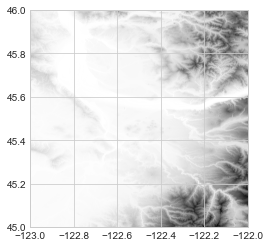

<AxesSubplot:>

In [426]:
show(n46w123)

In [427]:
print(n46w123.crs)
n46w123.shape

EPSG:4269


(10812, 10812)

In [428]:
#rioplot.show(n46w123, cmap='hot') # Its sets the axis correctly to latitude and longitude

In [429]:
n46w123.bounds # check the bounds
print(n46w123.crs)

EPSG:4269


In [430]:
print(strava_proj.crs)

epsg:2838


In [431]:
# set the co-ordinate system first
stravas = strava_proj.set_crs("EPSG:2838")
stravas ["length"]=stravas["geometry"].length # in m
# Let's take a copy of our layer
strava_slope = stravas.copy()

# Reproject the geometries by replacing the values with projected ones
strava_slope_new = strava_slope.to_crs(epsg=4269)
strava_slope_new.head(10)

,ID,OSM_ID,OSM_NAME,CLAZZ,KM,year,aadb_s,aadb_s_com,length,geometry
0,8.0,4440967.0,Northeast Butler Street,31.0,0.031403,2019,1.767123,1.191781,31.456401,"LINESTRING (-122.90511 45.53766, -122.90477 45..."
1,10.0,4443830.0,Northeast 85th Avenue,32.0,0.034098,2019,0.013699,0.000000,34.078730,"LINESTRING (-122.89170 45.53232, -122.89171 45..."
2,18.0,4490031.0,Northwest Cedar Hills Boulevard,21.0,0.198173,2019,2.383562,1.164384,198.152425,"LINESTRING (-122.79277 45.52251, -122.79274 45..."
3,20.0,4490031.0,Northwest Cedar Hills Boulevard,21.0,0.116912,2019,2.369863,1.164384,116.881836,"LINESTRING (-122.79179 45.52075, -122.79161 45..."
4,26.0,4490043.0,Northeast 87th Avenue,32.0,0.075945,2019,0.013699,0.000000,75.902503,"LINESTRING (-122.88966 45.52964, -122.88965 45..."
5,30.0,4493251.0,Northeast Sheffield Avenue,32.0,0.037724,2019,0.013699,0.000000,37.727623,"LINESTRING (-122.88945 45.53639, -122.88952 45..."
6,31.0,4493251.0,Northeast Sheffield Avenue,32.0,0.110734,2019,0.013699,0.000000,110.751650,"LINESTRING (-122.88967 45.53608, -122.88974 45..."
7,34.0,4493256.0,Southwest 153rd Drive,31.0,0.134936,2019,3.958904,2.849315,134.934141,"LINESTRING (-122.83570 45.50630, -122.83575 45..."
8,35.0,4493490.0,Northeast Walker Road,31.0,0.048515,2019,2.178082,1.547945,48.646059,"LINESTRING (-122.90022 45.53794, -122.90010 45..."
9,36.0,4493490.0,Northeast Walker Road,31.0,0.025857,2019,1.876712,1.301370,25.924766,"LINESTRING (-122.89961 45.53787, -122.89929 45..."


In [432]:
# get the slope for each link of the network
strava_slope_new
# First identify the starting and ending node of each link
strava_slope_new['starting point'] = None
strava_slope_new['ending point'] = None

for index, row in strava_slope_new.iterrows():
    coords = [(coords) for coords in list(row['geometry'].coords)]
    first_coord, last_coord = [ coords[i] for i in (0, -1) ]
    strava_slope_new.at[index,'starting point'] = Point(first_coord)
    strava_slope_new.at[index,'ending point'] = Point(last_coord)
    strava_slope_new

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [433]:
strava_slope_new.head(5)

,ID,OSM_ID,OSM_NAME,CLAZZ,KM,year,aadb_s,aadb_s_com,length,geometry,starting point,ending point
0,8.0,4440967.0,Northeast Butler Street,31.0,0.031403,2019,1.767123,1.191781,31.456401,"LINESTRING (-122.90511 45.53766, -122.90477 45...",POINT (-122.9051071032779 45.53765552980075),POINT (-122.9047733044891 45.53749712933061)
1,10.0,4443830.0,Northeast 85th Avenue,32.0,0.034098,2019,0.013699,0.000000,34.078730,"LINESTRING (-122.89170 45.53232, -122.89171 45...",POINT (-122.8917022451145 45.53231930779811),POINT (-122.8917100470238 45.53201270841168)
2,18.0,4490031.0,Northwest Cedar Hills Boulevard,21.0,0.198173,2019,2.383562,1.164384,198.152425,"LINESTRING (-122.79277 45.52251, -122.79274 45...",POINT (-122.7927711619811 45.52251286761185),POINT (-122.7918528720279 45.52085786615329)
3,20.0,4490031.0,Northwest Cedar Hills Boulevard,21.0,0.116912,2019,2.369863,1.164384,116.881836,"LINESTRING (-122.79179 45.52075, -122.79161 45...",POINT (-122.7917855726958 45.52074836603802),POINT (-122.7913764786866 45.519746965523)
4,26.0,4490043.0,Northeast 87th Avenue,32.0,0.075945,2019,0.013699,0.000000,75.902503,"LINESTRING (-122.88966 45.52964, -122.88965 45...",POINT (-122.8896631630485 45.5296415078439),POINT (-122.8896473588017 45.53032440649985)


In [434]:
#show point and raster on a matplotlib plot
#fig, ax = plt.subplots(figsize=(12,12))
#strava_slope_new.boundary.plot(ax=ax, color='orangered')
#show(n46w123, ax=ax)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<AxesSubplot:>

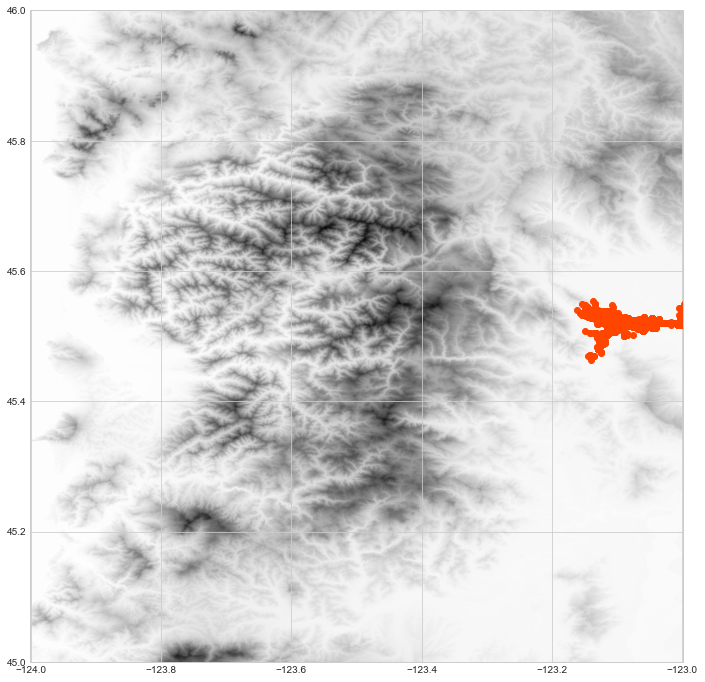

In [435]:
#show point and raster on a matplotlib plot
fig, ax = plt.subplots(figsize=(12,12))
strava_slope_new.boundary.plot(ax=ax, color='orangered')
show(n46w124, ax=ax)

In [436]:
sf1=strava_slope_new.loc[:,["OSM_ID","starting point"]]
sf1.columns=["OSM_ID","geometry"]
sf1['start_lon'] = sf1.geometry.apply(lambda p: p.x)
sf1['start_lat'] = sf1.geometry.apply(lambda p: p.y)
sf2=sf1.loc[:,["OSM_ID","geometry","start_lon","start_lat"]]
sf2.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,OSM_ID,geometry,start_lon,start_lat
0,4440967.0,POINT (-122.90511 45.53766),-122.905107,45.537656
1,4443830.0,POINT (-122.89170 45.53232),-122.891702,45.532319
2,4490031.0,POINT (-122.79277 45.52251),-122.792771,45.522513
3,4490031.0,POINT (-122.79179 45.52075),-122.791786,45.520748
4,4490043.0,POINT (-122.88966 45.52964),-122.889663,45.529642


In [437]:
#For image n46w123
ss=sf2.loc[sf2.start_lon>-123.0]
ss.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,OSM_ID,geometry,start_lon,start_lat
0,4440967.0,POINT (-122.90511 45.53766),-122.905107,45.537656
1,4443830.0,POINT (-122.89170 45.53232),-122.891702,45.532319
2,4490031.0,POINT (-122.79277 45.52251),-122.792771,45.522513
3,4490031.0,POINT (-122.79179 45.52075),-122.791786,45.520748
4,4490043.0,POINT (-122.88966 45.52964),-122.889663,45.529642


In [438]:
ss["starting_ele"]= None
#point in test['geometry']:
x = ss["start_lon"]
y = ss["start_lat"]
row, col = n46w123.index(x,y)
ss["starting_ele"]=n46w123.read(1)[row,col]

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\geopandas\geodataframe.py:1322: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super(GeoDataFrame, self).__setitem__(key, value)


In [439]:
ss.head(5)

,OSM_ID,geometry,start_lon,start_lat,starting_ele
0,4440967.0,POINT (-122.90511 45.53766),-122.905107,45.537656,65.531769
1,4443830.0,POINT (-122.89170 45.53232),-122.891702,45.532319,54.338253
2,4490031.0,POINT (-122.79277 45.52251),-122.792771,45.522513,81.901581
3,4490031.0,POINT (-122.79179 45.52075),-122.791786,45.520748,83.271347
4,4490043.0,POINT (-122.88966 45.52964),-122.889663,45.529642,56.515728


In [440]:
#For image n46w124
sss=sf2.loc[sf2.start_lon<=-123.0]
sss.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,OSM_ID,geometry,start_lon,start_lat
3190,5387093.0,POINT (-123.12686 45.52773),-123.126858,45.527732
3191,5387093.0,POINT (-123.12704 45.52726),-123.127044,45.527256
3192,5387093.0,POINT (-123.12728 45.52677),-123.127275,45.526766
3193,5387093.0,POINT (-123.12726 45.52601),-123.127261,45.526010
3194,5387215.0,POINT (-123.01668 45.52000),-123.016679,45.519996


In [441]:
sss["starting_ele"]= None
#point in test['geometry']:
x = sss["start_lon"]
y = sss["start_lat"]
row, col = n46w124.index(x,y)
sss["starting_ele"]=n46w124.read(1)[row,col]

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\geopandas\geodataframe.py:1322: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super(GeoDataFrame, self).__setitem__(key, value)


<AxesSubplot:>

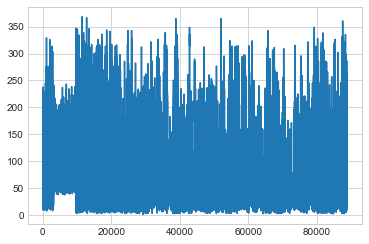

In [442]:
ss.starting_ele.plot()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<AxesSubplot:>

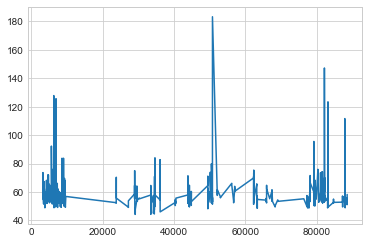

In [443]:
sss.starting_ele.plot()

In [444]:
ef1=strava_slope_new.loc[:,["OSM_ID","ending point"]]
ef1
ef1.columns=["OSM_ID","geometry"]
ef1['end_lon'] = ef1.geometry.apply(lambda p: p.x)
ef1['end_lat'] = ef1.geometry.apply(lambda p: p.y)
ef2=ef1.loc[:,["OSM_ID","geometry","end_lon","end_lat"]]
ef2.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,OSM_ID,geometry,end_lon,end_lat
0,4440967.0,POINT (-122.90477 45.53750),-122.904773,45.537497
1,4443830.0,POINT (-122.89171 45.53201),-122.891710,45.532013
2,4490031.0,POINT (-122.79185 45.52086),-122.791853,45.520858
3,4490031.0,POINT (-122.79138 45.51975),-122.791376,45.519747
4,4490043.0,POINT (-122.88965 45.53032),-122.889647,45.530324


In [445]:
#For image n46w123
ee=ef2.loc[ef2.end_lon>-123.0]
ee.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,OSM_ID,geometry,end_lon,end_lat
0,4440967.0,POINT (-122.90477 45.53750),-122.904773,45.537497
1,4443830.0,POINT (-122.89171 45.53201),-122.891710,45.532013
2,4490031.0,POINT (-122.79185 45.52086),-122.791853,45.520858
3,4490031.0,POINT (-122.79138 45.51975),-122.791376,45.519747
4,4490043.0,POINT (-122.88965 45.53032),-122.889647,45.530324


In [446]:
ee["ending_ele"]= None
#point in test['geometry']:
x = ee["end_lon"]
y = ee["end_lat"]
row, col = n46w123.index(x,y)
ee["ending_ele"]=n46w123.read(1)[row,col]

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\geopandas\geodataframe.py:1322: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super(GeoDataFrame, self).__setitem__(key, value)


In [447]:
#For image n46w124
eee=ef2.loc[ef2.end_lon<=-123.0]
eee.head(5)

,OSM_ID,geometry,end_lon,end_lat
3190,5387093.0,POINT (-123.12704 45.52726),-123.127044,45.527256
3191,5387093.0,POINT (-123.12728 45.52677),-123.127275,45.526766
3192,5387093.0,POINT (-123.12726 45.52601),-123.127261,45.526010
3193,5387093.0,POINT (-123.12751 45.52528),-123.127508,45.525277
3194,5387215.0,POINT (-123.01663 45.52242),-123.016625,45.522423


In [448]:
#rioplot.show(n46w123, cmap='hot')
#strava_slope_new.boundary.plot(ax=plt.gca(), color='skyblue')

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [449]:
eee["ending_ele"]= None
#point in test['geometry']:
x = eee["end_lon"]
y = eee["end_lat"]
row, col = n46w124.index(x,y)
eee["ending_ele"]=n46w124.read(1)[row,col]

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\geopandas\geodataframe.py:1322: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super(GeoDataFrame, self).__setitem__(key, value)


<AxesSubplot:>

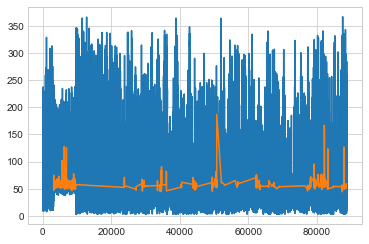

In [450]:
ee.ending_ele.plot()
eee.ending_ele.plot()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<AxesSubplot:>

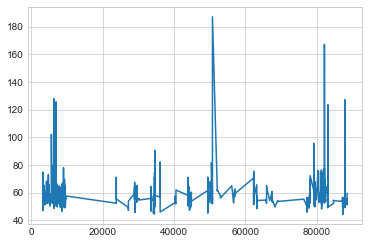

In [451]:
eee.ending_ele.plot()

In [452]:
s=pd.concat([ss,sss])
s=s.drop(["geometry"],axis=1)
s.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,OSM_ID,start_lon,start_lat,starting_ele
0,4440967.0,-122.905107,45.537656,65.531769
1,4443830.0,-122.891702,45.532319,54.338253
2,4490031.0,-122.792771,45.522513,81.901581
3,4490031.0,-122.791786,45.520748,83.271347
4,4490043.0,-122.889663,45.529642,56.515728


In [453]:
e=pd.concat([ee,eee])
e=e.drop(["geometry"],axis=1)
e.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,OSM_ID,end_lon,end_lat,ending_ele
0,4440967.0,-122.904773,45.537497,65.228989
1,4443830.0,-122.891710,45.532013,54.599159
2,4490031.0,-122.791853,45.520858,83.188705
3,4490031.0,-122.791376,45.519747,80.504646
4,4490043.0,-122.889647,45.530324,55.861305


In [454]:
strava_slope_new.shape,s.shape,e.shape

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


((88871, 12), (88871, 4), (88871, 4))

In [455]:
from functools import reduce
strava_all=[strava_slope_new,s,e]

strava_all1= reduce(lambda  left,right: pd.merge(left,right,on=['OSM_ID'],
                                            how='outer'), strava_all).fillna('0')
strava_all1["slope"]=abs((strava_all1['starting_ele']-strava_all1['ending_ele'])/strava_all1['length'])*100
strava_all1=strava_all1.drop_duplicates(subset=['ID'], keep='first')
strava_all1.head(10)

,ID,OSM_ID,OSM_NAME,CLAZZ,KM,year,aadb_s,aadb_s_com,length,geometry,starting point,ending point,start_lon,start_lat,starting_ele,end_lon,end_lat,ending_ele,slope
0,8.0,4440967.0,Northeast Butler Street,31.0,0.031403,2019,1.767123,1.191781,31.456401,"LINESTRING (-122.90511 45.53766, -122.90477 45...",POINT (-122.9051071032779 45.53765552980075),POINT (-122.9047733044891 45.53749712933061),-122.905107,45.537656,65.531769,-122.904773,45.537497,65.228989,0.962539
1,10.0,4443830.0,Northeast 85th Avenue,32.0,0.034098,2019,0.013699,0.000000,34.078730,"LINESTRING (-122.89170 45.53232, -122.89171 45...",POINT (-122.8917022451145 45.53231930779811),POINT (-122.8917100470238 45.53201270841168),-122.891702,45.532319,54.338253,-122.891710,45.532013,54.599159,0.765598
2,18.0,4490031.0,Northwest Cedar Hills Boulevard,21.0,0.198173,2019,2.383562,1.164384,198.152425,"LINESTRING (-122.79277 45.52251, -122.79274 45...",POINT (-122.7927711619811 45.52251286761185),POINT (-122.7918528720279 45.52085786615329),-122.792771,45.522513,81.901581,-122.791853,45.520858,83.188705,0.649563
6,20.0,4490031.0,Northwest Cedar Hills Boulevard,21.0,0.116912,2019,2.369863,1.164384,116.881836,"LINESTRING (-122.79179 45.52075, -122.79161 45...",POINT (-122.7917855726958 45.52074836603802),POINT (-122.7913764786866 45.519746965523),-122.792771,45.522513,81.901581,-122.791853,45.520858,83.188705,1.101219
10,26.0,4490043.0,Northeast 87th Avenue,32.0,0.075945,2019,0.013699,0.000000,75.902503,"LINESTRING (-122.88966 45.52964, -122.88965 45...",POINT (-122.8896631630485 45.5296415078439),POINT (-122.8896473588017 45.53032440649985),-122.889663,45.529642,56.515728,-122.889647,45.530324,55.861305,0.862189
11,30.0,4493251.0,Northeast Sheffield Avenue,32.0,0.037724,2019,0.013699,0.000000,37.727623,"LINESTRING (-122.88945 45.53639, -122.88952 45...",POINT (-122.8894493211495 45.53638549444339),POINT (-122.8896659229041 45.53608209554926),-122.889449,45.536385,52.078636,-122.889666,45.536082,53.249783,3.104215
15,31.0,4493251.0,Northeast Sheffield Avenue,32.0,0.110734,2019,0.013699,0.000000,110.751650,"LINESTRING (-122.88967 45.53608, -122.88974 45...",POINT (-122.8896659229041 45.53608209554926),POINT (-122.8902673279837 45.53520689869214),-122.889449,45.536385,52.078636,-122.889666,45.536082,53.249783,1.057453
19,34.0,4493256.0,Southwest 153rd Drive,31.0,0.134936,2019,3.958904,2.849315,134.934141,"LINESTRING (-122.83570 45.50630, -122.83575 45...",POINT (-122.8356969346625 45.50629689907753),POINT (-122.8363910409373 45.50519040235721),-122.835697,45.506297,55.604343,-122.836391,45.505190,57.596951,1.476726
20,35.0,4493490.0,Northeast Walker Road,31.0,0.048515,2019,2.178082,1.547945,48.646059,"LINESTRING (-122.90022 45.53794, -122.90010 45...",POINT (-122.9002248046144 45.53793691744257),POINT (-122.8996110054402 45.53786771610551),-122.900225,45.537937,66.983635,-122.899611,45.537868,66.320793,1.362581
36,36.0,4493490.0,Northeast Walker Road,31.0,0.025857,2019,1.876712,1.301370,25.924766,"LINESTRING (-122.89961 45.53787, -122.89929 45...",POINT (-122.8996110054402 45.53786771610551),POINT (-122.8992854059327 45.53782231541356),-122.900225,45.537937,66.983635,-122.899611,45.537868,66.320793,2.556790


C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<AxesSubplot:>

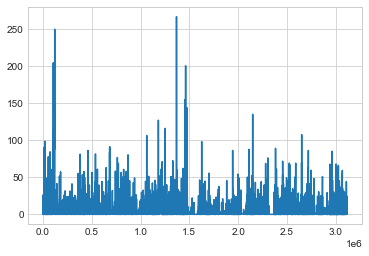

In [456]:
strava_all1.slope.plot()

In [457]:
print(strava_all1.crs)
strava_all2=strava_all1.copy()

epsg:4269


C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [458]:
# set the co-ordinate system first
strava_all2 = strava_all2.set_crs("EPSG:4269")

# Reproject the geometries by replacing the values with projected ones
strava_all2_slope = strava_all2.to_crs(epsg=2838)
strava_all2_slope.head(10)

,ID,OSM_ID,OSM_NAME,CLAZZ,KM,year,aadb_s,aadb_s_com,length,geometry,starting point,ending point,start_lon,start_lat,starting_ele,end_lon,end_lat,ending_ele,slope
0,8.0,4440967.0,Northeast Butler Street,31.0,0.031403,2019,1.767123,1.191781,31.456401,"LINESTRING (2312190.529 210704.118, 2312216.06...",POINT (-122.9051071032779 45.53765552980075),POINT (-122.9047733044891 45.53749712933061),-122.905107,45.537656,65.531769,-122.904773,45.537497,65.228989,0.962539
1,10.0,4443830.0,Northeast 85th Avenue,32.0,0.034098,2019,0.013699,0.000000,34.078730,"LINESTRING (2313219.428 210080.276, 2313217.81...",POINT (-122.8917022451145 45.53231930779811),POINT (-122.8917100470238 45.53201270841168),-122.891702,45.532319,54.338253,-122.891710,45.532013,54.599159,0.765598
2,18.0,4490031.0,Northwest Cedar Hills Boulevard,21.0,0.198173,2019,2.383562,1.164384,198.152425,"LINESTRING (2320912.445 208766.937, 2320914.40...",POINT (-122.7927711619811 45.52251286761185),POINT (-122.7918528720279 45.52085786615329),-122.792771,45.522513,81.901581,-122.791853,45.520858,83.188705,0.649563
6,20.0,4490031.0,Northwest Cedar Hills Boulevard,21.0,0.116912,2019,2.369863,1.164384,116.881836,"LINESTRING (2320983.848 208568.739, 2320996.79...",POINT (-122.7917855726958 45.52074836603802),POINT (-122.7913764786866 45.519746965523),-122.792771,45.522513,81.901581,-122.791853,45.520858,83.188705,1.101219
10,26.0,4490043.0,Northeast 87th Avenue,32.0,0.075945,2019,0.013699,0.000000,75.902503,"LINESTRING (2313369.825 209778.103, 2313373.30...",POINT (-122.8896631630485 45.5296415078439),POINT (-122.8896473588017 45.53032440649985),-122.889663,45.529642,56.515728,-122.889647,45.530324,55.861305,0.862189
11,30.0,4493251.0,Northeast Sheffield Avenue,32.0,0.037724,2019,0.013699,0.000000,37.727623,"LINESTRING (2313408.681 210526.761, 2313403.24...",POINT (-122.8894493211495 45.53638549444339),POINT (-122.8896659229041 45.53608209554926),-122.889449,45.536385,52.078636,-122.889666,45.536082,53.249783,3.104215
15,31.0,4493251.0,Northeast Sheffield Avenue,32.0,0.110734,2019,0.013699,0.000000,110.751650,"LINESTRING (2313390.774 210493.558, 2313385.07...",POINT (-122.8896659229041 45.53608209554926),POINT (-122.8902673279837 45.53520689869214),-122.889449,45.536385,52.078636,-122.889666,45.536082,53.249783,1.057453
19,34.0,4493256.0,Southwest 153rd Drive,31.0,0.134936,2019,3.958904,2.849315,134.934141,"LINESTRING (2317508.365 207061.604, 2317504.27...",POINT (-122.8356969346625 45.50629689907753),POINT (-122.8363910409373 45.50519040235721),-122.835697,45.506297,55.604343,-122.836391,45.505190,57.596951,1.476726
20,35.0,4493490.0,Northeast Walker Road,31.0,0.048515,2019,2.178082,1.547945,48.646059,"LINESTRING (2312572.593 210724.039, 2312582.42...",POINT (-122.9002248046144 45.53793691744257),POINT (-122.8996110054402 45.53786771610551),-122.900225,45.537937,66.983635,-122.899611,45.537868,66.320793,1.362581
36,36.0,4493490.0,Northeast Walker Road,31.0,0.025857,2019,1.876712,1.301370,25.924766,"LINESTRING (2312620.281 210714.928, 2312645.54...",POINT (-122.8996110054402 45.53786771610551),POINT (-122.8992854059327 45.53782231541356),-122.900225,45.537937,66.983635,-122.899611,45.537868,66.320793,2.556790


In [459]:
inter_road.columns

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Index(['site_id', 'site_name', 'sensor_type', 'year', 'region',
       'travel_pattern', 'AADBT', 'stv_adb', 'stv_c_adb', 'stl_raw',
       'latitude', 'longitude', 'comment', 'osm_id_sensor', 'buff_dist',
       'buffer_area', 'osm_id', 'name', 'ref', 'type', 'oneway', 'bridge',
       'maxspeed', 'geometry', 'Length'],
      dtype='object')

In [460]:
#Identify the OSM ID link that have bridge

inter_road_bridge=pd.merge (left=ecoshort, right=bridge_only, left_on='osm_id_sensor', right_on='osm_id',how='inner')
inter_road_bridge=inter_road_bridge.loc[:,["osm_id_sensor", "bridge"]]
#inter_road_bridge=inter_road_bridge.drop_duplicates(subset='osm_id_1')
#inter_road_bridge = inter_road_bridge[inter_road_bridge['bridge'] > 0]
inter_road_bridge.head()

,osm_id_sensor,bridge
0,681301893.0,1
1,681301893.0,1
2,681301893.0,1
3,681301893.0,1
4,681301893.0,1


In [461]:
# Now clip with buffer for each location
#buffer_clip_slope = gpd.clip(strava_all2_slope, gdf1)
#buffer_clip_slope=buffer_clip_slope.drop(["osm_id"],axis=1)
buffer_clip_slope1=gpd.sjoin(strava_all2_slope,gdf1,op='intersects') 
buffer_clip_slope1.head(5)


C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,ID,OSM_ID,OSM_NAME,CLAZZ,KM,year_left,aadb_s,aadb_s_com,length,geometry,...,AADBT,stv_adb,stv_c_adb,stl_raw,latitude,longitude,comment,osm_id_sensor,buff_dist,buffer_area
410000,310672.0,5509019.0,Northeast Cleveland Avenue,32.0,0.139999,2019,0.561644,0.191781,139.921000,"LINESTRING (2330917.375 211495.513, 2330920.04...",...,218.104397,109.958904,73.616438,6209.0,45.550657,-122.666722,NaN,423040054.0,0.1,0.032309
410025,310673.0,5509019.0,Northeast Cleveland Avenue,32.0,0.140317,2019,0.561644,0.246575,140.239672,"LINESTRING (2330920.040 211635.409, 2330923.40...",...,218.104397,109.958904,73.616438,6209.0,45.550657,-122.666722,NaN,423040054.0,0.1,0.032309
534931,326305.0,5521575.0,Northeast Rodney Avenue,32.0,0.140142,2019,3.589041,1.767123,140.064716,"LINESTRING (2331000.312 211633.602, 2331003.08...",...,218.104397,109.958904,73.616438,6209.0,45.550657,-122.666722,NaN,423040054.0,0.1,0.032309
558953,327347.0,5522719.0,0,51.0,0.140009,2019,0.109589,0.041096,139.931529,"LINESTRING (2330697.900 211500.512, 2330702.66...",...,218.104397,109.958904,73.616438,6209.0,45.550657,-122.666722,NaN,423040054.0,0.1,0.032309
558962,327348.0,5522719.0,0,51.0,0.140284,2019,0.068493,0.013699,140.206172,"LINESTRING (2330702.662 211640.363, 2330706.75...",...,218.104397,109.958904,73.616438,6209.0,45.550657,-122.666722,NaN,423040054.0,0.1,0.032309


In [462]:
#Make all link having bridge  slope is zero
buffer_clip_slope2=pd.merge(inter_road_bridge,buffer_clip_slope1, right_on='osm_id_sensor', left_on='osm_id_sensor',how='inner')
buffer_clip_slope2.head(5)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,bridge,ID,OSM_ID,OSM_NAME,CLAZZ,KM,year_left,aadb_s,aadb_s_com,...,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,latitude,longitude,comment,buff_dist,buffer_area
0,681301893.0,1,311697.0,5509543.0,0,21.0,0.037179,2019,6.246575,4.684932,...,1.0,1775.36369,109.219178,80.945205,9915.0,45.51383,-122.67284,NaN,0.1,0.016902
1,681301893.0,1,320941.0,5515496.0,0,22.0,0.032190,2019,13.506849,9.191781,...,1.0,1775.36369,109.219178,80.945205,9915.0,45.51383,-122.67284,NaN,0.1,0.016902
2,681301893.0,1,350195.0,30259963.0,0,21.0,0.037334,2019,44.904110,32.849315,...,1.0,1775.36369,109.219178,80.945205,9915.0,45.51383,-122.67284,NaN,0.1,0.016902
3,681301893.0,1,350197.0,30259980.0,Southwest Madison Street,21.0,0.065467,2019,33.575342,22.000000,...,1.0,1775.36369,109.219178,80.945205,9915.0,45.51383,-122.67284,NaN,0.1,0.016902
4,681301893.0,1,350199.0,30260211.0,Hawthorne Bridge,72.0,0.070017,2019,50.616438,37.493151,...,1.0,1775.36369,109.219178,80.945205,9915.0,45.51383,-122.67284,NaN,0.1,0.016902


C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<AxesSubplot:>

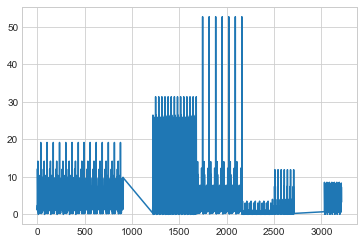

In [463]:
# Separate bridge and non bridge data
bridge_presence=buffer_clip_slope2.loc[buffer_clip_slope2.bridge ==1] 
bridge_presence.slope.plot()


C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)
C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\geopandas\geodataframe.py:1322: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super(GeoDataFrame, self).__setitem__(key, value)


<AxesSubplot:>

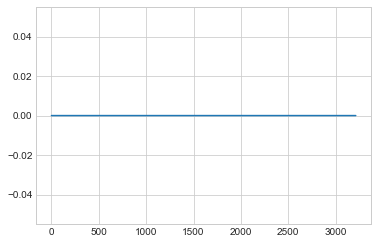

In [464]:
bridge_presence['slope']=0
bridge_presence.slope.plot()

In [465]:
bridge_absence=buffer_clip_slope2.loc[buffer_clip_slope2.bridge==0] 
bridge_absence.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,bridge,ID,OSM_ID,OSM_NAME,CLAZZ,KM,year_left,aadb_s,aadb_s_com,...,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,latitude,longitude,comment,buff_dist,buffer_area
910,322079535.0,0,351790.0,30474373.0,I 5 - Robert Hugh Baldock Freeway,11.0,0.052395,2019,0.013699,0.000000,...,1.0,1346.26131,98.109589,59.917808,5466.0,45.50134,-122.67197,NaN,0.1,0.023266
911,322079535.0,0,351791.0,30474374.0,I 5 - Marquam Bridge,11.0,0.507381,2019,0.013699,0.000000,...,1.0,1346.26131,98.109589,59.917808,5466.0,45.50134,-122.67197,NaN,0.1,0.023266
912,322079535.0,0,425904.0,123519149.0,0,51.0,0.075690,2019,0.986301,0.904110,...,1.0,1346.26131,98.109589,59.917808,5466.0,45.50134,-122.67197,NaN,0.1,0.023266
913,322079535.0,0,425905.0,123519149.0,0,51.0,0.020521,2019,0.684932,0.630137,...,1.0,1346.26131,98.109589,59.917808,5466.0,45.50134,-122.67197,NaN,0.1,0.023266
914,322079535.0,0,481345.0,161385575.0,Southwest Porter Street,31.0,0.101195,2019,5.958904,3.438356,...,1.0,1346.26131,98.109589,59.917808,5466.0,45.50134,-122.67197,NaN,0.1,0.023266


In [466]:
# now join again
buffer_clip_slope3=pd.concat([bridge_presence,bridge_absence])
# put the cap for the slope as maximum 25%
buffer_clip_slope3=buffer_clip_slope3[buffer_clip_slope3['slope']<25]
buffer_clip_slope3.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,bridge,ID,OSM_ID,OSM_NAME,CLAZZ,KM,year_left,aadb_s,aadb_s_com,...,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,latitude,longitude,comment,buff_dist,buffer_area
0,681301893.0,1,311697.0,5509543.0,0,21.0,0.037179,2019,6.246575,4.684932,...,1.0,1775.36369,109.219178,80.945205,9915.0,45.51383,-122.67284,NaN,0.1,0.016902
1,681301893.0,1,320941.0,5515496.0,0,22.0,0.032190,2019,13.506849,9.191781,...,1.0,1775.36369,109.219178,80.945205,9915.0,45.51383,-122.67284,NaN,0.1,0.016902
2,681301893.0,1,350195.0,30259963.0,0,21.0,0.037334,2019,44.904110,32.849315,...,1.0,1775.36369,109.219178,80.945205,9915.0,45.51383,-122.67284,NaN,0.1,0.016902
3,681301893.0,1,350197.0,30259980.0,Southwest Madison Street,21.0,0.065467,2019,33.575342,22.000000,...,1.0,1775.36369,109.219178,80.945205,9915.0,45.51383,-122.67284,NaN,0.1,0.016902
4,681301893.0,1,350199.0,30260211.0,Hawthorne Bridge,72.0,0.070017,2019,50.616438,37.493151,...,1.0,1775.36369,109.219178,80.945205,9915.0,45.51383,-122.67284,NaN,0.1,0.016902


C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


<AxesSubplot:>

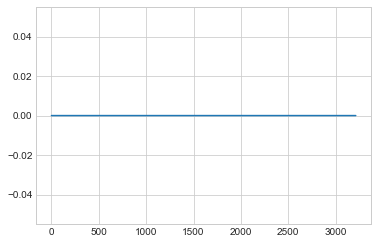

In [467]:
check=buffer_clip_slope3[buffer_clip_slope3['bridge']== 1]
check.slope.plot()

In [468]:
# Now calculate the mean slope for each count location
output_slope=buffer_clip_slope3.groupby(by=['osm_id_sensor'])['slope'].mean().reset_index()
output_slope.columns=['osm_id','slope']
output_slope.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,slope
0,5516558.0,0.417911
1,5522164.0,2.464372
2,5527017.0,1.841754
3,5528173.0,1.667107
4,5529700.0,0.751571


# Import Weather Daily level data from weather underground website Using python coding

1. https://www.shanelynn.ie/analysis-of-weather-data-using-pandas-python-and-seaborn/
2. https://bojanstavrikj.github.io/content/page1/wunderground_scraper

In [469]:
#!pip install beautifulsoup4
#!pip install -U selenium
#!pip install webdriver-manager
#!pip install chromedriver 
#!pip3 install webdrivermanager


C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [470]:
from bs4 import BeautifulSoup as BS #conda install -c anaconda beautifulsoup4 
from selenium import webdriver
from functools import reduce
import pandas as pd
import time

In [471]:
from selenium import webdriver
from selenium.webdriver.chrome.options import Options
from webdriver_manager.chrome import ChromeDriverManager
from os import system as System
from webdriver_manager.utils import ChromeType
#from selenium.webdriver.common.desired_capabilities import DesiredCapabilities

In [472]:
    def render_page(url):
        options = Options()
        options.add_argument("user-data-dir=C:\\Users\\mxm5116\\Desktop\\Profile 1")
        driver = webdriver.Chrome(executable_path=r'C:/Program Files/Google/Chrome/Application/chromedriver_win32/chromedriver.exe', chrome_options=options)
        driver.get(url)
        time.sleep(3)
        r = driver.page_source
        driver.quit()
        return r  

In [473]:
# driver =webdriver.Chrome(r'C:\Users\mxm5116\Downloads\chromedriver_win32\chromedriver.exe')
# driver = webdriver.Firefox(executable_path=r'C:\Users\mxm5116\Downloads\geckodriver-v0.29.0-win64\geckodriver.exe')
#chrome_options = Options()
# chrome_options.add_argument('--headless')
#chrome_options.add_argument('--no-sandbox')
# chrome_options.add_argument('--disable-dev-shm-usage')
#driver = webdriver.Chrome(chrome_options=chrome_options, executable_path=r'C:\Users\mxm5116\Downloads\chromedriver_win32\chromedriver.exe')

#driver.get(r'https://www.google.com')
#time.sleep(5)
#r = driver.page_source
#print(r)

In [474]:
#def render_page(url):
#        chrome_options = Options()
#        chrome_options.add_argument('--headless')
#        chrome_options.add_argument('--no-sandbox')
#        chrome_options.add_argument('--disable-dev-shm-usage')
#        driver = webdriver.Chrome("executable_path=r"C:/Users/mxm5116/Downloads/chromedriver_win32/chromedriver.exe")
#        driver.get(url)
#        time.sleep(3)
#        r = driver.page_source
#        driver.quit()
#       return r

In [475]:
  def scraper(page, dates):
        output = pd.DataFrame()

        for d in dates:

            url = str(str(page) + str(d))
            print(url)

            r = render_page(url)
            print(r)
            soup = BS(r, "html.parser")
            container = soup.find('lib-city-history-observation')
            check = container.find('tbody')

            data = []

            for c in check.find_all('tr', class_='ng-star-inserted'):
                for i in c.find_all('td', class_='ng-star-inserted'):
                    trial = i.text
                    trial = trial.strip('  ')
                    data.append(trial)

            if round(len(data) / 17 - 1) == 31:
                Temperature = pd.DataFrame([data[32:128][x:x + 3] for x in range(0, len(data[32:128]), 3)][1:],
                                           columns=['Temp_max', 'Temp_avg', 'Temp_min'])
                Dew_Point = pd.DataFrame([data[128:224][x:x + 3] for x in range(0, len(data[128:224]), 3)][1:],
                                         columns=['Dew_max', 'Dew_avg', 'Dew_min'])
                Humidity = pd.DataFrame([data[224:320][x:x + 3] for x in range(0, len(data[224:320]), 3)][1:],
                                        columns=['Hum_max', 'Hum_avg', 'Hum_min'])
                Wind = pd.DataFrame([data[320:416][x:x + 3] for x in range(0, len(data[320:416]), 3)][1:],
                                    columns=['Wind_max', 'Wind_avg', 'Wind_min'])
                Pressure = pd.DataFrame([data[416:512][x:x + 3] for x in range(0, len(data[416:512]), 3)][1:],
                                        columns=['Pres_max', 'Pres_avg', 'Pres_min'])
                Date = pd.DataFrame(data[:32][1:], columns=data[:1])
                Precipitation = pd.DataFrame(data[512:][1:], columns=['Precipitation'])
                print(str(str(d) + ' finished!'))
            elif round(len(data) / 17 - 1) == 28:
                Temperature = pd.DataFrame([data[29:116][x:x + 3] for x in range(0, len(data[29:116]), 3)][1:],
                                           columns=['Temp_max', 'Temp_avg', 'Temp_min'])
                Dew_Point = pd.DataFrame([data[116:203][x:x + 3] for x in range(0, len(data[116:203]), 3)][1:],
                                         columns=['Dew_max', 'Dew_avg', 'Dew_min'])
                Humidity = pd.DataFrame([data[203:290][x:x + 3] for x in range(0, len(data[203:290]), 3)][1:],
                                        columns=['Hum_max', 'Hum_avg', 'Hum_min'])
                Wind = pd.DataFrame([data[290:377][x:x + 3] for x in range(0, len(data[290:377]), 3)][1:],
                                    columns=['Wind_max', 'Wind_avg', 'Wind_min'])
                Pressure = pd.DataFrame([data[377:464][x:x + 3] for x in range(0, len(data[377:463]), 3)][1:],
                                        columns=['Pres_max', 'Pres_avg', 'Pres_min'])
                Date = pd.DataFrame(data[:29][1:], columns=data[:1])
                Precipitation = pd.DataFrame(data[464:][1:], columns=['Precipitation'])
                print(str(str(d) + ' finished!'))
            elif round(len(data) / 17 - 1) == 29:
                Temperature = pd.DataFrame([data[30:120][x:x + 3] for x in range(0, len(data[30:120]), 3)][1:],
                                           columns=['Temp_max', 'Temp_avg', 'Temp_min'])
                Dew_Point = pd.DataFrame([data[120:210][x:x + 3] for x in range(0, len(data[120:210]), 3)][1:],
                                         columns=['Dew_max', 'Dew_avg', 'Dew_min'])
                Humidity = pd.DataFrame([data[210:300][x:x + 3] for x in range(0, len(data[210:300]), 3)][1:],
                                        columns=['Hum_max', 'Hum_avg', 'Hum_min'])
                Wind = pd.DataFrame([data[300:390][x:x + 3] for x in range(0, len(data[300:390]), 3)][1:],
                                    columns=['Wind_max', 'Wind_avg', 'Wind_min'])
                Pressure = pd.DataFrame([data[390:480][x:x + 3] for x in range(0, len(data[390:480]), 3)][1:],
                                        columns=['Pres_max', 'Pres_avg', 'Pres_min'])
                Date = pd.DataFrame(data[:30][1:], columns=data[:1])
                Precipitation = pd.DataFrame(data[480:][1:], columns=['Precipitation'])
                print(str(str(d) + ' finished!'))
            elif round(len(data) / 17 - 1) == 30:
                Temperature = pd.DataFrame([data[31:124][x:x + 3] for x in range(0, len(data[31:124]), 3)][1:],
                                           columns=['Temp_max', 'Temp_avg', 'Temp_min'])
                Dew_Point = pd.DataFrame([data[124:217][x:x + 3] for x in range(0, len(data[124:217]), 3)][1:],
                                         columns=['Dew_max', 'Dew_avg', 'Dew_min'])
                Humidity = pd.DataFrame([data[217:310][x:x + 3] for x in range(0, len(data[217:310]), 3)][1:],
                                        columns=['Hum_max', 'Hum_avg', 'Hum_min'])
                Wind = pd.DataFrame([data[310:403][x:x + 3] for x in range(0, len(data[310:403]), 3)][1:],
                                    columns=['Wind_max', 'Wind_avg', 'Wind_min'])
                Pressure = pd.DataFrame([data[403:496][x:x + 3] for x in range(0, len(data[403:496]), 3)][1:],
                                        columns=['Pres_max', 'Pres_avg', 'Pres_min'])
                Date = pd.DataFrame(data[:31][1:], columns=data[:1])
                Precipitation = pd.DataFrame(data[496:][1:], columns=['Precipitation'])
                print(str(str(d) + ' finished!'))
            else:
                print('Data not in normal length')

            dfs = [Date, Temperature, Dew_Point, Humidity, Wind, Pressure, Precipitation]

            df_final = reduce(lambda left, right: pd.merge(left, right, left_index=True, right_index=True), dfs)

            df_final['Date'] = str(d) + "-" + df_final.iloc[:, :1].astype(str)

            output = output.append(df_final)

        print('Scraper done!')

        output = output[['Temp_avg', 'Temp_min', 'Dew_max', 'Dew_avg', 'Dew_min', 'Hum_max',
                         'Hum_avg', 'Hum_min', 'Wind_max', 'Wind_avg', 'Wind_min', 'Pres_max',
                         'Pres_avg', 'Pres_min', 'Precipitation', 'Date']]

        return output


# Please input the date and page link to extract the data for your study area here

In [476]:
dates = ['2019-1','2019-2','2019-3','2019-4','2019-5','2019-6','2019-7','2019-8','2019-9','2019-10','2019-11','2019-12']
# insert the date you want to extract the data
page = 'https://www.wunderground.com/history/monthly/us/or/portland/KPDX/date/'
# insert your study location link here
#df_output = scraper(page,dates)

In [477]:
w19=pd.read_csv("C:/Users/mxm5116/Desktop/Bike Fusion/portland_weather.csv")
w19

,Temp_avg,Temp_min,Dew_max,Dew_avg,Dew_min,Hum_max,Hum_avg,Hum_min,Wind_max,Wind_avg,Wind_min,Pres_max,Pres_avg,Pres_min,Precipitation,Date
0,33.5,30,32,30.9,28,96,90.4,65,8,3.1,0,30.4,30.4,30.3,0.00,2019-1-1
1,35.7,31,35,31.0,29,96,84.2,60,9,4.0,0,30.3,30.2,30.1,0.00,2019-1-2
2,48.4,43,44,40.1,35,86,73.5,57,20,11.7,6,30.1,30.0,29.8,0.00,2019-1-3
3,49.1,44,45,42.7,39,89,79.1,61,17,8.7,0,29.9,29.9,29.7,0.09,2019-1-4
4,43.0,38,41,38.6,35,97,85.5,66,33,4.7,0,29.7,29.5,29.2,0.00,2019-1-5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
360,40.8,37,40,37.5,34,93,88.3,82,12,4.5,0,30.2,30.2,30.1,0.01,2019-12-27
361,42.7,41,41,38.2,34,93,84.6,68,14,5.0,0,30.3,30.2,30.1,0.00,2019-12-28
362,42.5,40,37,33.4,31,79,70.3,63,14,8.5,0,30.2,30.1,30.0,0.00,2019-12-29
363,43.0,40,35,33.7,32,79,69.8,61,10,5.6,0,30.4,30.3,30.2,0.00,2019-12-30


In [478]:
output_weather=w19.loc[:, ['Temp_avg', 'Hum_avg','Precipitation']]
output_weather

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,Temp_avg,Hum_avg,Precipitation
0,33.5,90.4,0.00
1,35.7,84.2,0.00
2,48.4,73.5,0.00
3,49.1,79.1,0.09
4,43.0,85.5,0.00
...,...,...,...
360,40.8,88.3,0.01
361,42.7,84.6,0.00
362,42.5,70.3,0.00
363,43.0,69.8,0.00


In [479]:
output_weather.dtypes

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Temp_avg         float64
Hum_avg          float64
Precipitation    float64
dtype: object

In [480]:
# Convert object to float
output_weather2=output_weather.astype(str).astype(float)

In [481]:
output_weather2.isnull().values.any()

False

In [482]:
# Take the average for annual
output_weather3=output_weather2.mean()
output_weather3

Temp_avg         54.164932
Hum_avg          69.331507
Precipitation     0.070274
dtype: float64

# Aggregate all output together in a dataframe

In [483]:
from functools import reduce
import pandas as pd
# compile the list of dataframes you want to merge
df_all = [emerging_data,output_origin,output_destination,output_odl,output_bikecom,output_lane,output_intersection_density1a,output_commercial,commercial_distance1,commercialcc_distance1,output_industrial,industrial_distance1,industrialcc_distance1, output_residential,residential_distance1,residentialcc_distance1, output_retail,retail_distance1,retailcc_distance1,output_grass,grass_distance1,grasscc_distance1,output_park,Park_distance1,parkcc_distance1,output_water,water_distance1,watercc_distance1,output_forest,forest_distance1,forestcc_distance1,CBD_distance1,output_bparking,output_bstop,output_school,output_school_distance,output_college,output_college_distance,output_university,output_university_distance,output_intersection_density1,output_primary,output_secondary,output_tertiary,output_residential,output_path,output_cycleway,output_footway,output_bikeway_all_lane,output_bikeway_all_track, pt_road_type2,output_bikeway_all_lane_binary,output_bikeway_all_track_binary,output_meanspeed,output_pointspeed,output_bridge,output_point_bridge,output_pct_race1,output_pct_gender1,output_student,output_pct_edu1,output_median_age,output_income,output_hhdensity1,output_pdensity1,output_edensity1,output_job1,output_slope]

In [484]:
#emerging_data.shape,output_origin.shape,output_destination.shape,output_odl.shape,output_bikecom.shape,output_lane.shape,output_intersection_density1a.shape,output_commercial.shape,commercial_distance1.shape,commercialcc_distance1.shape,output_industrial.shape,industrial_distance1.shape,industrialcc_distance1.shape, output_residential.shape,residential_distance1.shape,residentialcc_distance1.shape, output_retail.shape,retail_distance1.shape,retailcc_distance1.shape,output_grass.shape,grass_distance1.shape,grasscc_distance1.shape,output_park.shape,Park_distance1.shape,parkcc_distance1.shape,output_water.shape,water_distance1.shape,watercc_distance1.shape,output_forest.shape,forest_distance1.shape,forestcc_distance1.shape,CBD_distance1.shape,output_bparking.shape,output_bstop.shape,output_school.shape,output_school_distance.shape,output_college.shape,output_college_distance.shape,output_university.shape,output_university_distance.shape,output_intersection_density1.shape,output_primary.shape,output_secondary.shape,output_tertiary.shape,output_residential.shape,output_path.shape,output_cycleway.shape,output_footway.shape,output_bikeway_all_lane.shape,output_bikeway_all_track.shape, pt_road_type2.shape,output_bikeway_all_lane_binary.shape,output_bikeway_all_track_binary.shape,output_meanspeed.shape,output_pointspeed.shape,output_bridge.shape,output_point_bridge.shape,output_pct_race1.shape,output_pct_gender1.shape,output_student.shape,output_pct_edu1.shape,output_median_age.shape,output_income.shape,output_hhdensity1.shape,output_pdensity1.shape,output_edensity1.shape,output_job1.shape,output_slope.shape

In [485]:
pt_road_type2.shape

(78, 8)

In [486]:
#Merge by ID
df_merged_eco_short = reduce(lambda  left,right: pd.merge(left,right,on=['osm_id'],
                                            how='left'), df_all)
df_merged_eco_short=df_merged_eco_short.drop_duplicates(subset=['site_id'],keep='first')

In [487]:
#dfs = [df1, df2, df3, df4, df5] 
#from functools import partial 
#outer_merge = partial(pd.merge, how='left') 
#reduce(outer_merge, df_all )

In [488]:
# Add weather data in this new data frame
df_merged_eco_short['Temp_avg'] = pd.Series(output_weather3.Temp_avg, index=df_merged_eco_short.index)
df_merged_eco_short['Hum_avg '] = pd.Series(output_weather3.Hum_avg , index=df_merged_eco_short.index)
df_merged_eco_short['Precipitation'] = pd.Series(output_weather3.Precipitation, index=df_merged_eco_short.index)
df_merged_eco_short.head()

,osm_id,site_id,sensor_type,AADBT,stv_adb,stv_c_adb,stl_raw,Bike Share Origin,Bike Share Destination,Bike Share Crossing,...,Median Age,Median_HH_income,HH_density,population_density,employment_density,Number of jobs,slope,Temp_avg,Hum_avg,Precipitation
0,681301893.0,P001POR,permanent,1775.363690,109.219178,80.945205,9915.0,5241.0,5902.0,19351.0,...,42.079269,25375.416209,1420.611648,3747.528119,3600.904001,85.296136,0.000000,54.164932,69.331507,0.070274
7,689032191.0,P002POR,permanent,1537.211111,111.027397,74.904110,6663.0,1509.0,1681.0,11928.0,...,35.645561,59304.725634,3183.046616,6315.327332,5967.143063,705.855457,0.000000,54.164932,69.331507,0.070274
14,322079535.0,P003POR,permanent,1346.261310,98.109589,59.917808,5466.0,3426.0,3816.0,12638.0,...,50.500000,45337.000000,1413.016667,2160.548064,1999.494552,20.924795,1.422465,54.164932,69.331507,0.070274
21,348027806.0,P004POR,permanent,1951.052146,128.041096,84.410959,17323.0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,54.164932,69.331507,0.070274
28,126306263.0,P005POR,permanent,1182.406584,120.712329,82.164384,8077.0,132.0,138.0,4432.0,...,36.500000,31293.000000,836.876035,1473.053293,1389.744366,261.750546,0.000000,54.164932,69.331507,0.070274


In [489]:
# If you want to export the excel
pd.DataFrame.to_csv(df_merged_eco_short, 'Eco_short_2019_updated_Portland_0.1_mile_network_buffer_data.csv', sep=',', na_rep='0', index=False)

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


# Use Keplergl to produce dynamic Map for all variables

In [490]:
# Make dynamic visualization
#!pip install keplergl

In [491]:
ecoshort.head(5)

,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,...,osm_id_sensor,buff_dist,geometry,min_dist_to_school,min_dist_to_college,min_dist_to_university,lanes,maxspeed,min_dist_to_polygon,min_dist_to_CBD
0,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.36369,109.219178,80.945205,9915.0,...,681301893.0,2.0,POINT (2330251.902 207544.074),2262.300738,1384.844295,3131.27668,1,30.0,1900.51949,1663.77388
1,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.36369,109.219178,80.945205,9915.0,...,681301893.0,1.5,POINT (2330251.902 207544.074),2262.300738,1384.844295,3131.27668,1,30.0,1900.51949,1663.77388
2,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.36369,109.219178,80.945205,9915.0,...,681301893.0,1.0,POINT (2330251.902 207544.074),2262.300738,1384.844295,3131.27668,1,30.0,1900.51949,1663.77388
3,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.36369,109.219178,80.945205,9915.0,...,681301893.0,0.75,POINT (2330251.902 207544.074),2262.300738,1384.844295,3131.27668,1,30.0,1900.51949,1663.77388
4,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.36369,109.219178,80.945205,9915.0,...,681301893.0,0.5,POINT (2330251.902 207544.074),2262.300738,1384.844295,3131.27668,1,30.0,1900.51949,1663.77388


In [492]:
ecoshort_selected=ecoshort.loc[:,["osm_id_sensor","geometry"]]
ecoshort_selected
print(ecoshort_selected.crs)

epsg:2838


C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [493]:
# set the co-ordinate system first
ecoshort_selected1 = ecoshort_selected.set_crs("EPSG:2838")
# Let's take a copy of our layer
ecoshort_selected_3D = ecoshort_selected1.copy()

# Reproject the geometries by replacing the values with projected ones
ecoshort_selected_3D  = ecoshort_selected_3D .to_crs(epsg=4211) # Initially given
ecoshort_selected_3D.head()

,osm_id_sensor,geometry
0,681301893.0,POINT (-122.67284 45.51383)
1,681301893.0,POINT (-122.67284 45.51383)
2,681301893.0,POINT (-122.67284 45.51383)
3,681301893.0,POINT (-122.67284 45.51383)
4,681301893.0,POINT (-122.67284 45.51383)


In [494]:
ecoshort_selected_3D['Lon'] = ecoshort_selected_3D.geometry.x
ecoshort_selected_3D['Lat'] = ecoshort_selected_3D.geometry.y
ecoshort_selected_3D=ecoshort_selected_3D.drop(['geometry'],axis=1)
ecoshort_selected_3D.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id_sensor,Lon,Lat
0,681301893.0,-122.67284,45.51383
1,681301893.0,-122.67284,45.51383
2,681301893.0,-122.67284,45.51383
3,681301893.0,-122.67284,45.51383
4,681301893.0,-122.67284,45.51383


In [495]:
ecoshort_selected_3D.dtypes

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


osm_id_sensor    float64
Lon              float64
Lat              float64
dtype: object

In [496]:
print(gdf1.crs)
# set the co-ordinate system first
gdf_selected1 = gdf1.set_crs("EPSG:2838")

# Reproject the geometries by replacing the values with projected ones
gdf_selected_3D  = gdf_selected1.to_crs(epsg=4211) # Initially given
gdf_selected_3D=gdf_selected_3D.loc[:,["osm_id_sensor","geometry"]]
gdf_selected_3D['geometry'] = gdf_selected_3D['geometry'].apply(shapely.geometry.shape)
gdf_selected_3D
newdf=(pd.merge(ecoshort_selected_3D, gdf_selected_3D, left_on='osm_id_sensor', right_on='osm_id_sensor', how='inner'))
buffer_vis=newdf
buffer_vis.columns=['osm_id_sensor','Lon','Lat','geometry']
buffer_vis.head()

epsg:2838


,osm_id_sensor,Lon,Lat,geometry
0,681301893.0,-122.67284,45.51383,"POLYGON ((-122.67385 45.51347, -122.67392 45.5..."
1,681301893.0,-122.67284,45.51383,"POLYGON ((-122.67385 45.51347, -122.67392 45.5..."
2,681301893.0,-122.67284,45.51383,"POLYGON ((-122.67385 45.51347, -122.67392 45.5..."
3,681301893.0,-122.67284,45.51383,"POLYGON ((-122.67385 45.51347, -122.67392 45.5..."
4,681301893.0,-122.67284,45.51383,"POLYGON ((-122.67385 45.51347, -122.67392 45.5..."


In [497]:
gdf_selected1

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,site_id,site_name,sensor_type,year,region,travel_pattern,AADBT,stv_adb,stv_c_adb,stl_raw,latitude,longitude,comment,osm_id_sensor,buff_dist,geometry,buffer_area
6,P001POR,HAWTHORNE BR north side,permanent,2019,Portland,1.0,1775.363690,109.219178,80.945205,9915.0,45.513830,-122.672840,NaN,681301893.0,0.1,"POLYGON ((2330172.222 207506.153, 2330166.339 ...",0.016902
13,P002POR,HAWTHORNE BR south side,permanent,2019,Portland,2.0,1537.211111,111.027397,74.904110,6663.0,45.513187,-122.671210,NaN,689032191.0,0.1,"POLYGON ((2330200.170 207486.701, 2330199.987 ...",0.016412
20,P003POR,"SW MOODY AVE, WEST SIDE CYCLE TRACK",permanent,2019,Portland,1.0,1346.261310,98.109589,59.917808,5466.0,45.501340,-122.671970,NaN,322079535.0,0.1,"POLYGON ((2330307.399 206134.278, 2330306.785 ...",0.023266
34,P005POR,BROADWAY BR north side,permanent,2019,Portland,1.0,1182.406584,120.712329,82.164384,8077.0,45.532870,-122.672270,NaN,126306263.0,0.1,"POLYGON ((2330534.866 209693.570, 2330537.632 ...",0.017055
41,P006POR,BROADWAY BR south side,permanent,2019,Portland,2.0,984.694490,91.246575,61.273973,10649.0,45.532780,-122.672424,NaN,422121256.0,0.1,"POLYGON ((2330534.866 209693.570, 2330537.632 ...",0.017055
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
587,S170POR,N BURLINGTON AVE N of PRINCETON ST,short-term,2019,Portland,3.0,43.214075,21.726027,4.684932,464.0,45.588368,-122.755946,NaN,134963745.0,0.1,"POLYGON ((2323955.090 215800.291, 2323950.494 ...",0.035637
594,S179POR,N DENVER AVE N of WILLAMETTE BLVD,short-term,2019,Portland,1.0,93.246692,15.150685,11.150685,1194.0,45.562107,-122.687407,NaN,117315141.0,0.1,"POLYGON ((2329314.358 212760.659, 2329313.879 ...",0.016963
601,S180POR,N DETROIT AVE N of JESSUP ST,short-term,2019,Portland,1.0,38.054450,1.164384,0.753425,95.0,45.564658,-122.688638,NaN,5516558.0,0.1,"POLYGON ((2329278.705 213261.676, 2329284.163 ...",0.014854
608,S181POR,NW OVERTON ST W of NW 10TH AVE,short-term,2019,Portland,1.0,354.701900,56.657534,31.068493,3940.0,45.532232,-122.681640,NaN,5528173.0,0.1,"POLYGON ((2329562.365 209466.713, 2329557.803 ...",0.029837


In [498]:
# Make a copy of our data frame to visualize it
df_dynamic=df_merged_eco_short.copy()
#cols = df_dynamic.columns
#df_dynamic[cols[1:]] = df_dynamic[cols[1:]].astype(str).astype(float)
#df_dynamic
# Bring the buffer geometry
df_dynamic1=(pd.merge(df_dynamic, buffer_vis, left_on='osm_id', right_on='osm_id_sensor', how='inner'))
df_dynamic1.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,site_id,sensor_type,AADBT,stv_adb,stv_c_adb,stl_raw,Bike Share Origin,Bike Share Destination,Bike Share Crossing,...,employment_density,Number of jobs,slope,Temp_avg,Hum_avg,Precipitation,osm_id_sensor,Lon,Lat,geometry
0,681301893.0,P001POR,permanent,1775.36369,109.219178,80.945205,9915.0,5241.0,5902.0,19351.0,...,3600.904001,85.296136,0.0,54.164932,69.331507,0.070274,681301893.0,-122.67284,45.51383,"POLYGON ((-122.67385 45.51347, -122.67392 45.5..."
1,681301893.0,P001POR,permanent,1775.36369,109.219178,80.945205,9915.0,5241.0,5902.0,19351.0,...,3600.904001,85.296136,0.0,54.164932,69.331507,0.070274,681301893.0,-122.67284,45.51383,"POLYGON ((-122.67385 45.51347, -122.67392 45.5..."
2,681301893.0,P001POR,permanent,1775.36369,109.219178,80.945205,9915.0,5241.0,5902.0,19351.0,...,3600.904001,85.296136,0.0,54.164932,69.331507,0.070274,681301893.0,-122.67284,45.51383,"POLYGON ((-122.67385 45.51347, -122.67392 45.5..."
3,681301893.0,P001POR,permanent,1775.36369,109.219178,80.945205,9915.0,5241.0,5902.0,19351.0,...,3600.904001,85.296136,0.0,54.164932,69.331507,0.070274,681301893.0,-122.67284,45.51383,"POLYGON ((-122.67385 45.51347, -122.67392 45.5..."
4,681301893.0,P001POR,permanent,1775.36369,109.219178,80.945205,9915.0,5241.0,5902.0,19351.0,...,3600.904001,85.296136,0.0,54.164932,69.331507,0.070274,681301893.0,-122.67284,45.51383,"POLYGON ((-122.67385 45.51347, -122.67392 45.5..."


In [499]:
#buffer_vis=gdf1.loc[:,['osm_id_sensor','geometry']]
#buffer_vis.columns=['osm_id','geometry']
#buffer_vis

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [500]:
pd.DataFrame.to_csv(df_dynamic1, 'keplergl_2019_Network_buffer_0.1_mile_eco_short_portland.csv', sep=',', na_rep='0', index=False)


In [501]:
# We do not have any null point. lets plot the map
# Load an empty map
from keplergl import KeplerGl
map_1 = KeplerGl()
map_1

User Guide: https://docs.kepler.gl/docs/keplergl-jupyter


KeplerGl()

In [502]:
#cols = df_dynamic1.columns
#df_dynamic1[cols[1:]] = df_dynamic1[cols[1:]].astype(str).astype(float)
#df_dynamic1

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


In [503]:
#from shapely import wkt
#df_dynamic1['str_geom'] = df_dynamic1.geometry.apply(lambda x: wkt.dumps(x))
#df_dynamic1=df_dynamic1.drop(['geometry'],axis=1)
#df_dynamic1
#df_dynamic1.rename(columns={'str_geom':'geometry'}, inplace=True)
#df_dynamic1

In [504]:
#df_dynamic1.dtypes

In [505]:
#df_dynamic2=df_dynamic1.drop(["geometry"],axis=1)
#df_dynamic3=df_dynamic1.copy()
#df_dynamic3['geometry'] = df_dynamic3['geometry'].apply(shapely.geometry.shape)
#df_dynamic3

In [506]:
# Load a map with data and config and height
from keplergl import KeplerGl
data=pd.read_csv("F:/Bike Fusion/New Plan/Circular Automatic Collected data for modeling/Portland/Bike Fusion/keplergl_2019_Network_buffer_0.1_mile_eco_short_portland.csv")
data=data.fillna(0)
map_2 = KeplerGl(height=500, data={"data_1":data})
map_2

User Guide: https://docs.kepler.gl/docs/keplergl-jupyter


KeplerGl(data={'data_1':            osm_id  site_id sensor_type        AADBT     stv_adb  stv_c_adb  \
0     6…

In [507]:
data.head()

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


,osm_id,site_id,sensor_type,AADBT,stv_adb,stv_c_adb,stl_raw,Bike Share Origin,Bike Share Destination,Bike Share Crossing,...,employment_density,Number of jobs,slope,Temp_avg,Hum_avg,Precipitation,osm_id_sensor,Lon,Lat,geometry
0,681301893.0,P001POR,permanent,1775.36369,109.219178,80.945205,9915.0,5241.0,5902.0,19351.0,...,3600.904001,85.296136,0.0,54.164932,69.331507,0.070274,681301893.0,-122.67284,45.51383,POLYGON ((-122.6738463875733 45.51346961947405...
1,681301893.0,P001POR,permanent,1775.36369,109.219178,80.945205,9915.0,5241.0,5902.0,19351.0,...,3600.904001,85.296136,0.0,54.164932,69.331507,0.070274,681301893.0,-122.67284,45.51383,POLYGON ((-122.6738463875733 45.51346961947405...
2,681301893.0,P001POR,permanent,1775.36369,109.219178,80.945205,9915.0,5241.0,5902.0,19351.0,...,3600.904001,85.296136,0.0,54.164932,69.331507,0.070274,681301893.0,-122.67284,45.51383,POLYGON ((-122.6738463875733 45.51346961947405...
3,681301893.0,P001POR,permanent,1775.36369,109.219178,80.945205,9915.0,5241.0,5902.0,19351.0,...,3600.904001,85.296136,0.0,54.164932,69.331507,0.070274,681301893.0,-122.67284,45.51383,POLYGON ((-122.6738463875733 45.51346961947405...
4,681301893.0,P001POR,permanent,1775.36369,109.219178,80.945205,9915.0,5241.0,5902.0,19351.0,...,3600.904001,85.296136,0.0,54.164932,69.331507,0.070274,681301893.0,-122.67284,45.51383,POLYGON ((-122.6738463875733 45.51346961947405...


In [508]:
# save as htm file
map_2.save_to_html(file_name="Eco_short_2019_Portland_0.1_mile_network_buffer.html")

C:\Users\mxm5116\.conda\envs\geo_env\lib\site-packages\ipykernel\ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


Map saved to Eco_short_2019_Portland_0.1_mile_network_buffer.html!


In [509]:
#conda list ipython

In [510]:
end = time.time()
print("Tune Fit Time:", end - start)

Tune Fit Time: 3837.403762102127


# Keplergl Dynamic map is done----END

# Run Random Forest to filter the variables

# Run Negative Binomial Model to predict the AADBT